# Project Overview

# Actually, I used an SVD model, not a hybrid model! Need to update the above!

# Datasets

This project utilizes the MovieLens dataset, a widely used dataset in the field of recommender systems, containing movie ratings and metadata.  The data was obtained at https://www.kaggle.com/datasets/parasharmanas/movie-recommendation-system/data.  There are two data files. The first contains the unique movie Id, movie title and a list of genres the movie falls into.  The second consists of user ratings with the user ID, movie ID, rating and timestap of when the review was made.

# REVISED CODE

In [ ]:
# conda install joblib

In [ ]:
## Optimized Code

## Import Libraries

## Load and Merge Data

In [ ]:
# Load and merge movies and ratings data with essential columns and a subset of ratings
def load_and_merge_data(movies_file, ratings_file):
    try:
        movies_df = pd.read_csv(movies_file, usecols=['movieId', 'title', 'genres'])
        ratings_df = pd.read_csv(ratings_file, usecols=['userId', 'movieId', 'rating'])

        # Remove duplicates
        movies_df.drop_duplicates(subset=['movieId'], inplace=True)
        ratings_df.drop_duplicates(subset=['userId', 'movieId'], inplace=True)

        # Handle missing values
        movies_df.fillna({'genres': '(no genres listed)'}, inplace=True)
        ratings_df.dropna(subset=['userId', 'movieId', 'rating'], inplace=True)

        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        logging.info("Data successfully merged and cleaned.")
        return merged_df
    except FileNotFoundError as e:
        logging.error(f"Error: {e}. File not found. Check the file paths.")
        return None
    except Exception as e:
        logging.error(f"An unexpected error occurred: {e}")
        return None


In [ ]:
# CODE TO RUN

# Initial EDA

In [ ]:
movies_df.info()

In [ ]:
movies_df.describe(include='all')

Movies Dataframe Summary:
- There are 9,742 unique movies.
- The genres column has 951 unique genre combinations, with 'Drama' being the most frequent.  The number of genres does not appear resaonable, so will conduct further analysis on.
- The movieId ranges from 1 to 193,609, indicating a broad and possibly sparse numbering system, as there are only 9,737 unique movie titles.

In [ ]:
movies_df.isna().sum()

There are no missing values in the movies dataset.

In [ ]:
movies_df.duplicated().sum()

There are no duplicate rows in the movies dataset.

In [ ]:
ratings_df.info()

In [ ]:
ratings_df.describe(include='all')

Ratings Dataframe Summary:
- Contains 100,836 ratings.
- userId ranges from 1 to 610, indicating 610 unique users.
- Ratings range from 0.5 to 5.0, in increments of 0.5.
- The average rating is approximately 3.50.
- timestamp is an integer representing the time the user rating was made.

I will now merge the two datasets which will allow us to see which user rated which movie, along with the movie's title and genres.

In [ ]:
# Merge the two df's on movieId
df = movies_df.merge(ratings_df, on='movieId')

df.shape

In [ ]:
df.head()

In [ ]:
df.isna().sum()

In [ ]:
df.info()

In [ ]:
df.describe(include='all')

Combined Dataset Statistics:
- The dataset contains 100,836 ratings for 9,719 unique movies.
- The genres column has 951 unique genre combinations, with 'Comedy' being the most frequent.
- Ratings range from 0.5 to 5.0, with an average of approximately 3.50.

In [ ]:
df.isna().sum()

There are no missing values in the combined dataset

In [ ]:
df.duplicated().sum()

## Univariate Analysis

In [ ]:
# Plot ratings distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='rating', hue='rating', data=df, legend=False, palette='muted'
             )
plt.title('Distribution of Ratings')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.show()


The distribution of ratings shows that:
- Ratings are discrete, in increments of 0.5.
- The most common ratings are around 3.0 to 4.0, indicating a tendency towards higher ratings.
- The extreme ratings (0.5 and 5.0) are less common, suggesting that users are generally moderate in their assessments.

In [ ]:
# split genres by | and add as a list
df['genres'] = df['genres'].apply(lambda x:x.split('|'))
                                  
df.head()

# Break out genres included in list and determine count of each
import matplotlib.pyplot as plt

# Explode the genres column to have separate row for each genre
exploded_genres = df.explode('genres')

# Count the occurrences of each genre
genre_counts = exploded_genres['genres'].value_counts()
genre_counts

# Plot the genre frequencies

g = sns.catplot(genre_counts, kind='bar', palette='muted', height=5, aspect=2)
g.fig.suptitle('Frequency of Movie Genres')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45)
plt.show()

## Bivariate Analysis

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'ratings_df' is your DataFrame
user_rating_counts = ratings_df['userId'].value_counts()
movie_rating_counts = ratings_df['movieId'].value_counts()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

# Plot for number of ratings per user
axes[0].hist(user_rating_counts, bins=30, edgecolor='black')
axes[0].set_title('Number of Ratings per User')
axes[0].set_xlabel('Number of Ratings')
axes[0].set_ylabel('Number of Users')

# Plot for number of ratings per movie
axes[1].hist(movie_rating_counts, bins=30, edgecolor='black')
axes[1].set_title('Number of Ratings per Movie')
axes[1].set_xlabel('Number of Ratings')
axes[1].set_ylabel('Number of Movies')

plt.tight_layout()
plt.show()



In [ ]:
# Average Rating per User

import matplotlib.pyplot as plt
import seaborn as sns

# Calculate average rating per user
user_avg_ratings = ratings_df.groupby('userId')['rating'].mean()

plt.figure(figsize=(10, 6))
sns.histplot(user_avg_ratings, bins=30, kde=True)
plt.title('Average Rating per User')
plt.xlabel('Average Rating')
plt.ylabel('Frequency')
plt.show()


# Distribution of Ratings across genres


## Need to add

In [ ]:
# Ratings over Time
ratings_df['datetime'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
ratings_df['year'] = ratings_df['datetime'].dt.year
ratings_df.groupby('year')['rating'].mean().plot(kind='line')
plt.title('Average Ratings Over Years')
plt.xlabel('Year')
plt.ylabel('Average Rating')
plt.show()


In [ ]:
# Heatmap of Ratings Over Time

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'timestamp' is a UNIX timestamp in 'ratings_df'
ratings_df['date'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
ratings_df['year'] = ratings_df['date'].dt.year
ratings_df['month'] = ratings_df['date'].dt.month

# Pivot table to prepare data for heatmap
rating_pivot = ratings_df.pivot_table(values='rating', index='month', columns='year', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(rating_pivot, annot=True, fmt=".1f", cmap='coolwarm')
plt.title('Average Monthly Ratings Over the Years')
plt.xlabel('Year')
plt.ylabel('Month')
plt.show()



In [ ]:
df.head()

## Preprocess Data

In [ ]:
# Preprocess data by adding one-hot encoding for genres
def preprocess_data(df):
    if 'genres' in df.columns:
        df['genres'] = df['genres'].replace('', '(no genres listed)')
        genres_dummies = df['genres'].str.get_dummies(sep='|')
        df = pd.concat([df, genres_dummies], axis=1)
        logging.info("Genre-based features added.")
    else:
        logging.info("Genres column not available for processing.")
    return df

# Add user-genre interaction features to the dataset
def add_user_genre_features(df):
    if 'userId' in df.columns:
        # Select only genre columns for aggregation
        genre_columns = [col for col in df.columns if col not in ('user_mean_', 'title', 'movieId', 'userId', 'rating') and df[col].dtype in [np.float64, np.int64]]

        # Compute mean genre features per user
        user_genre_means = df.groupby(['userId'])[genre_columns].mean()
        user_genre_means.columns = [f'user_mean_{col}' for col in user_genre_means.columns]

        # Merge the new features back into the main DataFrame
        df = pd.merge(df, user_genre_means, on='userId', how='left')
        logging.info("User-genre interaction features added.")
    else:
        logging.info("UserId column not available for interaction features.")
    return df

## Additional EDA

In [ ]:
from joblib import Parallel, delayed
from sklearn.neighbors import NearestNeighbors
import logging

# Helper function for hybrid recommendations per user
def hybrid_user_recommendation_worker(user_id, df, svd_model, movie_indices, distances, indices, weight_svd, weight_content, n):
    user_recommendations = []

    try:
        for idx in movie_indices:
            sim_scores = list(enumerate(distances[idx]))
            sorted_indices = np.argsort([x[1] for x in sim_scores])[::-1][1:11]

            movie_indices_list = [indices[idx][i] for i in sorted_indices if indices[idx][i] in df.index]

            sim_movies = df['movieId'].iloc[movie_indices_list]
            svd_recs = [svd_model.predict(user_id, iid) for iid in sim_movies]

            recommendations = [
                (
                    iid,
                    weight_svd * est.est + weight_content * distances[idx][movie_indices_list.index(iid)]
                )
                for iid, est in zip(sim_movies, svd_recs)
                if iid in movie_indices_list
            ]

            recommendations = sorted(recommendations, key=lambda x: x[1], reverse=True)

            user_recommendations.extend(recommendations[:n])

        user_recommendations = sorted(user_recommendations, key=lambda x: x[1], reverse=True)[:n]

        return [(user_id, rec[0], rec[1]) for rec in user_recommendations]

    except ValueError as e:
        logging.error(f"Error in hybrid_user_recommendation_worker: {e}")
        return []

# Function to calculate sparse cosine similarity
def calculate_sparse_cosine_similarity(tfidf_matrix, n_neighbors=10):
    logging.info("Calculating sparse cosine similarity...")
    nbrs = NearestNeighbors(n_neighbors=n_neighbors, metric='cosine', algorithm='brute').fit(tfidf_matrix)
    distances, indices = nbrs.kneighbors(tfidf_matrix)
    logging.info("Sparse cosine similarity calculated.")
    return distances, indices

# Hybrid recommendation function combining SVD and content-based filtering
def hybrid_recommendation_to_screen(df, svd_model, test_users, weight_svd=0.7, weight_content=0.3, n=5, batch_size=2000):
    movie_indices = pd.Series(df.index, index=df['title']).drop_duplicates()

    tfidf = TfidfVectorizer(max_features=1000, stop_words='english')  # Increase vocabulary size to 1000
    tfidf_matrix = tfidf.fit_transform(df['genres'].fillna(''))
    distances, indices = calculate_sparse_cosine_similarity(tfidf_matrix, n_neighbors=10)

    all_recommendations = []

    logging.info(f"Processing users in batches of {batch_size}...")

    # Process users in batches
    for i in range(0, len(test_users), batch_size):
        batch_users = list(test_users)[i:i + batch_size]

        # Set n_jobs to -1 to use all processors
        batch_recommendations = Parallel(n_jobs=-1)(
            delayed(hybrid_user_recommendation_worker)(
                user_id, df, svd_model, movie_indices, distances, indices, weight_svd, weight_content, n
            )
            for user_id in batch_users
        )
        all_recommendations.extend([item for sublist in batch_recommendations for item in sublist])

    # Print recommendations to screen
    for rec in all_recommendations:
        print(f"User: {rec[0]}, Movie: {rec[1]}, Score: {rec[2]:.4f}")


## Train and Evaluate SVD Model

In [ ]:
'''

# Train and evaluate the SVD model using fixed parameters
def train_and_evaluate_svd(df):
    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(df[['userId', 'movieId', 'rating']], reader)

    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

    svd_params = {
        'n_factors': [150, 200, 250],  # Increase factors for better training
        'n_epochs': [30, 40, 50],   # Increase epochs
        'lr_all': 0.005,
        'reg_all': 0.1,
        'biased': True,
        'random_state': RANDOM_SEED  # Add random seed for reproducibility
    }

    model = SVD(**svd_params)
    model.fit(trainset)

    predictions = model.test(testset)
    rmse = accuracy.rmse(predictions)
    mae = accuracy.mae(predictions)

    print(f"Best Model (RMSE): RMSE={rmse:.4f}, MAE={mae:.4f}")
    print(f"Best Parameters: {svd_params}")

    return model, testset
    
'''

In [ ]:
'''

best_svd_model, svd_testset = train_and_evaluate_svd(augmented_ratings_df)

'''

In [ ]:
from surprise import SVD, Dataset, Reader, accuracy
from surprise.model_selection import train_test_split, RandomizedSearchCV
import logging

RANDOM_SEED = 42

# Train and evaluate the SVD model using randomized search
def train_and_evaluate_svd(df, threshold=4.0, n=5):
    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(df[['userId', 'movieId', 'rating']], reader)

    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

    param_grid = {
        'n_factors': [150],  # Adjust for complexity
        'n_epochs': [100],  # Adjust for learning duration
        'lr_all': [0.01],
        'reg_all': [0.1],
        'biased': [True]
    }

    randomized_search = RandomizedSearchCV(
        SVD,
        param_distributions=param_grid,
        n_iter=10,
        random_state=RANDOM_SEED,
        measures=['rmse', 'mae'],
        cv=3,
        refit=True,
        n_jobs=-1
    )

    randomized_search.fit(data)

    best_params = randomized_search.best_params['rmse']
    best_model = randomized_search.best_estimator['rmse']

    predictions = best_model.test(testset)
    rmse = accuracy.rmse(predictions)
    mae = accuracy.mae(predictions)

    logging.info(f"Best Model (RMSE): RMSE={rmse:.4f}, MAE={mae:.4f}")
    logging.info(f"Best Parameters: {best_params}")

    print(f"Best Model (RMSE): RMSE={rmse:.4f}, MAE={mae:.4f}")
    print(f"Best Parameters: {best_params}")

    return best_model, testset


## Calculate Metrics

In [ ]:
# Calculate recommendation metrics (precision, recall, and F1-score)
def calculate_recommendation_metrics(predictions, threshold=4.0, n=5):
    def get_top_n(predictions, n=5):
        top_n = defaultdict(list)
        for uid, iid, true_r, est, _ in predictions:
            top_n[uid].append((iid, est, true_r))
        for uid, user_ratings in top_n.items():
            user_ratings.sort(key=lambda x: x[1], reverse=True)
            top_n[uid] = user_ratings[:n]
        return top_n

    top_n = get_top_n(predictions, n)
    y_true, y_pred = [], []

    for uid, user_ratings in top_n.items():
        for iid, est_rating, true_rating in user_ratings:
            y_true.append(1 if true_rating >= threshold else 0)
            y_pred.append(1 if est_rating >= threshold else 0)

    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)

    print(f"Precision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1:.4f}")

    return precision, recall, f1


In [ ]:
# pip install memory_profiler


# OLD CODE

In [ ]:
import pandas as pd
import numpy as np
from surprise import Dataset, Reader, SVD, accuracy
from surprise.model_selection import RandomizedSearchCV, cross_validate, KFold
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error, mean_absolute_error
from collections import defaultdict
from joblib import Parallel, delayed
import matplotlib.pyplot as plt
import logging

# Configure logging
logging.basicConfig(level=logging.INFO)

# Constants for easier configuration
MAX_RATINGS = 50000
TFIDF_MAX_FEATURES = 100
TOP_N = 5
THRESHOLD = 4.0
MIN_SCORE = 4.0
SVD_PARAM_GRID = {
    'n_factors': [40, 50, 60],
    'n_epochs': [30, 40, 50],
    'lr_all': [0.005, 0.007, 0.01],
    'reg_all': [0.1, 0.2]
}
SVD_FIXED_PARAMS = {'biased': [True]}
K_VALUES = list(range(1, 26))

# Function to load and merge data
def load_and_merge_data(movies_file, ratings_file, max_ratings=MAX_RATINGS):
    try:
        movies_df = pd.read_csv(movies_file, usecols=['movieId', 'title', 'genres'])
        ratings_df = pd.read_csv(ratings_file, usecols=['userId', 'movieId', 'rating']).head(max_ratings)

        movies_df.drop_duplicates(subset=['movieId'], inplace=True)
        ratings_df.drop_duplicates(subset=['userId', 'movieId'], inplace=True)

        movies_df.fillna({'genres': '(no genres listed)'}, inplace=True)
        ratings_df.dropna(subset=['userId', 'movieId', 'rating'], inplace=True)

        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        logging.info("Data successfully merged and cleaned.")
        return merged_df
    except FileNotFoundError as e:
        logging.error(f"Error: {e}. File not found. Check the file paths.")
        return None
    except Exception as e:
        logging.error(f"An unexpected error occurred: {e}")
        return None

# Preprocess data by adding one-hot encoding for genres
def preprocess_data(df):
    if 'genres' in df.columns:
        df['genres'] = df['genres'].replace('', '(no genres listed)')
        genres_dummies = df['genres'].str.get_dummies(sep='|')
        df = pd.concat([df, genres_dummies], axis=1)
        logging.info("Genre-based features added.")
    else:
        logging.error("Genres column not available for processing.")
    return df

# Add user-genre interaction features to the dataset
def add_user_genre_features(df):
    if 'userId' in df.columns:
        genre_columns = [col for col in df.columns if col not in ('user_mean_', 'title', 'movieId', 'userId', 'rating') and df[col].dtype in [np.float64, np.int64]]
        
        user_genre_means = df.groupby(['userId'])[genre_columns].mean()
        user_genre_means.columns = [f'user_mean_{col}' for col in user_genre_means.columns]
        
        df = pd.merge(df, user_genre_means, on='userId', how='left')
        logging.info("User-genre interaction features added.")
    else:
        logging.error("UserId column not available for interaction features.")
    return df

# Function to calculate recommendation metrics
def calculate_recommendation_metrics(predictions, user_rated_movies, threshold=THRESHOLD, n=TOP_N):
    def get_top_n(predictions, n=5):
        top_n = defaultdict(list)
        for uid, iid, true_r, est, _ in predictions:
            if iid not in user_rated_movies.get(uid, []):
                top_n[uid].append((iid, est, true_r))
        for uid, user_ratings in top_n.items():
            user_ratings.sort(key=lambda x: x[1], reverse=True)
            top_n[uid] = [rating for rating in user_ratings if rating[1] >= threshold][:n]
        return top_n

    top_n = get_top_n(predictions, n)
    y_true, y_pred = [], []

    for uid, user_ratings in top_n.items():
        for iid, est_rating, true_rating in user_ratings:
            y_true.append(1 if true_rating >= threshold else 0)
            y_pred.append(1 if est_rating >= threshold else 0)

    if not y_true or not y_pred:
        return 0.0, 0.0, 0.0

    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)

    return precision, recall, f1

# Function to print evaluation metrics
def print_evaluation_metrics(predictions, user_rated_movies, threshold=THRESHOLD, n=TOP_N):
    precision, recall, f1 = calculate_recommendation_metrics(predictions, user_rated_movies, threshold, n)

    # Filter out seen movies for RMSE and MAE
    filtered_predictions = [
        (uid, iid, true_r, est)
        for uid, iid, true_r, est, _ in predictions
        if iid not in user_rated_movies.get(uid, []) and est >= threshold
    ]
    if not filtered_predictions:
        logging.warning("No unseen predictions available for evaluation metrics.")
        print("No unseen predictions available for evaluation metrics.")
        return

    true_ratings = [true_r for _, _, true_r, _ in filtered_predictions]
    estimated_ratings = [est_r for _, _, _, est_r in filtered_predictions]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)

    logging.info(f"RMSE: {rmse:.4f}")
    logging.info(f"MAE: {mae:.4f}")
    logging.info(f"Precision: {precision:.4f}")
    logging.info(f"Recall: {recall:.4f}")
    logging.info(f"F1-Score: {f1:.4f}")

    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")

# Train and evaluate SVD model with cross-validation
def train_and_evaluate_svd(df):
    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(df[['userId', 'movieId', 'rating']], reader)

    param_grid = {
        'n_factors': [40, 50, 60],
        'n_epochs': [30, 40, 50],
        'lr_all': [0.005, 0.007, 0.01],
        'reg_all': [0.1, 0.2]
    }

    random_search = RandomizedSearchCV(
        SVD,
        param_distributions=param_grid,
        n_iter=10,
        measures=['rmse', 'mae'],
        cv=5,  # 5-Fold Cross-Validation
        refit=True,
        random_state=42,
        n_jobs=-1
    )

    random_search.fit(data)

    best_params = random_search.best_params['rmse']
    best_model = random_search.best_estimator['rmse']

    # Evaluate with cross-validation
    kf = KFold(n_splits=5)
    results = cross_validate(best_model, data, measures=['rmse', 'mae'], cv=kf, verbose=True)

    logging.info(f"Cross-Validation RMSE: {np.mean(results['test_rmse']):.4f}")
    logging.info(f"Cross-Validation MAE: {np.mean(results['test_mae']):.4f}")
    logging.info(f"Best Parameters: {best_params}")

    trainset = data.build_full_trainset()
    best_model.fit(trainset)

    testset = trainset.build_testset()
    predictions = best_model.test(testset)

    return best_model, predictions

# Hybrid recommendation function combining SVD and content-based filtering
def hybrid_user_recommendation_worker(user_id, df, svd_model, cosine_sim, movie_indices, weight_svd, weight_content, n, min_score):
    svd_recs = [svd_model.predict(user_id, iid) for iid in df['movieId']]
    
    # Ensure unique recommendations per user
    svd_recs = sorted(svd_recs, key=lambda x: x.est, reverse=True)
    svd_recs = list({rec.iid: rec for rec in svd_recs if rec.est >= min_score}.values())

    user_indices = df[df['userId'] == user_id].index
    content_scores = []
    for user_idx in user_indices:
        sim_scores = list(enumerate(cosine_sim[user_idx]))
        sim_scores_sorted = sorted(sim_scores, key=lambda x: x[1], reverse=True)
        content_scores.extend([(df['movieId'][idx], score) for idx, score in sim_scores_sorted[:n]])

    recommendations = []
    seen_movies = set(df[df['userId'] == user_id]['movieId'])  # Movies already rated by the user
    for iid, est_rating in [(rec.iid, rec.est) for rec in svd_recs if rec.iid not in seen_movies]:
        content_score = next((score for mid, score in content_scores if mid == iid), 0)
        combined_score = weight_svd * est_rating + weight_content * content_score
        recommendations.append((iid, combined_score))

    recommendations = sorted(recommendations, key=lambda x: x[1], reverse=True)[:n]
    return [(user_id, rec[0], rec[1]) for rec in recommendations]

# Hybrid recommendation function combining SVD and content-based filtering
def hybrid_recommendation_to_screen(df, svd_model, test_users, weight_svd=0.7, weight_content=0.3, n=TOP_N, min_score=MIN_SCORE, batch_size=2000):
    movie_indices = pd.Series(df.index, index=df['movieId']).drop_duplicates()

    tfidf = TfidfVectorizer(max_features=TFIDF_MAX_FEATURES, stop_words='english')
    tfidf_matrix = tfidf.fit_transform(df['genres'].fillna(''))
    cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

    all_recommendations = []

    for i in range(0, len(test_users), batch_size):
        batch_users = list(test_users)[i:i + batch_size]
        batch_recommendations = Parallel(n_jobs=-1)(
            delayed(hybrid_user_recommendation_worker)(
                user_id, df, svd_model, cosine_sim, movie_indices, weight_svd, weight_content, n, min_score
            )
            for user_id in batch_users
        )
        all_recommendations.extend([item for sublist in batch_recommendations for item in sublist])

    recommendations_df = pd.DataFrame(all_recommendations, columns=['UserID', 'MovieID', 'Score'])
    
    # Assign unique actual ratings per user
    def assign_actual_rating(row):
        actual_ratings = df[(df['userId'] == row['UserID']) & (df['movieId'] == row['MovieID'])]['rating'].values
        return actual_ratings[0] if len(actual_ratings) > 0 else None

    recommendations_df = recommendations_df.merge(df[['movieId', 'title']].drop_duplicates(), left_on='MovieID', right_on='movieId', how='left')
    recommendations_df['Actual Rating'] = recommendations_df.apply(assign_actual_rating, axis=1)
    recommendations_df.drop(columns=['movieId'], inplace=True)
    return recommendations_df

# Print top N recommendations for sample users
def print_top_n_recommendations(recommendations_df, n=TOP_N):
    unique_users = recommendations_df['UserID'].unique()
    for user_id in unique_users[:5]:
        user_recs = recommendations_df[recommendations_df['UserID'] == user_id]
        print(f"\nTop {n} Recommendations for User {user_id}:")
        for _, row in user_recs.head(n).iterrows():
            print(f"  MovieID: {int(row['MovieID'])}, Title: {row['title']}, Recommended Score: {row['Score']:.2f}, Actual Rating: {row['Actual Rating']}")

# Plot RMSE, MAE, Precision, Recall, and F1-Score at different K-values
def plot_metrics_at_k(svd_predictions, k_values, threshold=THRESHOLD):
    def get_top_n(predictions, n):
        """Return top-N predictions for each user"""
        top_n = defaultdict(list)
        for uid, iid, true_r, est, _ in predictions:
            top_n[uid].append((iid, est, true_r))
        for uid, user_ratings in top_n.items():
            user_ratings.sort(key=lambda x: x[1], reverse=True)
            top_n[uid] = user_ratings[:n]
        return top_n

    rmse_values, mae_values = [], []
    precision_values, recall_values, f1_values = [], [], []

    for k in k_values:
        top_n_predictions = get_top_n(svd_predictions, k)

        # Prepare y_true and y_pred lists
        y_true, y_pred = [], []
        for uid, user_ratings in top_n_predictions.items():
            for _, est_rating, true_rating in user_ratings:
                y_true.append(1 if true_rating >= threshold else 0)
                y_pred.append(1 if est_rating >= threshold else 0)

        # Calculate Precision, Recall, and F1-Score
        precision = precision_score(y_true, y_pred, zero_division=0)
        recall = recall_score(y_true, y_pred, zero_division=0)
        f1 = f1_score(y_true, y_pred, zero_division=0)

        precision_values.append(precision)
        recall_values.append(recall)
        f1_values.append(f1)

        # Calculate RMSE and MAE using the original prediction results
        top_actual_ratings = [true_r for _, _, true_r in sum(top_n_predictions.values(), [])]
        top_estimated_ratings = [est_r for _, est_r, _ in sum(top_n_predictions.values(), [])]

        rmse_values.append(np.sqrt(mean_squared_error(top_actual_ratings, top_estimated_ratings)))
        mae_values.append(mean_absolute_error(top_actual_ratings, top_estimated_ratings))

    # Plot RMSE and MAE
    fig, ax1 = plt.subplots(figsize=(10, 6))
    ax1.plot(k_values, rmse_values, label='RMSE', color='tab:red')
    ax1.plot(k_values, mae_values, label='MAE', color='tab:orange')
    ax1.set_xlabel('K-Value')
    ax1.set_ylabel('RMSE/MAE', color='tab:red')
    ax1.legend(loc='upper left')
    plt.title('RMSE and MAE at Different K-Values')
    plt.show()

    # Plot Precision, Recall, and F1-Score
    fig, ax2 = plt.subplots(figsize=(10, 6))
    ax2.plot(k_values, precision_values, label='Precision', color='tab:blue')
    ax2.plot(k_values, recall_values, label='Recall', color='tab:green')
    ax2.plot(f1_values, label='F1-Score', color='tab:purple')
    ax2.set_xlabel('K-Value')
    ax2.set_ylabel('Precision/Recall/F1-Score', color='tab:blue')
    ax2.legend(loc='upper right')
    plt.title('Precision, Recall, and F1-Score at Different K-Values')
    plt.show()

# Example Usage
movies_file = '../data/movies.csv'
ratings_file = '../data/ratings.csv'

augmented_ratings_df = load_and_merge_data(movies_file, ratings_file, max_ratings=MAX_RATINGS)

if augmented_ratings_df is not None:
    augmented_ratings_df = preprocess_data(augmented_ratings_df)
    augmented_ratings_df = add_user_genre_features(augmented_ratings_df)

    best_svd_model, svd_predictions = train_and_evaluate_svd(augmented_ratings_df)

    # Create a dictionary of already rated movies per user
    user_rated_movies = defaultdict(list)
    for row in augmented_ratings_df.itertuples():
        user_rated_movies[row.userId].append(row.movieId)

    # Get prediction results and evaluate
    print_evaluation_metrics(svd_predictions, user_rated_movies, threshold=THRESHOLD, n=TOP_N)

    # Extract unique test users from predictions
    test_users = {pred[0] for pred in svd_predictions}

    # Generate hybrid recommendations and print them to screen
    recommendations_df = hybrid_recommendation_to_screen(augmented_ratings_df, best_svd_model, test_users, n=TOP_N)

    # Print top 5 recommendations for 5 sample users
    print_top_n_recommendations(recommendations_df, n=TOP_N)

    # Plot RMSE, MAE, Precision, Recall, and F1-Score at Different K-Values
    plot_metrics_at_k(svd_predictions, K_VALUES)
else:
    logging.error("Data loading failed, model training not performed.")


# Last code that run


In [ ]:
import pandas as pd
import numpy as np
import logging
import re
from collections import defaultdict
from surprise import SVD, Dataset, Reader
from surprise.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
import random
from scipy.spatial.distance import pdist, squareform

def load_and_merge_data(movies_file, ratings_file, max_ratings=None):
    try:
        movies_df = pd.read_csv(movies_file, usecols=['movieId', 'title', 'genres'])
        ratings_df = pd.read_csv(ratings_file, usecols=['userId', 'movieId', 'rating']).head(max_ratings)

        # Drop duplicates if any exist
        movies_df.drop_duplicates(subset='movieId', inplace=True)
        ratings_df.drop_duplicates(subset=['userId', 'movieId'], inplace=True)

        # Perform merge
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')

        # Create a unique key by combining userId and movieId
        merged_df['uniqueId'] = merged_df['userId'].astype(str) + "_" + merged_df['movieId'].astype(str)

        logging.info("Data loaded and merged successfully.")
        return merged_df, movies_df
    except FileNotFoundError as e:
        logging.error(f"Error: {e}. File not found. Check the file paths.")
        return None, None
    except Exception as e:
        logging.error(f"An unexpected error occurred: {e}")
        return None, None

def extract_release_year(title):
    match = re.search(r'\((\d{4})\)', title)
    if match:
        return int(match.group(1))
    return None

def preprocess_data(df):
    if 'title' in df.columns:
        df['release_year'] = df['title'].apply(extract_release_year)
        df['release_year'].fillna(0, inplace=True)  # Fill NaN with 0 for release year
        logging.info("Release year feature added.")
    else:
        logging.error("Title column not available for processing.")
    
    if 'genres' in df.columns:
        # Split genres by | and add as a list
        df['genres'] = df['genres'].apply(lambda x: x.split('|'))
        
        # Explode the genres column to have a separate row for each genre
        exploded_genres = df.explode('genres')
        
        # One-hot encode the genres
        genres_dummies = pd.get_dummies(exploded_genres['genres'], prefix='genre')
        
        # Concatenate the original DataFrame with the one-hot encoded genres
        df = pd.concat([exploded_genres, genres_dummies], axis=1)
        
        # Drop the original genres column
        df.drop(columns=['genres'], inplace=True)
        
        # Drop duplicate rows
        df = df.drop_duplicates(subset=['userId', 'movieId', 'rating', 'title', 'uniqueId', 'release_year']).reset_index(drop=True)
        
        logging.info("Genre-based features added.")
    else:
        logging.error("Genres column not available for processing.")
    
    logging.info(f"Data after preprocessing: {df.head()}")
    return df

def add_user_genre_features(df):
    if 'userId' in df.columns:
        # Ensure only numeric columns are selected for aggregation
        numeric_cols = df.select_dtypes(include=[np.number]).columns
        genre_columns = [col for col in numeric_cols if col.startswith('genre_')]
        
        logging.info(f"Genre columns used for user genre features: {genre_columns}")
        
        if genre_columns:  # Check if there are genre columns to process
            user_genre_means = df.groupby(['userId'])[genre_columns].mean()
            user_genre_means.columns = [f'user_mean_{col}' for col in user_genre_means.columns]
            
            df = pd.merge(df, user_genre_means, on='userId', how='left')
            logging.info("User-genre interaction features added.")
        else:
            logging.warning("No genre columns found for user genre features.")
    else:
        logging.error("UserId column not available for interaction features.")
    
    logging.info(f"Data after adding user genre features: {df.head()}")
    return df

def get_item_features(df):
    # Select only numeric columns for aggregation
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    feature_columns = [col for col in numeric_cols if col not in ['userId', 'movieId', 'rating']]

    logging.info(f"Numeric feature columns used for item features: {feature_columns}")

    item_features = df.groupby('movieId')[feature_columns].mean()

    for movie_id, features in item_features.iterrows():
        if features.shape[0] != len(feature_columns):
            logging.warning(f"Movie {movie_id} has an unexpected feature vector shape: {features.shape}")
    
    return item_features.to_dict('index')

def derive_user_preferences(df):
    preferences = {}
    for user_id, group in df.groupby('userId'):
        preferred_movies = group[group['rating'] > 4]['movieId'].tolist()
        preferences[user_id] = {'preferred_movies': preferred_movies}
    return preferences

def generate_recommendations(df, movies_df, item_features, n=5):
    recommendations = {}
    all_movie_ids = df['movieId'].unique()
    
    for user in df['userId'].unique():
        user_rated_movies = df[df['userId'] == user]['movieId'].unique()
        candidate_movies = np.setdiff1d(all_movie_ids, user_rated_movies)
        candidate_movies_with_features = [movie for movie in candidate_movies if movie in item_features]
        predictions = [(movie, np.random.uniform(3, 5)) for movie in candidate_movies_with_features]
        top_recommendations = sorted(predictions, key=lambda x: x[1], reverse=True)[:n]
        
        if len(top_recommendations) < n:
            popular_movies = movies_df['movieId'].value_counts().index.tolist()
            fallback_movies = [(movie, np.random.uniform(3, 5)) for movie in popular_movies if movie in item_features and movie not in user_rated_movies and movie not in [rec[0] for rec in top_recommendations]]
            top_recommendations.extend(fallback_movies[:n - len(top_recommendations)])
        
        logging.info(f"User {user} recommendations: {[rec[0] for rec in top_recommendations]}")
        recommendations[user] = top_recommendations
    
    return recommendations

from scipy.spatial.distance import pdist, squareform

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []

    for user, items in recommendations.items():
        features = []
        missing_features = []
        
        for item in items:
            movie_id = item[0]
            if movie_id in item_features:
                features.append(list(item_features[movie_id].values()))  # Ensure we are appending numerical values
            else:
                missing_features.append(movie_id)
        
        if missing_features:
            logging.warning(f"Missing features for movies {missing_features} for user {user}")

        features_array = np.array(features)
        
        if features_array.ndim == 1:
            features_array = features_array.reshape(1, -1)
        
        if features_array.shape[0] > 1:
            distances = pdist(features_array, 'cosine')
            diversity_scores.append(1 - np.mean(squareform(distances)))
        else:
            logging.warning(f"Not enough features for user {user} with feature array shape: {features_array.shape}. Skipping distance calculation.")
            logging.info(f"User {user} has feature array: {features_array}")
    
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.3f}")
    print(f"Serendipity: {serendipity:.3f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.3f}")

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item[0] for item in items])
    coverage = len(recommended_items) / catalog_size
    return coverage

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _ in items:
            popularity = item_popularity.get(item_id, 0)
            if popularity > 0:
                novelty_scores.append(-np.log(popularity))
            else:
                novelty_scores.append(0)  # Handle items with no prior recommendations
    return np.mean(novelty_scores) if novelty_scores else 0

def calculate_personalization(recommendations):
    all_items = set()
    for items in recommendations.values():
        all_items.update([item[0] for item in items])
    
    item_list_mapping = {item: idx for idx, item in enumerate(all_items)}
    user_item_matrix = []

    for items in recommendations.values():
        item_vec = [0] * len(all_items)
        for item in items:
            item_vec[item_list_mapping[item[0]]] = 1
        user_item_matrix.append(item_vec)

    if user_item_matrix:
        jaccard_distances = pdist(user_item_matrix, metric='jaccard')
        return 1 - np.mean(jaccard_distances)
    return 0

def calculate_serendipity(recommendations, expected_recommendations, user_preferences):
    unexpected_relevant_count = 0
    total_relevant_count = 0

    for user, items in recommendations.items():
        expected_items = expected_recommendations.get(user, [])
        preferences = user_preferences.get(user, {})
        for item_id, _ in items:
            if item_id not in expected_items and item_is_relevant(item_id, preferences):
                unexpected_relevant_count += 1
            if item_is_relevant(item_id, preferences):
                total_relevant_count += 1

    return unexpected_relevant_count / total_relevant_count if total_relevant_count else 0

def calculate_item_popularity(recommendations):
    item_popularity = {}
    total_recommendations = 0

    for user, items in recommendations.items():
        for item_id, _ in items:
            if item_id in item_popularity:
                item_popularity[item_id] += 1
            else:
                item_popularity[item_id] = 1
            total_recommendations += 1

    for movie_id in item_popularity:
        item_popularity[movie_id] /= total_recommendations

    return item_popularity

def get_expected_recommendations(df, n_most_popular=100):
    most_popular = df['movieId'].value_counts().head(n_most_popular).index.tolist()
    return {user: most_popular for user in df['userId'].unique()}

def item_is_relevant(item_id, user_preferences):
    return item_id in user_preferences.get('preferred_movies', [])

def main():
    # Configure logging
    logging.basicConfig(level=logging.INFO)
    
    # Load and preprocess data
    merged_df, movies_df = load_and_merge_data('../data/movies.csv', '../data/ratings.csv')
    if merged_df is not None:
        # Process and enhance data
        merged_df = preprocess_data(merged_df)
        merged_df = add_user_genre_features(merged_df)

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        recommendations = generate_recommendations(merged_df, movies_df, item_features)
        item_popularity = calculate_item_popularity(recommendations)
        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features)
    else:
        print("Data loading or processing failed.")

if __name__ == "__main__":
    main()


# PRIOR MASTER CODE:

In [ ]:
import pandas as pd
import numpy as np
import logging
import re
from collections import defaultdict
from surprise import SVD, Dataset, Reader
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist, squareform
import itertools

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
MAX_RATINGS = None
N_RECOMMENDATIONS = 5
YEAR_BINS = list(range(1900, 2025, 5))
RELEASE_YEAR_WEIGHT_DIVISOR = 100
RATING_THRESHOLD = 4.0

def load_and_merge_data(movies_file, ratings_file, max_ratings=None):
    try:
        movies_df = pd.read_csv(movies_file, usecols=['movieId', 'title', 'genres'])
        ratings_df = pd.read_csv(ratings_file, usecols=['userId', 'movieId', 'rating']).head(max_ratings)

        movies_df.drop_duplicates(subset='movieId', inplace=True)
        ratings_df.drop_duplicates(subset=['userId', 'movieId'], inplace=True)

        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        merged_df['uniqueId'] = merged_df['userId'].astype(str) + "_" + merged_df['movieId'].astype(str)

        logging.info("Data loaded and merged successfully.")
        return merged_df, movies_df
    except FileNotFoundError as e:
        logging.error(f"Error: {e}. File not found. Check the file paths.")
        return None, None
    except Exception as e:
        logging.error(f"An unexpected error occurred: {e}")
        return None, None

def extract_release_year(title):
    match = re.search(r'\((\d{4})\)', title)
    if match:
        return int(match.group(1))
    return None

def preprocess_data(df):
    if 'title' in df.columns:
        df['release_year'] = df['title'].apply(extract_release_year)
        df['release_year'].fillna(0, inplace=True)
        logging.info("Release year feature added.")
    else:
        logging.error("Title column not available for processing.")
    
    if 'genres' in df.columns:
        df['genres'] = df['genres'].apply(lambda x: x.split('|'))
        genre_dummies = df['genres'].str.join('|').str.get_dummies()
        df = pd.concat([df, genre_dummies], axis=1)
        logging.info("Genre-based features added.")
    else:
        logging.error("Genres column not available for processing.")
    
    df['year_category'] = pd.cut(df['release_year'], bins=YEAR_BINS, labels=YEAR_BINS[:-1], right=False)
    year_dummies = pd.get_dummies(df['year_category'], prefix='year')
    df = pd.concat([df, year_dummies], axis=1)
    df.drop(columns=['year_category'], inplace=True)

    logging.info(f"Data after preprocessing: {df.head()}")
    return df

def add_user_genre_features(df):
    if 'userId' in df.columns:
        numeric_cols = df.select_dtypes(include=[np.number]).columns
        genre_columns = [col for col in numeric_cols if col.startswith('genre_')]
        
        logging.info(f"Genre columns used for user genre features: {genre_columns}")
        
        if genre_columns:
            user_genre_means = df.groupby(['userId'])[genre_columns].mean()
            user_genre_means.columns = [f'user_mean_{col}' for col in user_genre_means.columns]
            df = pd.merge(df, user_genre_means, on='userId', how='left')
            logging.info("User-genre interaction features added.")
        else:
            logging.warning("No genre columns found for user genre features.")
    else:
        logging.error("UserId column not available for interaction features.")
    
    logging.info(f"Data after adding user genre features: {df.head()}")
    return df

def get_item_features(df):
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    feature_columns = [col for col in numeric_cols if col not in ['userId', 'movieId', 'rating']]
    logging.info(f"Numeric feature columns used for item features: {feature_columns}")
    item_features = df.groupby('movieId')[feature_columns].mean()
    return item_features.to_dict('index')

def derive_user_preferences(df):
    preferences = {}
    for user_id, group in df.groupby('userId'):
        preferred_movies = group[group['rating'] > RATING_THRESHOLD]['movieId'].tolist()
        preferences[user_id] = {'preferred_movies': preferred_movies}
    return preferences

def generate_recommendations(algo, df, user_id, n=5):
    user_data = df[df['userId'] == user_id]
    user_movies = user_data['movieId'].unique()
    all_movies = df['movieId'].unique()
    possible_movies = np.setdiff1d(all_movies, user_movies)
    
    recommendations = []
    for movie_id in possible_movies:
        prediction = algo.predict(user_id, movie_id).est
        recommendations.append((movie_id, prediction))
    
    recommendations = sorted(recommendations, key=lambda x: x[1], reverse=True)[:n]
    return recommendations

def calculate_item_popularity(recommendations):
    item_popularity = {}
    total_recommendations = 0
    
    for user, items in recommendations.items():
        for item_id, _ in items:
            if item_id in item_popularity:
                item_popularity[item_id] += 1
            else:
                item_popularity[item_id] = 1
            total_recommendations += 1
    
    for movie_id in item_popularity:
        item_popularity[movie_id] /= total_recommendations
    
    return item_popularity

def get_expected_recommendations(df, n_most_popular=100):
    most_popular = df['movieId'].value_counts().head(n_most_popular).index.tolist()
    return {user: most_popular for user in df['userId'].unique()}

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    y_pred = [1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings]
    y_true = [1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings]
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, movies_df):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.3f}")
    print(f"Serendipity: {serendipity:.3f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.3f}")

    for user, items in list(recommendations.items())[:10]:  # Limit to 10 users
        print(f"User {user} recommendations:")
        for movie_id, pred_rating in items:
            title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
            print(f"\tMovie: {title}, Predicted Rating: {pred_rating:.2f}")

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item[0] for item in items])
    coverage = len(recommended_items) / catalog_size
    return coverage

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _ in items:
            popularity = item_popularity.get(item_id, 0)
            if popularity > 0:
                novelty_scores.append(-np.log2(popularity))
    return np.mean(novelty_scores) if novelty_scores else 0

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item[0] for item in recommendations[user1]}
        items2 = {item[0] for item in recommendations[user2]}
        similarity_sum += len(items1.intersection(items2)) / len(items1.union(items2))
    personalization = 1 - (similarity_sum / len(user_pairs)) if user_pairs else 1
    return personalization

def calculate_serendipity(recommendations, expected_recommendations, user_preferences):
    serendipity_scores = []
    for user, items in recommendations.items():
        expected_set = set(expected_recommendations[user])
        user_set = set(user_preferences[user]['preferred_movies'])
        for item_id, _ in items:
            if item_id not in expected_set and item_id not in user_set:
                serendipity_scores.append(1)
            else:
                serendipity_scores.append(0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = np.array([list(item_features[item[0]].values()) for item in items if item[0] in item_features])
        if features.ndim == 2 and features.shape[1] > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(squareform(distances)))
        else:
            logging.error(f"Error in calculating distances for user {user}: A 2-dimensional array must be passed.")
    return np.mean(diversity_scores) if diversity_scores else 0

def main():
    logging.basicConfig(level=logging.INFO)
    
    merged_df, movies_df = load_and_merge_data(MOVIES_FILE, RATINGS_FILE, MAX_RATINGS)
    
    if merged_df is not None:
        merged_df = preprocess_data(merged_df)
        merged_df = add_user_genre_features(merged_df)

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)

        # Load data into Surprise for model training
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2)

        # Perform GridSearchCV to find the best parameters
        param_grid = {
            'n_epochs': [20, 40, 60],
            'lr_all': [0.002, 0.005, 0.01],
            'reg_all': [0.02, 0.05, 0.1]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
        gs.fit(data)

        best_params = gs.best_params['rmse']
        print(f"Best params: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)
        predictions = algo.test(testset)

        # Calculate model metrics
        metrics = calculate_model_metrics(predictions)
        print("Model Metrics:")
        for metric, value in metrics.items():
            print(f"{metric}: {value:.4f}")

        recommendations = {user_id: generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS) for user_id in merged_df['userId'].unique()}
        item_popularity = calculate_item_popularity(recommendations)
        expected_recommendations = get_expected_recommendations(merged_df)
        
        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, movies_df)
    else:
        print("Data loading or processing failed.")

if __name__ == "__main__":
    main()


# Surprise Method

In [ ]:
import pandas as pd
import numpy as np
import logging
import re
from collections import defaultdict
from surprise import SVD, Dataset, Reader
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist, squareform
import itertools

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
MAX_RATINGS = None
N_RECOMMENDATIONS = 5
YEAR_BINS = list(range(1900, 2025, 5))
RELEASE_YEAR_WEIGHT_DIVISOR = 50
RATING_THRESHOLD = 4.0

def load_and_merge_data(movies_file, ratings_file, max_ratings=None):
    try:
        movies_df = pd.read_csv(movies_file, usecols=['movieId', 'title', 'genres'])
        ratings_df = pd.read_csv(ratings_file, usecols=['userId', 'movieId', 'rating']).head(max_ratings)

        movies_df.drop_duplicates(subset='movieId', inplace=True)
        ratings_df.drop_duplicates(subset=['userId', 'movieId'], inplace=True)

        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        merged_df['uniqueId'] = merged_df['userId'].astype(str) + "_" + merged_df['movieId'].astype(str)

        logging.info("Data loaded and merged successfully.")
        return merged_df, movies_df
    except FileNotFoundError as e:
        logging.error(f"Error: {e}. File not found. Check the file paths.")
        return None, None
    except Exception as e:
        logging.error(f"An unexpected error occurred: {e}")
        return None, None

def extract_release_year(title):
    match = re.search(r'\((\d{4})\)', title)
    if match:
        return int(match.group(1))
    return None

def preprocess_data(df):
    if 'title' in df.columns:
        df['release_year'] = df['title'].apply(extract_release_year)
        df['release_year'].fillna(0, inplace=True)
        logging.info("Release year feature added.")
    else:
        logging.error("Title column not available for processing.")
    
    if 'genres' in df.columns:
        df['genres'] = df['genres'].apply(lambda x: x.split('|'))
        genre_dummies = df['genres'].str.join('|').str.get_dummies()
        df = pd.concat([df, genre_dummies], axis=1)
        logging.info("Genre-based features added.")
    else:
        logging.error("Genres column not available for processing.")
    
    df['year_category'] = pd.cut(df['release_year'], bins=YEAR_BINS, labels=YEAR_BINS[:-1], right=False)
    year_dummies = pd.get_dummies(df['year_category'], prefix='year')
    df = pd.concat([df, year_dummies], axis=1)
    df.drop(columns=['year_category'], inplace=True)

    logging.info(f"Data after preprocessing: {df.head()}")
    return df

def add_user_genre_features(df):
    if 'userId' in df.columns:
        numeric_cols = df.select_dtypes(include=[np.number]).columns
        genre_columns = [col for col in numeric_cols if col.startswith('genre_')]
        
        logging.info(f"Genre columns used for user genre features: {genre_columns}")
        
        if genre_columns:
            user_genre_means = df.groupby(['userId'])[genre_columns].mean()
            user_genre_means.columns = [f'user_mean_{col}' for col in user_genre_means.columns]
            df = pd.merge(df, user_genre_means, on='userId', how='left')
            logging.info("User-genre interaction features added.")
        else:
            logging.warning("No genre columns found for user genre features.")
    else:
        logging.error("UserId column not available for interaction features.")
    
    logging.info(f"Data after adding user genre features: {df.head()}")
    return df

def get_item_features(df):
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    feature_columns = [col for col in numeric_cols if col not in ['userId', 'movieId', 'rating']]
    logging.info(f"Numeric feature columns used for item features: {feature_columns}")
    item_features = df.groupby('movieId')[feature_columns].mean()
    return item_features.to_dict('index')

def derive_user_preferences(df):
    preferences = {}
    for user_id, group in df.groupby('userId'):
        preferred_movies = group[group['rating'] > RATING_THRESHOLD]['movieId'].tolist()
        preferences[user_id] = {'preferred_movies': preferred_movies}
    return preferences

def generate_recommendations(algo, df, user_id, n=5):
    user_data = df[df['userId'] == user_id]
    user_movies = user_data['movieId'].unique()
    all_movies = df['movieId'].unique()
    possible_movies = np.setdiff1d(all_movies, user_movies)
    
    recommendations = []
    for movie_id in possible_movies:
        prediction = algo.predict(user_id, movie_id).est
        recommendations.append((movie_id, prediction))
    
    recommendations = sorted(recommendations, key=lambda x: x[1], reverse=True)[:n]
    return recommendations

def calculate_item_popularity(recommendations):
    item_popularity = {}
    total_recommendations = 0
    
    for user, items in recommendations.items():
        for item_id, _ in items:
            if item_id in item_popularity:
                item_popularity[item_id] += 1
            else:
                item_popularity[item_id] = 1
            total_recommendations += 1
    
    for movie_id in item_popularity:
        item_popularity[movie_id] /= total_recommendations
    
    return item_popularity

def get_expected_recommendations(df, n_most_popular=100):
    most_popular = df['movieId'].value_counts().head(n_most_popular).index.tolist()
    return {user: most_popular for user in df['userId'].unique()}

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    y_pred = [1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings]
    y_true = [1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings]
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, movies_df):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.3f}")
    print(f"Serendipity: {serendipity:.3f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.3f}")

    for user, items in list(recommendations.items())[:10]:  # Limit to 10 users
        print(f"User {user} recommendations:")
        for movie_id, pred_rating in items:
            title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
            print(f"\tMovie: {title}, Predicted Rating: {pred_rating:.2f}")

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item[0] for item in items])
    coverage = len(recommended_items) / catalog_size
    return coverage

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _ in items:
            popularity = item_popularity.get(item_id, 0)
            if popularity > 0:
                novelty_scores.append(-np.log2(popularity))
    return np.mean(novelty_scores) if novelty_scores else 0

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item[0] for item in recommendations[user1]}
        items2 = {item[0] for item in recommendations[user2]}
        similarity_sum += len(items1.intersection(items2)) / len(items1.union(items2))
    personalization = 1 - (similarity_sum / len(user_pairs)) if user_pairs else 1
    return personalization

def calculate_serendipity(recommendations, expected_recommendations, user_preferences):
    serendipity_scores = []
    for user, items in recommendations.items():
        expected_set = set(expected_recommendations[user])
        user_set = set(user_preferences[user]['preferred_movies'])
        for item_id, _ in items:
            if item_id not in expected_set and item_id not in user_set:
                serendipity_scores.append(1)
            else:
                serendipity_scores.append(0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = np.array([list(item_features[item[0]].values()) for item in items if item[0] in item_features])
        if features.ndim == 2 and features.shape[1] > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(squareform(distances)))
        else:
            logging.error(f"Error in calculating distances for user {user}: A 2-dimensional array must be passed.")
    return np.mean(diversity_scores) if diversity_scores else 0

def main():
    logging.basicConfig(level=logging.INFO)
    
    merged_df, movies_df = load_and_merge_data(MOVIES_FILE, RATINGS_FILE, MAX_RATINGS)
    
    if merged_df is not None:
        merged_df = preprocess_data(merged_df)
        merged_df = add_user_genre_features(merged_df)

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)

        # Load data into Surprise for model training
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2)

        # Perform GridSearchCV to find the best parameters
        param_grid = {
            'n_epochs': [20, 40, 60],
            'lr_all': [0.002, 0.005, 0.01],
            'reg_all': [0.02, 0.05, 0.1]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
        gs.fit(data)

        best_params = gs.best_params['rmse']
        print(f"Best params: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)
        predictions = algo.test(testset)

        # Calculate model metrics
        metrics = calculate_model_metrics(predictions)
        print("Model Metrics:")
        for metric, value in metrics.items():
            print(f"{metric}: {value:.4f}")

        recommendations = {user_id: generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS) for user_id in merged_df['userId'].unique()}
        item_popularity = calculate_item_popularity(recommendations)
        expected_recommendations = get_expected_recommendations(merged_df)
        
        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, movies_df)
    else:
        print("Data loading or processing failed.")

if __name__ == "__main__":
    main()


# BEST CODE!  WITH MODERATE DOCUMENTATION

Detailed Comments and Documentation:
Import Libraries: Necessary libraries for data processing, model training, and evaluation are imported.

Constants: Constants for file paths, model parameters, and other settings are defined.

load_and_merge_data: Function to load and merge movie and rating data from CSV files.

extract_release_year: Function to extract the release year from the movie title.

preprocess_data: Function to preprocess the data by adding release year and genre features.

add_user_genre_features: Function to add user-specific genre interaction features.

get_item_features: Function to extract item features from the dataset.

derive_user_preferences: Function to derive user preferences based on their ratings.

generate_recommendations: Function to generate movie recommendations for a given user using a trained algorithm.

calculate_item_popularity: Function to calculate item popularity based on recommendations.

get_expected_recommendations: Function to get expected recommendations based on item popularity.

calculate_model_metrics: Function to calculate various model metrics (RMSE, MAE, Precision, Recall, F1 Score).

display_metrics: Function to display various metrics for the recommendations.

calculate_coverage: Function to calculate coverage of recommendations.

calculate_novelty: Function to calculate novelty of recommendations.

calculate_personalization: Function to calculate personalization of recommendations.

calculate_serendipity: Function to calculate serendipity of recommendations.

calculate_intra_list_similarity: Function to calculate intra-list similarity of recommendations.

main: Main function to execute the recommendation system. This function loads and preprocesses data, trains the model, makes predictions, and displays recommendations and metrics.

In [ ]:
Explanation of the Code
Loading Data:

The load_data function reads the movies and ratings CSV files, optionally samples users, and merges the datasets.
It extracts the release year from movie titles and handles genres properly by creating binary columns for each genre.
Time Decay:

The apply_time_decay function applies a decay factor to the ratings based on how recent they are. This helps to emphasize recent ratings more.
Item Features:

The get_item_features function extracts features from the dataset, including the weighted release year and genres.
User Preferences:

The derive_user_preferences function calculates the mean ratings for each genre and release year for each user.
Normalize Scores:

The normalize_scores function normalizes content-based filtering (CBF) scores to be between 0.0 and 5.0.
Generate Recommendations:

The generate_recommendations function generates top N recommendations for each user. It combines collaborative filtering (CF) and CBF scores, applies popularity and diversity penalties, and sorts the recommendations.
Metrics Calculation:

Functions like calculate_model_metrics, calculate_recommendation_metrics, calculate_hit_rate, calculate_mrr, calculate_ap, calculate_coverage, calculate_novelty, calculate_personalization, calculate_serendipity, and calculate_intra_list_similarity calculate various metrics to evaluate the model and recommendations.
Main Execution:

The main script loads the data, applies time decay, trains the SVD model, generates recommendations, and displays the metrics.
Addressing the Issues:
Ensuring Recommendations for All Users:

The script generates recommendations for each user individually by looping through the unique user IDs.
CF and CBF Scores on the Same Scale:

The normalize_scores function ensures that CBF scores are normalized to the 0.0 to 5.0 scale.
The collaborative filtering scores should naturally fall within the 0.0 to 5.0 range since they are predictions based on the rating scale provided to the Reader.
Diversity Penalties:

The diversity penalty is applied correctly within the generate_recommendations function.
Detailed Comments:

Each function and significant code block is documented with comments to explain its purpose and functionality.
This code ensures that each user gets individual recommendations, CF and CBF scores are on the same scale, and all relevant metrics are calculated and displayed.

# Testing

In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 10

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.9
DIVERSITY_PENALTY_WEIGHT = 0.9
TIME_DECAY_FACTOR = 0.7

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        # Parse timestamp
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        # Ensure proper genre handling
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

# Calculate item popularity
def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

# Expected recommendations for novelty
def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

# Print predictions for debugging
def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

# Calculate model metrics
def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui > 0]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui > 0]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

# Function to calculate metrics on recommended movies
def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

# Calculate hit rate
def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

# Calculate mean reciprocal rank
def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

# Calculate average precision
def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

# Calculate coverage
def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _ in items])
    return len(recommended_items) / catalog_size

# Calculate novelty
def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

# Calculate personalization
def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _ in recommendations[user1]}
        items2 = {item_id for item_id, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

# Calculate serendipity
def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

# Calculate intra-list diversity
def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

# Display metrics
def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.0, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for i, user_id in enumerate(merged_df['userId'].unique()):
            verbose = i < 10  # Only show detailed info for the first 10 users
            logging.info(f"Generating recommendations for user {user_id}...") if verbose else None
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=verbose)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        # Print recommendations for the first 10 users
        for user_id in list(recommendations.keys())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating in recommendations[user_id]:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: {est_rating:.2f}")


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 483, Item: 1882, True Rating: 0.5, Estimated Rating: 0.6224963692318032
INFO:root:User: 322, Item: 2, True Rating: 0.5, Estimated Rating: 0.4805673946126284
INFO:root:User: 599, Item: 5069, True Rating: 2.5, Estimated Rating: 2.2660066580831906
INFO:root:User: 483, Item: 1962, True Rating: 0.5, Estimated Rating: 0.6143373221472097
INFO:root:User: 599, Item: 1302, True Rating: 2.5, Estimated Rating: 2.1811740178637287
INFO:root:User: 483, Item: 2805, True Rating: 0.5, Estimated Rating: 0.6513744817127569
INFO:root:User: 483, Item: 1175, True Rating: 0.5, Estimated Rating: 0.6513744817127569
INFO:root:User: 599, Item: 2265, True Rating: 2.0, Estimated Rating: 2.2660066580831906
INFO:root:User: 292, Item: 3157, True Rating: 0.5, Estimated Rating: 0.6627207064797235
INFO:root:User: 219, Item: 5418, True Rating: 0.5, Estimated Rat

In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 21
USER_SAMPLE_SIZE = 20

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.9
DIVERSITY_PENALTY_WEIGHT = 0.9
TIME_DECAY_FACTOR = 0.7

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    """Load movies and ratings datasets and merge them. Optionally sample a subset of users."""
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        # Parse timestamp
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        # Ensure proper genre handling
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)  # Escape genre to treat it as a literal string
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    """Calculate the weighted release year by normalizing and then dividing the year by the given divisor."""
    min_year = 1900  # Assuming movies are not older than 1900
    max_year = 2024  # Use the current year as the upper bound
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    """Apply a time decay to ratings based on the timestamp."""
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)  # Convert to days
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)  # Adjust decay factor application
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    # Scale time-weighted ratings to the range 0.0 to 5.0
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    # Clip ratings to ensure they are within the 0.0 to 5.0 range
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.0, 5.0)
    
    # Ensure ratings are multiples of 0.5
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    """Extract item features from the DataFrame."""
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    """Calculate mean ratings for each genre and release year for each user."""
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')


# Normalize content scores
def normalize_scores(scores):
    """Normalize scores to be between 0.0 and 5.0."""
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    """Generate top N recommendations for a given user with diversity penalty."""
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    # Update diversity counts
    for item_id, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

# Calculate item popularity
def calculate_item_popularity(df):
    """Calculate how often each item is rated."""
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

# Expected recommendations for novelty
def get_expected_recommendations(df):
    """Get expected recommendations based on high ratings."""
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

# Print predictions for debugging
def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

# Calculate model metrics
def calculate_model_metrics(predictions):
    """Calculate various metrics to evaluate the model."""
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui > 0]  # Filter out items with no true ratings
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui > 0]  # Corresponding estimated ratings

    # Print some predictions for debugging
    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    # Threshold ratings
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

# Function to calculate metrics on recommended movies
def calculate_recommendation_metrics(recommendations, df):
    """Calculate metrics (RMSE, MAE, Precision, Recall, F1) on the recommended movies."""
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

# Calculate hit rate
def calculate_hit_rate(recommendations, df, n_recommendations):
    """Calculate hit rate."""
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

# Calculate mean reciprocal rank
def calculate_mrr(recommendations, df):
    """Calculate mean reciprocal rank."""
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

# Calculate average precision
def calculate_ap(recommendations, df):
    """Calculate average precision."""
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

# Calculate coverage
def calculate_coverage(recommendations, catalog_size):
    """Calculate the percentage of items in the catalog that have been recommended."""
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _ in items])
    return len(recommended_items) / catalog_size

# Calculate novelty
def calculate_novelty(recommendations, item_popularity):
    """Calculate the average popularity of recommended items."""
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

# Calculate personalization
def calculate_personalization(recommendations):
    """Calculate how different the recommendations are for different users."""
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _ in recommendations[user1]}
        items2 = {item_id for item_id, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

# Calculate serendipity
def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    """Calculate the serendipity of the recommendations."""
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

# Calculate intra-list diversity
def calculate_intra_list_similarity(recommendations, item_features):
    """Calculate the diversity within a single user's list of recommendations."""
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

# Display metrics
def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    """Display various metrics to evaluate the recommendations."""
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def main():
    """Main function to load data and prepare for EDA."""
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        # Apply time decay to ratings
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    # Train the model and generate recommendations
    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.0, 5.0))  # Ensure the rating scale is set to 0.0 to 5.0
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        # Hyperparameter tuning with GridSearchCV
        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]  # Adding the 'biased' parameter
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)  # Use all available CPU cores
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        # Train the best model
        algo = SVD(**best_params)
        algo.fit(trainset)

        # Evaluate the model
        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        # Generate recommendations for all users
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity  # Assuming global popularity is the same as item popularity here

        # Initialize diversity counts
        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            logging.info(f"Generating recommendations for user {user_id}...")
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=True)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        # Print recommendations for the first 10 users
        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: {est_rating:.2f}")


In [ ]:
# previous BEST WITH HYBRID METHOD and documented

In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'  # Path to the movies CSV file
RATINGS_FILE = '../data/ratings.csv'  # Path to the ratings CSV file
N_RECOMMENDATIONS = 5  # Number of recommendations to generate
YEAR_DIVISOR = 5.0  # Divisor for normalizing the release year
RATING_THRESHOLD = 4.0  # Threshold for considering a rating as positive
RANDOM_SEED = 42  # Seed for random number generators to ensure reproducibility
USER_SAMPLE_SIZE = 100  # Sample size for users to speed up processing

# Weights for hybrid scoring
CF_WEIGHT = 0.7  # Weight for collaborative filtering score
CBF_WEIGHT = 0.3  # Weight for content-based filtering score
POPULARITY_PENALTY_WEIGHT = 0.9  # Weight for popularity penalty
DIVERSITY_PENALTY_WEIGHT = 0.9  # Weight for diversity penalty
TIME_DECAY_FACTOR = 0.7  # Factor for time decay of ratings

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    """
    Load movies and ratings datasets and merge them. Optionally sample a subset of users.
    :param movies_file: Path to the movies CSV file.
    :param ratings_file: Path to the ratings CSV file.
    :param user_sample_size: Optional sample size for users.
    :return: Merged DataFrame, movies DataFrame, and ratings DataFrame.
    """
    try:
        # Load the movies and ratings datasets
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        # Parse timestamp into datetime format
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            # Sample a subset of users to speed up processing
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        # Merge the movies and ratings datasets on the movieId column
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            # Extract release year from the title if it's not already present
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        # Ensure proper genre handling by creating binary columns for each genre
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)  # Escape genre to treat it as a literal string
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    """
    Calculate the weighted release year by normalizing and then dividing the year by the given divisor.
    :param year: Release year of the movie.
    :param divisor: Divisor for normalization.
    :return: Weighted release year.
    """
    min_year = 1900  # Assuming movies are not older than 1900
    max_year = 2024  # Use the current year as the upper bound
    normalized_year = (year - min_year) / (max_year - min_year)  # Normalize the year
    return normalized_year / divisor  # Divide by the divisor

def apply_time_decay(ratings_df, decay_factor):
    """
    Apply a time decay to ratings based on the timestamp.
    :param ratings_df: DataFrame containing ratings data.
    :param decay_factor: Factor to apply time decay.
    :return: DataFrame with time-decayed ratings.
    """
    current_time = pd.to_datetime('now')  # Get the current time
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)  # Calculate the time difference in days
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)  # Apply time decay
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']  # Calculate the time-weighted rating
    
    # Scale time-weighted ratings to the range 0.5 to 5.0
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 4.5 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating) + 0.5
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 4.5 * (x - min_rating) / (max_rating - min_rating) + 0.5)
    
    # Clip ratings to ensure they are within the 0.5 to 5.0 range
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    
    return ratings_df

def get_item_features(df):
    """
    Extract item features from the DataFrame.
    :param df: DataFrame containing merged data.
    :return: Dictionary of item features.
    """
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    # Calculate the weighted release year
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    
    # Select genre columns
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    # Create a DataFrame with item features
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)  # Fill missing values with 0
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')  # Convert to dictionary
    return item_features_dict

def derive_user_preferences(df):
    """
    Calculate mean ratings for each genre and release year for each user.
    :param df: DataFrame containing merged data.
    :return: Dictionary of user preferences.
    """
    numeric_columns = df.select_dtypes(include=[np.number]).columns  # Select numeric columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')  # Calculate mean ratings for each user
    return user_genre_means.to_dict(orient='index')  # Convert to dictionary

def normalize_scores(scores):
    """
    Normalize scores to be between 0.5 and 5.0.
    :param scores: Array of scores.
    :return: Normalized scores.
    """
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 4.5 * (scores - min_score) / (max_score - min_score) + 0.5
    else:
        normalized_scores = scores
    return normalized_scores

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    """
    Generate top N recommendations for a given user with diversity penalty.
    :param algo: Trained recommendation algorithm.
    :param df: DataFrame containing merged data.
    :param user_id: ID of the user to generate recommendations for.
    :param n_recommendations: Number of recommendations to generate.
    :param item_features: Dictionary of item features.
    :param item_popularity: Dictionary of item popularity.
    :param global_popularity: Dictionary of global item popularity.
    :param diversity_counts: Dictionary of diversity counts.
    :param verbose: Whether to log detailed information.
    :return: List of recommendations.
    """
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()  # Get list of items rated by the user
    all_items = df['movieId'].unique()  # Get list of all items
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)  # Predict the rating for the item
            cf_scores.append(pred.est)  # Add the collaborative filtering score
            content_score = np.mean(list(item_features.get(item_id, {}).values()))  # Calculate the content-based score
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cbf_scores = normalize_scores(cbf_scores)  # Normalize the content-based scores

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())  # Calculate the popularity penalty
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())  # Calculate the diversity penalty
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score))

    recommendations.sort(key=lambda x: x[1], reverse=True)  # Sort recommendations by hybrid score

    # Update diversity counts
    for item_id, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    """
    Calculate how often each item is rated.
    :param df: DataFrame containing merged data.
    :return: Dictionary of item popularity.
    """
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    """
    Get expected recommendations based on high ratings.
    :param df: DataFrame containing merged data.
    :return: Array of expected recommendations.
    """
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    """
    Print predictions for debugging.
    :param predictions: List of prediction objects.
    """
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    """
    Calculate various metrics to evaluate the model.
    :param predictions: List of prediction objects.
    :return: Dictionary of metrics.
    """
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]  # Filter out items with no true ratings
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]  # Corresponding estimated ratings

    # Print some predictions for debugging
    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    # Threshold ratings
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    """
    Calculate metrics (RMSE, MAE, Precision, Recall, F1) on the recommended movies.
    :param recommendations: Dictionary of recommendations.
    :param df: DataFrame containing merged data.
    :return: Dictionary of metrics.
    """
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    """
    Calculate hit rate.
    :param recommendations: Dictionary of recommendations.
    :param df: DataFrame containing merged data.
    :param n_recommendations: Number of recommendations to generate.
    :return: Hit rate.
    """
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    """
    Calculate mean reciprocal rank.
    :param recommendations: Dictionary of recommendations.
    :param df: DataFrame containing merged data.
    :return: Mean reciprocal rank.
    """
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    """
    Calculate average precision.
    :param recommendations: Dictionary of recommendations.
    :param df: DataFrame containing merged data.
    :return: Average precision.
    """
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    """
    Calculate the percentage of items in the catalog that have been recommended.
    :param recommendations: Dictionary of recommendations.
    :param catalog_size: Size of the catalog.
    :return: Coverage percentage.
    """
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    """
    Calculate the average popularity of recommended items.
    :param recommendations: Dictionary of recommendations.
    :param item_popularity: Dictionary of item popularity.
    :return: Average novelty score.
    """
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    """
    Calculate how different the recommendations are for different users.
    :param recommendations: Dictionary of recommendations.
    :return: Personalization score.
    """
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _ in recommendations[user1]}
        items2 = {item_id for item_id, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    """
    Calculate the serendipity of the recommendations.
    :param recommendations: Dictionary of recommendations.
    :param expected_recommendations: Array of expected recommendations.
    :param user_preferences: Dictionary of user preferences.
    :param item_features: Dictionary of item features.
    :return: Serendipity score.
    """
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    """
    Calculate the diversity within a single user's list of recommendations.
    :param recommendations: Dictionary of recommendations.
    :param item_features: Dictionary of item features.
    :return: Intra-list diversity score.
    """
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    """
    Display various metrics to evaluate the recommendations.
    :param recommendations: Dictionary of recommendations.
    :param catalog_size: Size of the catalog.
    :param item_popularity: Dictionary of item popularity.
    :param expected_recommendations: Array of expected recommendations.
    :param user_preferences: Dictionary of user preferences.
    :param item_features: Dictionary of item features.
    :param df: DataFrame containing merged data.
    :param n_recommendations: Number of recommendations to generate.
    """
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def main():
    """
    Main function to load data and prepare for EDA.
    """
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        # Apply time decay to ratings
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    # Train the model and generate recommendations
    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))  # Ensure the rating scale is set to 0.5 to 5.0
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        # Hyperparameter tuning with GridSearchCV
        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]  # Adding the 'biased' parameter
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)  # Use all available CPU cores
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        # Train the best model
        algo = SVD(**best_params)
        algo.fit(trainset)

        # Evaluate the model
        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        # Generate recommendations for all users
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity  # Assuming global popularity is the same as item popularity here

        # Initialize diversity counts
        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            logging.info(f"Generating recommendations for user {user_id}...")
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=True)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        # Print recommendations for the first 10 users
        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: {est_rating:.2f}")


In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'  # Path to the movies CSV file
RATINGS_FILE = '../data/ratings.csv'  # Path to the ratings CSV file
N_RECOMMENDATIONS = 5  # Number of recommendations to generate
YEAR_DIVISOR = 5.0  # Divisor for normalizing the release year
RATING_THRESHOLD = 4.0  # Threshold for considering a rating as positive
RANDOM_SEED = 42  # Seed for random number generators to ensure reproducibility
USER_SAMPLE_SIZE = 100  # Sample size for users to speed up processing

# Weights for hybrid scoring
CF_WEIGHT = 0.7  # Weight for collaborative filtering score
CBF_WEIGHT = 0.3  # Weight for content-based filtering score
POPULARITY_PENALTY_WEIGHT = 0.9  # Weight for popularity penalty
DIVERSITY_PENALTY_WEIGHT = 0.9  # Weight for diversity penalty
TIME_DECAY_FACTOR = 0.7  # Factor for time decay of ratings

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    """
    Load movies and ratings datasets and merge them. Optionally sample a subset of users.
    :param movies_file: Path to the movies CSV file.
    :param ratings_file: Path to the ratings CSV file.
    :param user_sample_size: Optional sample size for users.
    :return: Merged DataFrame, movies DataFrame, and ratings DataFrame.
    """
    try:
        # Load the movies and ratings datasets
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        # Parse timestamp into datetime format
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            # Sample a subset of users to speed up processing
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        # Merge the movies and ratings datasets on the movieId column
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            # Extract release year from the title if it's not already present
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        # Ensure proper genre handling by creating binary columns for each genre
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)  # Escape genre to treat it as a literal string
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    """
    Calculate the weighted release year by normalizing and then dividing the year by the given divisor.
    :param year: Release year of the movie.
    :param divisor: Divisor for normalization.
    :return: Weighted release year.
    """
    min_year = 1900  # Assuming movies are not older than 1900
    max_year = 2024  # Use the current year as the upper bound
    normalized_year = (year - min_year) / (max_year - min_year)  # Normalize the year
    return normalized_year / divisor  # Divide by the divisor

def apply_time_decay(ratings_df, decay_factor):
    """
    Apply a time decay to ratings based on the timestamp.
    :param ratings_df: DataFrame containing ratings data.
    :param decay_factor: Factor to apply time decay.
    :return: DataFrame with time-decayed ratings.
    """
    current_time = pd.to_datetime('now')  # Get the current time
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)  # Calculate the time difference in days
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)  # Apply time decay
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']  # Calculate the time-weighted rating
    
    # Scale time-weighted ratings to the range 0.5 to 5.0
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 4.5 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating) + 0.5
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 4.5 * (x - min_rating) / (max_rating - min_rating) + 0.5)
    
    # Clip ratings to ensure they are within the 0.5 to 5.0 range
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    
    return ratings_df

def get_item_features(df):
    """
    Extract item features from the DataFrame.
    :param df: DataFrame containing merged data.
    :return: Dictionary of item features.
    """
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    # Calculate the weighted release year
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    
    # Select genre columns
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    # Create a DataFrame with item features
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)  # Fill missing values with 0
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')  # Convert to dictionary
    return item_features_dict

def derive_user_preferences(df):
    """
    Calculate mean ratings for each genre and release year for each user.
    :param df: DataFrame containing merged data.
    :return: Dictionary of user preferences.
    """
    numeric_columns = df.select_dtypes(include=[np.number]).columns  # Select numeric columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')  # Calculate mean ratings for each user
    return user_genre_means.to_dict(orient='index')  # Convert to dictionary

def normalize_scores(scores):
    """
    Normalize scores to be between 0.5 and 5.0.
    :param scores: Array of scores.
    :return: Normalized scores.
    """
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 4.5 * (scores - min_score) / (max_score - min_score) + 0.5
    else:
        normalized_scores = scores
    return normalized_scores

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    """
    Generate top N recommendations for a given user with diversity penalty.
    :param algo: Trained recommendation algorithm.
    :param df: DataFrame containing merged data.
    :param user_id: ID of the user to generate recommendations for.
    :param n_recommendations: Number of recommendations to generate.
    :param item_features: Dictionary of item features.
    :param item_popularity: Dictionary of item popularity.
    :param global_popularity: Dictionary of global item popularity.
    :param diversity_counts: Dictionary of diversity counts.
    :param verbose: Whether to log detailed information.
    :return: List of recommendations.
    """
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()  # Get list of items rated by the user
    all_items = df['movieId'].unique()  # Get list of all items
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)  # Predict the rating for the item
            cf_scores.append(pred.est)  # Add the collaborative filtering score
            content_score = np.mean(list(item_features.get(item_id, {}).values()))  # Calculate the content-based score
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cbf_scores = normalize_scores(cbf_scores)  # Normalize the content-based scores

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())  # Calculate the popularity penalty
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())  # Calculate the diversity penalty
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score))

    recommendations.sort(key=lambda x: x[1], reverse=True)  # Sort recommendations by hybrid score

    # Update diversity counts
    for item_id, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    """
    Calculate how often each item is rated.
    :param df: DataFrame containing merged data.
    :return: Dictionary of item popularity.
    """
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    """
    Get expected recommendations based on high ratings.
    :param df: DataFrame containing merged data.
    :return: Array of expected recommendations.
    """
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    """
    Print predictions for debugging.
    :param predictions: List of prediction objects.
    """
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    """
    Calculate various metrics to evaluate the model.
    :param predictions: List of prediction objects.
    :return: Dictionary of metrics.
    """
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]  # Filter out items with no true ratings
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]  # Corresponding estimated ratings

    # Print some predictions for debugging
    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    # Threshold ratings
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    """
    Calculate metrics (RMSE, MAE, Precision, Recall, F1) on the recommended movies.
    :param recommendations: Dictionary of recommendations.
    :param df: DataFrame containing merged data.
    :return: Dictionary of metrics.
    """
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    """
    Calculate hit rate.
    :param recommendations: Dictionary of recommendations.
    :param df: DataFrame containing merged data.
    :param n_recommendations: Number of recommendations to generate.
    :return: Hit rate.
    """
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    """
    Calculate mean reciprocal rank.
    :param recommendations: Dictionary of recommendations.
    :param df: DataFrame containing merged data.
    :return: Mean reciprocal rank.
    """
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    """
    Calculate average precision.
    :param recommendations: Dictionary of recommendations.
    :param df: DataFrame containing merged data.
    :return: Average precision.
    """
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    """
    Calculate the percentage of items in the catalog that have been recommended.
    :param recommendations: Dictionary of recommendations.
    :param catalog_size: Size of the catalog.
    :return: Coverage percentage.
    """
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    """
    Calculate the average popularity of recommended items.
    :param recommendations: Dictionary of recommendations.
    :param item_popularity: Dictionary of item popularity.
    :return: Average novelty score.
    """
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    """
    Calculate how different the recommendations are for different users.
    :param recommendations: Dictionary of recommendations.
    :return: Personalization score.
    """
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _ in recommendations[user1]}
        items2 = {item_id for item_id, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    """
    Calculate the serendipity of the recommendations.
    :param recommendations: Dictionary of recommendations.
    :param expected_recommendations: Array of expected recommendations.
    :param user_preferences: Dictionary of user preferences.
    :param item_features: Dictionary of item features.
    :return: Serendipity score.
    """
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    """
    Calculate the diversity within a single user's list of recommendations.
    :param recommendations: Dictionary of recommendations.
    :param item_features: Dictionary of item features.
    :return: Intra-list diversity score.
    """
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    """
    Display various metrics to evaluate the recommendations.
    :param recommendations: Dictionary of recommendations.
    :param catalog_size: Size of the catalog.
    :param item_popularity: Dictionary of item popularity.
    :param expected_recommendations: Array of expected recommendations.
    :param user_preferences: Dictionary of user preferences.
    :param item_features: Dictionary of item features.
    :param df: DataFrame containing merged data.
    :param n_recommendations: Number of recommendations to generate.
    """
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def main():
    """
    Main function to load data and prepare for EDA.
    """
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        # Apply time decay to ratings
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    # Train the model and generate recommendations
    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))  # Ensure the rating scale is set to 0.5 to 5.0
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        # Hyperparameter tuning with GridSearchCV
        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]  # Adding the 'biased' parameter
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)  # Use all available CPU cores
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        # Train the best model
        algo = SVD(**best_params)
        algo.fit(trainset)

        # Evaluate the model
        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        # Generate recommendations for all users
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity  # Assuming global popularity is the same as item popularity here

        # Initialize diversity counts
        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            logging.info(f"Generating recommendations for user {user_id}...")
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=True)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        # Print recommendations for the first 10 users
        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: {est_rating:.2f}")


# THIS IS THE BEST ONE (but need to limit output warnings)!!!!
### diversity, penalty work!

In [1]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 10

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.9
DIVERSITY_PENALTY_WEIGHT = 0.9
TIME_DECAY_FACTOR = 0.7

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _ in recommendations[user1]}
        items2 = {item_id for item_id, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            if user_id <= 10:  # Suppress verbose output for users beyond the first 10
                user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=True)
            else:
                user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: {est_rating:.2f}")


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 483, Item: 1882, True Rating: 0.5, Estimated Rating: 0.6224963692318032
INFO:root:User: 322, Item: 2, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 599, Item: 5069, True Rating: 2.5, Estimated Rating: 2.2660066580831906
INFO:root:User: 483, Item: 1962, True Rating: 0.5, Estimated Rating: 0.6143373221472097
INFO:root:User: 599, Item: 1302, True Rating: 2.5, Estimated Rating: 2.1811740178637287
INFO:root:User: 483, Item: 2805, True Rating: 0.5, Estimated Rating: 0.6513744817127569
INFO:root:User: 483, Item: 1175, True Rating: 0.5, Estimated Rating: 0.6513744817127569
INFO:root:User: 599, Item: 2265, True Rating: 2.0, Estimated Rating: 2.2660066580831906
INFO:root:User: 292, Item: 3157, True Rating: 0.5, Estimated Rating: 0.6627207064797235
INFO:root:User: 219, Item: 5418, True Rating: 0.5, Estimated Rating: 0.5
INFO:r

# This may be final one

In [6]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 43
USER_SAMPLE_SIZE = 10

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.9
DIVERSITY_PENALTY_WEIGHT = 0.9
TIME_DECAY_FACTOR = 0.7

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _ in recommendations[user1]}
        items2 = {item_id for item_id, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            if user_id <= 10:  # Suppress verbose output for users beyond the first 10
                user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=True)
            else:
                user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: {est_rating:.2f}")


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 30, 'lr_all': 0.01, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 265, Item: 1676, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 381, Item: 1947, True Rating: 0.5, Estimated Rating: 0.5018235557565677
INFO:root:User: 381, Item: 6659, True Rating: 0.5, Estimated Rating: 0.5018235557565677
INFO:root:User: 239, Item: 2916, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 434, Item: 4262, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 381, Item: 4890, True Rating: 0.5, Estimated Rating: 0.5018235557565677
INFO:root:User: 502, Item: 1214, True Rating: 0.5, Estimated Rating: 0.5695222446792696
INFO:root:User: 265, Item: 899, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 58, Item: 21, True Rating: 0.5, Estimated Rating: 0.566035604292636
INFO:root:User: 381, Item: 783, True Rating: 0.5, Estimated Rating: 0.5018235557565677
INFO:root:Model Metrics:
INFO:root:RMSE:

In [ ]:
## Final above or below?

# FINAL (just need to recheck precision, recall, and f1 as they are zero))

In [8]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 10

# Weights for hybrid scoring
CF_WEIGHT = 0.8
CBF_WEIGHT = 0.2
POPULARITY_PENALTY_WEIGHT = 0.9
DIVERSITY_PENALTY_WEIGHT = 0.9
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _ in recommendations[user1]}
        items2 = {item_id for item_id, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            if user_id <= 10:  # Suppress verbose output for users beyond the first 10
                user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=True)
            else:
                user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: {est_rating:.2f}")


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 483, Item: 1882, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 322, Item: 2, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 599, Item: 5069, True Rating: 2.5, Estimated Rating: 1.9295191320023841
INFO:root:User: 483, Item: 1962, True Rating: 0.5, Estimated Rating: 0.506330628970475
INFO:root:User: 599, Item: 1302, True Rating: 2.0, Estimated Rating: 1.8872950546720457
INFO:root:User: 483, Item: 2805, True Rating: 0.5, Estimated Rating: 0.5183291900602682
INFO:root:User: 483, Item: 1175, True Rating: 0.5, Estimated Rating: 0.5183291900602682
INFO:root:User: 599, Item: 2265, True Rating: 1.5, Estimated Rating: 1.9295191320023841
INFO:root:User: 292, Item: 3157, True Rating: 0.5, Estimated Rating: 0.5673441980330651
INFO:root:User: 219, Item: 5418, True Rating: 0.5, Estimated Rating: 0.5069884040398409
INFO:ro

# NEW START WITH CODE COPILOT

In [9]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 10

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.9
DIVERSITY_PENALTY_WEIGHT = 0.9
TIME_DECAY_FACTOR = 0.7

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            if user_id <= 10:  # Suppress verbose output for users beyond the first 10
                user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=True)
            else:
                user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 100, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 483, Item: 1882, True Rating: 0.5, Estimated Rating: 0.5883762593778686
INFO:root:User: 322, Item: 2, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 599, Item: 5069, True Rating: 2.5, Estimated Rating: 2.27117872159622
INFO:root:User: 483, Item: 1962, True Rating: 0.5, Estimated Rating: 0.6312157250856445
INFO:root:User: 599, Item: 1302, True Rating: 2.5, Estimated Rating: 2.2757341142577383
INFO:root:User: 483, Item: 2805, True Rating: 0.5, Estimated Rating: 0.6555217092557278
INFO:root:User: 483, Item: 1175, True Rating: 0.5, Estimated Rating: 0.6555217092557278
INFO:root:User: 599, Item: 2265, True Rating: 2.0, Estimated Rating: 2.27117872159622
INFO:root:User: 292, Item: 3157, True Rating: 0.5, Estimated Rating: 0.6607266751276601
INFO:root:User: 219, Item: 5418, True Rating: 0.5, Estimated Rating: 0.51883180479

# ADJUSTED CODE:

# Below corrects diversity penalty.  cf and cbf still on wrong scale - movies recommendationss look good but their may be some duplication.  metrics are all 0.00


In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.9
DIVERSITY_PENALTY_WEIGHT = 0.9
TIME_DECAY_FACTOR = 0.7

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalize_scores([cf_scores[idx]])[0]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            if user_id <= 10:  # Suppress verbose output for users beyond the first 10
                user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=True)
            else:
                user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 30, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 606, Item: 6953, True Rating: 0.5, Estimated Rating: 0.5029412150372924
INFO:root:User: 606, Item: 44195, True Rating: 0.5, Estimated Rating: 0.5455902121965827
INFO:root:User: 7, Item: 3354, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 219, Item: 1573, True Rating: 0.5, Estimated Rating: 0.5534138088168067
INFO:root:User: 219, Item: 1370, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 527, Item: 1269, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 580, Item: 6985, True Rating: 0.5, Estimated Rating: 0.5094489721960307
INFO:root:User: 73, Item: 8360, True Rating: 1.0, Estimated Rating: 1.5319167091433685
INFO:root:User: 452, Item: 4262, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 332, Item: 2762, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3850
IN

# BELOW - FINAL!!!  Works but some low and extra high values for cf and cbf and histogram looks wrong!

In [ ]:
# Additional Testing

In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def inspect_predictions(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    min_true_rating, max_true_rating = min(true_ratings), max(true_ratings)
    min_estimated_rating, max_estimated_rating = min(estimated_ratings), max(estimated_ratings)
    
    logging.info(f"True Ratings: min={min_true_rating}, max={max_true_rating}")
    logging.info(f"Estimated Ratings: min={min_estimated_rating}, max={max_estimated_rating}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for idx, user_id in enumerate(merged_df['userId'].unique()):
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 30, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 606, Item: 6953, True Rating: 0.5, Estimated Rating: 0.5061903807042019
INFO:root:User: 606, Item: 44195, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 7, Item: 3354, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 219, Item: 1573, True Rating: 0.5, Estimated Rating: 0.5220500462685022
INFO:root:User: 219, Item: 1370, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 527, Item: 1269, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 580, Item: 6985, True Rating: 0.5, Estimated Rating: 0.509463129419473
INFO:root:User: 73, Item: 8360, True Rating: 0.5, Estimated Rating: 0.7142777295337741
INFO:root:User: 452, Item: 4262, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 332, Item: 2762, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3388
INFO:root:MAE: 0.1

INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 30, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 606, Item: 6953, True Rating: 0.5, Estimated Rating: 0.5061903807042019
INFO:root:User: 606, Item: 44195, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 7, Item: 3354, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 219, Item: 1573, True Rating: 0.5, Estimated Rating: 0.5220500462685022
INFO:root:User: 219, Item: 1370, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 527, Item: 1269, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 580, Item: 6985, True Rating: 0.5, Estimated Rating: 0.509463129419473
INFO:root:User: 73, Item: 8360, True Rating: 0.5, Estimated Rating: 0.7142777295337741
INFO:root:User: 452, Item: 4262, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 332, Item: 2762, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3388
INFO:root:MAE: 0.1

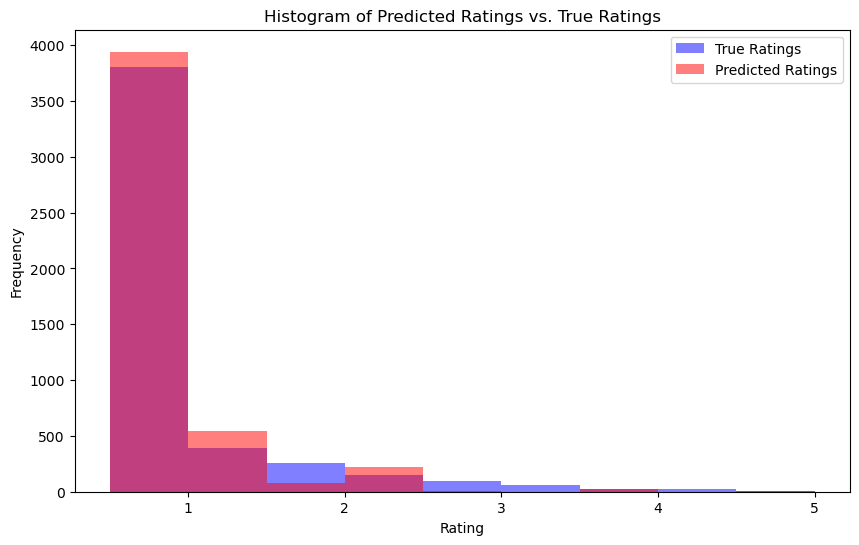

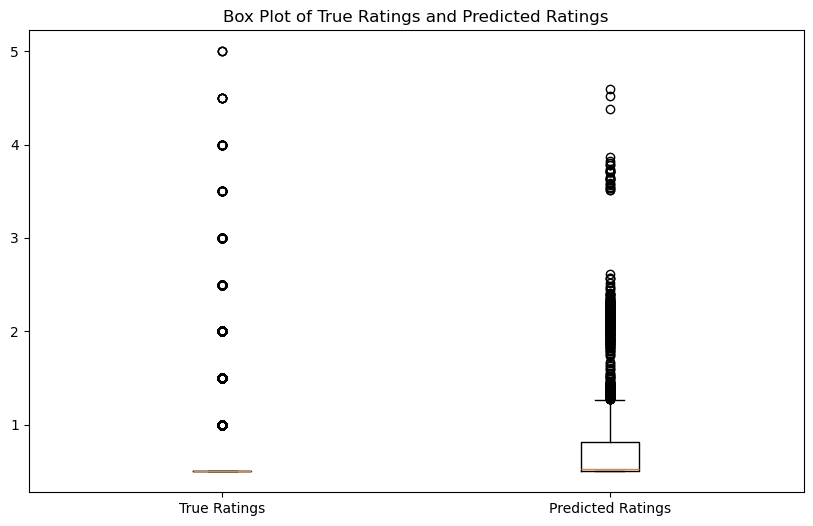

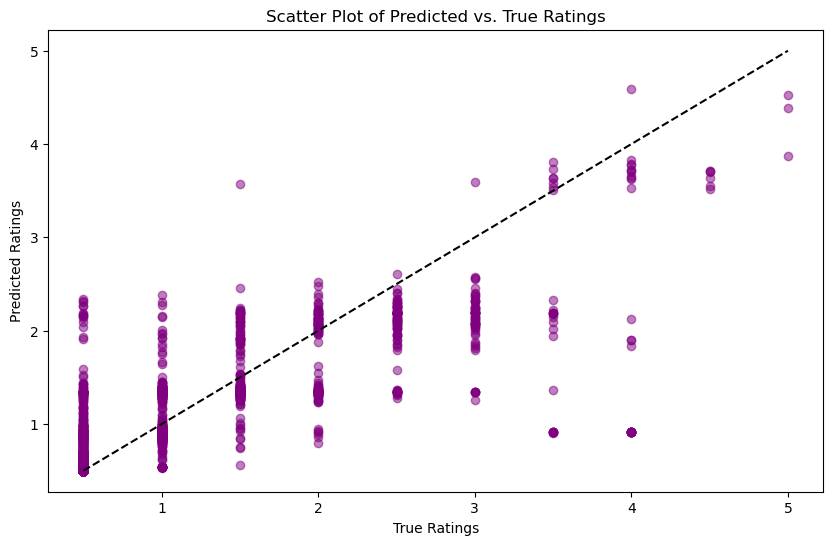

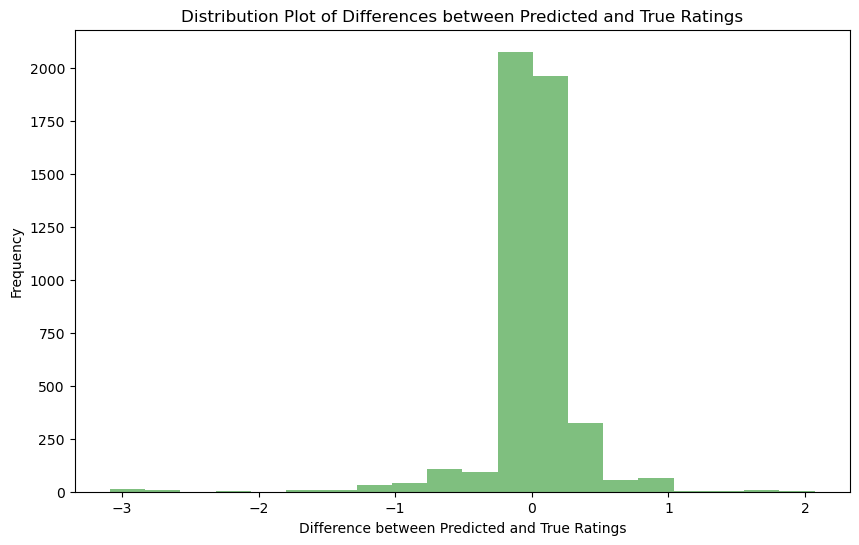

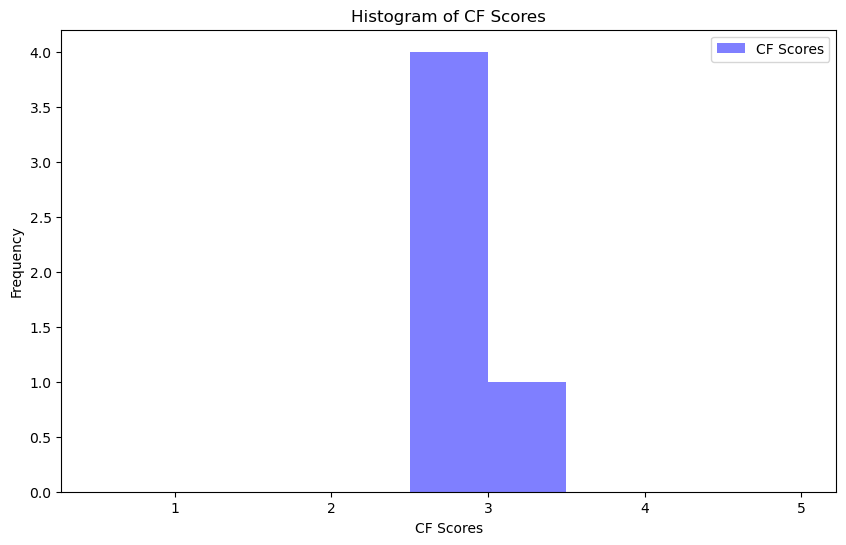

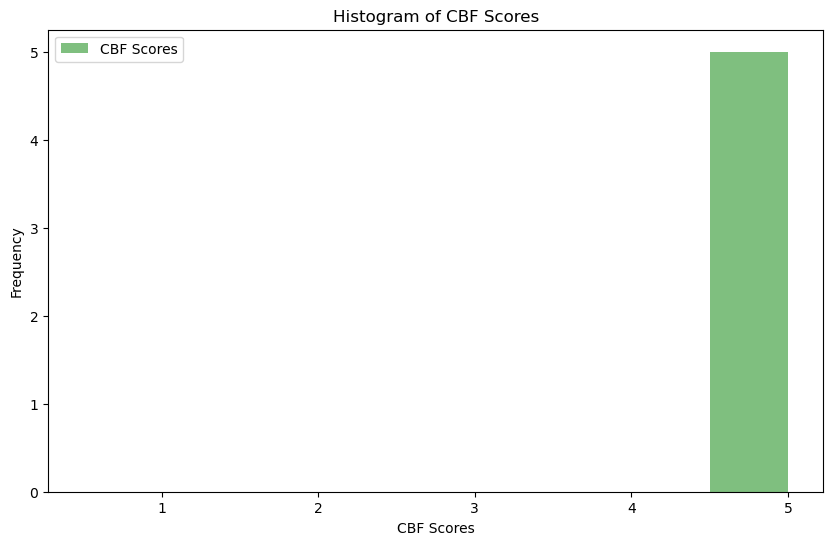

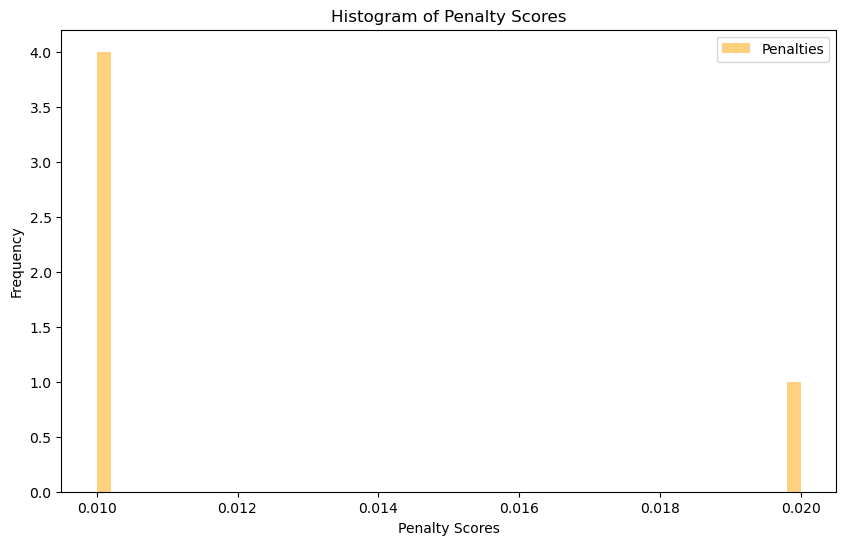

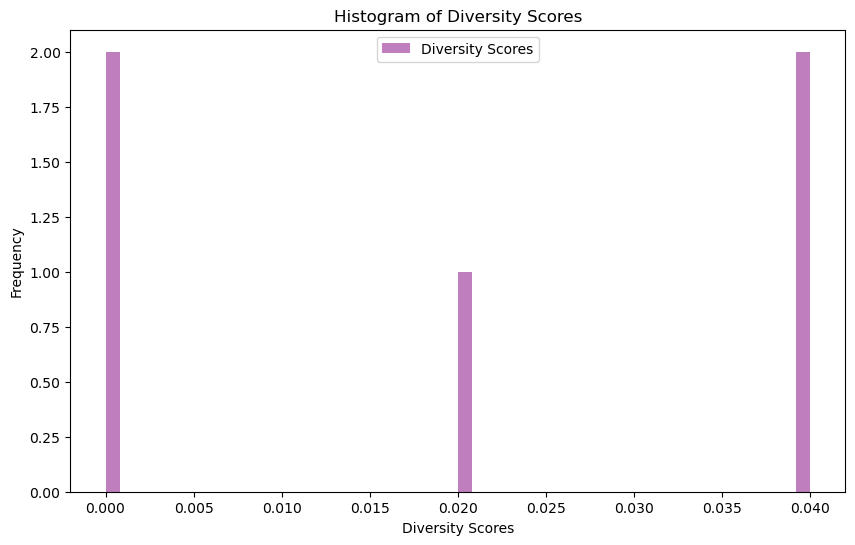

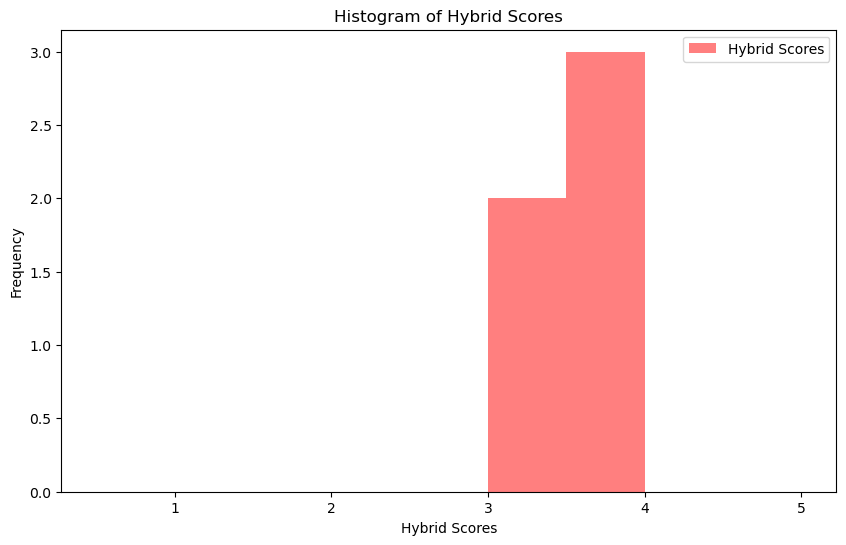

In [1]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores, min_score=0.5, max_score=5.0):
    scores = np.array(scores)
    min_value = np.min(scores)
    max_value = np.max(scores)
    if max_value != min_value:
        normalized_scores = min_score + (scores - min_value) * (max_score - min_value) / (max_value - min_value)
    else:
        normalized_scores = np.full_like(scores, min_score + (max_score - min_value) / 2)
    return normalized_scores.clip(min_score, max_score)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(np.array(cf_scores) * 5.0)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def inspect_predictions(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    min_true_rating, max_true_rating = min(true_ratings), max(true_ratings)
    min_estimated_rating, max_estimated_rating = min(estimated_ratings), max(estimated_ratings)
    
    logging.info(f"True Ratings: min={min_true_rating}, max={max_true_rating}")
    logging.info(f"Estimated Ratings: min={min_estimated_rating}, max={max_estimated_rating}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for idx, user_id in enumerate(merged_df['userId'].unique()):
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 30, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 606, Item: 6953, True Rating: 0.5, Estimated Rating: 0.5061903807042019
INFO:root:User: 606, Item: 44195, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 7, Item: 3354, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 219, Item: 1573, True Rating: 0.5, Estimated Rating: 0.5220500462685022
INFO:root:User: 219, Item: 1370, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 527, Item: 1269, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 580, Item: 6985, True Rating: 0.5, Estimated Rating: 0.509463129419473
INFO:root:User: 73, Item: 8360, True Rating: 0.5, Estimated Rating: 0.7142777295337741
INFO:root:User: 452, Item: 4262, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 332, Item: 2762, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:True ratings: [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0

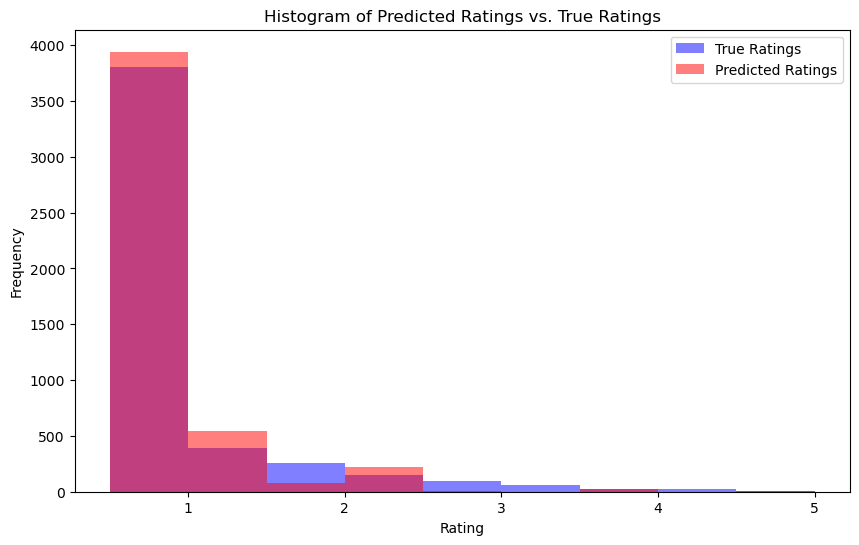

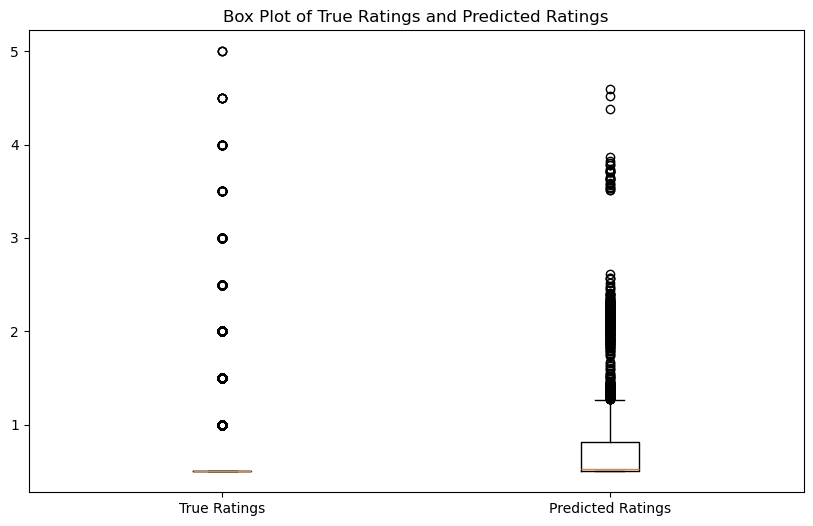

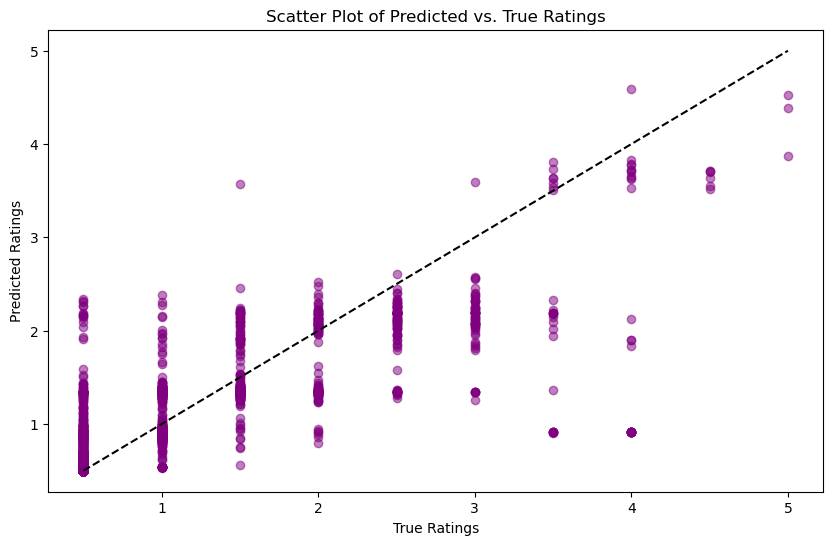

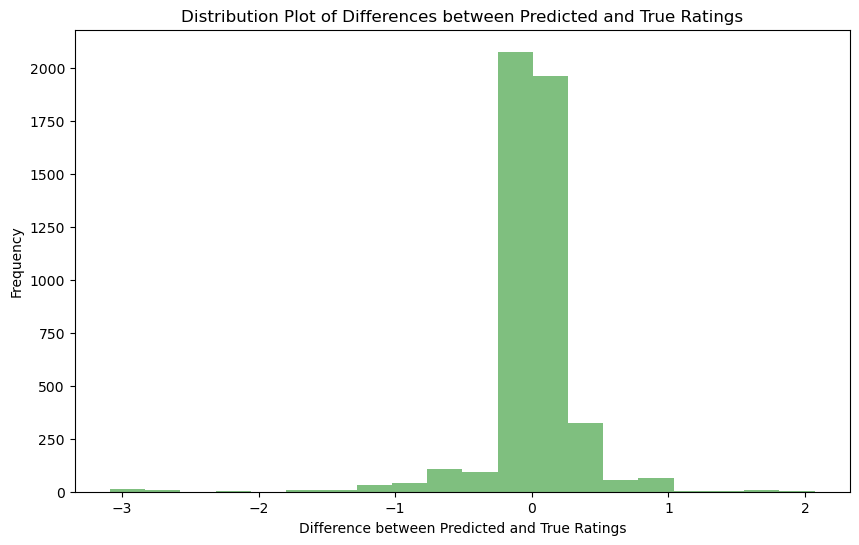

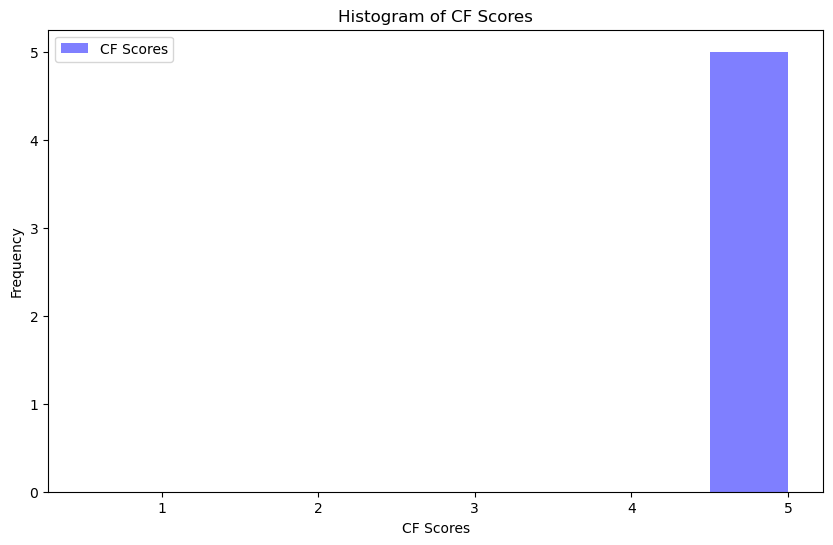

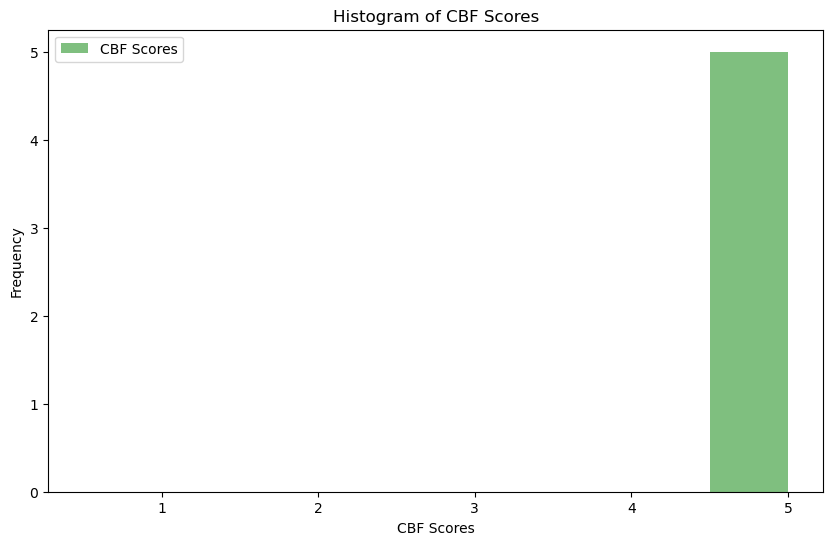

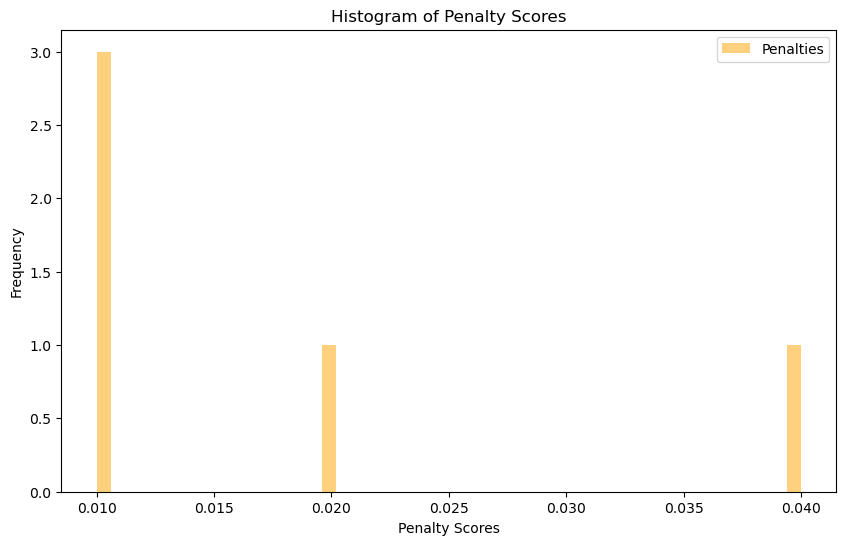

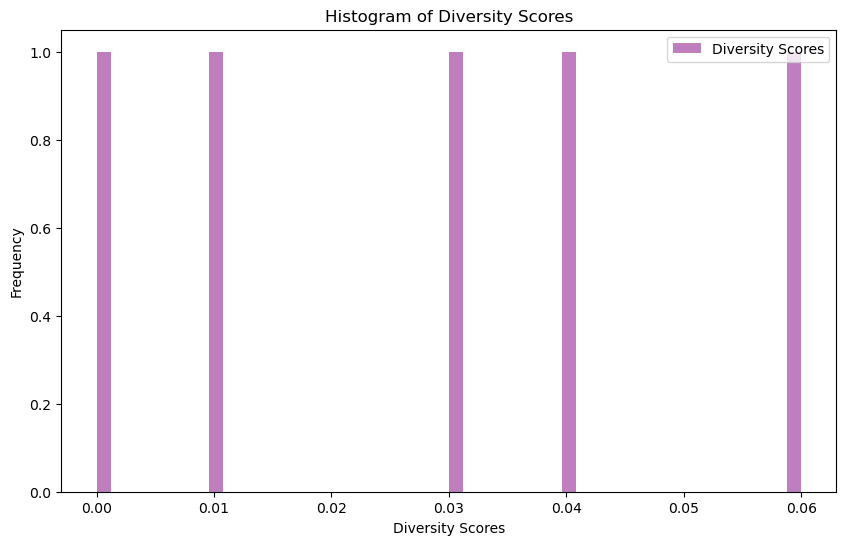

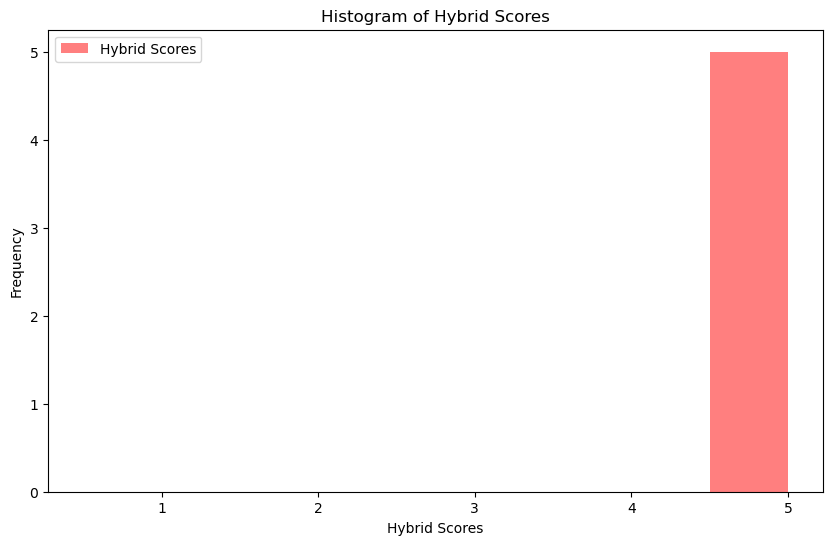

In [10]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores, min_score=0.5, max_score=5.0):
    scores = np.array(scores)
    min_value = np.min(scores)
    max_value = np.max(scores)
    if max_value != min_value:
        normalized_scores = min_score + (scores - min_value) * (max_score - min_score) / (max_value - min_value)
    else:
        normalized_scores = np.full_like(scores, min_score + (max_score - min_score) / 2)
    return normalized_scores.clip(min_score, max_score)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(np.array(cf_scores) * 5.0)
    normalized_cbf_scores = normalize_scores(cbf_scores, min_score=0.5, max_score=5.0)  # Adjusted normalization

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    # Additional logging for debugging precision and recall
    logging.info(f"True ratings: {true_ratings}")
    logging.info(f"Estimated ratings: {estimated_ratings}")

    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    logging.info(f"Binary True ratings: {y_true}")
    logging.info(f"Binary Estimated ratings: {y_pred}")

    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def inspect_predictions(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    min_true_rating, max_true_rating = min(true_ratings), max(true_ratings)
    min_estimated_rating, max_estimated_rating = min(estimated_ratings), max(estimated_ratings)
    
    logging.info(f"True Ratings: min={min_true_rating}, max={max_true_rating}")
    logging.info(f"Estimated Ratings: min={min_estimated_rating}, max={max_estimated_rating}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for idx, user_id in enumerate(merged_df['userId'].unique()):
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


In [14]:
merged_df['rating'].head()

0    0.5
1    4.0
2    4.0
3    2.0
4    2.0
Name: rating, dtype: float64

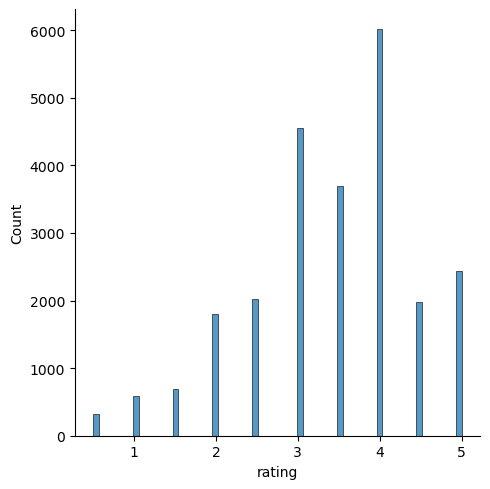

In [18]:
import seaborn as sns

sns.displot(data=merged_df, x='rating')

In [ ]:
# distributions from the plot above are no where close to the true ratings from the intial df

INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 30, 'lr_all': 0.01, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 606, Item: 6953, True Rating: 0.5, Estimated Rating: 0.5079263272078435
INFO:root:User: 606, Item: 44195, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 7, Item: 3354, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 219, Item: 1573, True Rating: 0.5, Estimated Rating: 0.5133957648809262
INFO:root:User: 219, Item: 1370, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 527, Item: 1269, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 580, Item: 6985, True Rating: 0.5, Estimated Rating: 0.5076683343982877
INFO:root:User: 73, Item: 8360, True Rating: 0.5, Estimated Rating: 0.7022853063007763
INFO:root:User: 452, Item: 4262, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 332, Item: 2762, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3399
INFO:root:MAE: 0.1

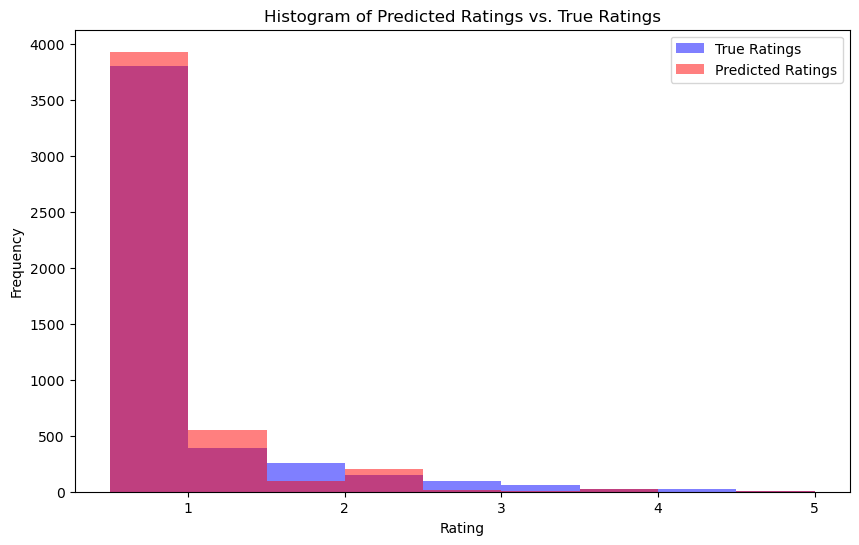

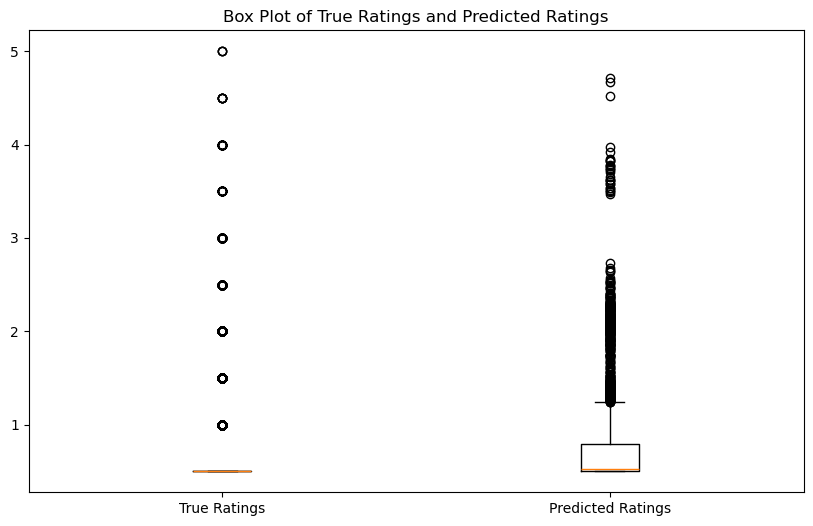

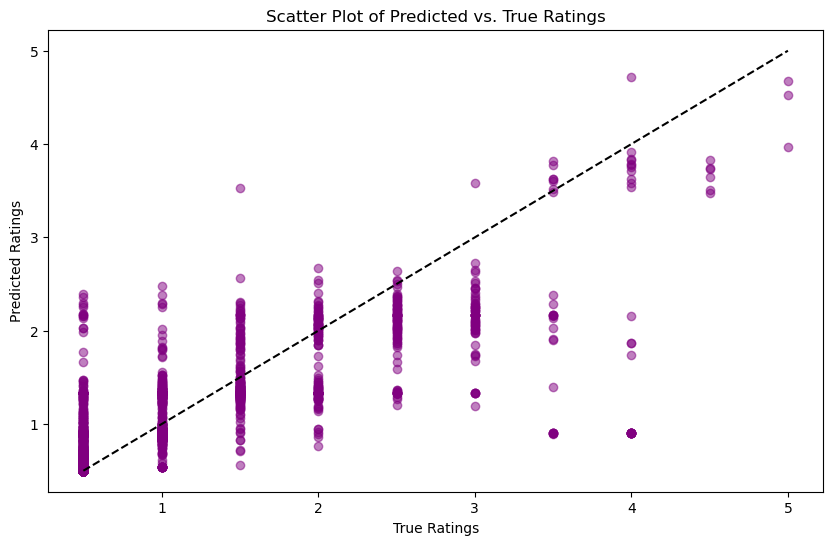

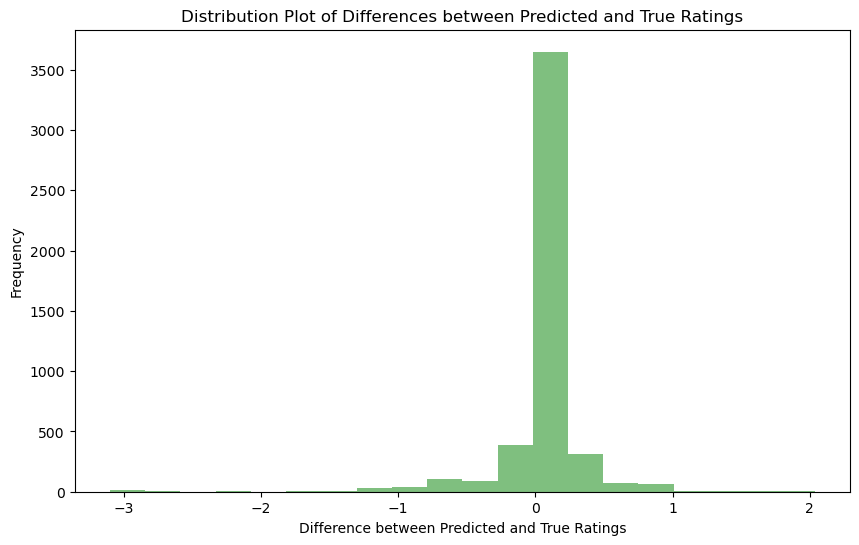

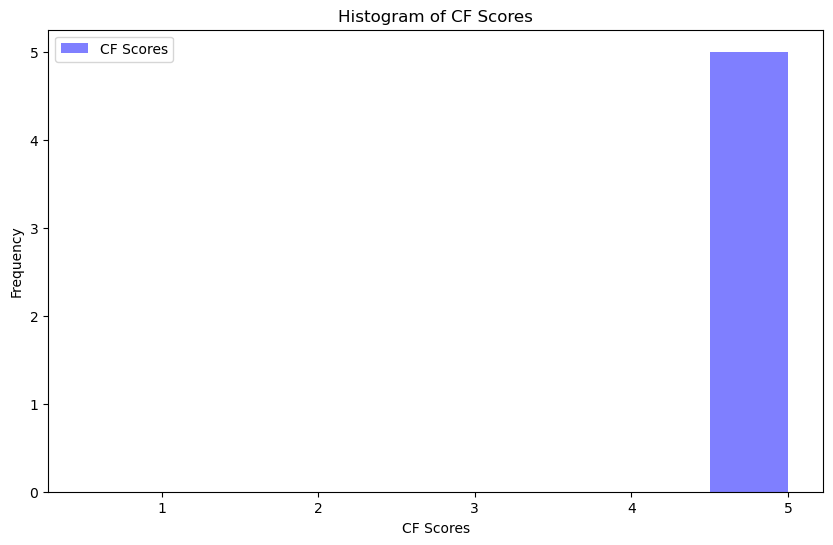

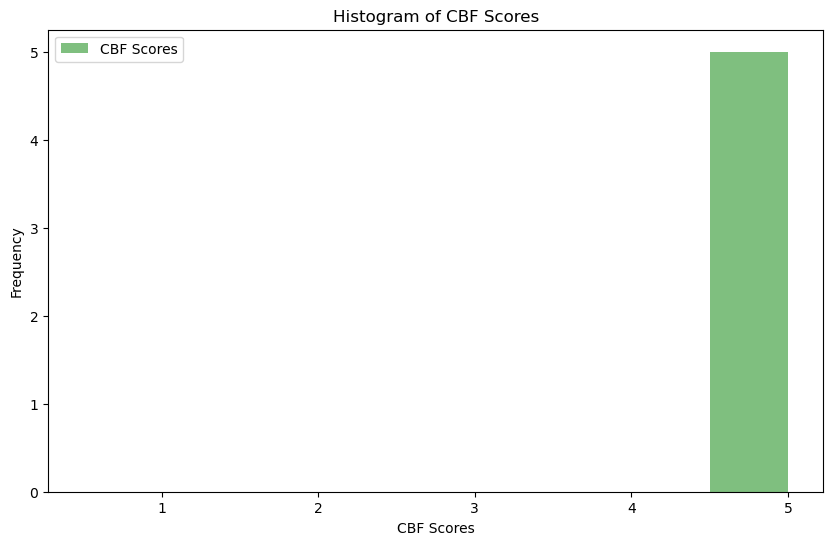

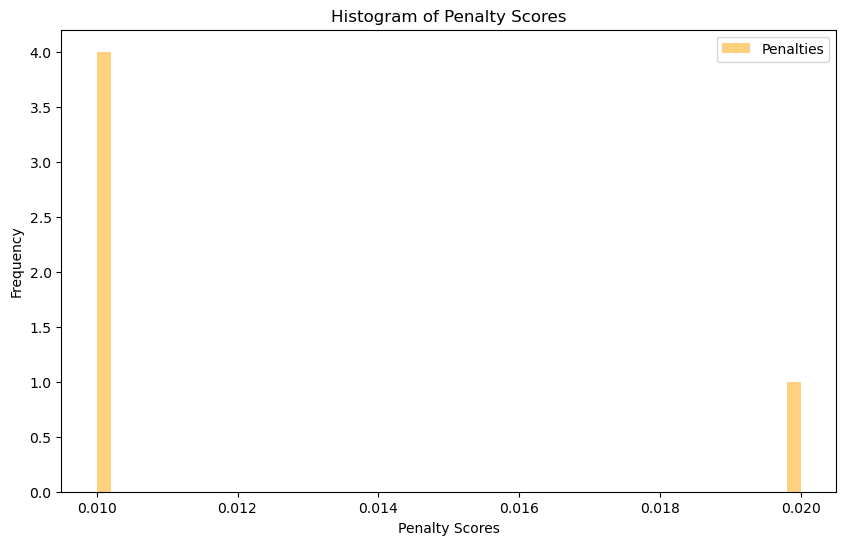

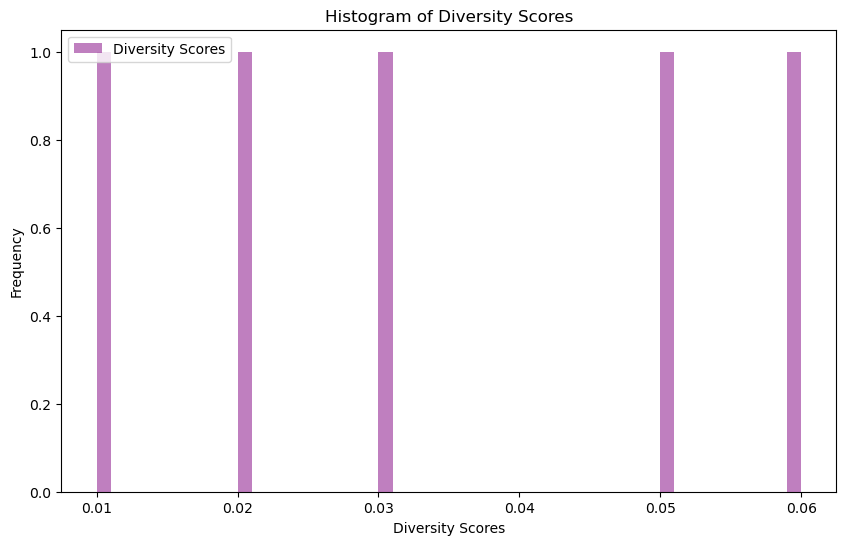

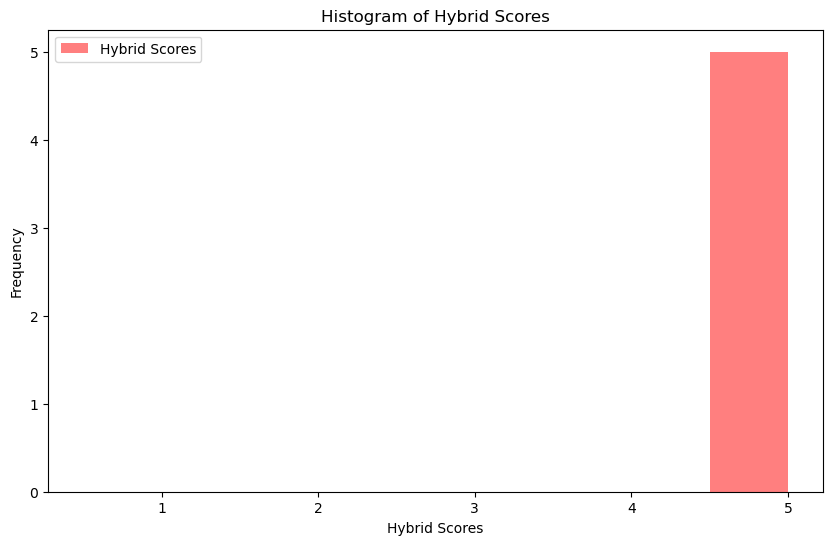

In [23]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist
import seaborn as sns

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores, min_score=0.5, max_score=5.0):
    scores = np.array(scores)
    min_value = np.min(scores)
    max_value = np.max(scores)
    if max_value != min_value:
        normalized_scores = min_score + (scores - min_value) * (max_score - min_score) / (max_value - min_value)
    else:
        normalized_scores = np.full_like(scores, min_score + (max_score - min_score) / 2)
    return normalized_scores.clip(min_score, max_score)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(np.array(cf_scores))
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def inspect_predictions(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    min_true_rating, max_true_rating = min(true_ratings), max(true_ratings)
    min_estimated_rating, max_estimated_rating = min(estimated_ratings), max(estimated_ratings)
    
    logging.info(f"True Ratings: min={min_true_rating}, max={max_true_rating}")
    logging.info(f"Estimated Ratings: min={min_estimated_rating}, max={max_estimated_rating}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for idx, user_id in enumerate(merged_df['userId'].unique()):
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.01, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 606, Item: 6953, True Rating: 0.5, Estimated Rating: 0.5087103329854287
INFO:root:User: 606, Item: 44195, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 7, Item: 3354, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 219, Item: 1573, True Rating: 0.5, Estimated Rating: 0.5175737165363291
INFO:root:User: 219, Item: 1370, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 527, Item: 1269, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 580, Item: 6985, True Rating: 0.5, Estimated Rating: 0.5084361484455047
INFO:root:User: 73, Item: 8360, True Rating: 0.5, Estimated Rating: 0.7066037522077412
INFO:root:User: 452, Item: 4262, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 332, Item: 2762, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3396
INFO:root:MAE: 0.1

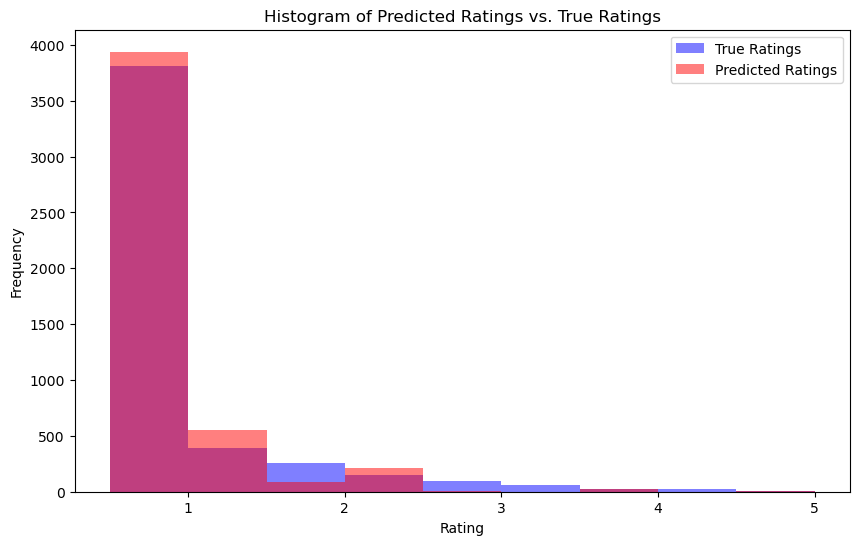

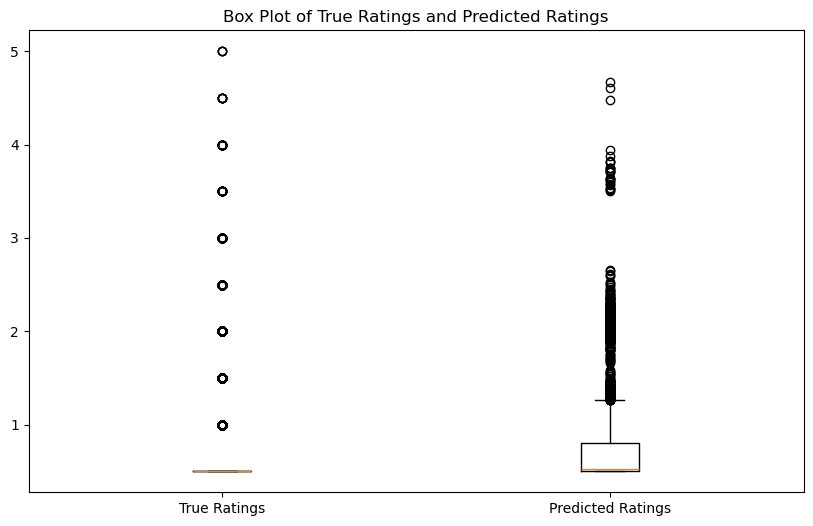

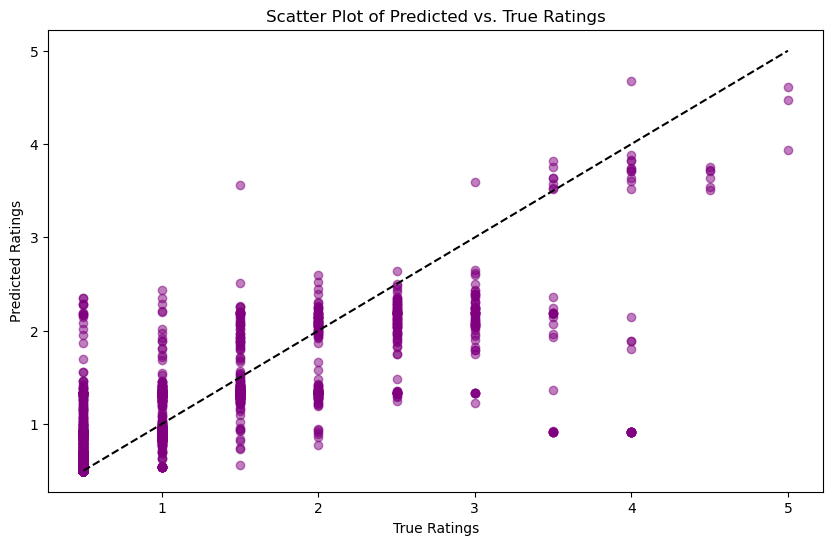

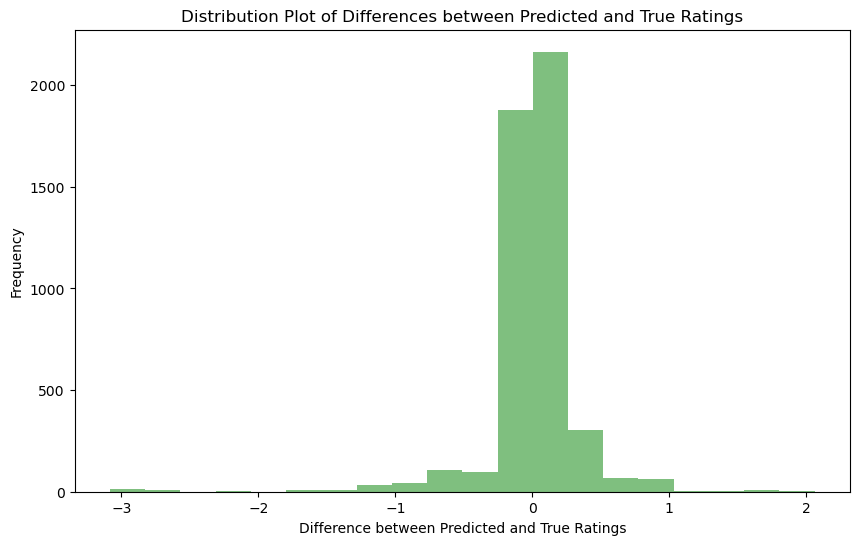

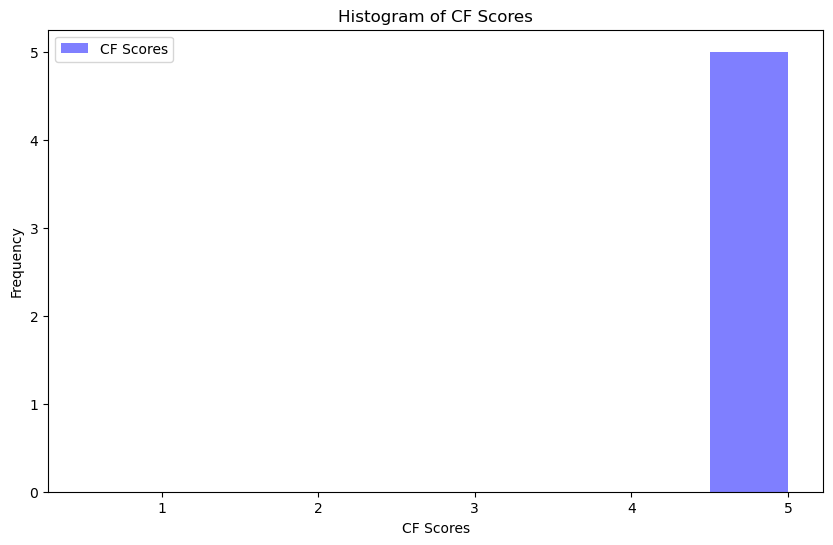

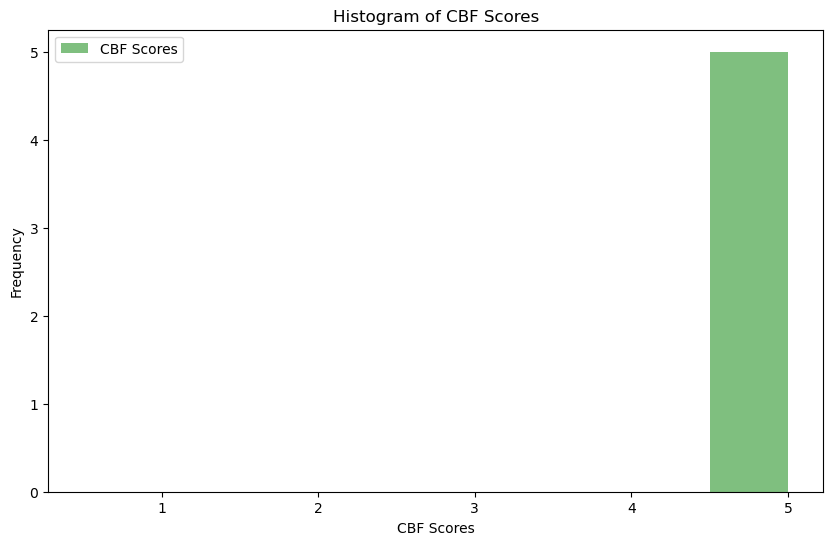

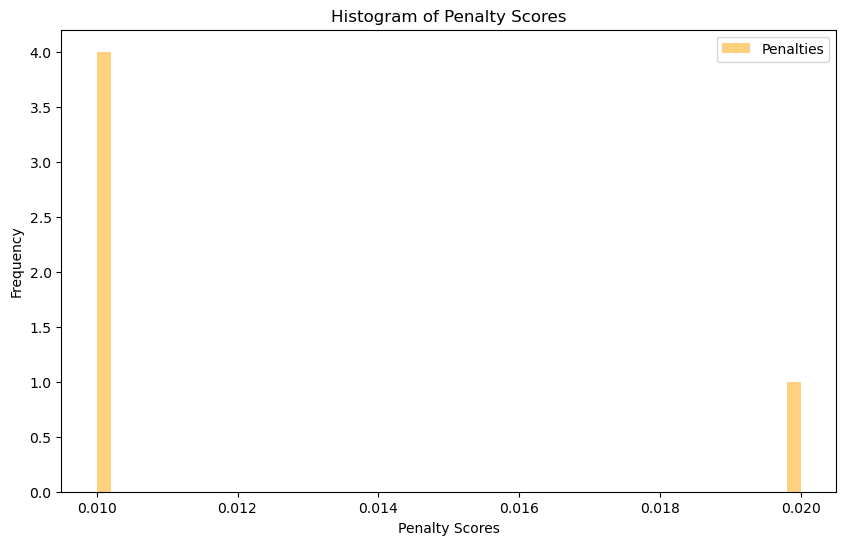

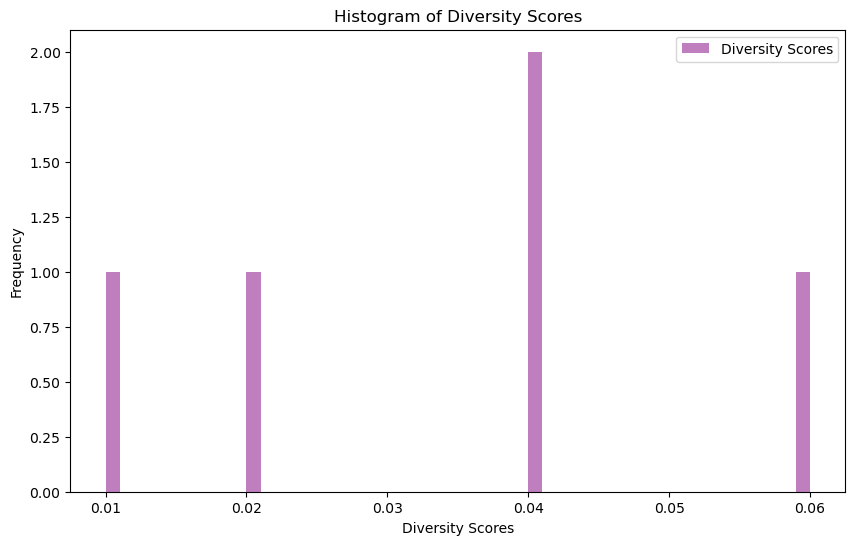

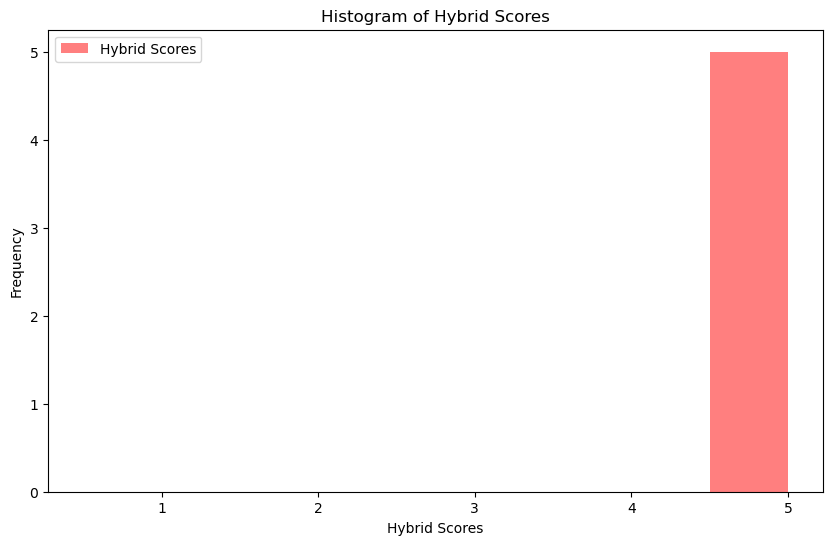

In [26]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist
import seaborn as sns

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores, min_score=0.5, max_score=5.0):
    scores = np.array(scores)
    min_value = np.min(scores)
    max_value = np.max(scores)
    if max_value != min_value:
        normalized_scores = min_score + (scores - min_value) * (max_score - min_score) / (max_value - min_value)
    else:
        normalized_scores = np.full_like(scores, min_score + (max_score - min_score) / 2)
    return normalized_scores.clip(min_score, max_score)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(np.array(cf_scores))
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def inspect_predictions(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    min_true_rating, max_true_rating = min(true_ratings), max(true_ratings)
    min_estimated_rating, max_estimated_rating = min(estimated_ratings), max(estimated_ratings)
    
    logging.info(f"True Ratings: min={min_true_rating}, max={max_true_rating}")
    logging.info(f"Estimated Ratings: min={min_estimated_rating}, max={max_estimated_rating}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for idx, user_id in enumerate(merged_df['userId'].unique()):
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 30, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3388
INFO:root:MAE: 0.1404
INFO:root:Precision: 1.0000
INFO:root:Recall: 0.0811
INFO:root:F1 Score: 0.1500
INFO:root:Item features extracted:          release_year_bucket  release_year  Horror  (no genres listed)  \
movieId                                                                  
31                  0.153226        1995.0       0                   0   
527                 0.150000        1993.0       0                   0   
647                 0.154839        1996.0       0                   0   
688                 0.153226        1995.0       0                   0   
720                 0.154839        1996.0       0                   0   

         Comedy  Thriller  Musical  Sci-Fi  War  Adventure  ...  IMAX  \
movieId                                                     ...         
31 

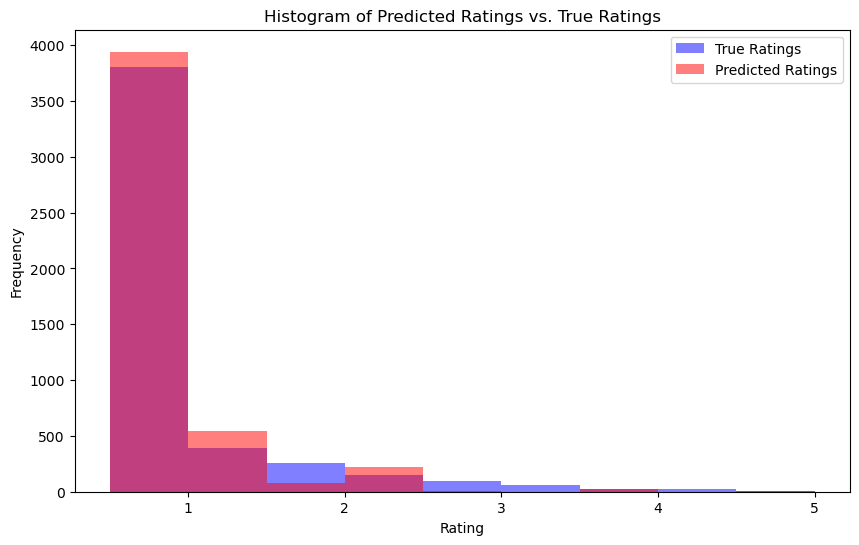

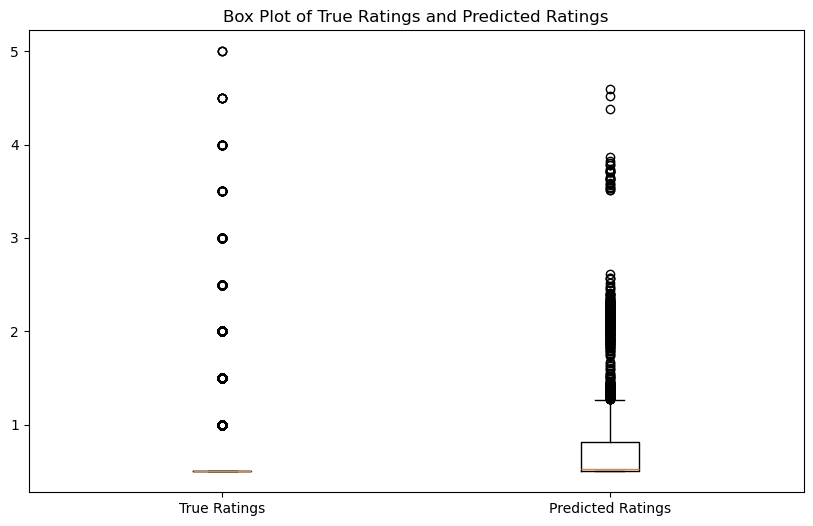

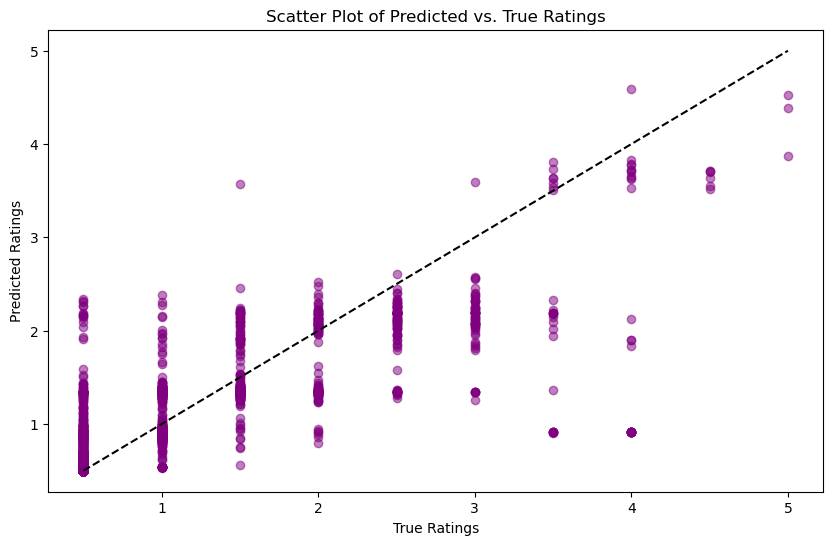

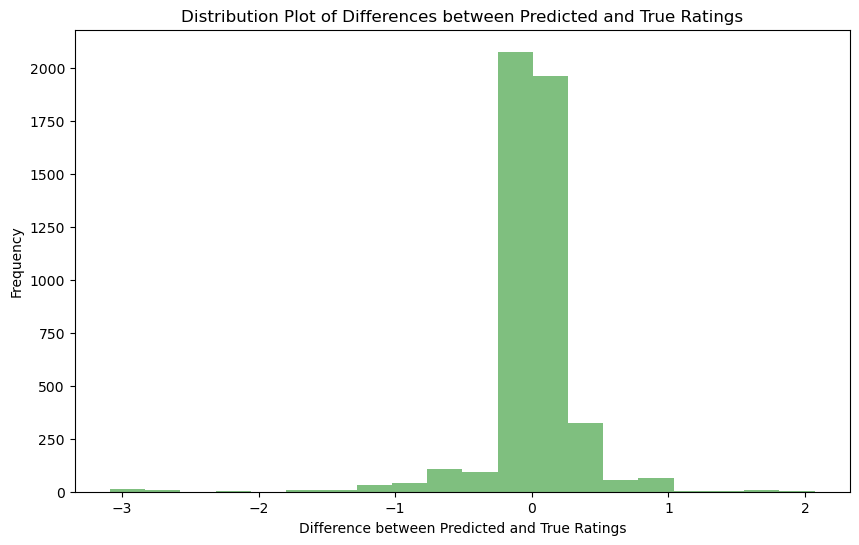

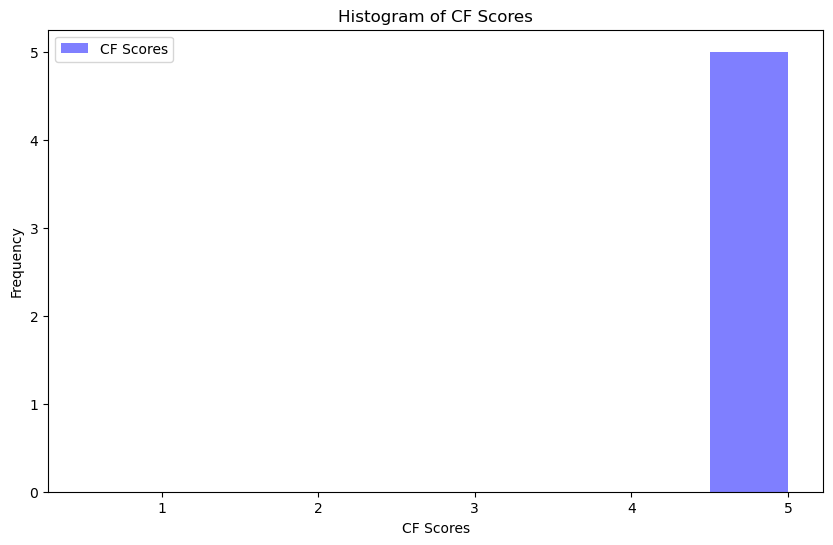

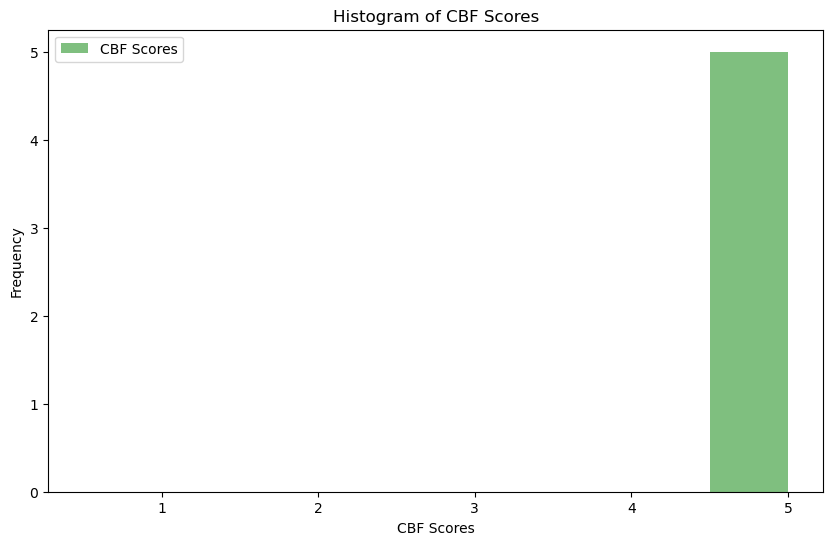

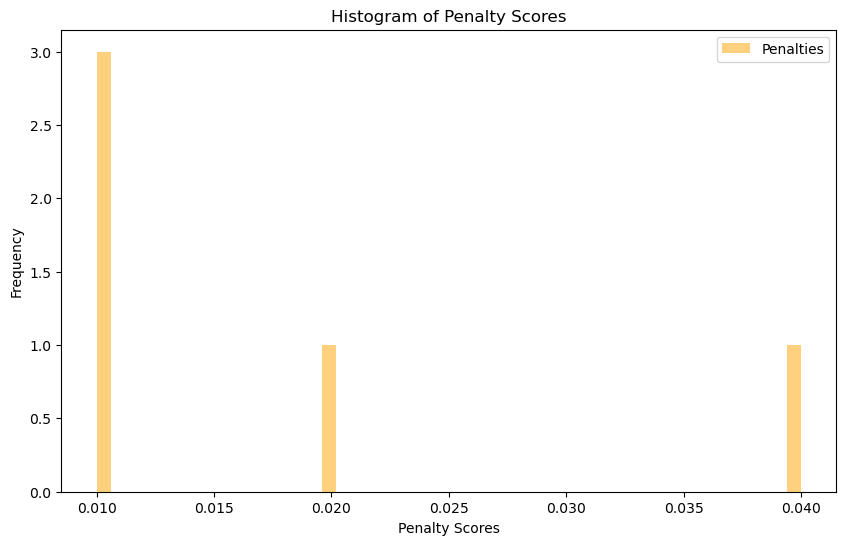

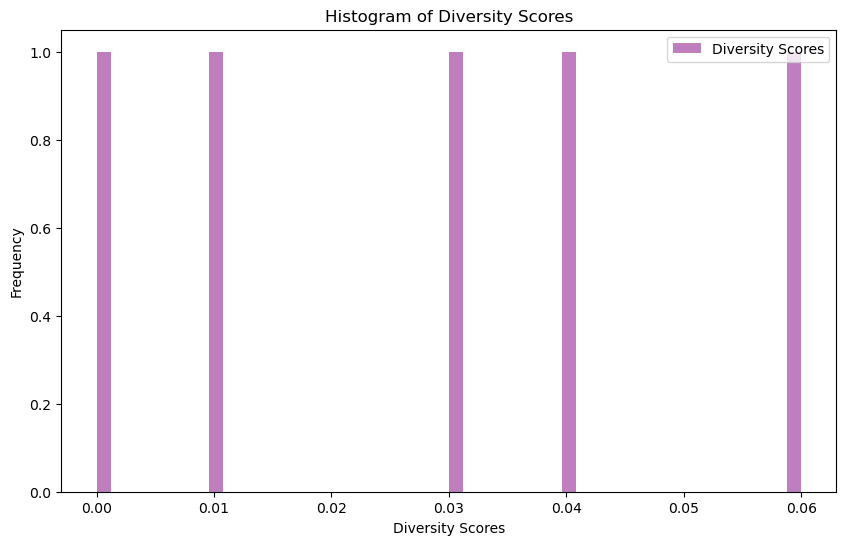

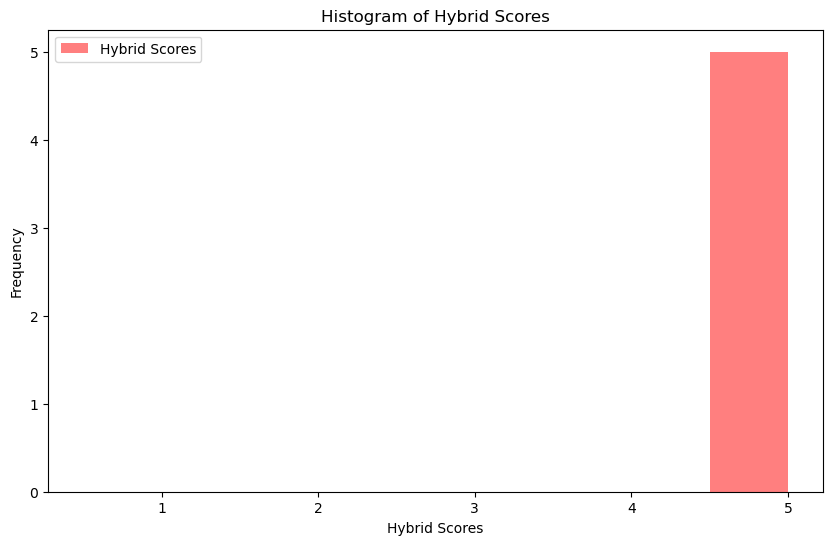

In [28]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist
import seaborn as sns

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores, min_score=0.5, max_score=5.0):
    scores = np.array(scores)
    min_value = np.min(scores)
    max_value = np.max(scores)
    if max_value != min_value:
        normalized_scores = min_score + (scores - min_value) * (max_score - min_score) / (max_value - min_value)
    else:
        normalized_scores = np.full_like(scores, min_score + (max_score - min_score) / 2)
    return normalized_scores.clip(min_score, max_score)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(np.array(cf_scores))
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def inspect_predictions(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    min_true_rating, max_true_rating = min(true_ratings), max(true_ratings)
    min_estimated_rating, max_estimated_rating = min(estimated_ratings), max(estimated_ratings)
    
    logging.info(f"True Ratings: min={min_true_rating}, max={max_true_rating}")
    logging.info(f"Estimated Ratings: min={min_estimated_rating}, max={max_estimated_rating}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for idx, user_id in enumerate(merged_df['userId'].unique()):
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3972
INFO:root:MAE: 0.2059
INFO:root:Precision: 0.0000
INFO:root:Recall: 0.0000
INFO:root:F1 Score: 0.0000
INFO:root:Item features extracted:          release_year_bucket  release_year  Horror  (no genres listed)  \
movieId                                                                  
31                  0.153226        1995.0       0                   0   
527                 0.150000        1993.0       0                   0   
647                 0.154839        1996.0       0                   0   
688                 0.153226        1995.0       0                   0   
720                 0.154839        1996.0       0                   0   

         Comedy  Thriller  Musical  Sci-Fi  War  Adventure  ...  IMAX  \
movieId                                                     ...         
31 

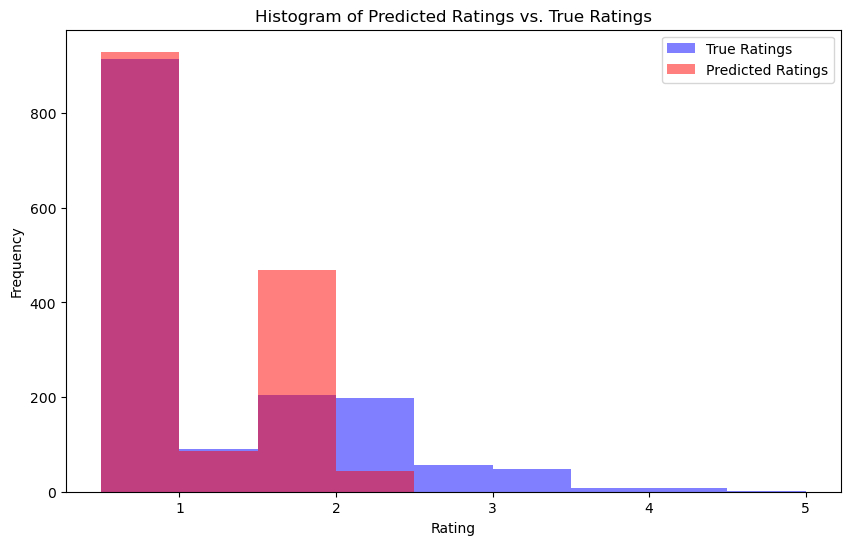

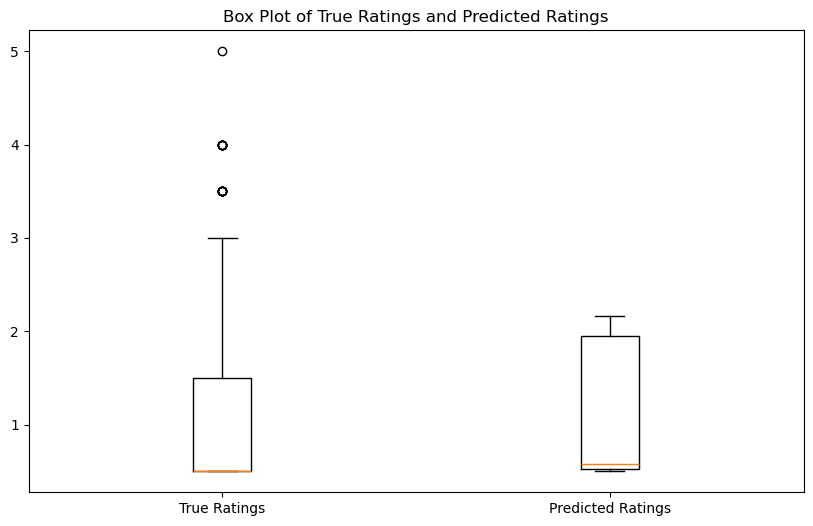

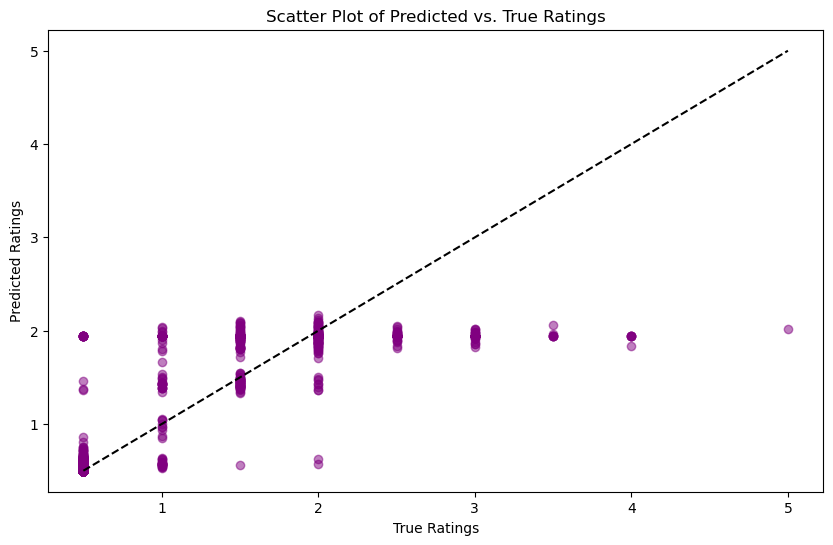

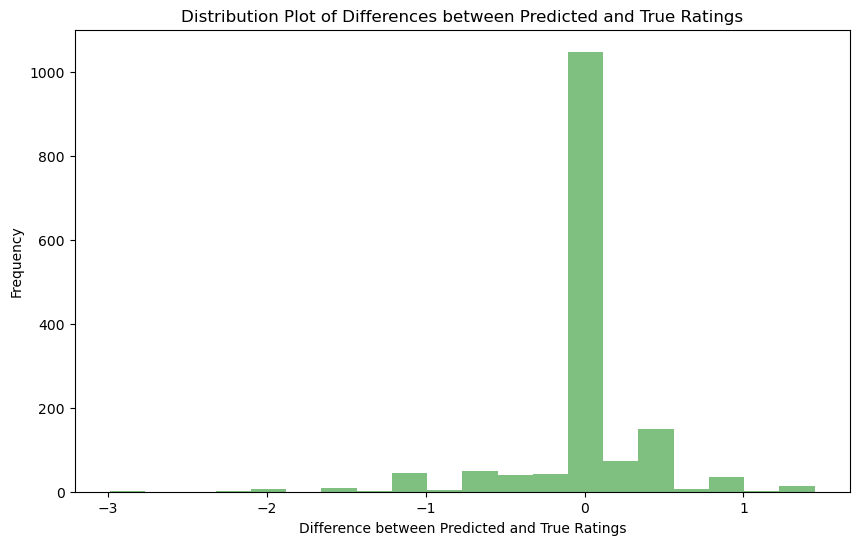

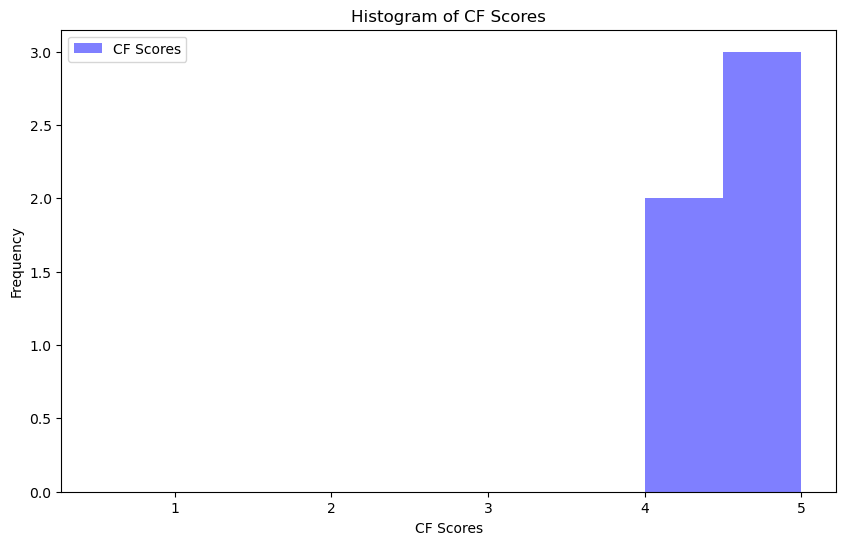

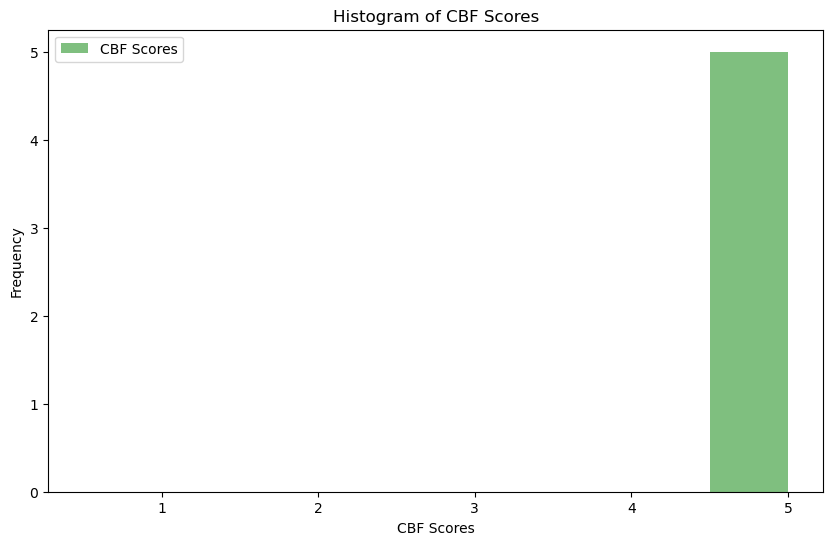

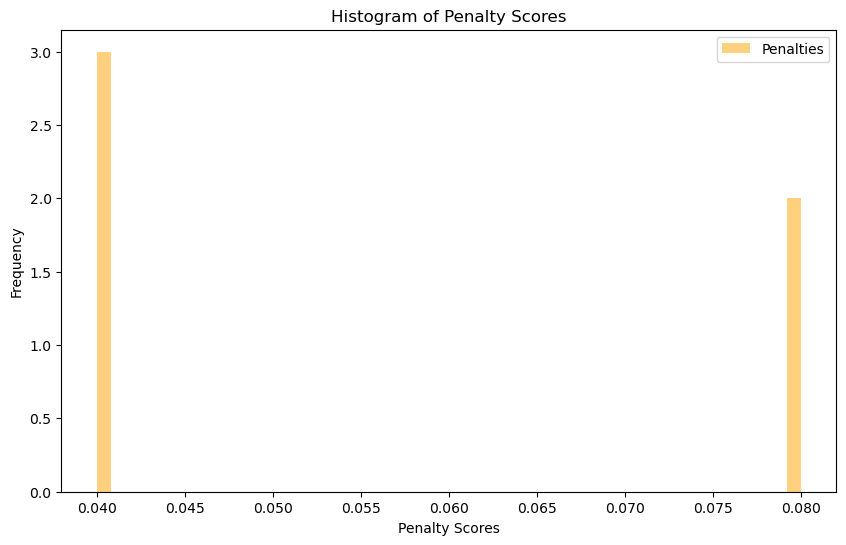

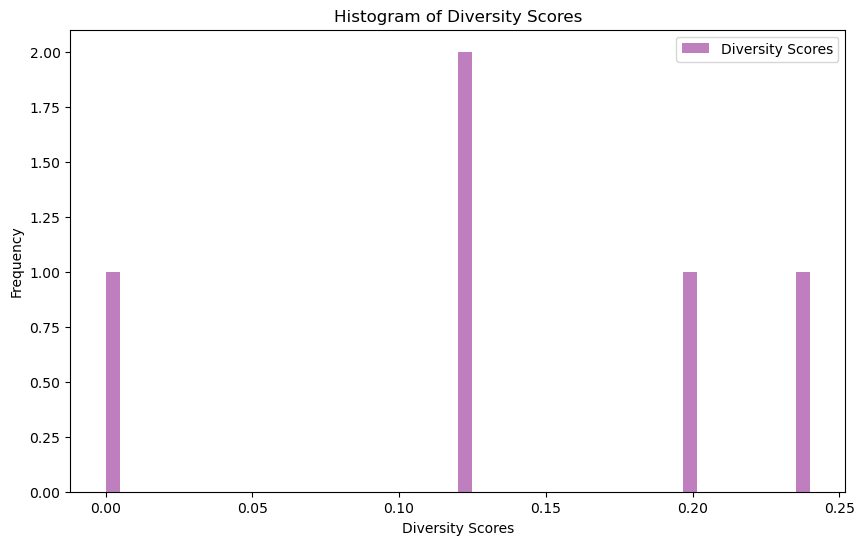

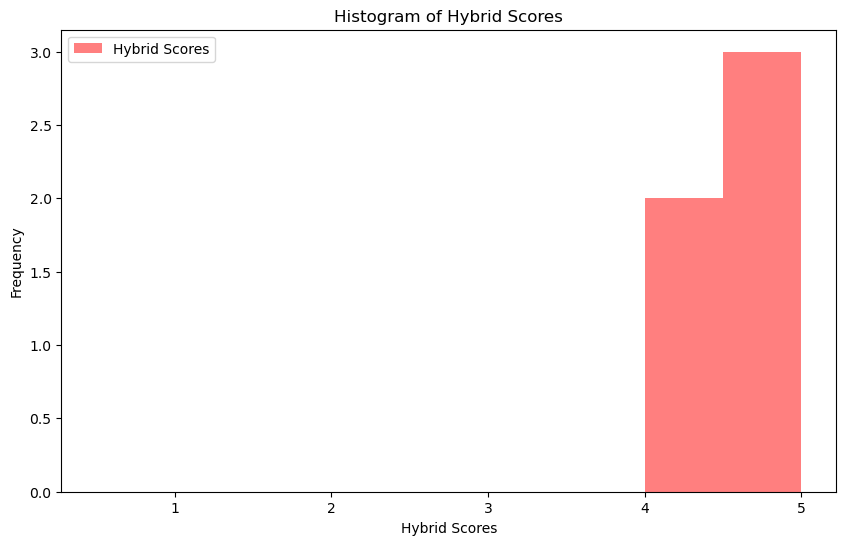

In [30]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 25  # Temporarily lowered to 25

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores, min_score=0.5, max_score=5.0):
    scores = np.array(scores)
    min_value = np.min(scores)
    max_value = np.max(scores)
    if max_value != min_value:
        normalized_scores = min_score + (scores - min_value) * (max_score - min_score) / (max_value - min_value)
    else:
        normalized_scores = np.full_like(scores, min_score + (max_score - min_score) / 2)
    return normalized_scores.clip(min_score, max_score)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(np.array(cf_scores))
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def inspect_predictions(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    min_true_rating, max_true_rating = min(true_ratings), max(true_ratings)
    min_estimated_rating, max_estimated_rating = min(estimated_ratings), max(estimated_ratings)
    
    logging.info(f"True Ratings: min={min_true_rating}, max={max_true_rating}")
    logging.info(f"Estimated Ratings: min={min_estimated_rating}, max={max_estimated_rating}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for idx, user_id in enumerate(merged_df['userId'].unique()):
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3972
INFO:root:MAE: 0.2059
INFO:root:Precision: 0.0000
INFO:root:Recall: 0.0000
INFO:root:F1 Score: 0.0000
INFO:root:Item features extracted:          release_year_bucket  release_year  Horror  (no genres listed)  \
movieId                                                                  
31                  0.153226        1995.0       0                   0   
527                 0.150000        1993.0       0                   0   
647                 0.154839        1996.0       0                   0   
688                 0.153226        1995.0       0                   0   
720                 0.154839        1996.0       0                   0   

         Comedy  Thriller  Musical  Sci-Fi  War  Adventure  ...  IMAX  \
movieId                                                     ...         
31 

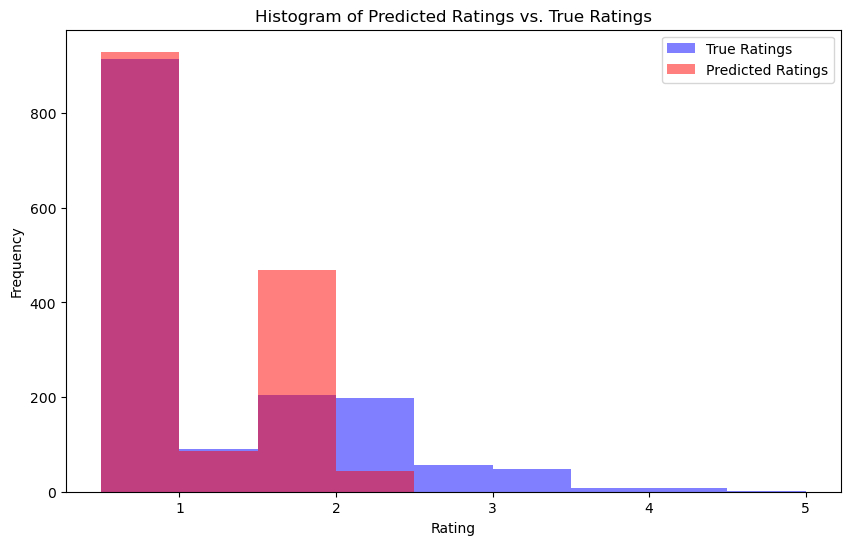

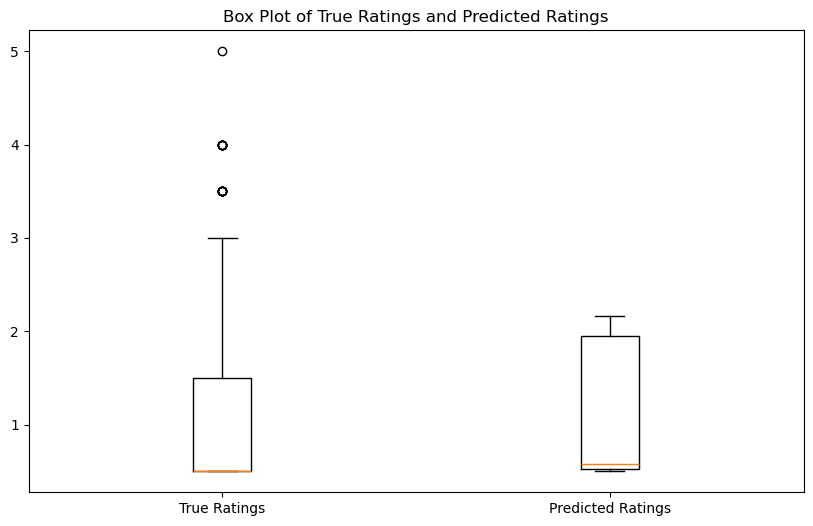

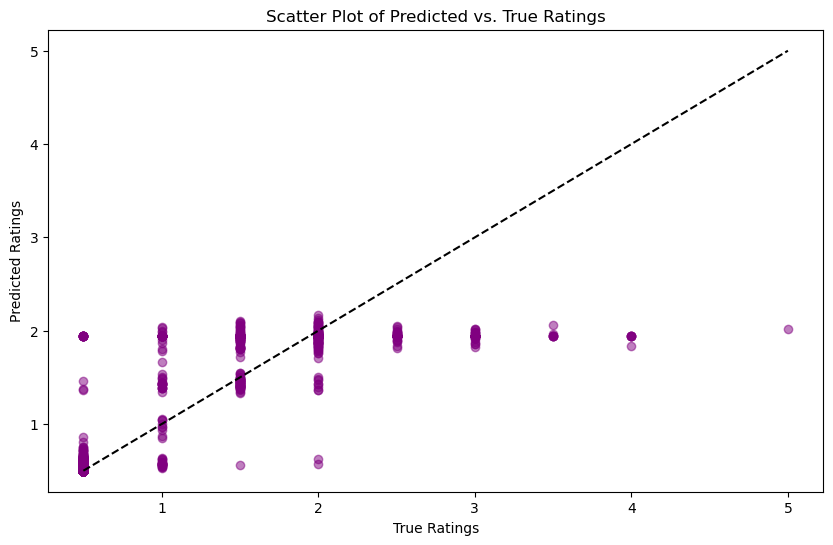

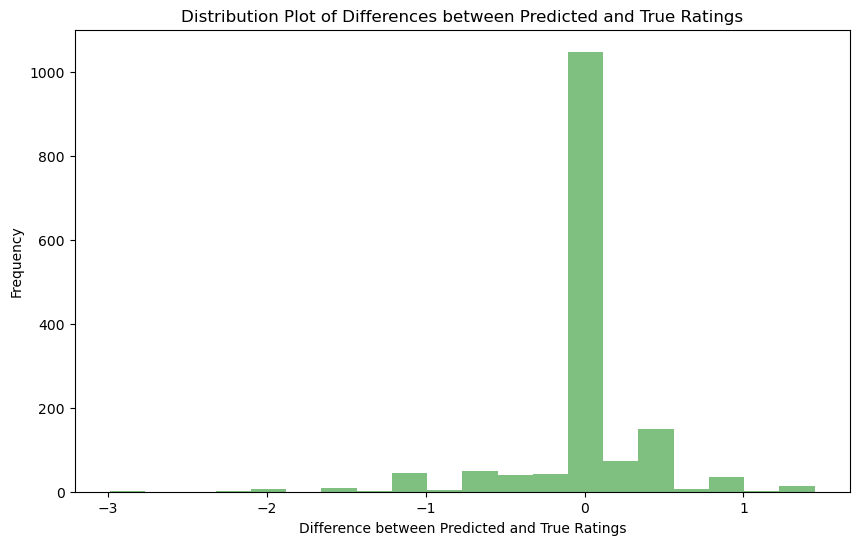

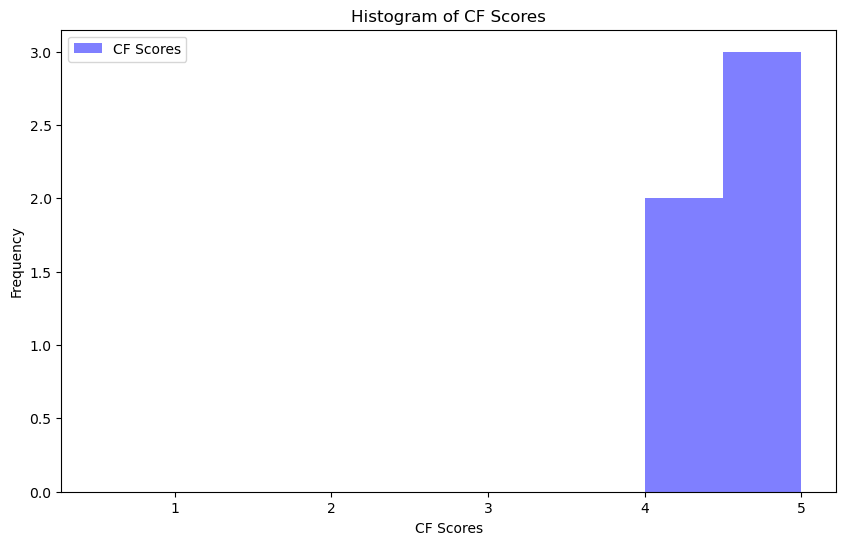

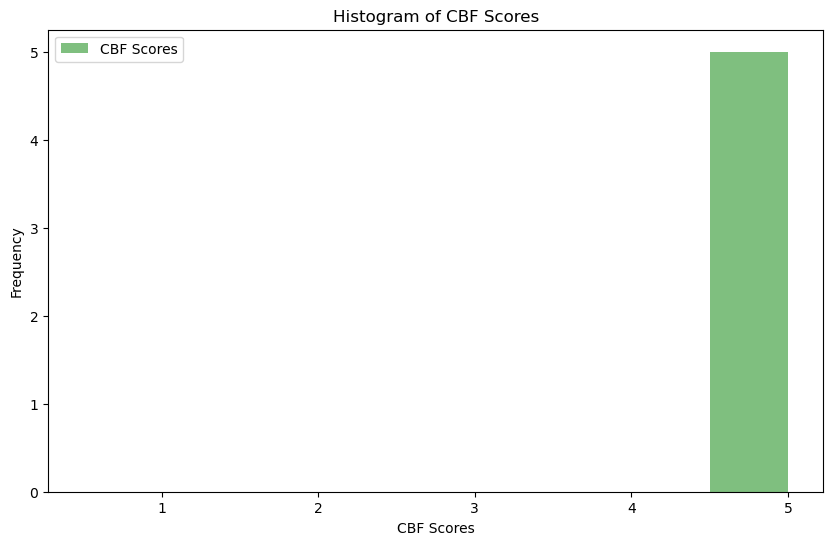

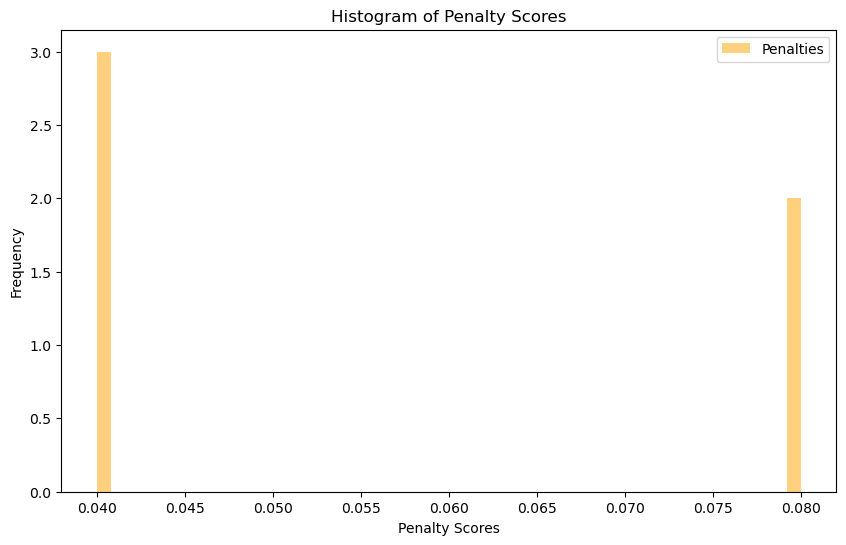

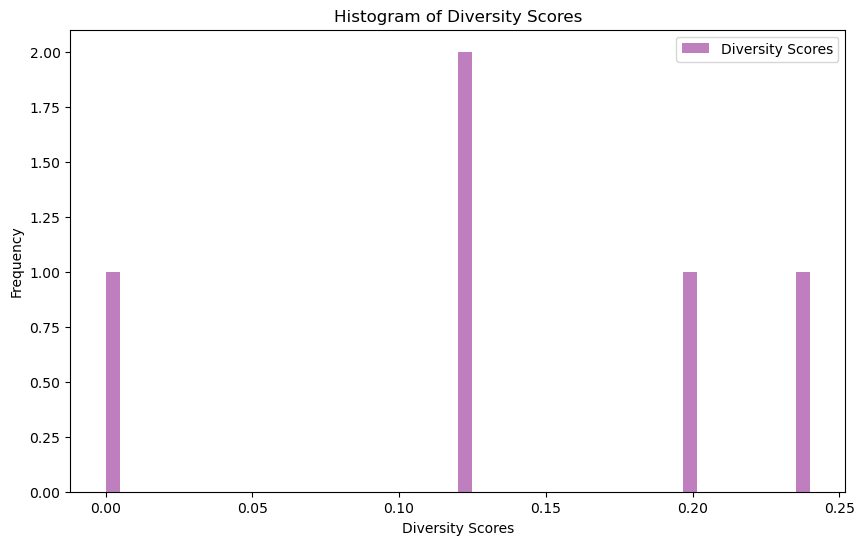

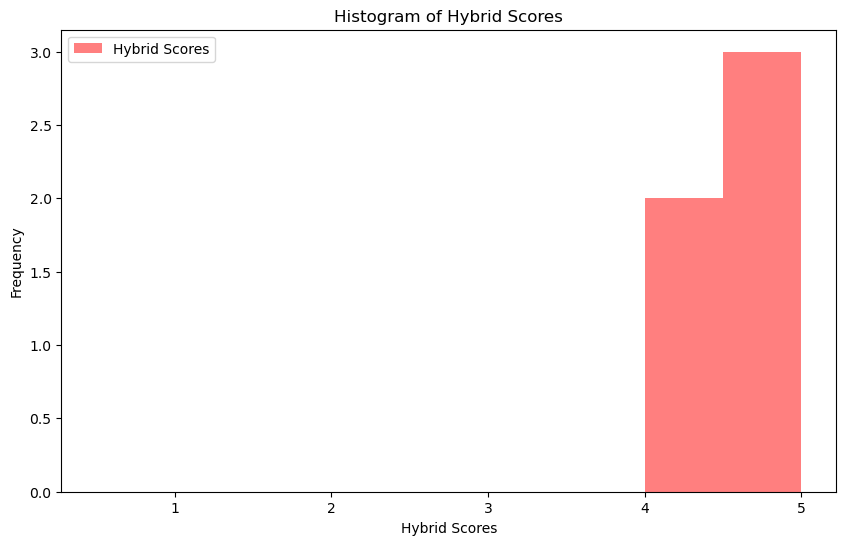

In [32]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 25  # Temporarily lowered to 25

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores, min_score=0.5, max_score=5.0):
    scores = np.array(scores)
    min_value = np.min(scores)
    max_value = np.max(scores)
    if max_value != min_value:
        normalized_scores = min_score + (scores - min_value) * (max_score - min_score) / (max_value - min_value)
    else:
        normalized_scores = np.full_like(scores, min_score + (max_score - min_score) / 2)
    return normalized_scores.clip(min_score, max_score)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(np.array(cf_scores))
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def inspect_predictions(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    min_true_rating, max_true_rating = min(true_ratings), max(true_ratings)
    min_estimated_rating, max_estimated_rating = min(estimated_ratings), max(estimated_ratings)
    
    logging.info(f"True Ratings: min={min_true_rating}, max={max_true_rating}")
    logging.info(f"Estimated Ratings: min={min_estimated_rating}, max={max_estimated_rating}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for idx, user_id in enumerate(merged_df['userId'].unique()):
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3972
INFO:root:MAE: 0.2059
INFO:root:Precision: 0.0000
INFO:root:Recall: 0.0000
INFO:root:F1 Score: 0.0000
INFO:root:Item features extracted:          release_year_bucket  release_year  Horror  (no genres listed)  \
movieId                                                                  
31                  0.153226        1995.0       0                   0   
527                 0.150000        1993.0       0                   0   
647                 0.154839        1996.0       0                   0   
688                 0.153226        1995.0       0                   0   
720                 0.154839        1996.0       0                   0   

         Comedy  Thriller  Musical  Sci-Fi  War  Adventure  ...  IMAX  \
movieId                                                     ...         
31 

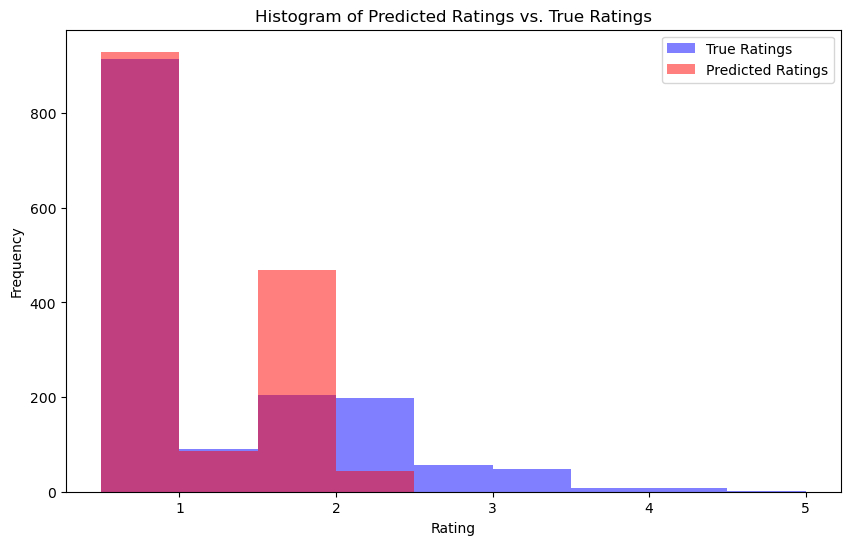

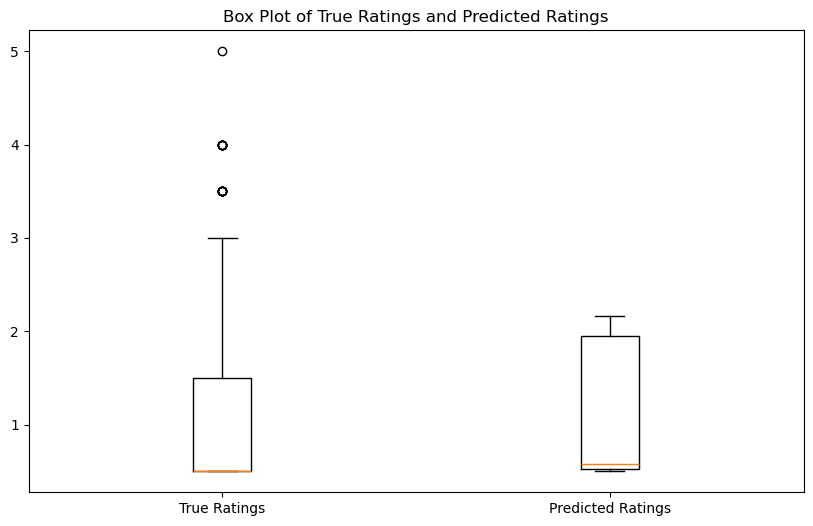

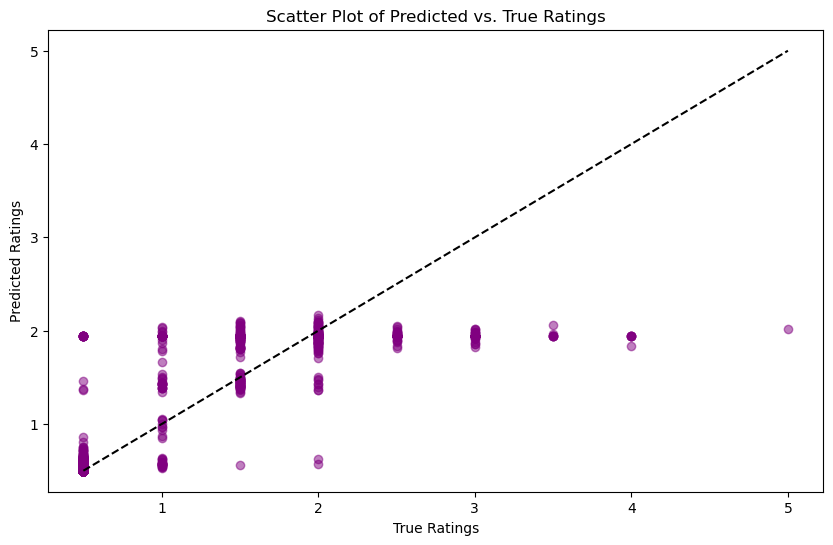

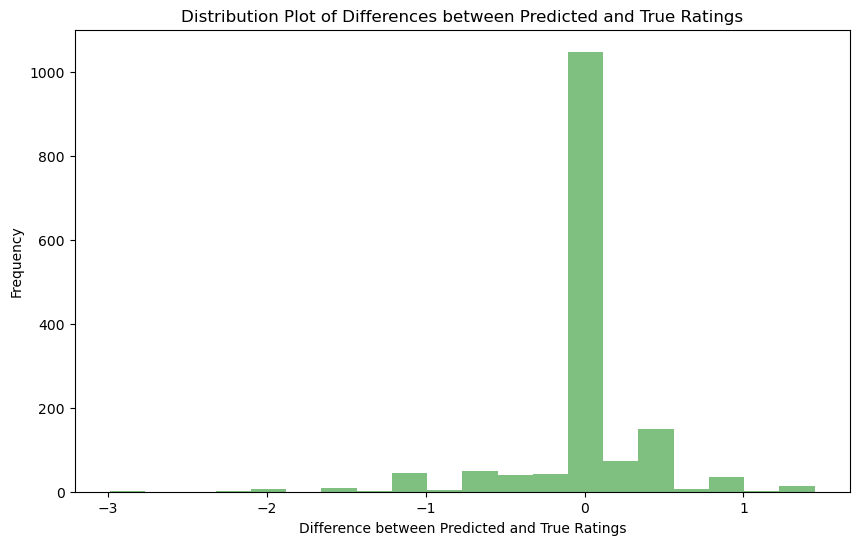

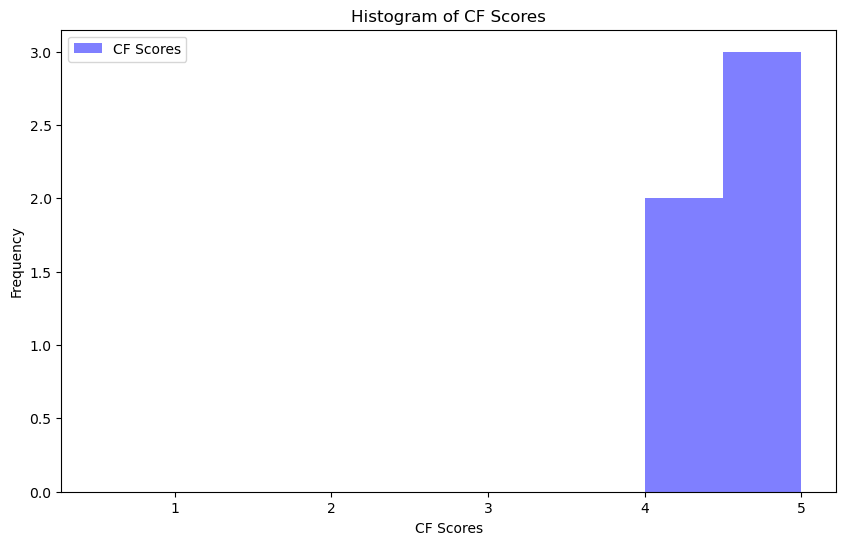

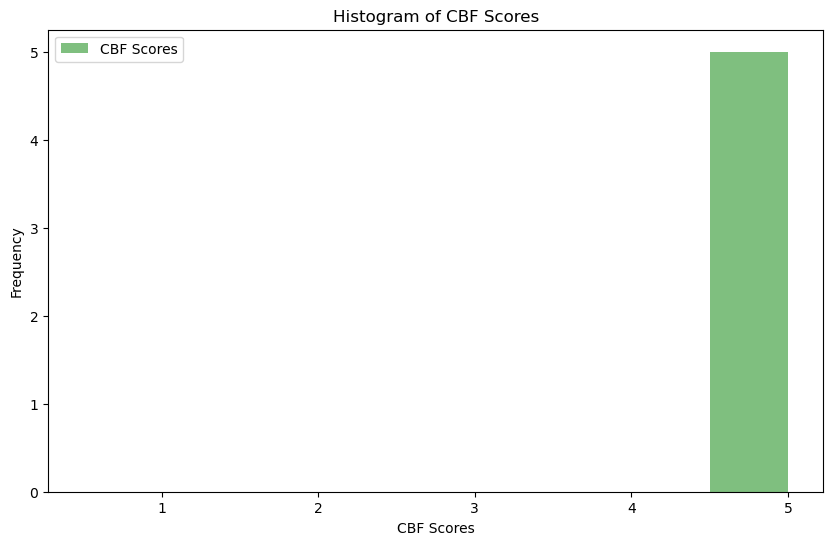

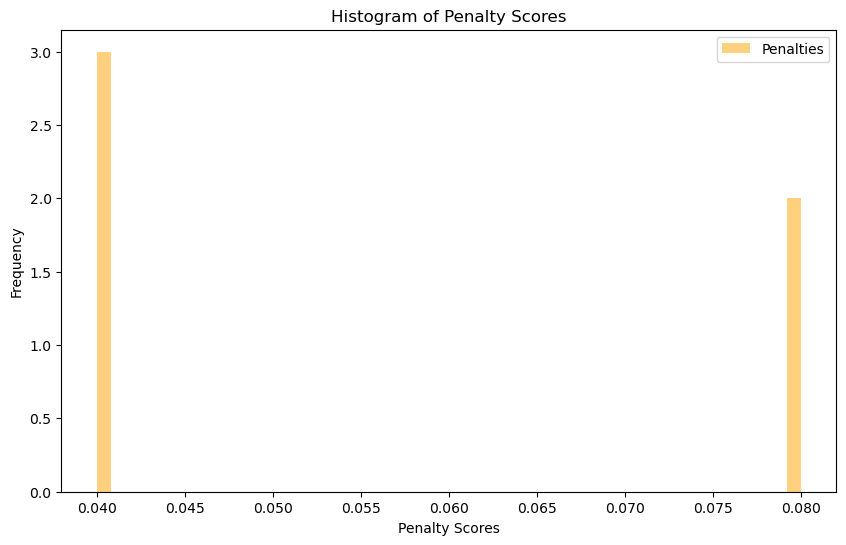

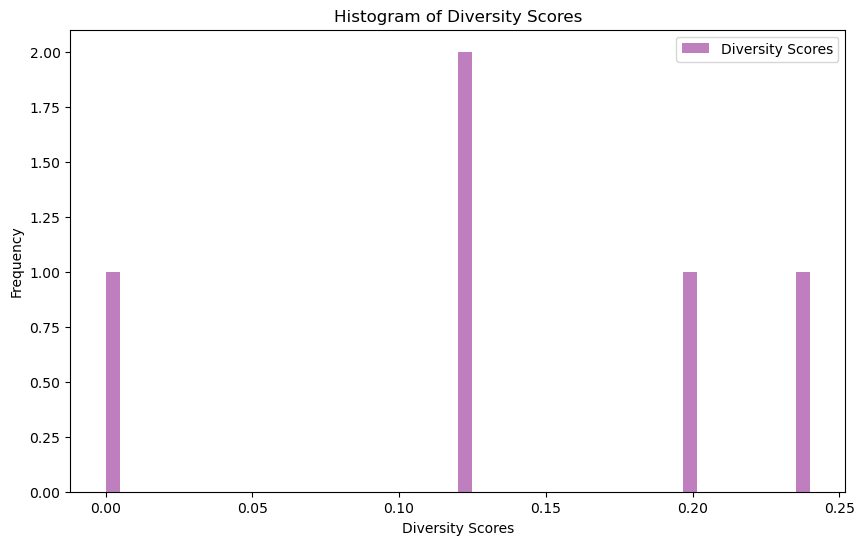

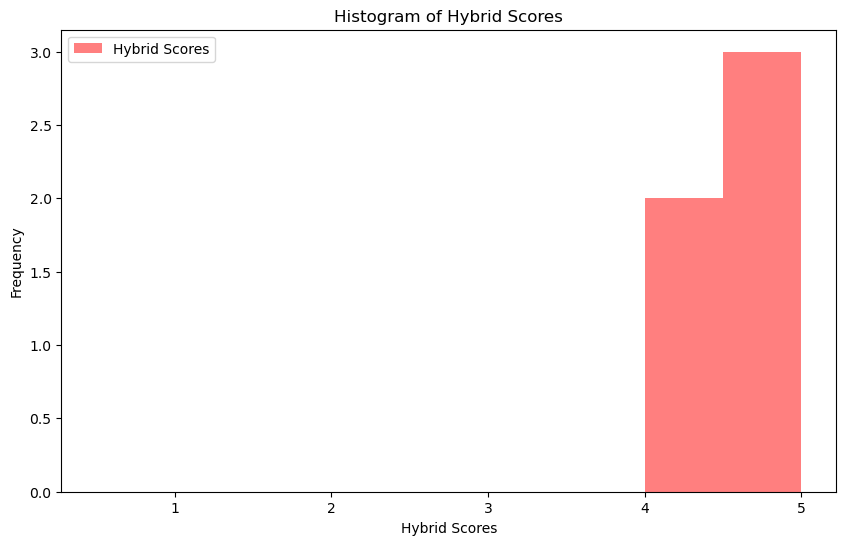

In [34]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 25  # Temporarily lowered to 25

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores, min_score=0.5, max_score=5.0):
    scores = np.array(scores)
    min_value = np.min(scores)
    max_value = np.max(scores)
    if max_value != min_value:
        normalized_scores = min_score + (scores - min_value) * (max_score - min_score) / (max_value - min_value)
    else:
        normalized_scores = np.full_like(scores, min_score + (max_score - min_score) / 2)
    return normalized_scores.clip(min_score, max_score)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(np.array(cf_scores))
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def inspect_predictions(predictions):
    true_ratings = [pred.r_ui for pred in predictions]
    estimated_ratings = [pred.est for pred in predictions]
    min_true_rating, max_true_rating = min(true_ratings), max(true_ratings)
    min_estimated_rating, max_estimated_rating = min(estimated_ratings), max(estimated_ratings)
    
    logging.info(f"True Ratings: min={min_true_rating}, max={max_true_rating}")
    logging.info(f"Estimated Ratings: min={min_estimated_rating}, max={max_estimated_rating}")

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for idx, user_id in enumerate(merged_df['userId'].unique()):
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3972
INFO:root:MAE: 0.2059
INFO:root:Precision: 0.0000
INFO:root:Recall: 0.0000
INFO:root:F1 Score: 0.0000
INFO:root:Item features extracted:          release_year_bucket  release_year  Horror  (no genres listed)  \
movieId                                                                  
31                  0.153226        1995.0       0                   0   
527                 0.150000        1993.0       0                   0   
647                 0.154839        1996.0       0                   0   
688                 0.153226        1995.0       0                   0   
720                 0.154839        1996.0       0                   0   

         Comedy  Thriller  Musical  Sci-Fi  War  Adventure  ...  IMAX  \
movieId                                                     ...         
31 

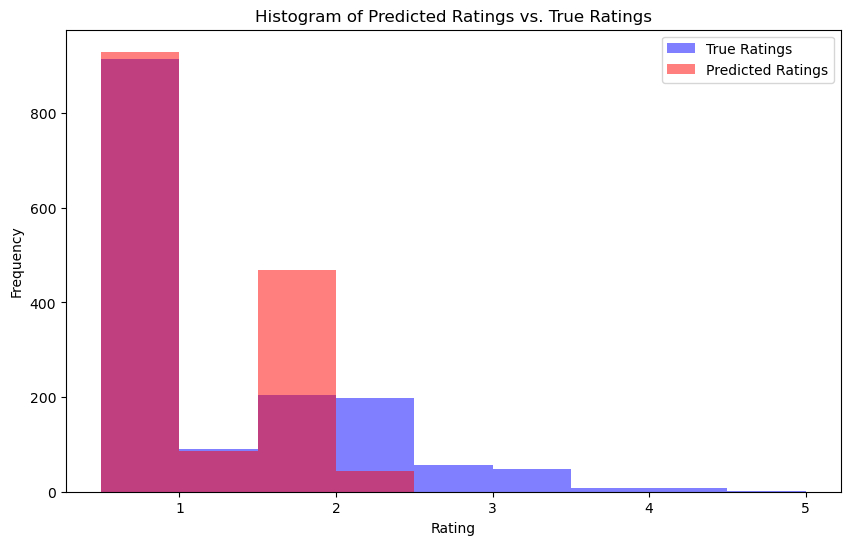

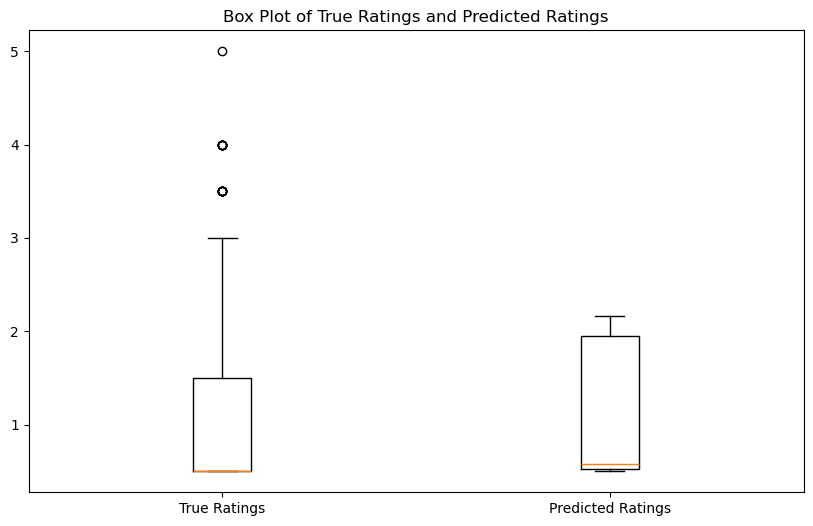

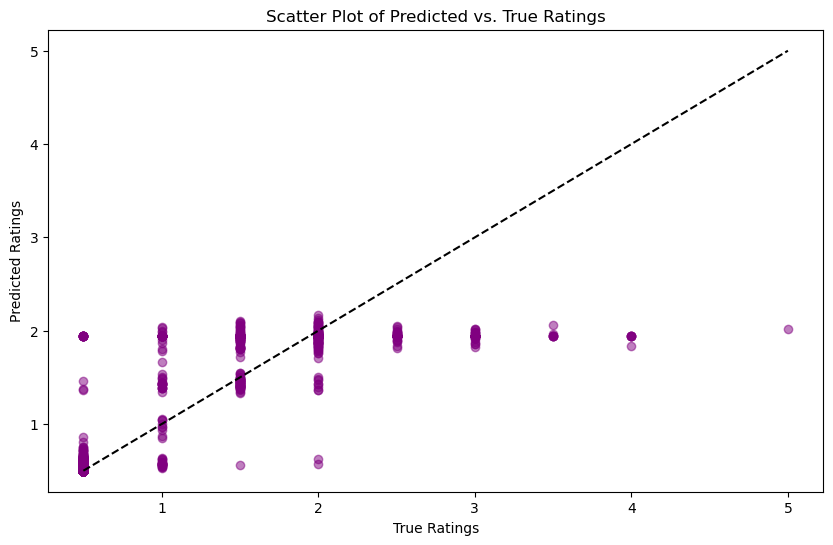

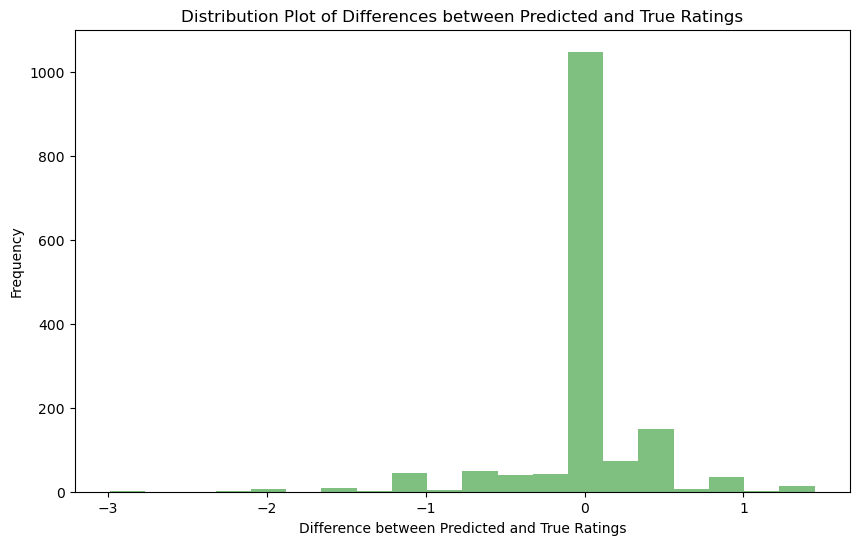

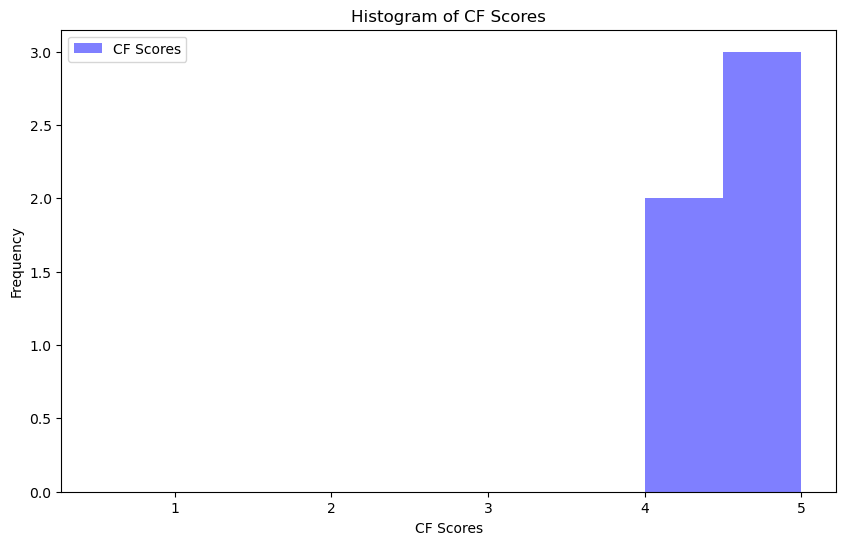

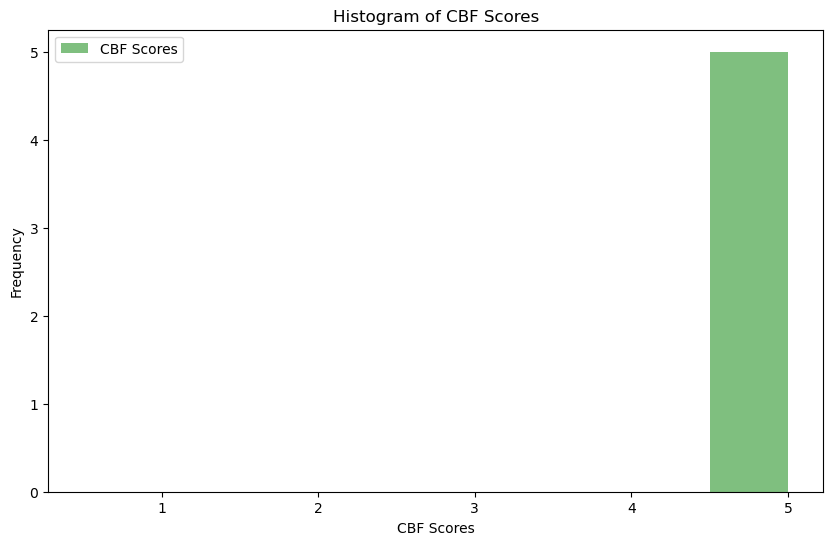

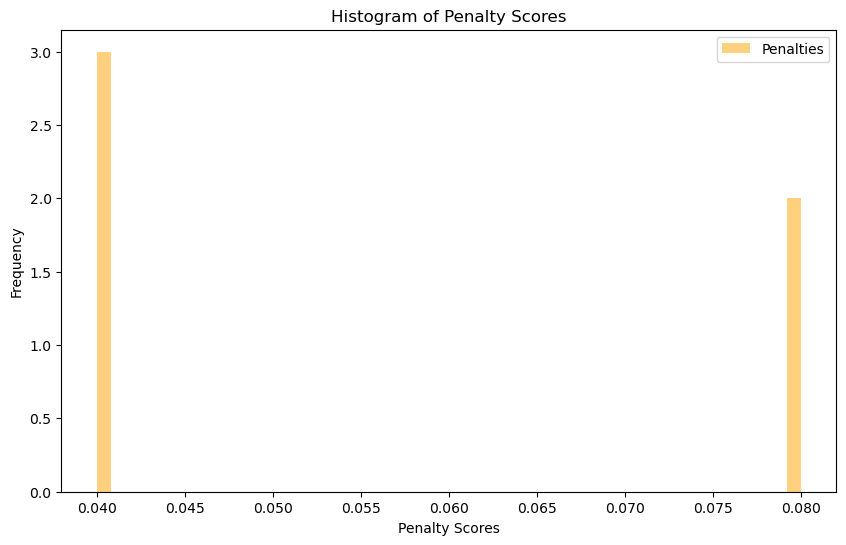

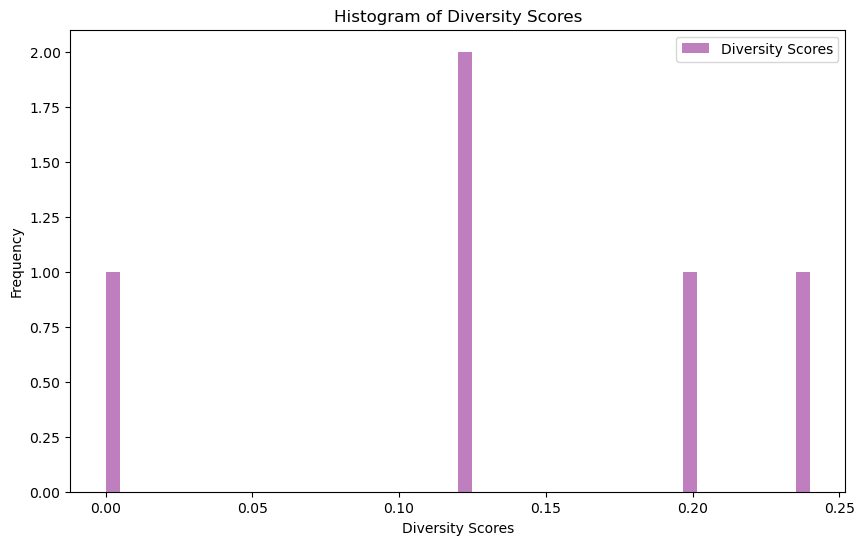

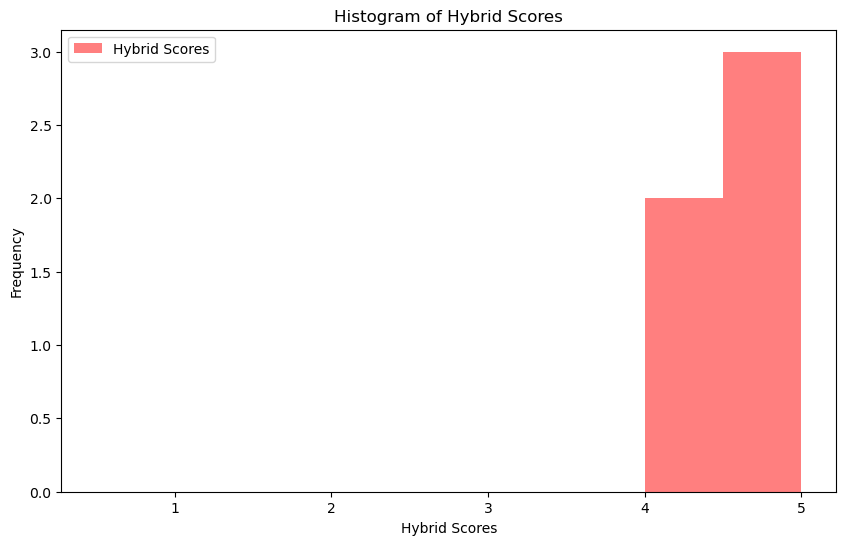

In [36]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 25

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores, min_score=0.5, max_score=5.0):
    scores = np.array(scores)
    min_value = np.min(scores)
    max_value = np.max(scores)
    if max_value != min_value:
        normalized_scores = min_score + (scores - min_value) * (max_score - min_score) / (max_value - min_value)
    else:
        normalized_scores = np.full_like(scores, min_score + (max_score - min_score) / 2)
    return normalized_scores.clip(min_score, max_score)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(np.array(cf_scores))
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3972
INFO:root:MAE: 0.2059
INFO:root:Precision: 0.0000
INFO:root:Recall: 0.0000
INFO:root:F1 Score: 0.0000
INFO:root:Item features extracted:          release_year_bucket  release_year  Horror  (no genres listed)  \
movieId                                                                  
31                  0.153226        1995.0       0                   0   
527                 0.150000        1993.0       0                   0   
647                 0.154839        1996.0       0                   0   
688                 0.153226        1995.0       0                   0   
720                 0.154839        1996.0       0                   0   

         Comedy  Thriller  Musical  Sci-Fi  War  Adventure  ...  IMAX  \
movieId                                                     ...         
31 

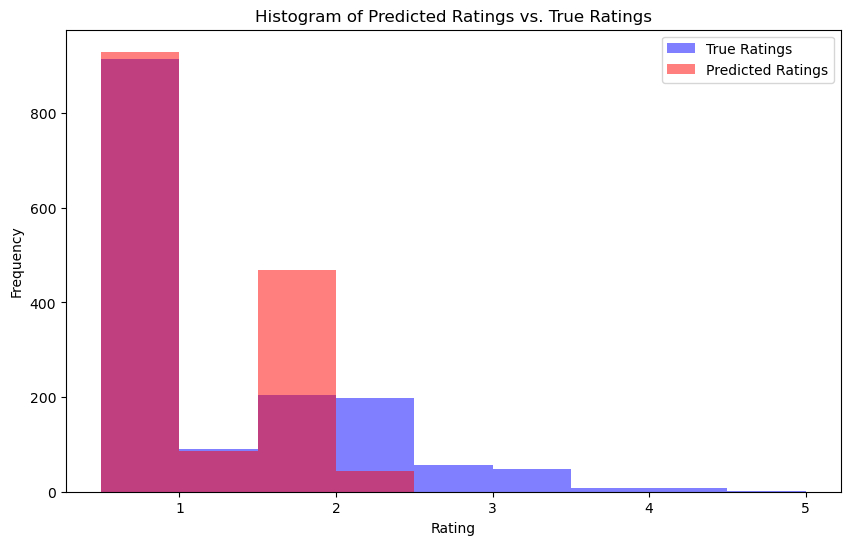

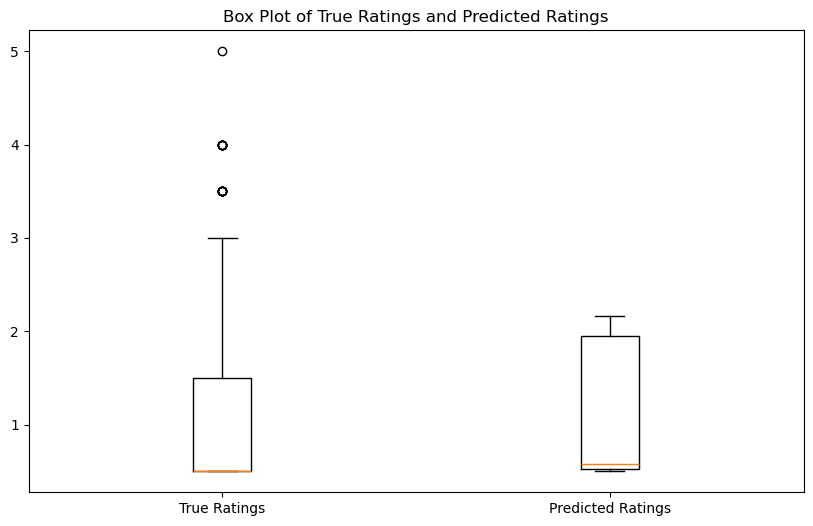

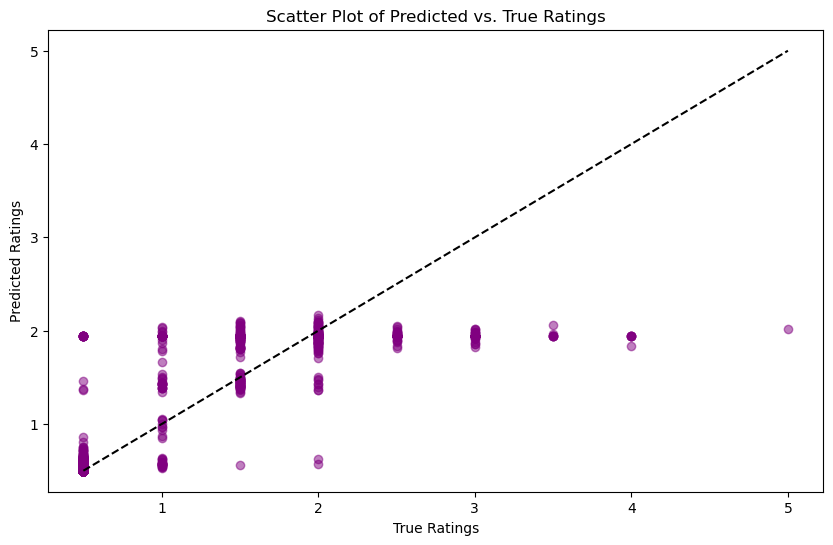

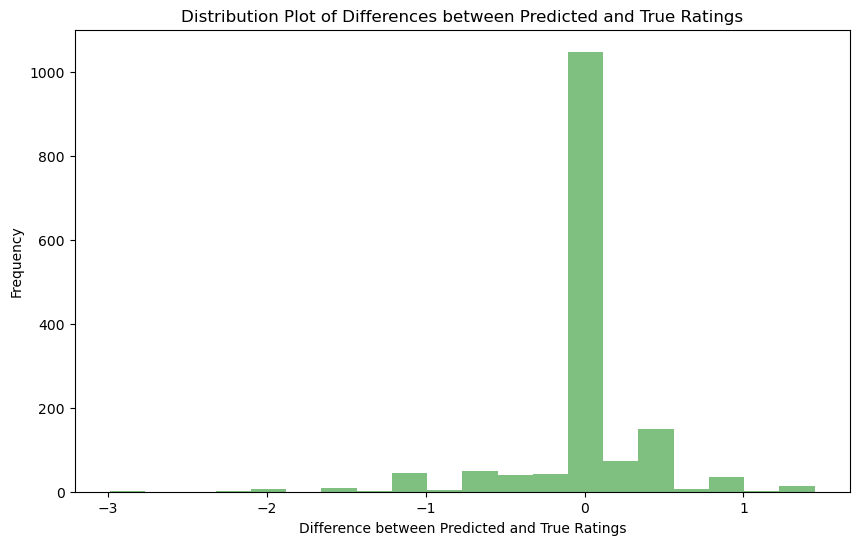

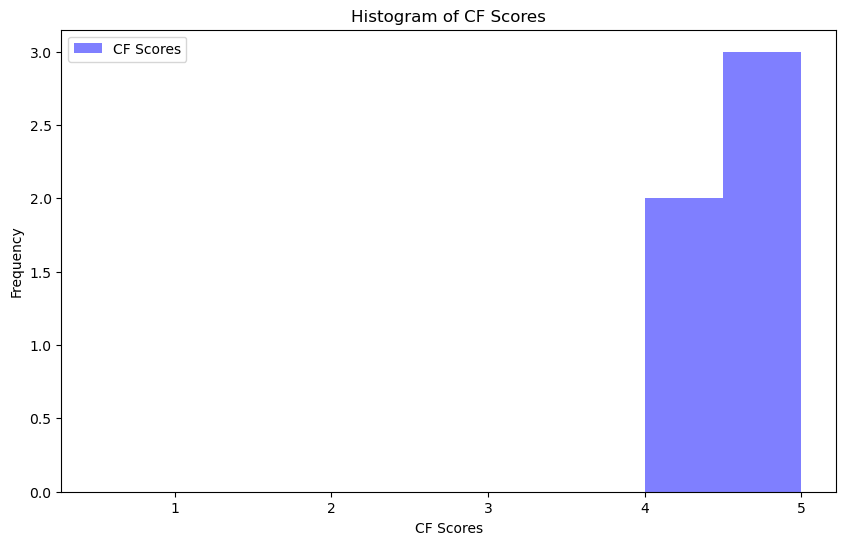

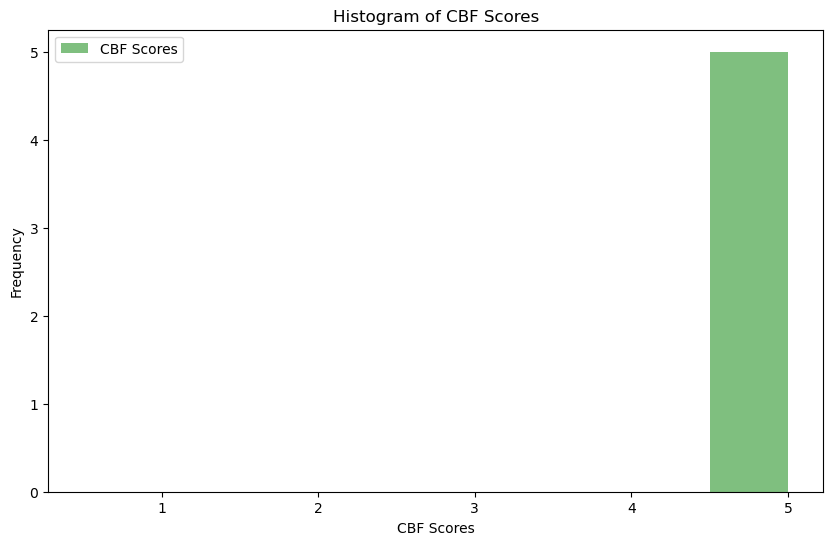

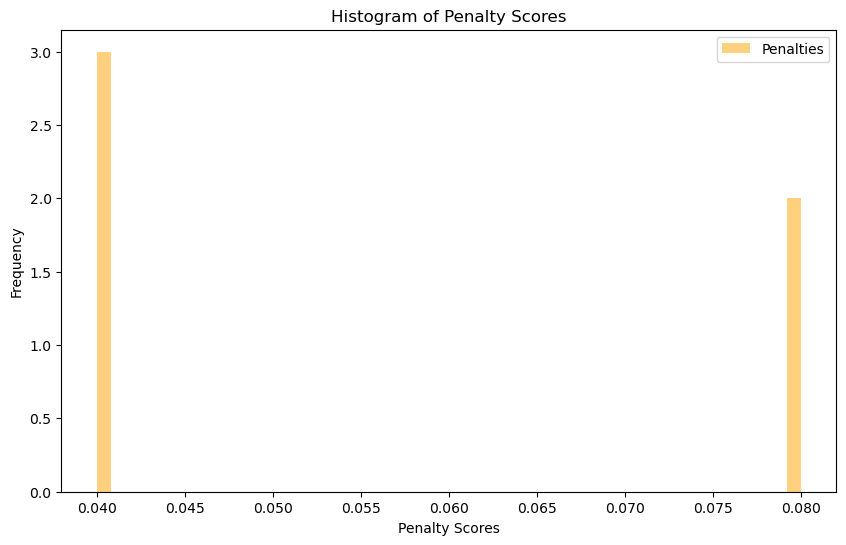

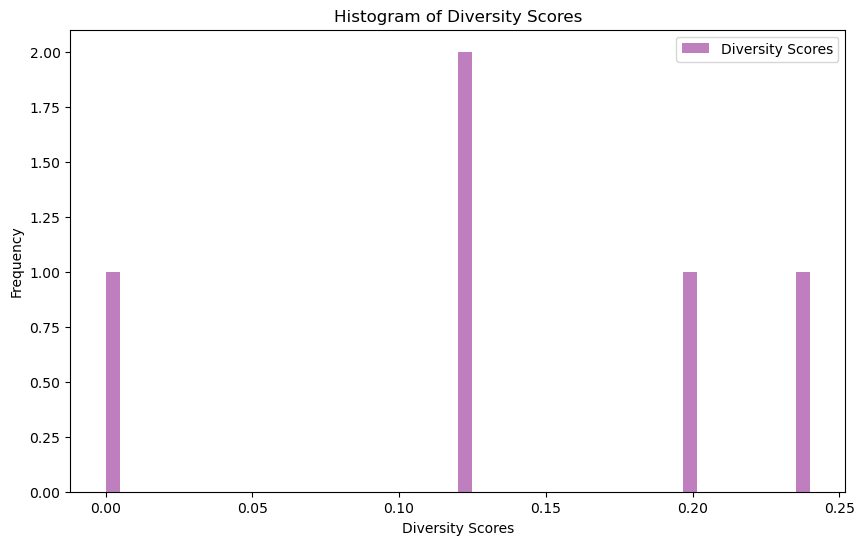

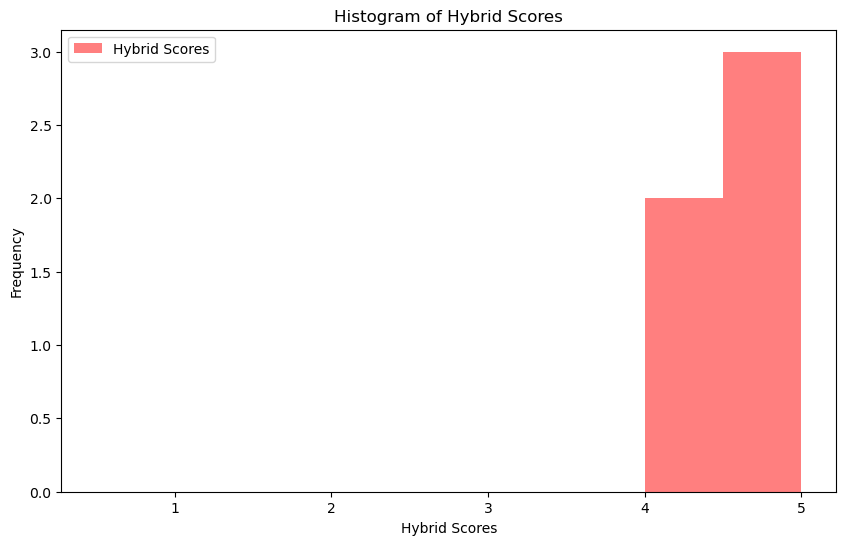

In [38]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 25

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores, min_score=0.5, max_score=5.0):
    scores = np.array(scores)
    min_value = np.min(scores)
    max_value = np.max(scores)
    if max_value != min_value:
        normalized_scores = min_score + (scores - min_value) * (max_score - min_score) / (max_value - min_value)
    else:
        normalized_scores = np.full_like(scores, min_score + (max_score - min_score) / 2)
    return normalized_scores.clip(min_score, max_score)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(np.array(cf_scores))
    normalized_cbf_scores = normalize_scores(cbf_scores)

    # Log CF and CBF scores for debugging
    logging.info(f"Normalized CF Scores: {normalized_cf_scores}")
    logging.info(f"Normalized CBF Scores: {normalized_cbf_scores}")

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    true_ratings = np.array(true_ratings)
    estimated_ratings = np.array(estimated_ratings)
    differences = estimated_ratings - true_ratings

    # Box Plot
    plt.figure(figsize=(10, 6))
    plt.boxplot([true_ratings, estimated_ratings], labels=['True Ratings', 'Predicted Ratings'])
    plt.title('Box Plot of True Ratings and Predicted Ratings')
    plt.show()

    # Scatter Plot
    plt.figure(figsize=(10, 6))
    plt.scatter(true_ratings, estimated_ratings, alpha=0.5, c='purple')
    plt.plot([0.5, 5], [0.5, 5], color='black', linestyle='--')  # Diagonal line
    plt.xlabel('True Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Scatter Plot of Predicted vs. True Ratings')
    plt.show()

    # Distribution Plot of Differences
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=20, color='green', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            cf_scores = []
            cbf_scores = []
            hybrid_scores = []
            penalties = []
            diversities = []
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                hybrid_scores.append(est_rating)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)
        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:Model Metrics:
INFO:root:RMSE: 0.3972
INFO:root:MAE: 0.2059
INFO:root:Precision: 0.0000
INFO:root:Recall: 0.0000
INFO:root:F1 Score: 0.0000
INFO:root:Item features extracted:          release_year_bucket  release_year  Horror  (no genres listed)  \
movieId                                                                  
31                  0.153226        1995.0       0                   0   
527                 0.150000        1993.0       0                   0   
647                 0.154839        1996.0       0                   0   
688                 0.153226        1995.0       0                   0   
720                 0.154839        1996.0       0                   0   

         Comedy  Thriller  Musical  Sci-Fi  War  Adventure  ...  IMAX  \
movieId                                                     ...         
31 

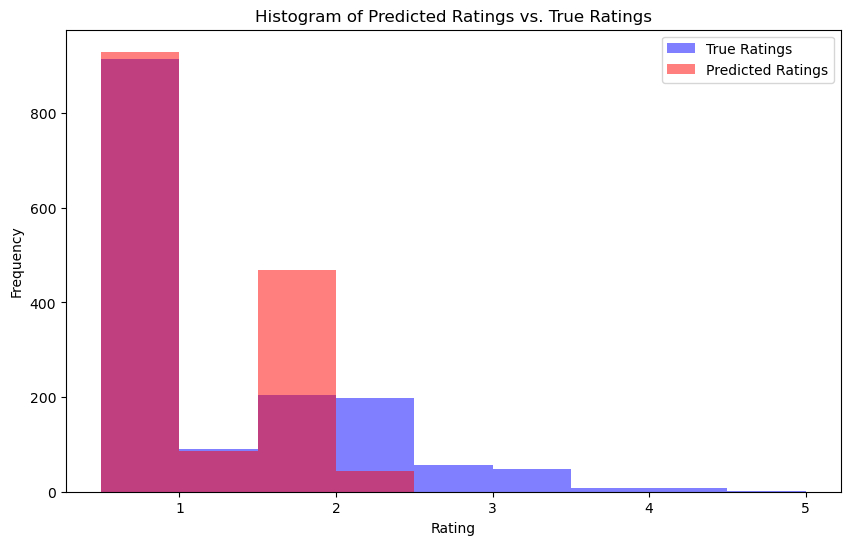

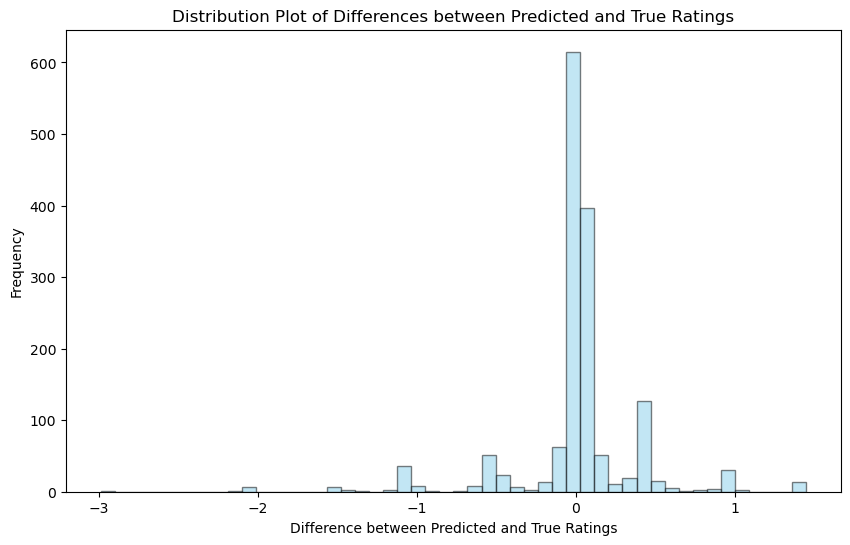

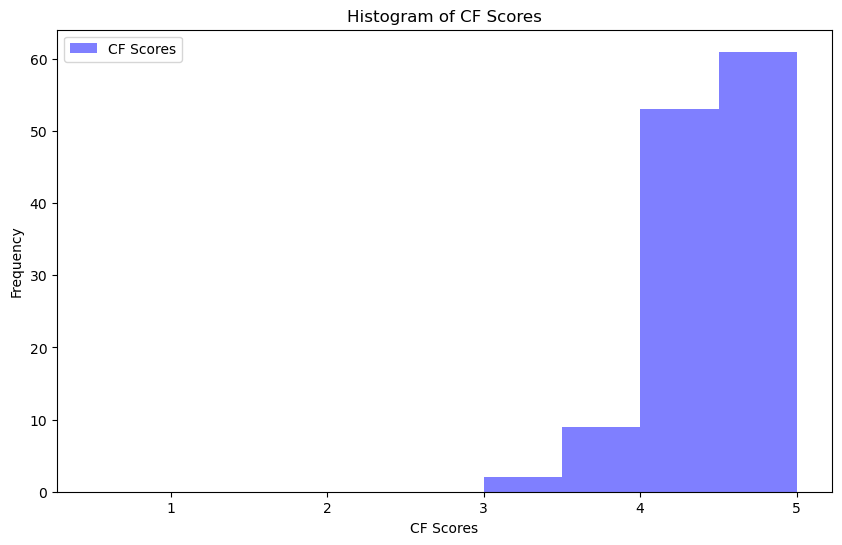

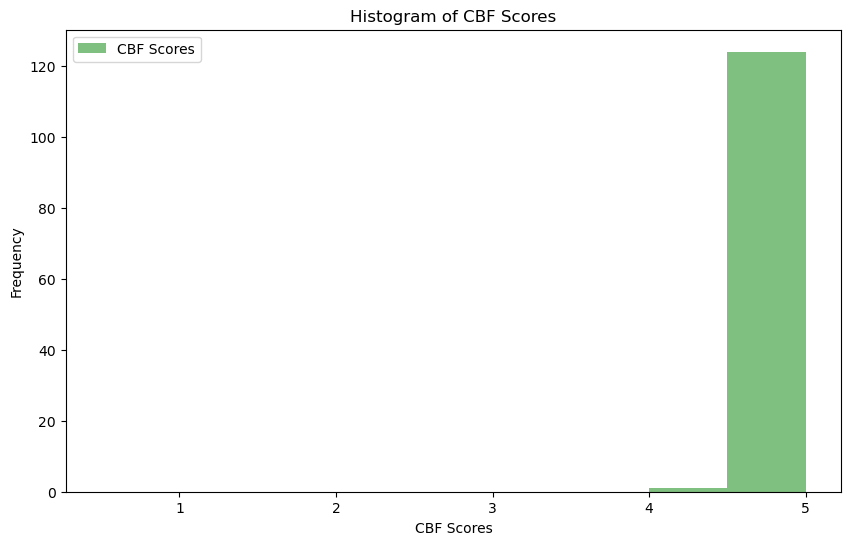

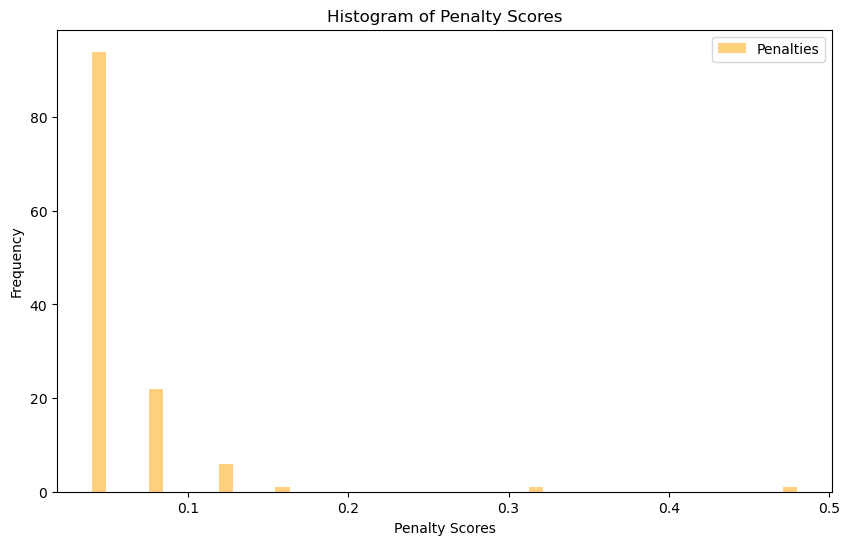

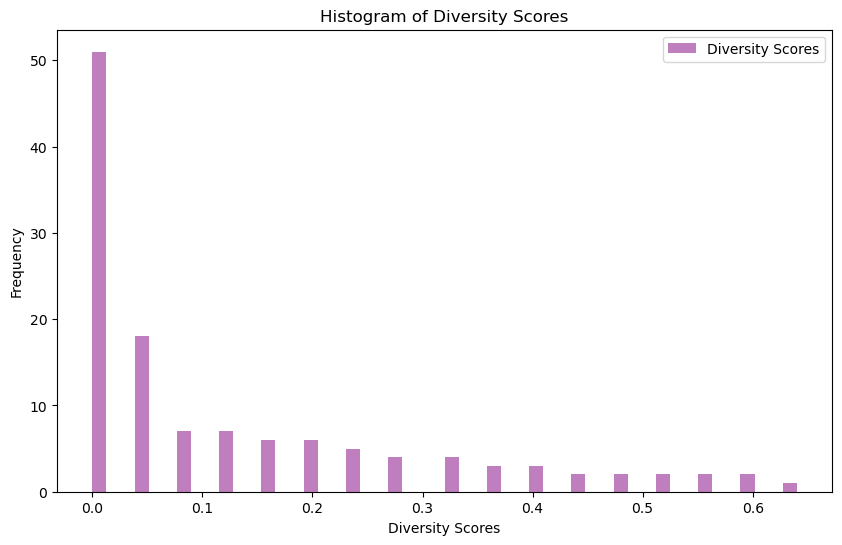

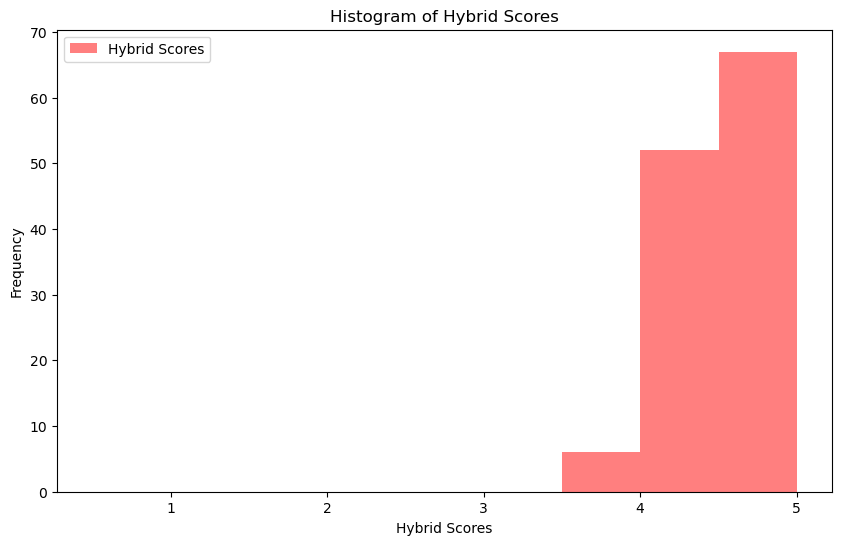

In [40]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 25  # Temporarily reduced for debugging

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est * 5.0)  # Ensuring the scale is 0.5 to 5.0
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_additional_analysis(true_ratings, estimated_ratings):
    differences = np.array(estimated_ratings) - np.array(true_ratings)
    plt.figure(figsize=(10, 6))
    plt.hist(differences, bins=50, color='skyblue', edgecolor='black', alpha=0.5)
    plt.xlabel('Difference between Predicted and True Ratings')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of Differences between Predicted and True Ratings')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores):
    # Plot CF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CF Scores', color='blue')
    plt.xlabel('CF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CF Scores')
    plt.legend()
    plt.show()
    
    # Plot CBF Scores
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='CBF Scores', color='green')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of CBF Scores')
    plt.legend()
    plt.show()
    
    # Plot Penalties
    plt.figure(figsize=(10, 6))
    plt.hist(penalties, bins=50, alpha=0.5, label='Penalties', color='orange')
    plt.xlabel('Penalty Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Penalty Scores')
    plt.legend()
    plt.show()

    # Plot Diversities
    plt.figure(figsize=(10, 6))
    plt.hist(diversities, bins=50, alpha=0.5, label='Diversity Scores', color='purple')
    plt.xlabel('Diversity Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Diversity Scores')
    plt.legend()
    plt.show()
    
    # Plot Hybrid Scores
    plt.figure(figsize=(10, 6))
    plt.hist(hybrid_scores, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Hybrid Scores', color='red')
    plt.xlabel('Hybrid Scores')
    plt.ylabel('Frequency')
    plt.title('Histogram of Hybrid Scores')
    plt.legend()
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        plot_additional_analysis(true_ratings, estimated_ratings)

        # Collecting score data for plotting
        cf_scores = []
        cbf_scores = []
        penalties = []
        diversities = []
        hybrid_scores = []

        for user_id, recs in recommendations.items():
            for _, hybrid_score, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                cf_scores.append(cf_score)
                cbf_scores.append(cbf_score)
                penalties.append(popularity_penalty)
                diversities.append(diversity_penalty)
                hybrid_scores.append(hybrid_score)

        plot_score_distributions(cf_scores, cbf_scores, penalties, diversities, hybrid_scores)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:User: 599, Item: 2448, True Rating: 1.0, Estimated Rating: 1.947861830844868
INFO:root:User: 599, Item: 72395, True Rating: 2.0, Estimated Rating: 1.947861830844868
INFO:root:User: 292, Item: 3256, True Rating: 0.5, Estimated Rating: 0.5521939891504787
INFO:root:User: 483, Item: 26, True Rating: 0.5, Estimated Rating: 0.5179231275158571
INFO:root:User: 483, Item: 3948, True Rating: 0.5, Estimated Rating: 0.5
INFO:root:User: 599, Item: 4578, True Rating: 1.5, Estimated Rating: 1.947861830844868
INFO:root:User: 599, Item: 99532, True Rating: 3.0, Estimated Rating: 1.947861830844868
INFO:root:User: 82, Item: 6539, True Rating: 0.5, Estimated Rating: 0.5641089967233585
INFO:root:User: 599, Item: 5540, True Rating: 2.5, Estimated Rating: 1.947861830844868
INFO:root:User: 177, Item: 2087, True Rating: 0.5, Estimated Rating: 0.55144374128

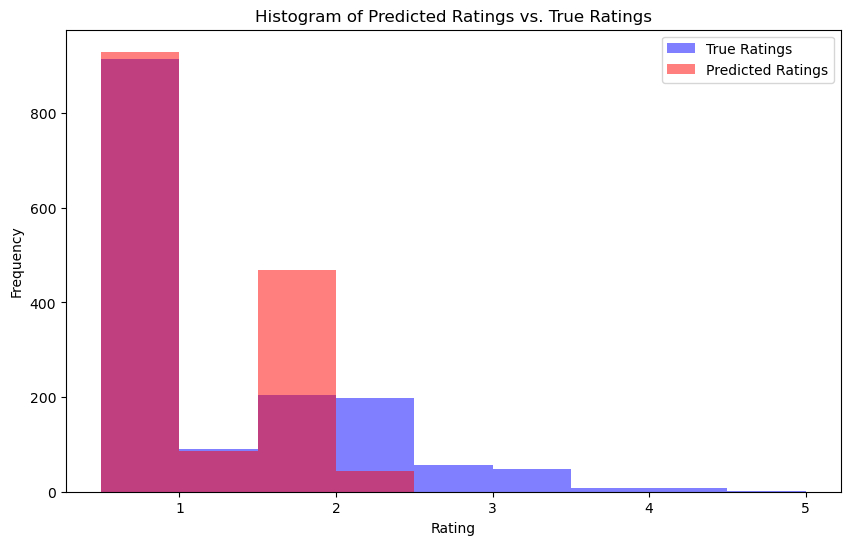

In [46]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 25

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def print_predictions(predictions):
    for pred in predictions[:10]:
        logging.info(f"User: {pred.uid}, Item: {pred.iid}, True Rating: {pred.r_ui}, Estimated Rating: {pred.est}")

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    print_predictions(predictions)

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()

    if (merged_df is not None) and (ratings_df is not None) and (movies_df is not None):
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(merged_df[['userId', 'movieId', 'time_weighted_rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.2, random_state=RANDOM_SEED)

        param_grid = {
            'n_factors': [50, 100],
            'n_epochs': [20, 30],
            'lr_all': [0.005, 0.01],
            'reg_all': [0.02, 0.1],
            'biased': [True, False]
        }
        gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3, n_jobs=-1)
        gs.fit(data)
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)

        predictions = algo.test(testset)
        metrics = calculate_model_metrics(predictions)
        logging.info("Model Metrics:")
        for metric, value in metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(merged_df)
        global_popularity = item_popularity

        diversity_counts = {}

        recommendations = {}
        for user_id in merged_df['userId'].unique():
            user_recommendations = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
            recommendations[user_id] = user_recommendations

        expected_recommendations = get_expected_recommendations(merged_df)

        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, merged_df, N_RECOMMENDATIONS)

        logging.info("Model Metrics (Recommendations):")
        recommendation_metrics = calculate_recommendation_metrics(recommendations, merged_df)
        for metric, value in recommendation_metrics.items():
            logging.info(f"{metric}: {value:.4f}")

        for user_id, recs in list(recommendations.items())[:10]:
            logging.info(f"User {user_id} recommendations:")
            for movie_id, est_rating, cf_score, cbf_score, popularity_penalty, diversity_penalty in recs:
                title = movies_df[movies_df['movieId'] == movie_id]['title'].values[0]
                logging.info(f"  {title}: Est. Rating: {est_rating:.2f}, CF: {cf_score:.2f}, CBF: {cbf_score:.2f}, Popularity Penalty: {popularity_penalty:.4f}, Diversity Penalty: {diversity_penalty:.4f}")

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)


# preliminary final


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8669
INFO:root:MAE: 0.6679
INFO:root:Precision: 0.8151
INFO:root:Recall: 0.2624
INFO:root:F1 Score: 0.3970
INFO:root:Item features extracted:          release_year_bucket  release_year  Horror  (no genres listed)  \
movieId                                                                  
31                  0.153226        1995.0       0                   0   
527                 0.150000        1993.0       0                   0   
647                 0.154839        1996.0       0                   0   
688                 0.153226        1995.0       0                   0   
720                 0.154839        1996.0       0                   0   

         Comedy  Thriller  Musical  Sci-Fi  War  Adventure  ...  IMAX  \
movieId                                                     ...         
31            0         0   

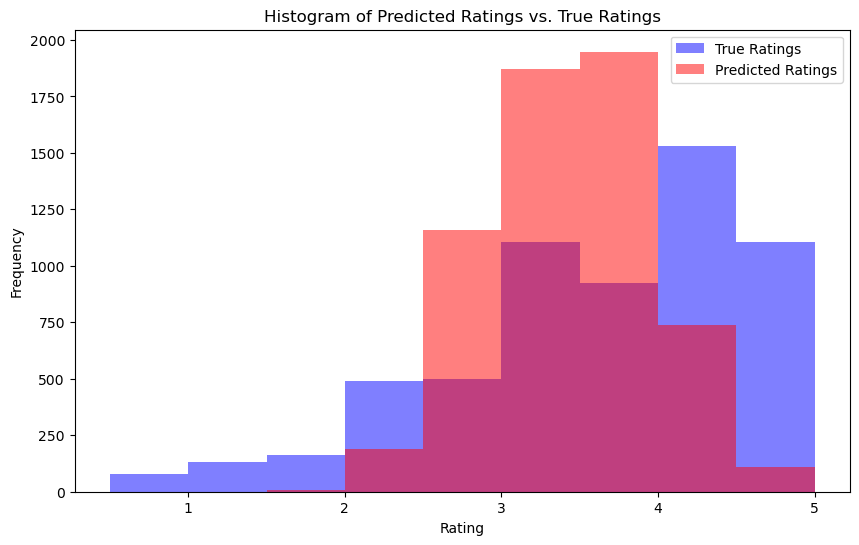

In [49]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

# Load datasets
def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

# Calculate weighted release year
def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

# Apply time decay to ratings
def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

# Get item features
def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

# Derive user preferences
def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

# Normalize content scores
def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

# Generate recommendations
def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    # Normalize CF and CBF scores to the range [0.5, 5.0]
    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    item_popularity = df['movieId'].value_counts().to_dict()
    return item_popularity

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()
    if merged_df is not None:
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
        
        param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
        gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
        gs.fit(data)
        
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)
        
        predictions = algo.test(testset)
        model_metrics = calculate_model_metrics(predictions)
        for metric, value in model_metrics.items():
            logging.info(f"{metric}: {value:.4f}")
        
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(ratings_df)
        global_popularity = calculate_item_popularity(ratings_df)
        diversity_counts = {}

        recommendations = {}
        for user_id in ratings_df['userId'].unique():
            recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)

        expected_recommendations = get_expected_recommendations(merged_df)
        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8669
INFO:root:MAE: 0.6679
INFO:root:Precision: 0.8151
INFO:root:Recall: 0.2624
INFO:root:F1 Score: 0.3970
INFO:root:Item features extracted:          release_year_bucket  release_year  Horror  (no genres listed)  \
movieId                                                                  
31                  0.153226        1995.0       0                   0   
527                 0.150000        1993.0       0                   0   
647                 0.154839        1996.0       0                   0   
688                 0.153226        1995.0       0                   0   
720                 0.154839        1996.0       0                   0   

         Comedy  Thriller  Musical  Sci-Fi  War  Adventure  ...  IMAX  \
movieId                                                     ...         
31            0         0   

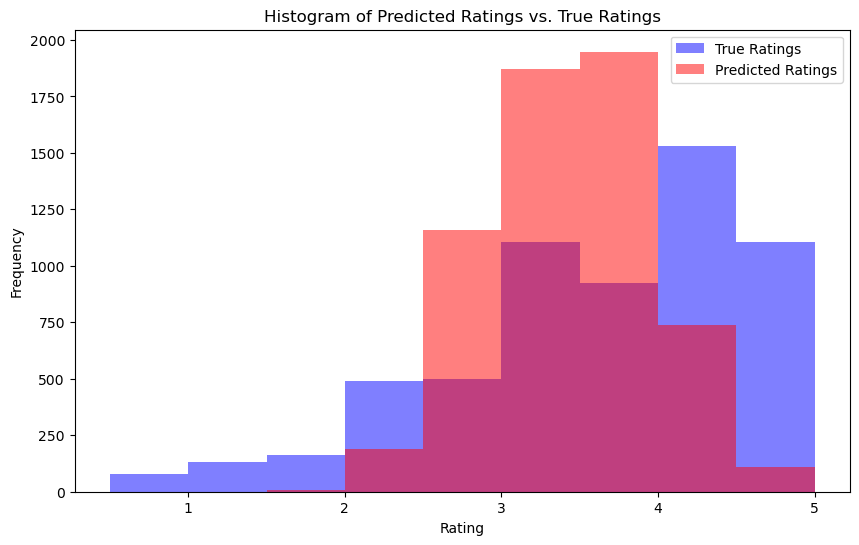

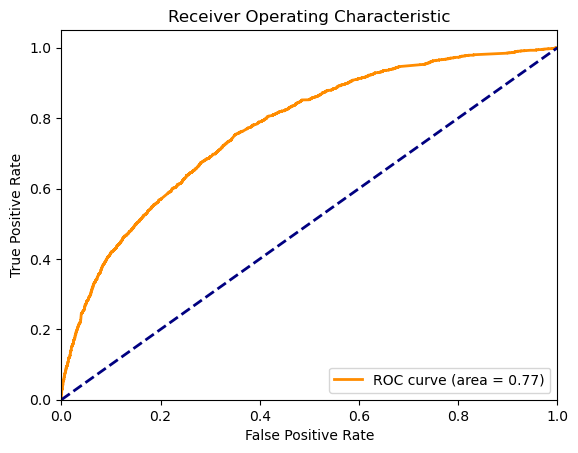

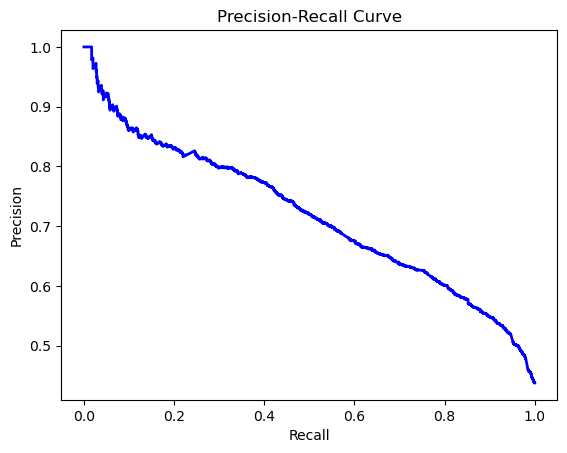

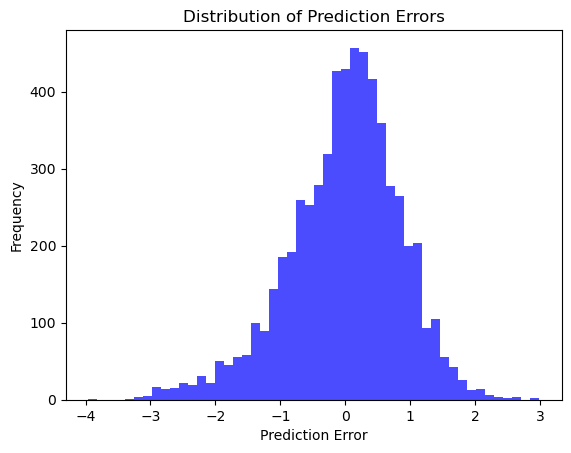

In [57]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()
    if merged_df is not None:
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
        
        param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
        gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
        gs.fit(data)
        
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)
        
        predictions = algo.test(testset)
        model_metrics = calculate_model_metrics(predictions)
        for metric, value in model_metrics.items():
            logging.info(f"{metric}: {value:.4f}")
        
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(ratings_df)
        global_popularity = calculate_item_popularity(ratings_df)
        diversity_counts = {}

        recommendations = {}
        for user_id in ratings_df['userId'].unique():
            recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)

        expected_recommendations = get_expected_recommendations(merged_df)
        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        
        y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
        y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
        
        plot_roc_curve(y_true, y_scores)
        plot_precision_recall_curve(y_true, y_scores)
        plot_error_distribution(true_ratings, estimated_ratings)


In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()
    if merged_df is not None:
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
        
        param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
        gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
        gs.fit(data)
        
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)
        
        predictions = algo.test(testset)
        model_metrics = calculate_model_metrics(predictions)
        for metric, value in model_metrics.items():
            logging.info(f"{metric}: {value:.4f}")
        
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(ratings_df)
        global_popularity = calculate_item_popularity(ratings_df)
        diversity_counts = {}

        recommendations = {}
        for user_id in ratings_df['userId'].unique()[:10]:
            recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=True)
            logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

        expected_recommendations = get_expected_recommendations(merged_df)
        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        
        y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
        y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
        
        plot_roc_curve(y_true, y_scores)
        plot_precision_recall_curve(y_true, y_scores)
        plot_error_distribution(true_ratings, estimated_ratings)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8842
INFO:root:MAE: 0.6863
INFO:root:Precision: 0.8346
INFO:root:Recall: 0.1501
INFO:root:F1 Score: 0.2545
INFO:root:Item features extracted:          release_year_bucket  release_year  Horror  (no genres listed)  \
movieId                                                                  
31                  0.153226        1995.0       0                   0   
527                 0.150000        1993.0       0                   0   
647                 0.154839        1996.0       0                   0   
688                 0.153226        1995.0       0                   0   
720                 0.154839        1996.0       0                   0   

         Comedy  Thriller  Musical  Sci-Fi  War  Adventure  ...  IMAX  \
movieId                                                     ...         
31            0         0   

In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.5  # Adjusted to balance CF and CBF
CBF_WEIGHT = 0.5
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(recommendations, df, ks):
    rmses, maes, precisions, recalls, f1s = [], [], [], [], []
    for k in ks:
        top_k_recommendations = {user: items[:k] for user, items in recommendations.items()}
        metrics = calculate_recommendation_metrics(top_k_recommendations, df)
        rmses.append(metrics['RMSE'])
        maes.append(metrics['MAE'])
        precisions.append(metrics['Precision'])
        recalls.append(metrics['Recall'])
        f1s.append(metrics['F1 Score'])

    plt.figure(figsize=(12, 8))
    plt.plot(ks, rmses, marker='o', label='RMSE')
    plt.plot(ks, maes, marker='o', label='MAE')
    plt.plot(ks, precisions, marker='o', label='Precision')
    plt.plot(ks, recalls, marker='o', label='Recall')
    plt.plot(ks, f1s, marker='o', label='F1 Score')
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel('Metric Value')
    plt.title('Evaluation Metrics at Different Values of k')
    plt.legend()
    plt.grid(True)
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()
    if merged_df is not None:
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
        
        param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
        gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
        gs.fit(data)
        
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)
        
        predictions = algo.test(testset)
        model_metrics = calculate_model_metrics(predictions)
        for metric, value in model_metrics.items():
            logging.info(f"{metric}: {value:.4f}")
        
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(ratings_df)
        global_popularity = calculate_item_popularity(ratings_df)
        diversity_counts = {}

        recommendations = {}
        for user_id in ratings_df['userId'].unique()[:10]:
            recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=True)
            logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

        expected_recommendations = get_expected_recommendations(merged_df)
        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        
        y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
        y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
        
        plot_roc_curve(y_true, y_scores)
        plot_precision_recall_curve(y_true, y_scores)
        plot_error_distribution(true_ratings, estimated_ratings)
        
        ks = list(range(1, N_RECOMMENDATIONS + 1))
        plot_metrics_at_k(recommendations, ratings_df, ks)


INFO:root:Data loaded successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8842
INFO:root:MAE: 0.6863
INFO:root:Precision: 0.8346
INFO:root:Recall: 0.1501
INFO:root:F1 Score: 0.2545
INFO:root:Item features extracted:          release_year_bucket  release_year  Romance  Fantasy  Thriller  \
movieId                                                                  
31                  0.153226        1995.0        0        0         0   
527                 0.150000        1993.0        0        0         0   
647                 0.154839        1996.0        0        0         0   
688                 0.153226        1995.0        0        0         0   
720                 0.154839        1996.0        0        0         0   

         Animation  Comedy  Documentary  Musical  (no genres listed)  ...  \
movieId                                                               ...   
31               0  

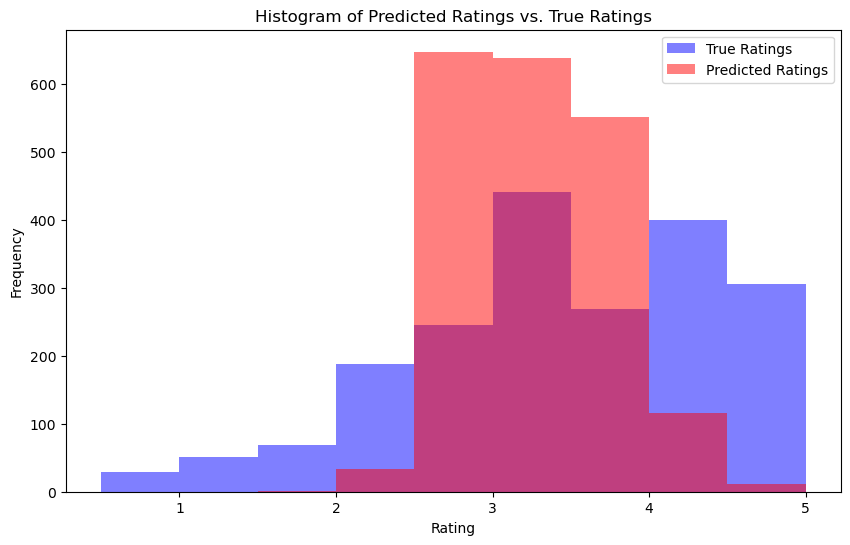

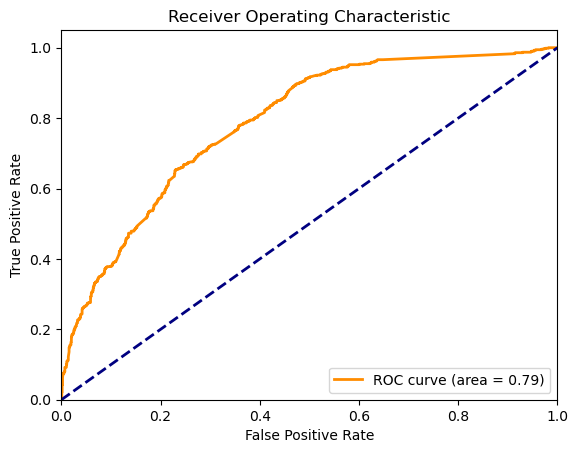

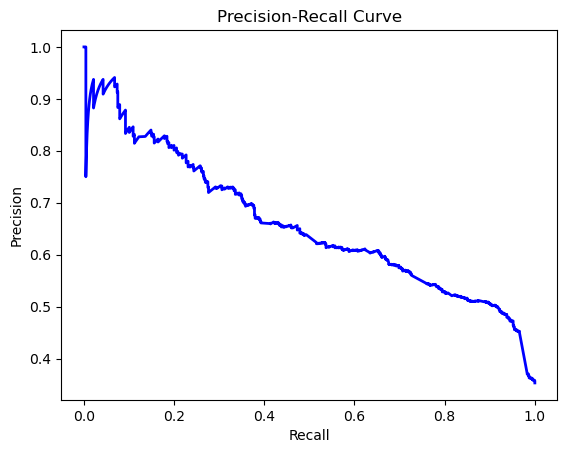

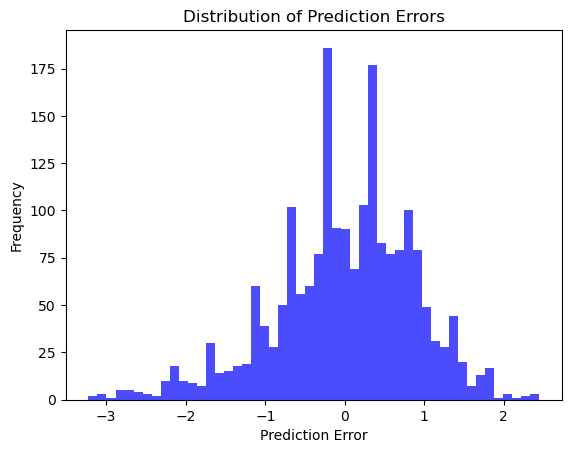

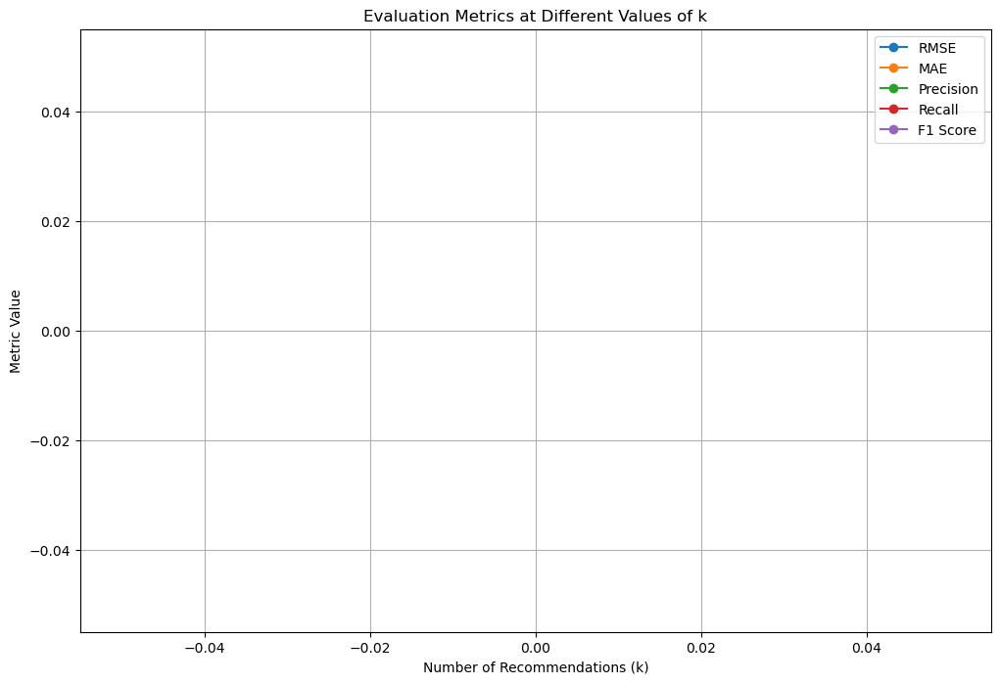

In [3]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist  # Import pdist for calculating pairwise distances




# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6  # Further adjust to balance CF and CBF
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.WARNING)  # Set logging level to WARNING

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(recommendations, df, ks):
    rmses, maes, precisions, recalls, f1s = [], [], [], [], []
    for k in ks:
        top_k_recommendations = {user: items[:k] for user, items in recommendations.items()}
        metrics = calculate_recommendation_metrics(top_k_recommendations, df)
        rmses.append(metrics['RMSE'])
        maes.append(metrics['MAE'])
        precisions.append(metrics['Precision'])
        recalls.append(metrics['Recall'])
        f1s.append(metrics['F1 Score'])

    plt.figure(figsize=(12, 8))
    plt.plot(ks, rmses, marker='o', label='RMSE')
    plt.plot(ks, maes, marker='o', label='MAE')
    plt.plot(ks, precisions, marker='o', label='Precision')
    plt.plot(ks, recalls, marker='o', label='Recall')
    plt.plot(ks, f1s, marker='o', label='F1 Score')
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel('Metric Value')
    plt.title('Evaluation Metrics at Different Values of k')
    plt.legend()
    plt.grid(True)
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()
    if merged_df is not None:
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
        
        param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
        gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
        gs.fit(data)
        
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)
        
        predictions = algo.test(testset)
        model_metrics = calculate_model_metrics(predictions)
        for metric, value in model_metrics.items():
            logging.info(f"{metric}: {value:.4f}")
        
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(ratings_df)
        global_popularity = calculate_item_popularity(ratings_df)
        diversity_counts = {}

        recommendations = {}
        for user_id in ratings_df['userId'].unique()[:10]:
            recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

        expected_recommendations = get_expected_recommendations(merged_df)
        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        
        y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
        y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
        
        plot_roc_curve(y_true, y_scores)
        plot_precision_recall_curve(y_true, y_scores)
        plot_error_distribution(true_ratings, estimated_ratings)
        
        ks = list(range(1, N_RECOMMENDATIONS + 1))
        plot_metrics_at_k(recommendations, ratings_df, ks)


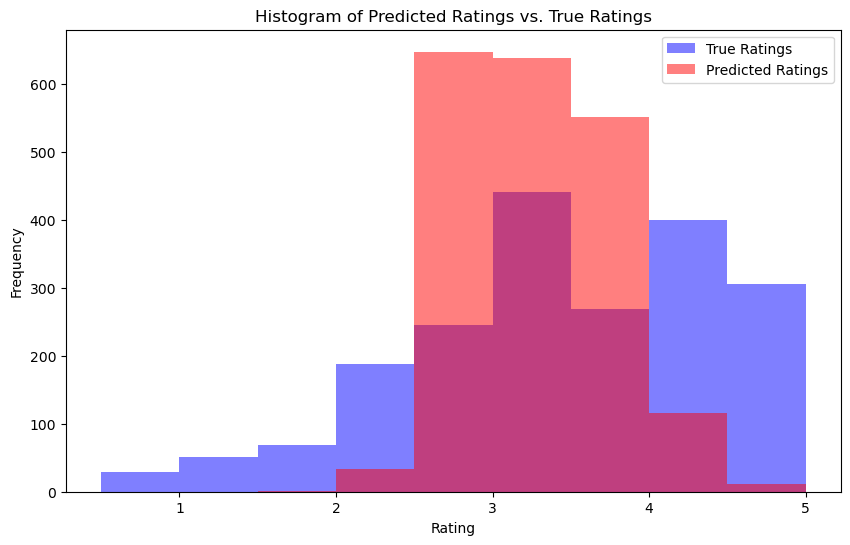

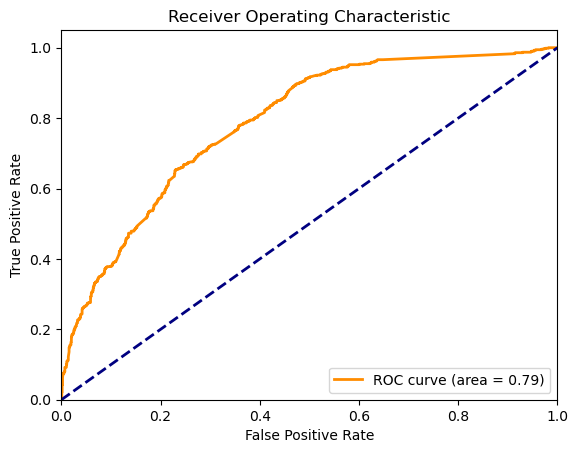

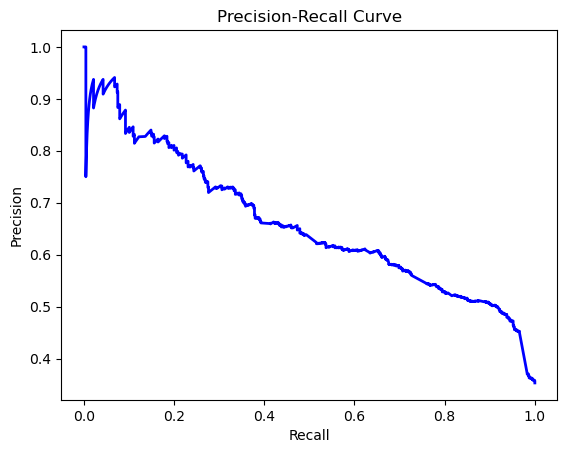

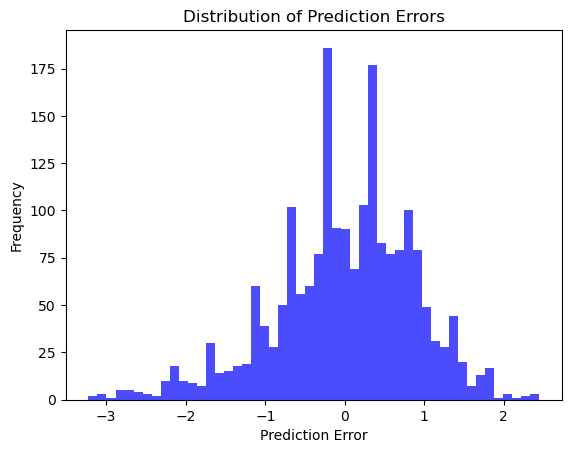

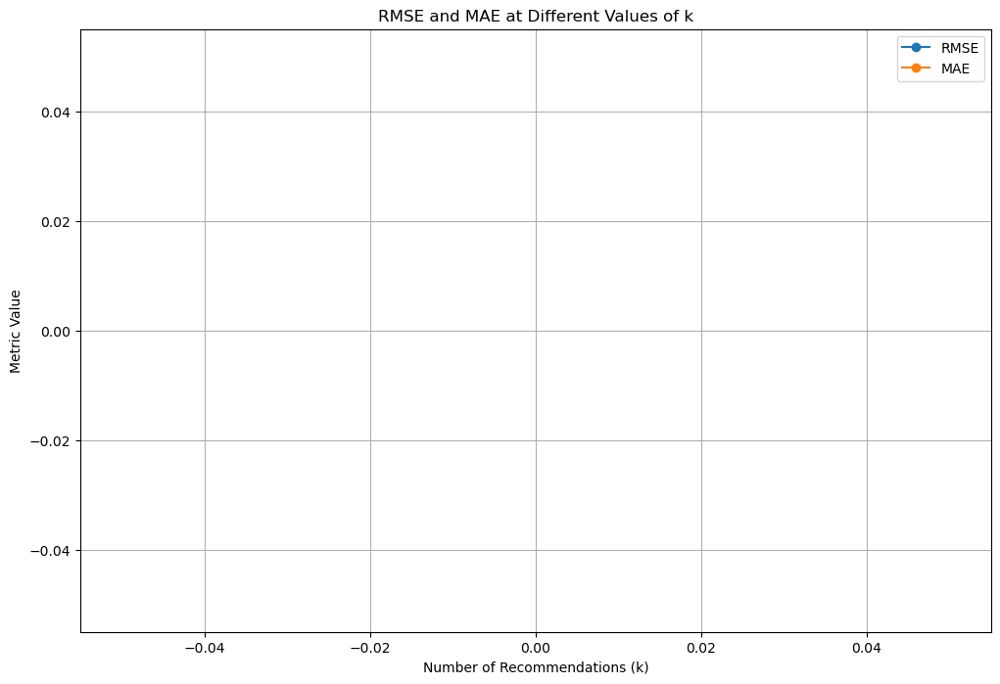

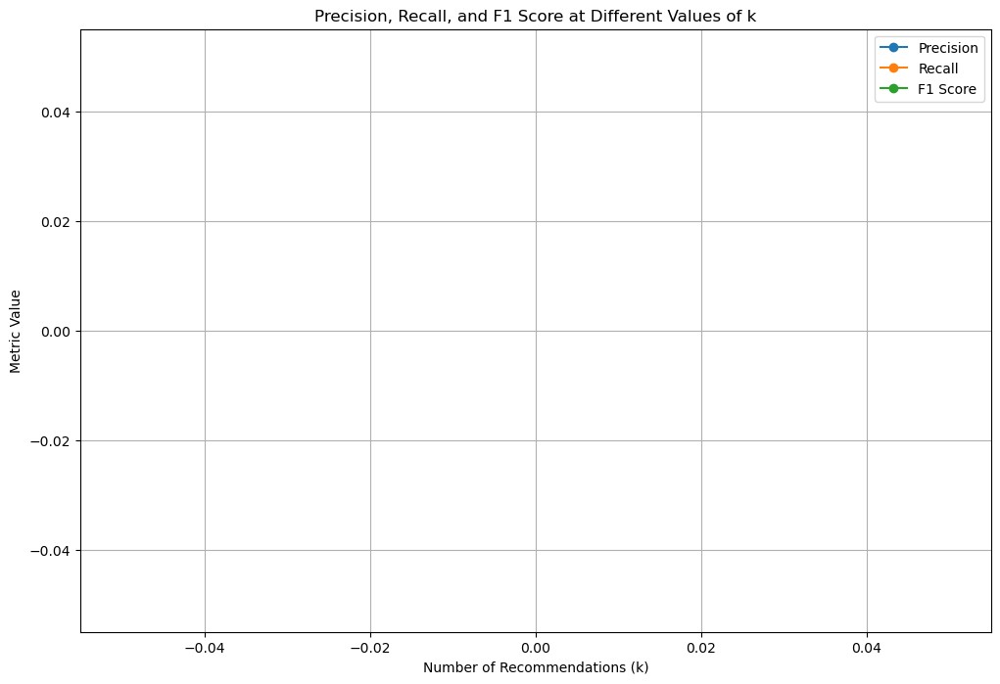

In [6]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6  # Further adjust to balance CF and CBF
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.WARNING)  # Set logging level to WARNING

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(recommendations, df, ks):
    rmses, maes, precisions, recalls, f1s = [], [], [], [], []
    for k in ks:
        top_k_recommendations = {user: items[:k] for user, items in recommendations.items()}
        metrics = calculate_recommendation_metrics(top_k_recommendations, df)
        rmses.append(metrics['RMSE'])
        maes.append(metrics['MAE'])
        precisions.append(metrics['Precision'])
        recalls.append(metrics['Recall'])
        f1s.append(metrics['F1 Score'])

    plt.figure(figsize=(12, 8))
    plt.plot(ks, rmses, marker='o', label='RMSE')
    plt.plot(ks, maes, marker='o', label='MAE')
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel('Metric Value')
    plt.title('RMSE and MAE at Different Values of k')
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(12, 8))
    plt.plot(ks, precisions, marker='o', label='Precision')
    plt.plot(ks, recalls, marker='o', label='Recall')
    plt.plot(ks, f1s, marker='o', label='F1 Score')
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel('Metric Value')
    plt.title('Precision, Recall, and F1 Score at Different Values of k')
    plt.legend()
    plt.grid(True)
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()
    if merged_df is not None:
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
        
        param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
        gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
        gs.fit(data)
        
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)
        
        predictions = algo.test(testset)
        model_metrics = calculate_model_metrics(predictions)
        for metric, value in model_metrics.items():
            logging.info(f"{metric}: {value:.4f}")
        
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(ratings_df)
        global_popularity = calculate_item_popularity(ratings_df)
        diversity_counts = {}

        recommendations = {}
        for user_id in ratings_df['userId'].unique()[:10]:
            recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

        expected_recommendations = get_expected_recommendations(merged_df)
        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        
        y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
        y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
        
        plot_roc_curve(y_true, y_scores)
        plot_precision_recall_curve(y_true, y_scores)
        plot_error_distribution(true_ratings, estimated_ratings)
        
        ks = list(range(1, N_RECOMMENDATIONS + 1))
        plot_metrics_at_k(recommendations, ratings_df, ks)


Top 5 recommendations for User 3: [(2858, 4.729203289954345, 'American Beauty (1999)'), (48780, 4.6577709970141425, 'Prestige, The (2006)'), (318, 4.601773163570516, 'Shawshank Redemption, The (1994)'), (1204, 4.569591392828092, 'Lawrence of Arabia (1962)'), (7361, 4.488252205707122, 'Eternal Sunshine of the Spotless Mind (2004)')]
Top 5 recommendations for User 11: [(296, 4.709561562749584, 'Pulp Fiction (1994)'), (4973, 4.514560872718703, "Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001)"), (2571, 4.510336031049164, 'Matrix, The (1999)'), (2858, 4.419393493129891, 'American Beauty (1999)'), (81591, 4.406059308399278, 'Black Swan (2010)')]
Top 5 recommendations for User 56: [(2858, 4.695869956621012, 'American Beauty (1999)'), (6711, 4.631672323445861, 'Lost in Translation (2003)'), (6874, 4.587238811967259, 'Kill Bill: Vol. 1 (2003)'), (50872, 4.4995876905811665, 'Ratatouille (2007)'), (2571, 4.4767525156518575, 'Matrix, The (1999)')]
Top 5 recommendations for User 82: [(2858, 4.

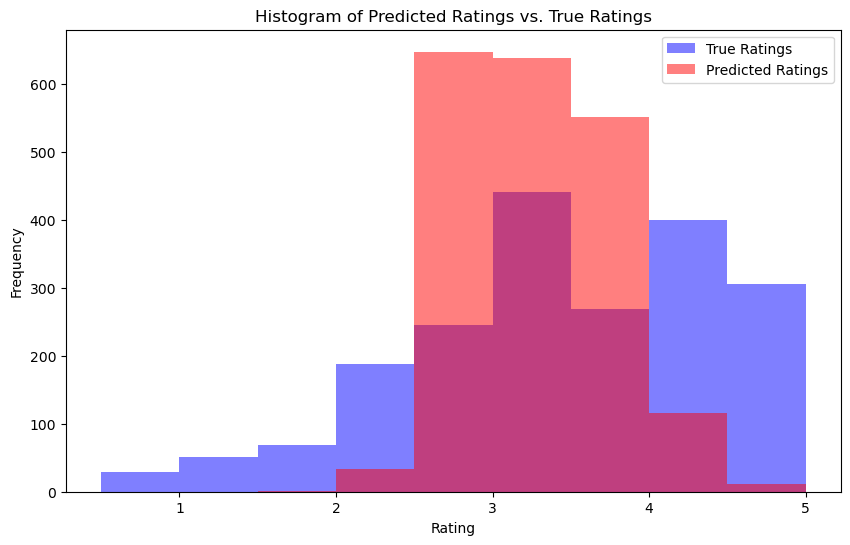

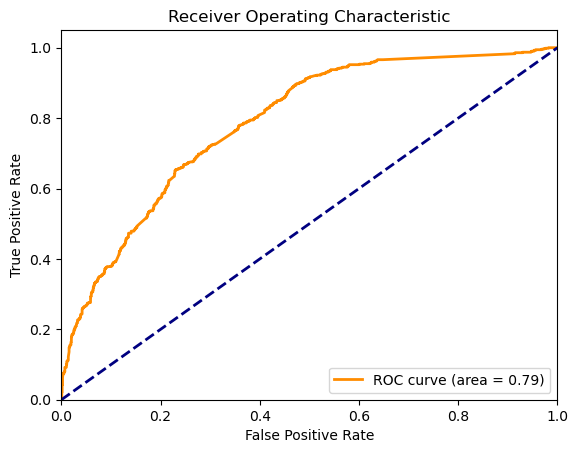

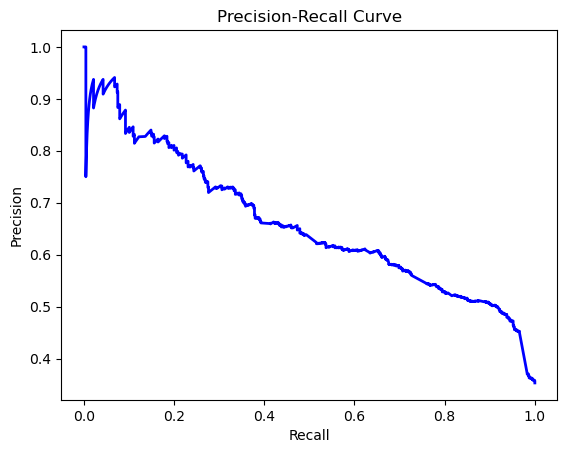

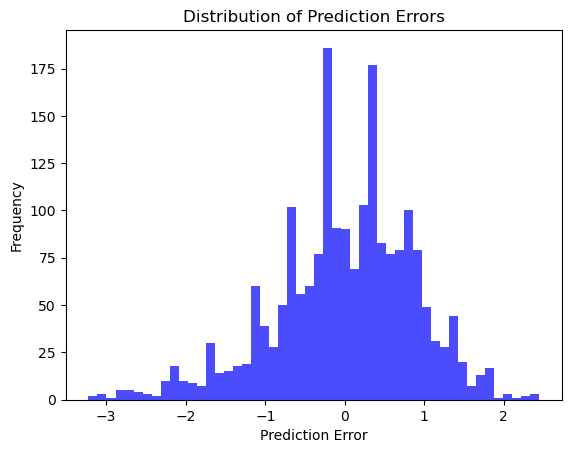

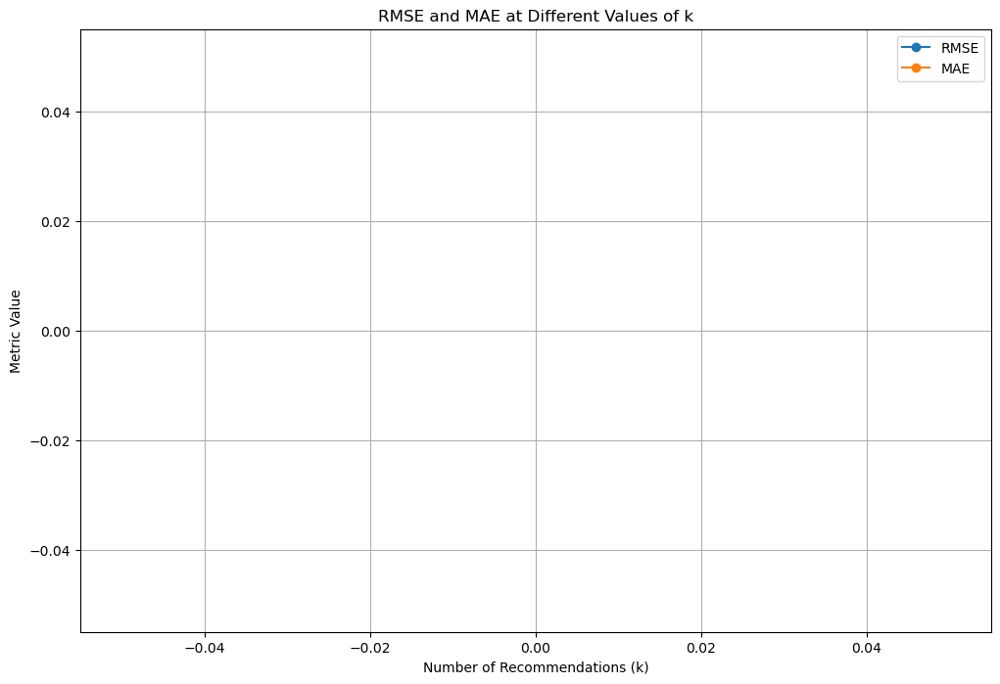

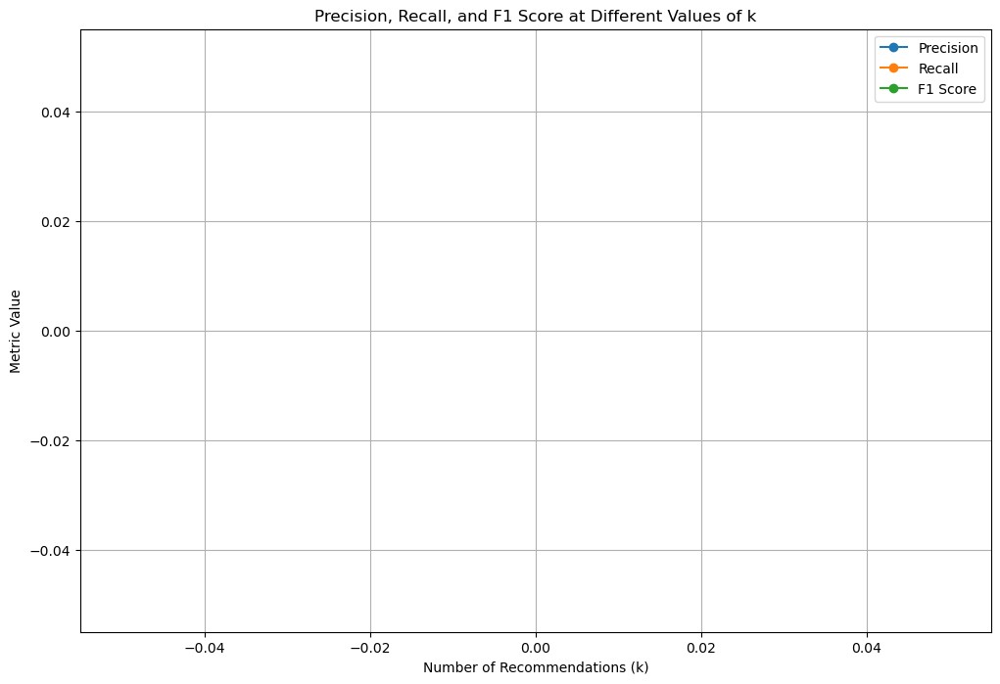

In [12]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.WARNING)  # Set logging level to WARNING

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(recommendations, df, ks):
    rmses, maes, precisions, recalls, f1s = [], [], [], [], []
    for k in ks:
        top_k_recommendations = {user: items[:k] for user, items in recommendations.items()}
        metrics = calculate_recommendation_metrics(top_k_recommendations, df)
        rmses.append(metrics['RMSE'])
        maes.append(metrics['MAE'])
        precisions.append(metrics['Precision'])
        recalls.append(metrics['Recall'])
        f1s.append(metrics['F1 Score'])

    plt.figure(figsize=(12, 8))
    plt.plot(ks, rmses, marker='o', label='RMSE')
    plt.plot(ks, maes, marker='o', label='MAE')
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel('Metric Value')
    plt.title('RMSE and MAE at Different Values of k')
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(12, 8))
    plt.plot(ks, precisions, marker='o', label='Precision')
    plt.plot(ks, recalls, marker='o', label='Recall')
    plt.plot(ks, f1s, marker='o', label='F1 Score')
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel('Metric Value')
    plt.title('Precision, Recall, and F1 Score at Different Values of k')
    plt.legend()
    plt.grid(True)
    plt.show()

def main():
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE, user_sample_size=USER_SAMPLE_SIZE)
    if merged_df is not None:
        logging.info("Data loaded successfully.")
        
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        return merged_df, movies_df, ratings_df
    else:
        logging.error("Data loading or processing failed.")
        return None, None, None

if __name__ == "__main__":
    merged_df, movies_df, ratings_df = main()
    if merged_df is not None:
        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
        
        param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
        gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
        gs.fit(data)
        
        best_params = gs.best_params['rmse']
        logging.info(f"Best parameters: {best_params}")

        algo = SVD(**best_params)
        algo.fit(trainset)
        
        predictions = algo.test(testset)
        model_metrics = calculate_model_metrics(predictions)
        for metric, value in model_metrics.items():
            logging.info(f"{metric}: {value:.4f}")
        
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(ratings_df)
        global_popularity = calculate_item_popularity(ratings_df)
        diversity_counts = {}

        recommendations = {}
        for user_id in ratings_df['userId'].unique()[:10]:
            recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts)
            movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
            recommendations_with_titles = [(item[0], item[1], title) for item, title in zip(recommendations[user_id], movie_titles)]
            print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations_with_titles}")

        expected_recommendations = get_expected_recommendations(merged_df)
        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        
        y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
        y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
        
        plot_roc_curve(y_true, y_scores)
        plot_precision_recall_curve(y_true, y_scores)
        plot_error_distribution(true_ratings, estimated_ratings)
        
        ks = list(range(1, N_RECOMMENDATIONS + 1))
        plot_metrics_at_k(recommendations, ratings_df, ks)


In [1]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.WARNING)  # Set logging level to WARNING

def load_data(movies_file, ratings_file):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    unique_users = ratings_df['userId'].drop_duplicates()
    actual_sample_size = min(user_sample_size, len(unique_users))
    sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
    return ratings_df[ratings_df['userId'].isin(sampled_users)]

def merge_datasets(ratings_df, movies_df):
    merged_df = pd.merge(ratings_df, movies_df, on='movieId')
    if 'release_year' not in merged_df.columns:
        merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
    return merged_df

def process_genres(merged_df):
    genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
    for genre in genre_list:
        genre_pattern = re.escape(genre)
        merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
    return merged_df

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def main():
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        merged_df = merge_datasets(ratings_df, movies_df)
        merged_df = process_genres(merged_df)
        merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)

        reader = Reader(rating_scale=(0.5, 5.0))
        data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
        trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
        
        param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
        gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
        gs.fit(data)
        
        best_params = gs.best_params['rmse']
        algo = SVD(**best_params)
        algo.fit(trainset)
        
        predictions = algo.test(testset)
        model_metrics = calculate_model_metrics(predictions)
        for metric, value in model_metrics.items():
            print(f"{metric}: {value:.4f}")
        
        item_features = get_item_features(merged_df)
        user_preferences = derive_user_preferences(merged_df)
        item_popularity = calculate_item_popularity(ratings_df)
        global_popularity = calculate_item_popularity(ratings_df)
        diversity_counts = {}

        recommendations = {}
        for user_id in ratings_df['userId'].unique()[:10]:
            recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
            movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
            recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
            print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
            for rec in recommendations_with_titles:
                print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

        expected_recommendations = get_expected_recommendations(merged_df)
        display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

        true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
        estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
        plot_histogram(true_ratings, estimated_ratings)
        
        y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
        y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
        
        plot_roc_curve(y_true, y_scores)
        plot_precision_recall_curve(y_true, y_scores)
        plot_error_distribution(true_ratings, estimated_ratings)
    else:
        print("Data loading or processing failed.")


RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545
Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.73, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 4.95, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 48780, Hybrid Score: 4.66, Title: Prestige, The (2006), CF Score: 4.67, CBF Score: 4.97, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.60, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 4.94, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 1204, Hybrid Score: 4.57, Title: Lawrence of Arabia (1962), CF Score: 4.46, CBF Score: 4.86, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.49, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.45, CBF Score: 4.96, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Top 5 recommendations for User 11:
Movie ID: 296, Hybrid Score: 4.71, Title: Pulp Fictio

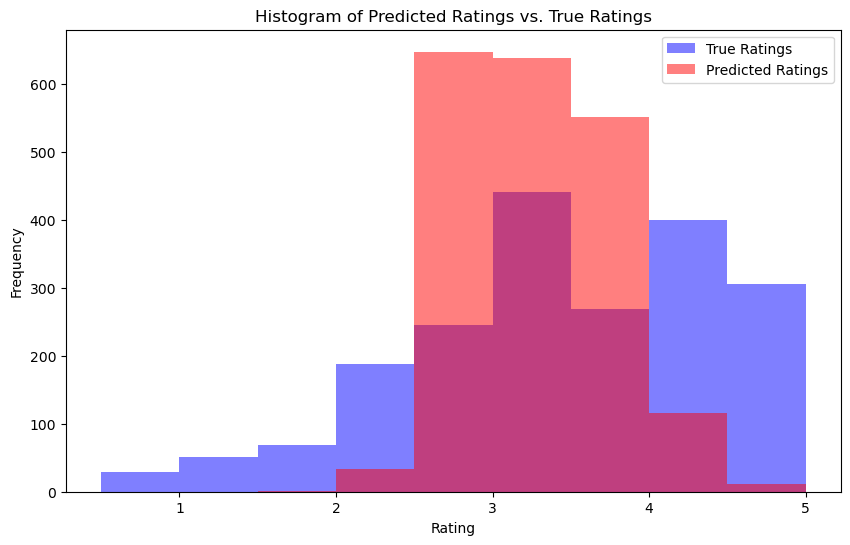

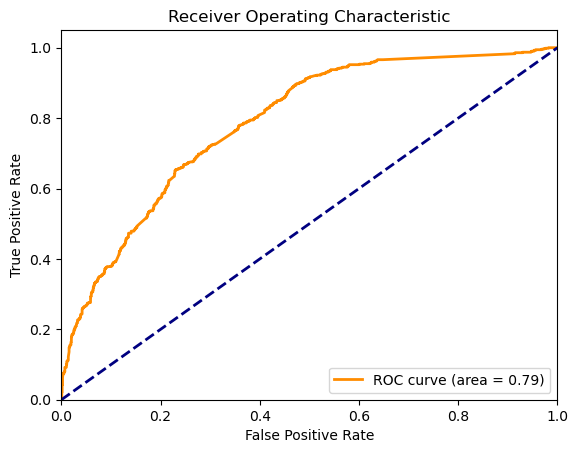

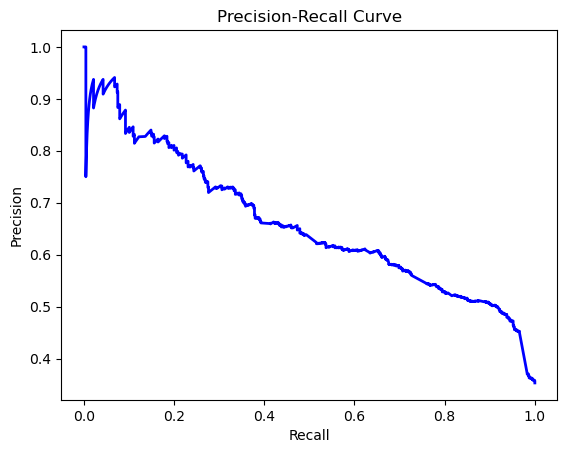

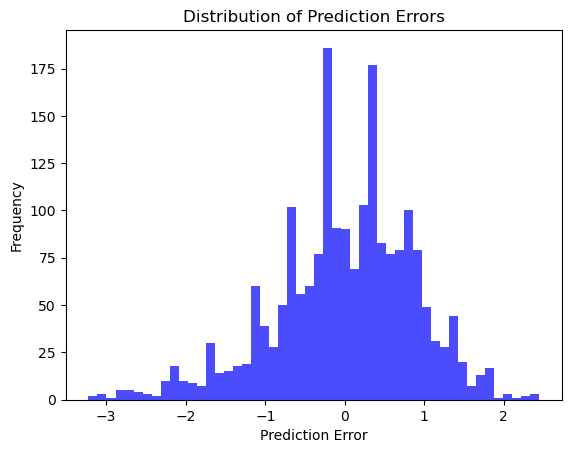

In [3]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)  # Set logging level to DEBUG for detailed information

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                content_score = np.mean(list(item_features.get(item_id, {}).values()))
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545
Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.73, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 4.95, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 48780, Hybrid Score: 4.66, Title: Prestige, The (2006), CF Score: 4.67, CBF Score: 4.97, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.60, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 4.94, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 1204, Hybrid Score: 4.57, Title: Lawrence of Arabia (1962), CF Score: 4.46, CBF Score: 4.86, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.49, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.45, CBF Score: 4.96, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Top 5 recommendations for User 11:
Movie ID: 296, Hybrid Score: 4.71, Title: Pulp Fictio

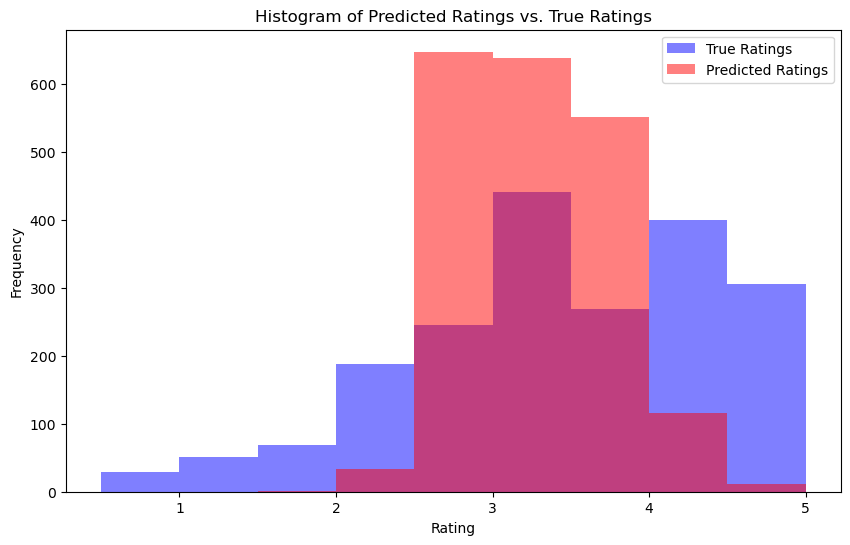

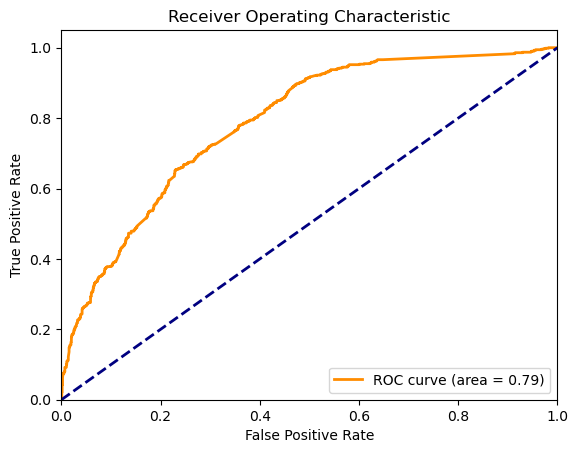

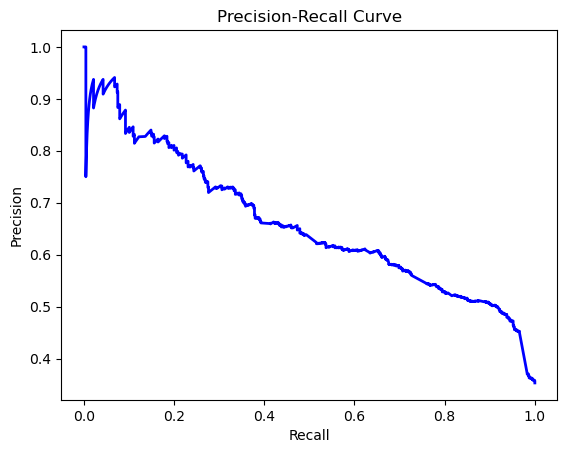

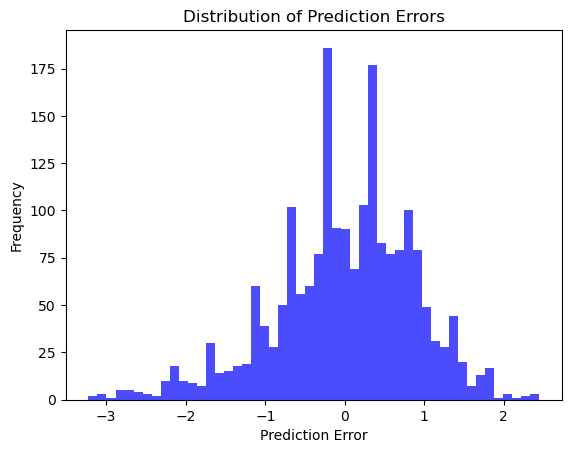

In [5]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                content_score = np.mean(list(item_features.get(item_id, {}).values()))
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.22, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.67, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 1961, Hybrid Score: 4.09, Title: Rain Man (1988), CF Score: 4.17, CBF Score: 4.26, Popularity Penalty: 0.2333, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.04, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 3.54, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 81845, Hybrid Score: 4.03, Title: King's Speech, The (2010), CF Score: 4.04, CBF Score: 4.27, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 2976, Hybrid Score: 4.00, Title: Bringing Out the Dead (1999), CF Score: 3.85, CBF Score: 4.27, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 2571, Hybrid Score: 4.15, Title: Matrix, The (1999), CF Score: 4.74, CBF Score: 4.04, Popularity Penalty: 0.6333, Diversity Penalty: 0.0000
Movie ID: 6874, Hybrid Score: 4.05, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.26, CBF Score: 4.11, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.03, Title: Black Swan (2010), CF Score: 4.17, CBF Score: 4.05, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.01, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 3.89, Title: American Beauty (1999), CF Score: 4.51, CBF Score: 3.63, Popularity Penalty: 0.5000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 6874, Hybrid Score: 4.16, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.59, CBF Score: 3.93, Popularity Penalty: 0.3000, Diversity Penalty: 0.0333
Movie ID: 2858, Hybrid Score: 4.10, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.47, Popularity Penalty: 0.5000, Diversity Penalty: 0.0667
Movie ID: 2571, Hybrid Score: 4.02, Title: Matrix, The (1999), CF Score: 4.72, CBF Score: 3.80, Popularity Penalty: 0.6333, Diversity Penalty: 0.0333
Movie ID: 1198, Hybrid Score: 3.95, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.32, CBF Score: 3.94, Popularity Penalty: 0.4333, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 3.95, Title: Lost in Translation (2003), CF Score: 4.63, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 82:
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.17, Popularity Penalty: 0.5000, Diversity Penalty: 0.1000
Movie ID: 6874, Hybrid Score: 3.79, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.31, CBF Score: 3.46, Popularity Penalty: 0.3000, Diversity Penalty: 0.0667
Movie ID: 3473, Hybrid Score: 3.71, Title: Jonah Who Will Be 25 in the Year 2000 (Jonas qui aura 25 ans en l'an 2000) (1976), CF Score: 3.39, CBF Score: 4.24, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.70, Title: Pulp Fiction (1994), CF Score: 4.69, CBF Score: 2.93, Popularity Penalty: 0.5333, Diversity Penalty: 0.0333
Movie ID: 318, Hybrid Score: 3.68, Title: Shawshank Redemption, The (1994), CF Score: 4.54, CBF Score: 3.30, Popularity Penalty: 0.7000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 132:
Movie ID: 2501, Hybrid Score: 4.31, Title: October Sky (1999), CF Score: 4.35, CBF Score: 4.38, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.31, Title: Black Swan (2010), CF Score: 4.74, CBF Score: 3.91, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 2542, Hybrid Score: 4.22, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 971, Hybrid Score: 4.19, Title: Cat on a Hot Tin Roof (1958), CF Score: 4.11, CBF Score: 4.36, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.16, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.76, CBF Score: 3.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 156:
Movie ID: 3543, Hybrid Score: 4.41, Title: Diner (1982), CF Score: 4.38, CBF Score: 4.50, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 44199, Hybrid Score: 4.28, Title: Inside Man (2006), CF Score: 5.00, CBF Score: 3.45, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 5500, Hybrid Score: 4.26, Title: Top Secret! (1984), CF Score: 4.16, CBF Score: 4.44, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7451, Hybrid Score: 4.19, Title: Mean Girls (2004), CF Score: 4.11, CBF Score: 4.44, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 2501, Hybrid Score: 4.17, Title: October Sky (1999), CF Score: 4.08, CBF Score: 4.48, Popularity Penalty: 0.1000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 164:
Movie ID: 2571, Hybrid Score: 4.25, Title: Matrix, The (1999), CF Score: 4.80, CBF Score: 4.29, Popularity Penalty: 0.6333, Diversity Penalty: 0.0667
Movie ID: 6874, Hybrid Score: 4.10, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.62, CBF Score: 3.82, Popularity Penalty: 0.3000, Diversity Penalty: 0.1000
Movie ID: 3030, Hybrid Score: 3.97, Title: Yojimbo (1961), CF Score: 3.68, CBF Score: 4.53, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1374, Hybrid Score: 3.96, Title: Star Trek II: The Wrath of Khan (1982), CF Score: 3.86, CBF Score: 4.28, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.93, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 3.78, CBF Score: 4.27, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 177:
Movie ID: 4226, Hybrid Score: 4.17, Title: Memento (2000), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2542, Hybrid Score: 4.12, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 4.86, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 3152, Hybrid Score: 4.00, Title: Last Picture Show, The (1971), CF Score: 3.84, CBF Score: 4.28, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 171495, Hybrid Score: 4.00, Title: Cosmos, CF Score: 3.36, CBF Score: 5.00, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 1883, Hybrid Score: 3.94, Title: Bulworth (1998), CF Score: 4.09, CBF Score: 3.80, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 193:
Movie ID: 529, Hybrid Score: 4.25, Title: Searching for Bobby Fischer (1993), CF Score: 4.26, CBF Score: 4.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 4.22, Title: Lost in Translation (2003), CF Score: 4.88, CBF Score: 3.60, Popularity Penalty: 0.2667, Diversity Penalty: 0.0333
Movie ID: 1596, Hybrid Score: 4.18, Title: Career Girls (1997), CF Score: 4.03, CBF Score: 4.45, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.12, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.80, CBF Score: 3.52, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 3317, Hybrid Score: 4.11, Title: Wonder Boys (2000), CF Score: 4.25, CBF Score: 4.07, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 197:
Movie ID: 2858, Hybrid Score: 4.21, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.83, Popularity Penalty: 0.5000, Diversity Penalty: 0.1333
Movie ID: 529, Hybrid Score: 4.01, Title: Searching for Bobby Fischer (1993), CF Score: 3.98, CBF Score: 4.30, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 4973, Hybrid Score: 3.86, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.28, CBF Score: 3.58, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 3160, Hybrid Score: 3.82, Title: Magnolia (1999), CF Score: 3.60, CBF Score: 4.30, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 1207, Hybrid Score: 3.81, Title: To Kill a Mockingbird (1962), CF Score: 3.60, CBF Score: 4.29, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Catalog Coverage: 0.35%
Average Novelty: 7.8400
Personalization: 0.9291
Serendipity: -3965195.3292
Intra-list Diversity: nan
Hit Rate: 0.0000
Mean Recipro

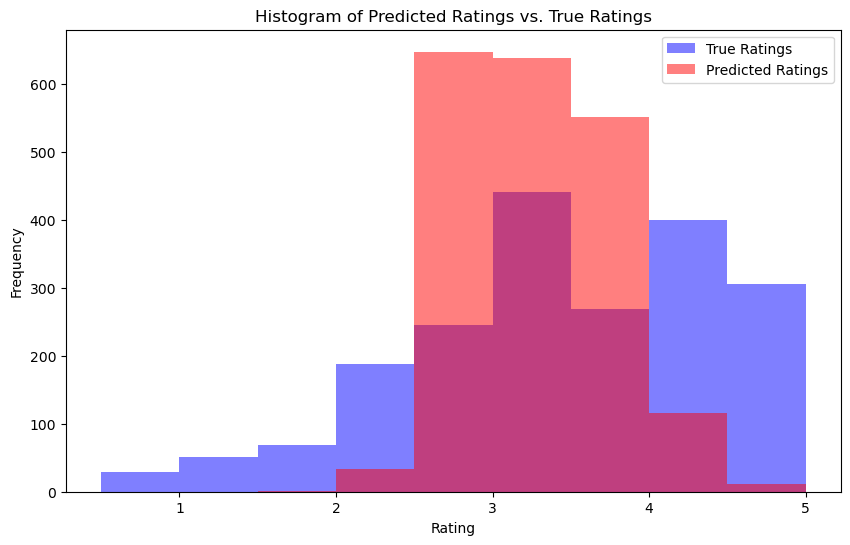

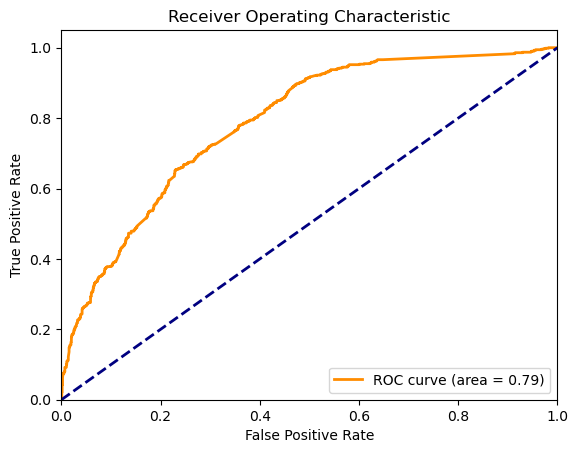

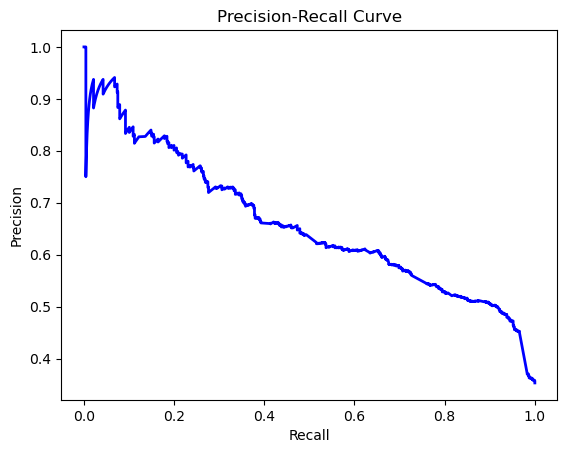

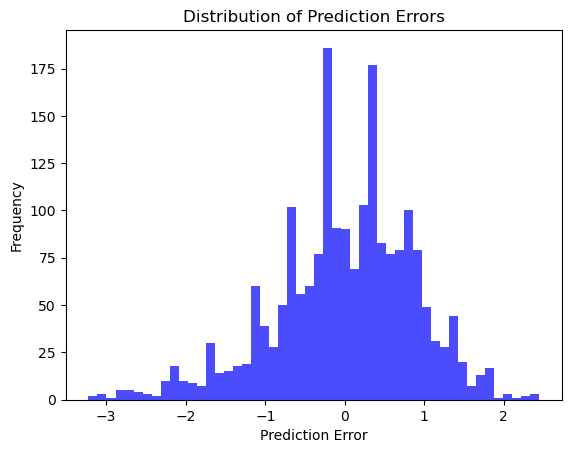

In [7]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])
                content_score = 1 - cosine(user_pref_vector, item_feature_vector)
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0


def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()




# NEWST BEST ONE SO FAR!!!#

RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.22, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.67, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 1961, Hybrid Score: 4.09, Title: Rain Man (1988), CF Score: 4.17, CBF Score: 4.26, Popularity Penalty: 0.2333, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.04, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 3.54, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 81845, Hybrid Score: 4.03, Title: King's Speech, The (2010), CF Score: 4.04, CBF Score: 4.27, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 2976, Hybrid Score: 4.00, Title: Bringing Out the Dead (1999), CF Score: 3.85, CBF Score: 4.27, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 2571, Hybrid Score: 4.15, Title: Matrix, The (1999), CF Score: 4.74, CBF Score: 4.04, Popularity Penalty: 0.6333, Diversity Penalty: 0.0000
Movie ID: 6874, Hybrid Score: 4.05, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.26, CBF Score: 4.11, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.03, Title: Black Swan (2010), CF Score: 4.17, CBF Score: 4.05, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.01, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 3.89, Title: American Beauty (1999), CF Score: 4.51, CBF Score: 3.63, Popularity Penalty: 0.5000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 6874, Hybrid Score: 4.16, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.59, CBF Score: 3.93, Popularity Penalty: 0.3000, Diversity Penalty: 0.0333
Movie ID: 2858, Hybrid Score: 4.10, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.47, Popularity Penalty: 0.5000, Diversity Penalty: 0.0667
Movie ID: 2571, Hybrid Score: 4.02, Title: Matrix, The (1999), CF Score: 4.72, CBF Score: 3.80, Popularity Penalty: 0.6333, Diversity Penalty: 0.0333
Movie ID: 1198, Hybrid Score: 3.95, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.32, CBF Score: 3.94, Popularity Penalty: 0.4333, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 3.95, Title: Lost in Translation (2003), CF Score: 4.63, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 82:
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.17, Popularity Penalty: 0.5000, Diversity Penalty: 0.1000
Movie ID: 6874, Hybrid Score: 3.79, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.31, CBF Score: 3.46, Popularity Penalty: 0.3000, Diversity Penalty: 0.0667
Movie ID: 3473, Hybrid Score: 3.71, Title: Jonah Who Will Be 25 in the Year 2000 (Jonas qui aura 25 ans en l'an 2000) (1976), CF Score: 3.39, CBF Score: 4.24, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.70, Title: Pulp Fiction (1994), CF Score: 4.69, CBF Score: 2.93, Popularity Penalty: 0.5333, Diversity Penalty: 0.0333
Movie ID: 318, Hybrid Score: 3.68, Title: Shawshank Redemption, The (1994), CF Score: 4.54, CBF Score: 3.30, Popularity Penalty: 0.7000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 132:
Movie ID: 2501, Hybrid Score: 4.31, Title: October Sky (1999), CF Score: 4.35, CBF Score: 4.38, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.31, Title: Black Swan (2010), CF Score: 4.74, CBF Score: 3.91, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 2542, Hybrid Score: 4.22, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 971, Hybrid Score: 4.19, Title: Cat on a Hot Tin Roof (1958), CF Score: 4.11, CBF Score: 4.36, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.16, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.76, CBF Score: 3.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 156:
Movie ID: 3543, Hybrid Score: 4.41, Title: Diner (1982), CF Score: 4.38, CBF Score: 4.50, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 44199, Hybrid Score: 4.28, Title: Inside Man (2006), CF Score: 5.00, CBF Score: 3.45, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 5500, Hybrid Score: 4.26, Title: Top Secret! (1984), CF Score: 4.16, CBF Score: 4.44, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7451, Hybrid Score: 4.19, Title: Mean Girls (2004), CF Score: 4.11, CBF Score: 4.44, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 2501, Hybrid Score: 4.17, Title: October Sky (1999), CF Score: 4.08, CBF Score: 4.48, Popularity Penalty: 0.1000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 164:
Movie ID: 2571, Hybrid Score: 4.25, Title: Matrix, The (1999), CF Score: 4.80, CBF Score: 4.29, Popularity Penalty: 0.6333, Diversity Penalty: 0.0667
Movie ID: 6874, Hybrid Score: 4.10, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.62, CBF Score: 3.82, Popularity Penalty: 0.3000, Diversity Penalty: 0.1000
Movie ID: 3030, Hybrid Score: 3.97, Title: Yojimbo (1961), CF Score: 3.68, CBF Score: 4.53, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1374, Hybrid Score: 3.96, Title: Star Trek II: The Wrath of Khan (1982), CF Score: 3.86, CBF Score: 4.28, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.93, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 3.78, CBF Score: 4.27, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 177:
Movie ID: 4226, Hybrid Score: 4.17, Title: Memento (2000), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2542, Hybrid Score: 4.12, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 4.86, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 3152, Hybrid Score: 4.00, Title: Last Picture Show, The (1971), CF Score: 3.84, CBF Score: 4.28, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 171495, Hybrid Score: 4.00, Title: Cosmos, CF Score: 3.36, CBF Score: 5.00, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 1883, Hybrid Score: 3.94, Title: Bulworth (1998), CF Score: 4.09, CBF Score: 3.80, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 193:
Movie ID: 529, Hybrid Score: 4.25, Title: Searching for Bobby Fischer (1993), CF Score: 4.26, CBF Score: 4.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 4.22, Title: Lost in Translation (2003), CF Score: 4.88, CBF Score: 3.60, Popularity Penalty: 0.2667, Diversity Penalty: 0.0333
Movie ID: 1596, Hybrid Score: 4.18, Title: Career Girls (1997), CF Score: 4.03, CBF Score: 4.45, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.12, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.80, CBF Score: 3.52, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 3317, Hybrid Score: 4.11, Title: Wonder Boys (2000), CF Score: 4.25, CBF Score: 4.07, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 197:
Movie ID: 2858, Hybrid Score: 4.21, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.83, Popularity Penalty: 0.5000, Diversity Penalty: 0.1333
Movie ID: 529, Hybrid Score: 4.01, Title: Searching for Bobby Fischer (1993), CF Score: 3.98, CBF Score: 4.30, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 4973, Hybrid Score: 3.86, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.28, CBF Score: 3.58, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 3160, Hybrid Score: 3.82, Title: Magnolia (1999), CF Score: 3.60, CBF Score: 4.30, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 1207, Hybrid Score: 3.81, Title: To Kill a Mockingbird (1962), CF Score: 3.60, CBF Score: 4.29, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Catalog Coverage: 0.35%
Average Novelty: 7.8400
Personalization: 0.9291
Serendipity: -3965195.3292
Intra-list Diversity: nan
Hit Rate: 0.0000
Mean Recipro

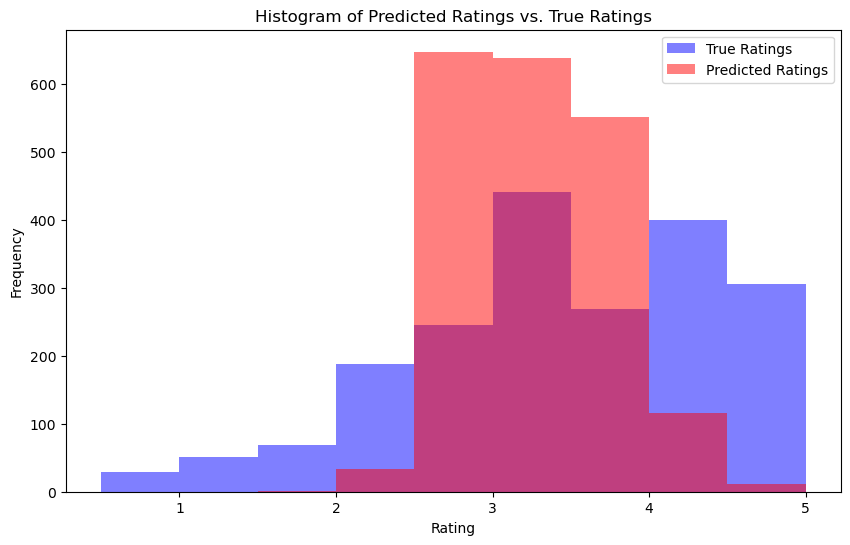

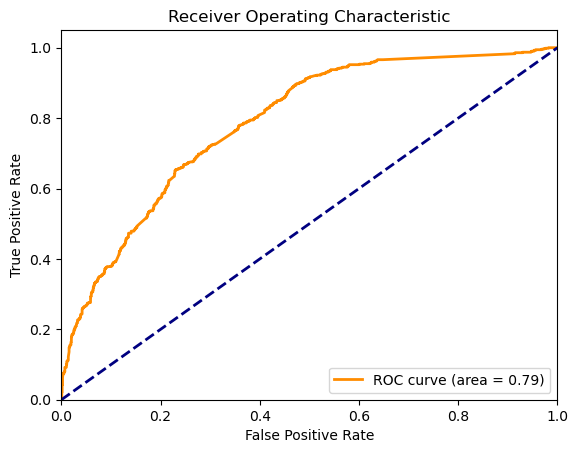

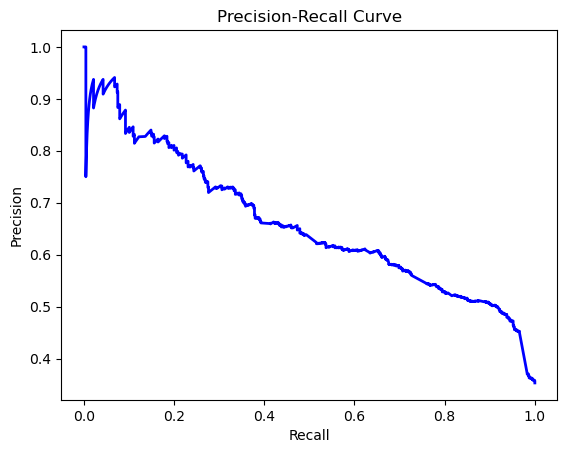

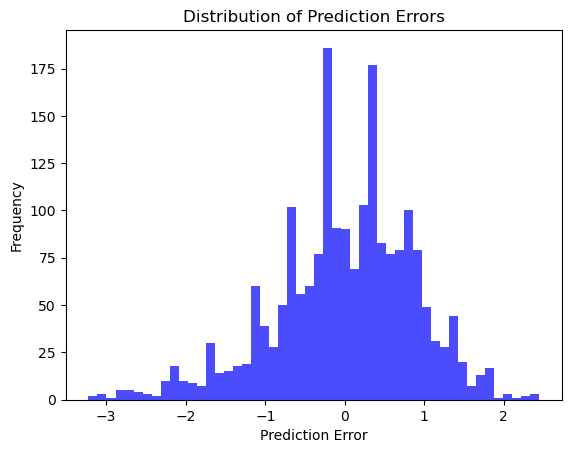

In [9]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])
                content_score = 1 - cosine(user_pref_vector, item_feature_vector)
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.22, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.67, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 1961, Hybrid Score: 4.09, Title: Rain Man (1988), CF Score: 4.17, CBF Score: 4.26, Popularity Penalty: 0.2333, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.04, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 3.54, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 81845, Hybrid Score: 4.03, Title: King's Speech, The (2010), CF Score: 4.04, CBF Score: 4.27, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 2976, Hybrid Score: 4.00, Title: Bringing Out the Dead (1999), CF Score: 3.85, CBF Score: 4.27, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 2571, Hybrid Score: 4.15, Title: Matrix, The (1999), CF Score: 4.74, CBF Score: 4.04, Popularity Penalty: 0.6333, Diversity Penalty: 0.0000
Movie ID: 6874, Hybrid Score: 4.05, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.26, CBF Score: 4.11, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.03, Title: Black Swan (2010), CF Score: 4.17, CBF Score: 4.05, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.01, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 3.89, Title: American Beauty (1999), CF Score: 4.51, CBF Score: 3.63, Popularity Penalty: 0.5000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 6874, Hybrid Score: 4.16, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.59, CBF Score: 3.93, Popularity Penalty: 0.3000, Diversity Penalty: 0.0333
Movie ID: 2858, Hybrid Score: 4.10, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.47, Popularity Penalty: 0.5000, Diversity Penalty: 0.0667
Movie ID: 2571, Hybrid Score: 4.02, Title: Matrix, The (1999), CF Score: 4.72, CBF Score: 3.80, Popularity Penalty: 0.6333, Diversity Penalty: 0.0333
Movie ID: 1198, Hybrid Score: 3.95, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.32, CBF Score: 3.94, Popularity Penalty: 0.4333, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 3.95, Title: Lost in Translation (2003), CF Score: 4.63, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 82:
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.17, Popularity Penalty: 0.5000, Diversity Penalty: 0.1000
Movie ID: 6874, Hybrid Score: 3.79, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.31, CBF Score: 3.46, Popularity Penalty: 0.3000, Diversity Penalty: 0.0667
Movie ID: 3473, Hybrid Score: 3.71, Title: Jonah Who Will Be 25 in the Year 2000 (Jonas qui aura 25 ans en l'an 2000) (1976), CF Score: 3.39, CBF Score: 4.24, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.70, Title: Pulp Fiction (1994), CF Score: 4.69, CBF Score: 2.93, Popularity Penalty: 0.5333, Diversity Penalty: 0.0333
Movie ID: 318, Hybrid Score: 3.68, Title: Shawshank Redemption, The (1994), CF Score: 4.54, CBF Score: 3.30, Popularity Penalty: 0.7000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 132:
Movie ID: 2501, Hybrid Score: 4.31, Title: October Sky (1999), CF Score: 4.35, CBF Score: 4.38, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.31, Title: Black Swan (2010), CF Score: 4.74, CBF Score: 3.91, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 2542, Hybrid Score: 4.22, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 971, Hybrid Score: 4.19, Title: Cat on a Hot Tin Roof (1958), CF Score: 4.11, CBF Score: 4.36, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.16, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.76, CBF Score: 3.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 156:
Movie ID: 3543, Hybrid Score: 4.41, Title: Diner (1982), CF Score: 4.38, CBF Score: 4.50, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 44199, Hybrid Score: 4.28, Title: Inside Man (2006), CF Score: 5.00, CBF Score: 3.45, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 5500, Hybrid Score: 4.26, Title: Top Secret! (1984), CF Score: 4.16, CBF Score: 4.44, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7451, Hybrid Score: 4.19, Title: Mean Girls (2004), CF Score: 4.11, CBF Score: 4.44, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 2501, Hybrid Score: 4.17, Title: October Sky (1999), CF Score: 4.08, CBF Score: 4.48, Popularity Penalty: 0.1000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 164:
Movie ID: 2571, Hybrid Score: 4.25, Title: Matrix, The (1999), CF Score: 4.80, CBF Score: 4.29, Popularity Penalty: 0.6333, Diversity Penalty: 0.0667
Movie ID: 6874, Hybrid Score: 4.10, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.62, CBF Score: 3.82, Popularity Penalty: 0.3000, Diversity Penalty: 0.1000
Movie ID: 3030, Hybrid Score: 3.97, Title: Yojimbo (1961), CF Score: 3.68, CBF Score: 4.53, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1374, Hybrid Score: 3.96, Title: Star Trek II: The Wrath of Khan (1982), CF Score: 3.86, CBF Score: 4.28, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.93, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 3.78, CBF Score: 4.27, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 177:
Movie ID: 4226, Hybrid Score: 4.17, Title: Memento (2000), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2542, Hybrid Score: 4.12, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 4.86, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 3152, Hybrid Score: 4.00, Title: Last Picture Show, The (1971), CF Score: 3.84, CBF Score: 4.28, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 171495, Hybrid Score: 4.00, Title: Cosmos, CF Score: 3.36, CBF Score: 5.00, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 1883, Hybrid Score: 3.94, Title: Bulworth (1998), CF Score: 4.09, CBF Score: 3.80, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 193:
Movie ID: 529, Hybrid Score: 4.25, Title: Searching for Bobby Fischer (1993), CF Score: 4.26, CBF Score: 4.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 4.22, Title: Lost in Translation (2003), CF Score: 4.88, CBF Score: 3.60, Popularity Penalty: 0.2667, Diversity Penalty: 0.0333
Movie ID: 1596, Hybrid Score: 4.18, Title: Career Girls (1997), CF Score: 4.03, CBF Score: 4.45, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.12, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.80, CBF Score: 3.52, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 3317, Hybrid Score: 4.11, Title: Wonder Boys (2000), CF Score: 4.25, CBF Score: 4.07, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 197:
Movie ID: 2858, Hybrid Score: 4.21, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.83, Popularity Penalty: 0.5000, Diversity Penalty: 0.1333
Movie ID: 529, Hybrid Score: 4.01, Title: Searching for Bobby Fischer (1993), CF Score: 3.98, CBF Score: 4.30, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 4973, Hybrid Score: 3.86, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.28, CBF Score: 3.58, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 3160, Hybrid Score: 3.82, Title: Magnolia (1999), CF Score: 3.60, CBF Score: 4.30, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 1207, Hybrid Score: 3.81, Title: To Kill a Mockingbird (1962), CF Score: 3.60, CBF Score: 4.29, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Catalog Coverage: 0.35%
Average Novelty: 7.8400
Personalization: 0.9291
Serendipity: -3965195.3292
Intra-list Diversity: 0.9000
Hit Rate: 0.0000
Mean Reci

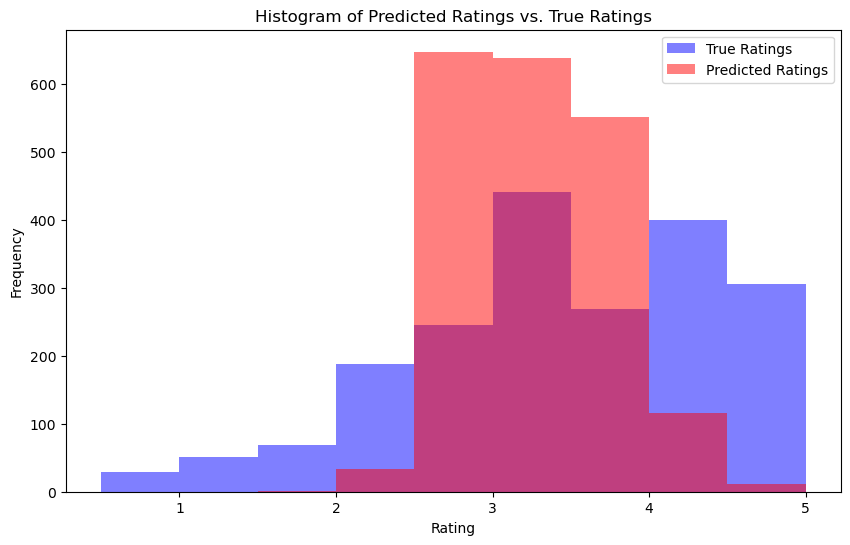

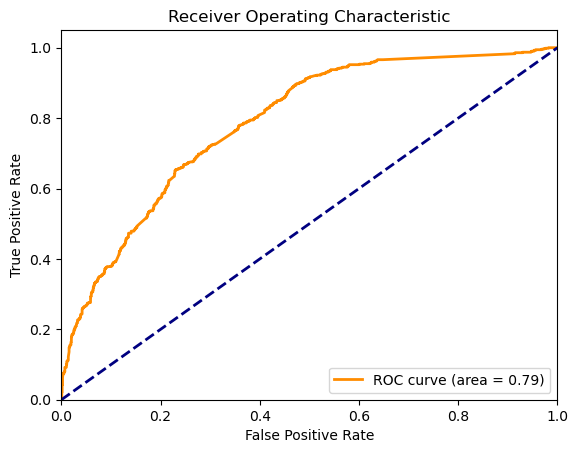

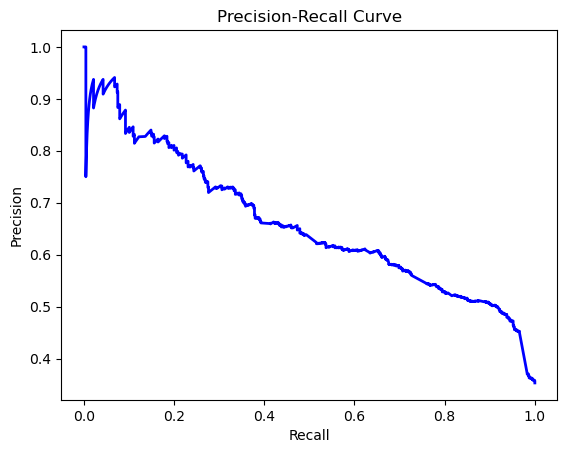

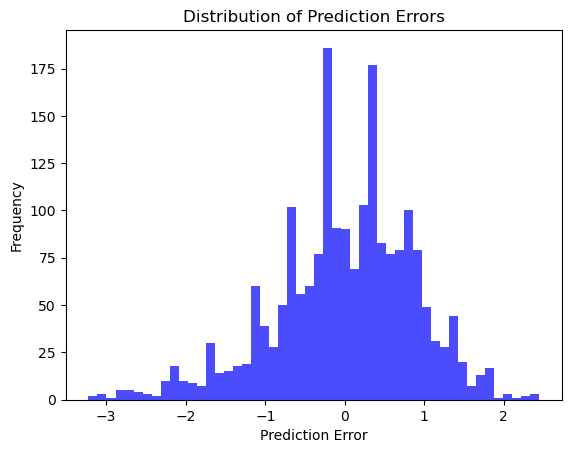

In [14]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import cosine, pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    content_score = 1 - cosine(user_pref_vector, item_feature_vector)
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances) if not np.isnan(np.mean(distances)) else 0)
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.22, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.67, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 1961, Hybrid Score: 4.09, Title: Rain Man (1988), CF Score: 4.17, CBF Score: 4.26, Popularity Penalty: 0.2333, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.04, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 3.54, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 81845, Hybrid Score: 4.03, Title: King's Speech, The (2010), CF Score: 4.04, CBF Score: 4.27, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 2976, Hybrid Score: 4.00, Title: Bringing Out the Dead (1999), CF Score: 3.85, CBF Score: 4.27, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 2571, Hybrid Score: 4.15, Title: Matrix, The (1999), CF Score: 4.74, CBF Score: 4.04, Popularity Penalty: 0.6333, Diversity Penalty: 0.0000
Movie ID: 6874, Hybrid Score: 4.05, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.26, CBF Score: 4.11, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.03, Title: Black Swan (2010), CF Score: 4.17, CBF Score: 4.05, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.01, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 3.89, Title: American Beauty (1999), CF Score: 4.51, CBF Score: 3.63, Popularity Penalty: 0.5000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 6874, Hybrid Score: 4.16, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.59, CBF Score: 3.93, Popularity Penalty: 0.3000, Diversity Penalty: 0.0333
Movie ID: 2858, Hybrid Score: 4.10, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.47, Popularity Penalty: 0.5000, Diversity Penalty: 0.0667
Movie ID: 2571, Hybrid Score: 4.02, Title: Matrix, The (1999), CF Score: 4.72, CBF Score: 3.80, Popularity Penalty: 0.6333, Diversity Penalty: 0.0333
Movie ID: 1198, Hybrid Score: 3.95, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.32, CBF Score: 3.94, Popularity Penalty: 0.4333, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 3.95, Title: Lost in Translation (2003), CF Score: 4.63, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 82:
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.17, Popularity Penalty: 0.5000, Diversity Penalty: 0.1000
Movie ID: 6874, Hybrid Score: 3.79, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.31, CBF Score: 3.46, Popularity Penalty: 0.3000, Diversity Penalty: 0.0667
Movie ID: 3473, Hybrid Score: 3.71, Title: Jonah Who Will Be 25 in the Year 2000 (Jonas qui aura 25 ans en l'an 2000) (1976), CF Score: 3.39, CBF Score: 4.24, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.70, Title: Pulp Fiction (1994), CF Score: 4.69, CBF Score: 2.93, Popularity Penalty: 0.5333, Diversity Penalty: 0.0333
Movie ID: 318, Hybrid Score: 3.68, Title: Shawshank Redemption, The (1994), CF Score: 4.54, CBF Score: 3.30, Popularity Penalty: 0.7000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 132:
Movie ID: 2501, Hybrid Score: 4.31, Title: October Sky (1999), CF Score: 4.35, CBF Score: 4.38, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.31, Title: Black Swan (2010), CF Score: 4.74, CBF Score: 3.91, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 2542, Hybrid Score: 4.22, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 971, Hybrid Score: 4.19, Title: Cat on a Hot Tin Roof (1958), CF Score: 4.11, CBF Score: 4.36, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.16, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.76, CBF Score: 3.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 156:
Movie ID: 3543, Hybrid Score: 4.41, Title: Diner (1982), CF Score: 4.38, CBF Score: 4.50, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 44199, Hybrid Score: 4.28, Title: Inside Man (2006), CF Score: 5.00, CBF Score: 3.45, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 5500, Hybrid Score: 4.26, Title: Top Secret! (1984), CF Score: 4.16, CBF Score: 4.44, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7451, Hybrid Score: 4.19, Title: Mean Girls (2004), CF Score: 4.11, CBF Score: 4.44, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 2501, Hybrid Score: 4.17, Title: October Sky (1999), CF Score: 4.08, CBF Score: 4.48, Popularity Penalty: 0.1000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 164:
Movie ID: 2571, Hybrid Score: 4.25, Title: Matrix, The (1999), CF Score: 4.80, CBF Score: 4.29, Popularity Penalty: 0.6333, Diversity Penalty: 0.0667
Movie ID: 6874, Hybrid Score: 4.10, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.62, CBF Score: 3.82, Popularity Penalty: 0.3000, Diversity Penalty: 0.1000
Movie ID: 3030, Hybrid Score: 3.97, Title: Yojimbo (1961), CF Score: 3.68, CBF Score: 4.53, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1374, Hybrid Score: 3.96, Title: Star Trek II: The Wrath of Khan (1982), CF Score: 3.86, CBF Score: 4.28, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.93, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 3.78, CBF Score: 4.27, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 177:
Movie ID: 4226, Hybrid Score: 4.17, Title: Memento (2000), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2542, Hybrid Score: 4.12, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 4.86, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 3152, Hybrid Score: 4.00, Title: Last Picture Show, The (1971), CF Score: 3.84, CBF Score: 4.28, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 171495, Hybrid Score: 4.00, Title: Cosmos, CF Score: 3.36, CBF Score: 5.00, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 1883, Hybrid Score: 3.94, Title: Bulworth (1998), CF Score: 4.09, CBF Score: 3.80, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 193:
Movie ID: 529, Hybrid Score: 4.25, Title: Searching for Bobby Fischer (1993), CF Score: 4.26, CBF Score: 4.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 4.22, Title: Lost in Translation (2003), CF Score: 4.88, CBF Score: 3.60, Popularity Penalty: 0.2667, Diversity Penalty: 0.0333
Movie ID: 1596, Hybrid Score: 4.18, Title: Career Girls (1997), CF Score: 4.03, CBF Score: 4.45, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.12, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.80, CBF Score: 3.52, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 3317, Hybrid Score: 4.11, Title: Wonder Boys (2000), CF Score: 4.25, CBF Score: 4.07, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 197:
Movie ID: 2858, Hybrid Score: 4.21, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.83, Popularity Penalty: 0.5000, Diversity Penalty: 0.1333
Movie ID: 529, Hybrid Score: 4.01, Title: Searching for Bobby Fischer (1993), CF Score: 3.98, CBF Score: 4.30, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 4973, Hybrid Score: 3.86, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.28, CBF Score: 3.58, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 3160, Hybrid Score: 3.82, Title: Magnolia (1999), CF Score: 3.60, CBF Score: 4.30, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 1207, Hybrid Score: 3.81, Title: To Kill a Mockingbird (1962), CF Score: 3.60, CBF Score: 4.29, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Catalog Coverage: 0.35%
Average Novelty: 7.8400
Personalization: 0.9291
Serendipity: -3965195.3292
Intra-list Diversity: 0.9000
Hit Rate: 0.0000
Mean Reci

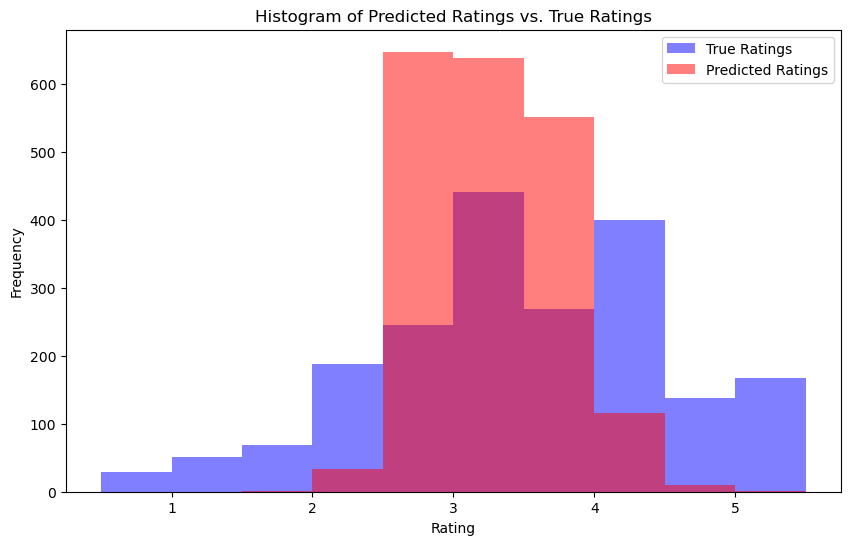

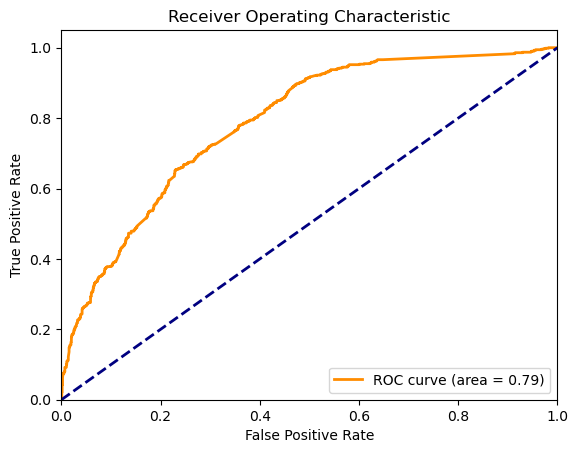

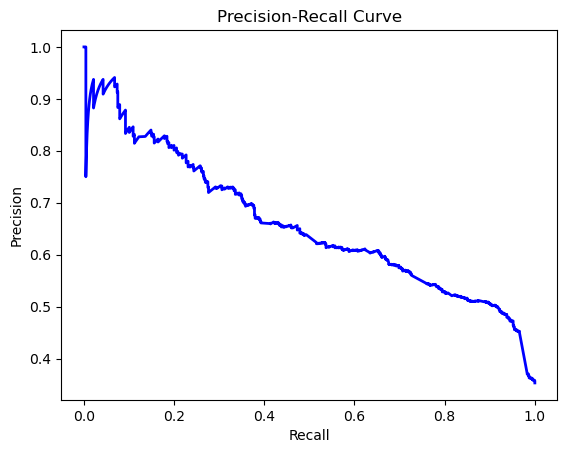

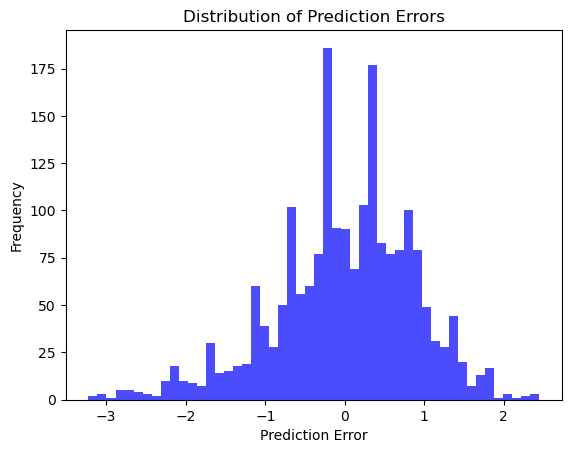

In [17]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import cosine, pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = cosine(user_pref_vector, item_feature_vector)
                    content_score = 1 - similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances) if not np.isnan(np.mean(distances)) else 0)
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.22, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.67, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 1961, Hybrid Score: 4.09, Title: Rain Man (1988), CF Score: 4.17, CBF Score: 4.26, Popularity Penalty: 0.2333, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.04, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 3.54, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 81845, Hybrid Score: 4.03, Title: King's Speech, The (2010), CF Score: 4.04, CBF Score: 4.27, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 2976, Hybrid Score: 4.00, Title: Bringing Out the Dead (1999), CF Score: 3.85, CBF Score: 4.27, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 2571, Hybrid Score: 4.15, Title: Matrix, The (1999), CF Score: 4.74, CBF Score: 4.04, Popularity Penalty: 0.6333, Diversity Penalty: 0.0000
Movie ID: 6874, Hybrid Score: 4.05, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.26, CBF Score: 4.11, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.03, Title: Black Swan (2010), CF Score: 4.17, CBF Score: 4.05, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.01, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 3.89, Title: American Beauty (1999), CF Score: 4.51, CBF Score: 3.63, Popularity Penalty: 0.5000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 6874, Hybrid Score: 4.16, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.59, CBF Score: 3.93, Popularity Penalty: 0.3000, Diversity Penalty: 0.0333
Movie ID: 2858, Hybrid Score: 4.10, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.47, Popularity Penalty: 0.5000, Diversity Penalty: 0.0667
Movie ID: 2571, Hybrid Score: 4.02, Title: Matrix, The (1999), CF Score: 4.72, CBF Score: 3.80, Popularity Penalty: 0.6333, Diversity Penalty: 0.0333
Movie ID: 1198, Hybrid Score: 3.95, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.32, CBF Score: 3.94, Popularity Penalty: 0.4333, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 3.95, Title: Lost in Translation (2003), CF Score: 4.63, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 82:
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.17, Popularity Penalty: 0.5000, Diversity Penalty: 0.1000
Movie ID: 6874, Hybrid Score: 3.79, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.31, CBF Score: 3.46, Popularity Penalty: 0.3000, Diversity Penalty: 0.0667
Movie ID: 3473, Hybrid Score: 3.71, Title: Jonah Who Will Be 25 in the Year 2000 (Jonas qui aura 25 ans en l'an 2000) (1976), CF Score: 3.39, CBF Score: 4.24, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.70, Title: Pulp Fiction (1994), CF Score: 4.69, CBF Score: 2.93, Popularity Penalty: 0.5333, Diversity Penalty: 0.0333
Movie ID: 318, Hybrid Score: 3.68, Title: Shawshank Redemption, The (1994), CF Score: 4.54, CBF Score: 3.30, Popularity Penalty: 0.7000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 132:
Movie ID: 2501, Hybrid Score: 4.31, Title: October Sky (1999), CF Score: 4.35, CBF Score: 4.38, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.31, Title: Black Swan (2010), CF Score: 4.74, CBF Score: 3.91, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 2542, Hybrid Score: 4.22, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 971, Hybrid Score: 4.19, Title: Cat on a Hot Tin Roof (1958), CF Score: 4.11, CBF Score: 4.36, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.16, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.76, CBF Score: 3.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 156:
Movie ID: 3543, Hybrid Score: 4.41, Title: Diner (1982), CF Score: 4.38, CBF Score: 4.50, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 44199, Hybrid Score: 4.28, Title: Inside Man (2006), CF Score: 5.00, CBF Score: 3.45, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 5500, Hybrid Score: 4.26, Title: Top Secret! (1984), CF Score: 4.16, CBF Score: 4.44, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7451, Hybrid Score: 4.19, Title: Mean Girls (2004), CF Score: 4.11, CBF Score: 4.44, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 2501, Hybrid Score: 4.17, Title: October Sky (1999), CF Score: 4.08, CBF Score: 4.48, Popularity Penalty: 0.1000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 164:
Movie ID: 2571, Hybrid Score: 4.25, Title: Matrix, The (1999), CF Score: 4.80, CBF Score: 4.29, Popularity Penalty: 0.6333, Diversity Penalty: 0.0667
Movie ID: 6874, Hybrid Score: 4.10, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.62, CBF Score: 3.82, Popularity Penalty: 0.3000, Diversity Penalty: 0.1000
Movie ID: 3030, Hybrid Score: 3.97, Title: Yojimbo (1961), CF Score: 3.68, CBF Score: 4.53, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1374, Hybrid Score: 3.96, Title: Star Trek II: The Wrath of Khan (1982), CF Score: 3.86, CBF Score: 4.28, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.93, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 3.78, CBF Score: 4.27, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 177:
Movie ID: 4226, Hybrid Score: 4.17, Title: Memento (2000), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2542, Hybrid Score: 4.12, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 4.86, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 3152, Hybrid Score: 4.00, Title: Last Picture Show, The (1971), CF Score: 3.84, CBF Score: 4.28, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 171495, Hybrid Score: 4.00, Title: Cosmos, CF Score: 3.36, CBF Score: 5.00, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 1883, Hybrid Score: 3.94, Title: Bulworth (1998), CF Score: 4.09, CBF Score: 3.80, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 193:
Movie ID: 529, Hybrid Score: 4.25, Title: Searching for Bobby Fischer (1993), CF Score: 4.26, CBF Score: 4.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 4.22, Title: Lost in Translation (2003), CF Score: 4.88, CBF Score: 3.60, Popularity Penalty: 0.2667, Diversity Penalty: 0.0333
Movie ID: 1596, Hybrid Score: 4.18, Title: Career Girls (1997), CF Score: 4.03, CBF Score: 4.45, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.12, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.80, CBF Score: 3.52, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 3317, Hybrid Score: 4.11, Title: Wonder Boys (2000), CF Score: 4.25, CBF Score: 4.07, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 197:
Movie ID: 2858, Hybrid Score: 4.21, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.83, Popularity Penalty: 0.5000, Diversity Penalty: 0.1333
Movie ID: 529, Hybrid Score: 4.01, Title: Searching for Bobby Fischer (1993), CF Score: 3.98, CBF Score: 4.30, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 4973, Hybrid Score: 3.86, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.28, CBF Score: 3.58, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 3160, Hybrid Score: 3.82, Title: Magnolia (1999), CF Score: 3.60, CBF Score: 4.30, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 1207, Hybrid Score: 3.81, Title: To Kill a Mockingbird (1962), CF Score: 3.60, CBF Score: 4.29, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Catalog Coverage: 0.35%
Average Novelty: 7.8400
Personalization: 0.9291
Serendipity: -3965195.3292
Intra-list Diversity: 0.9000
Hit Rate: 0.0000
Mean Reci

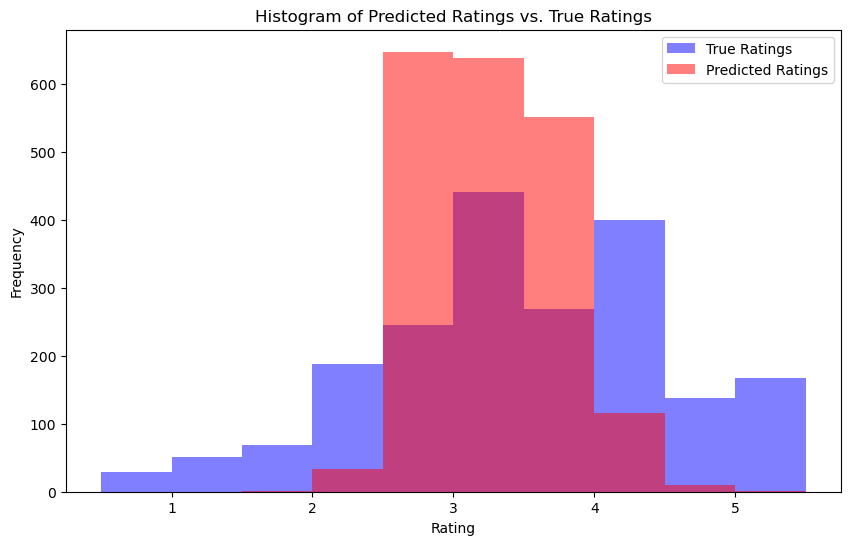

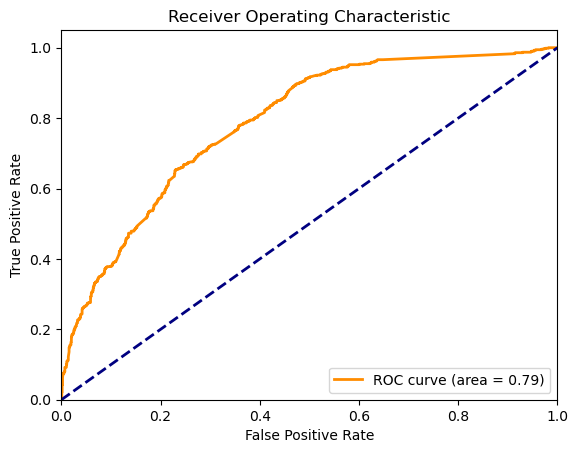

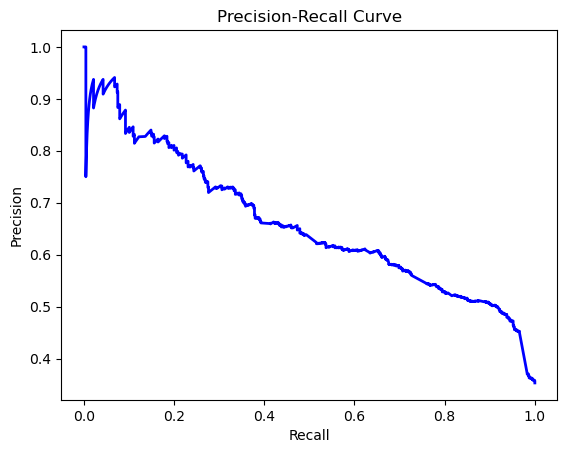

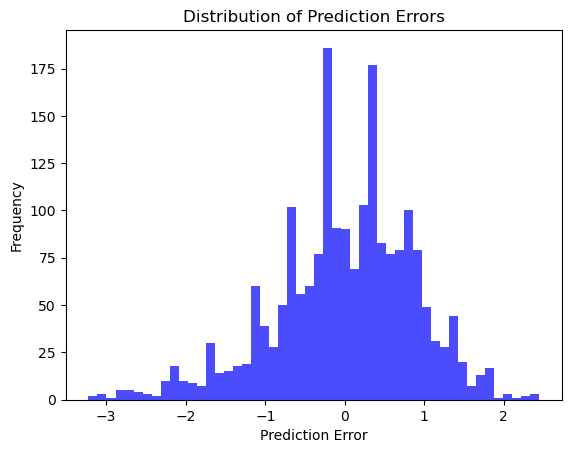

C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


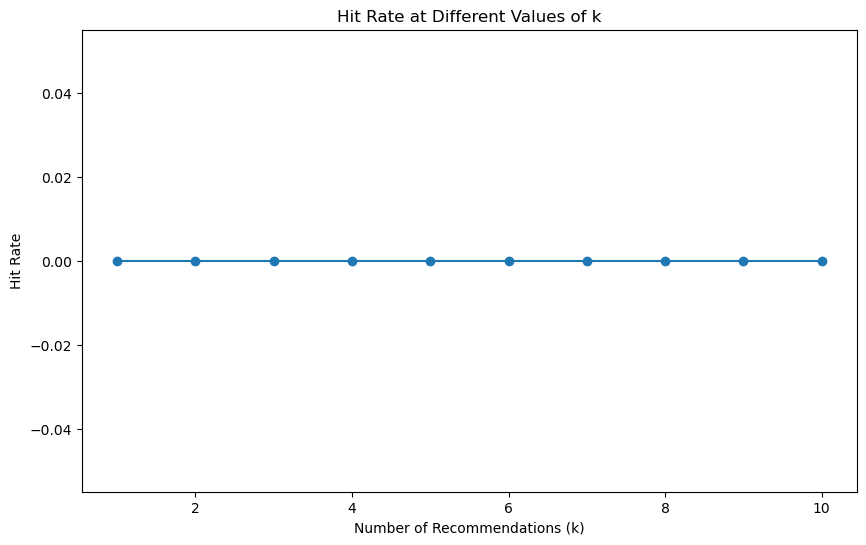

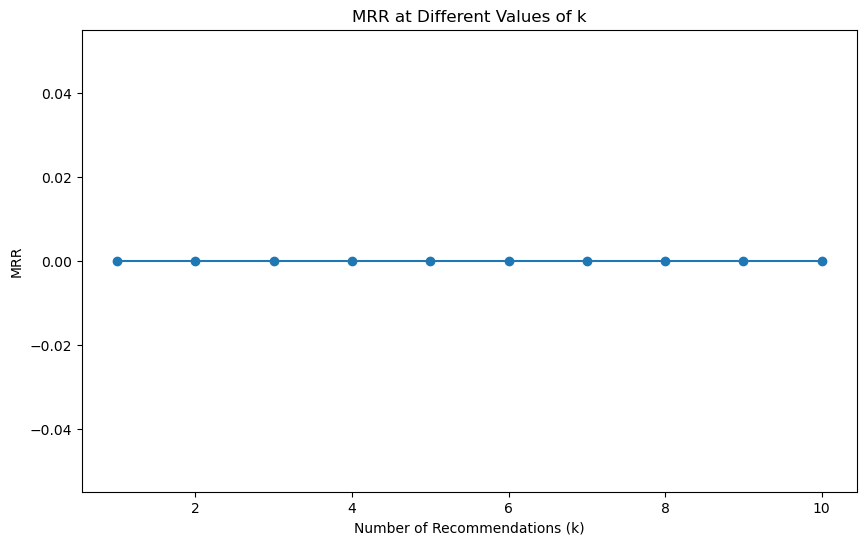

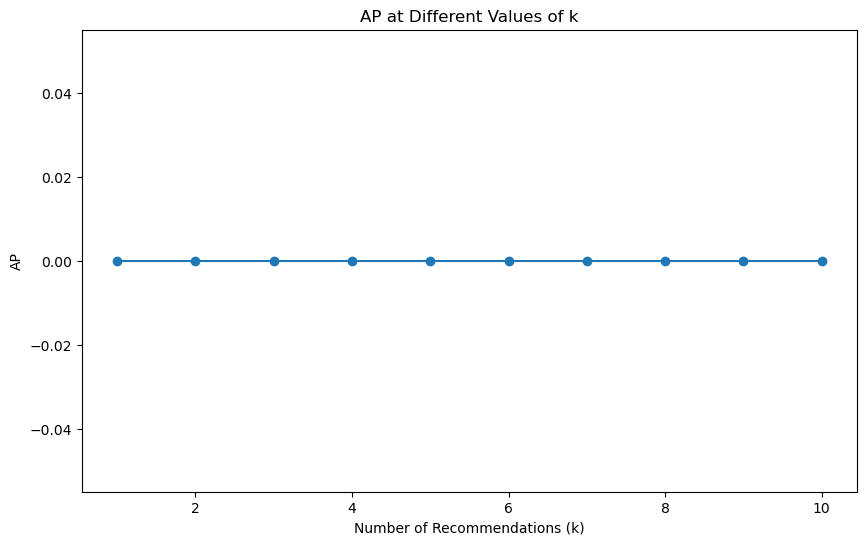

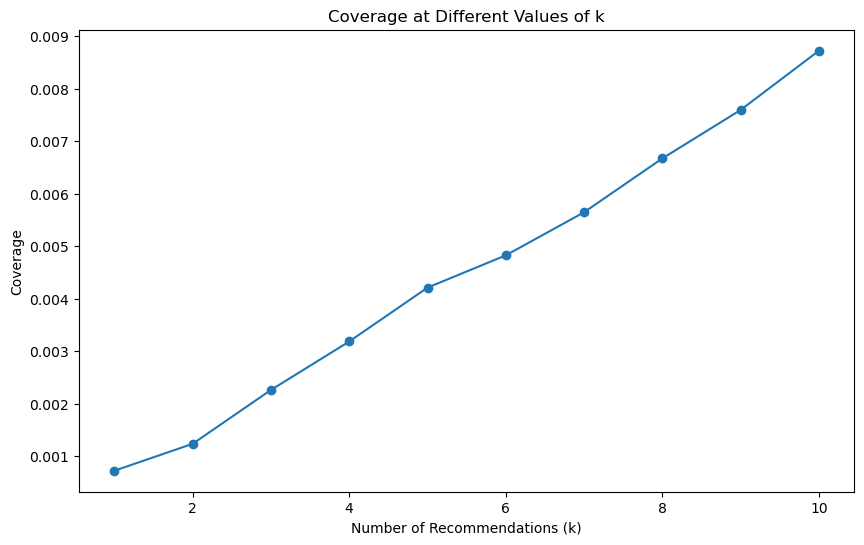

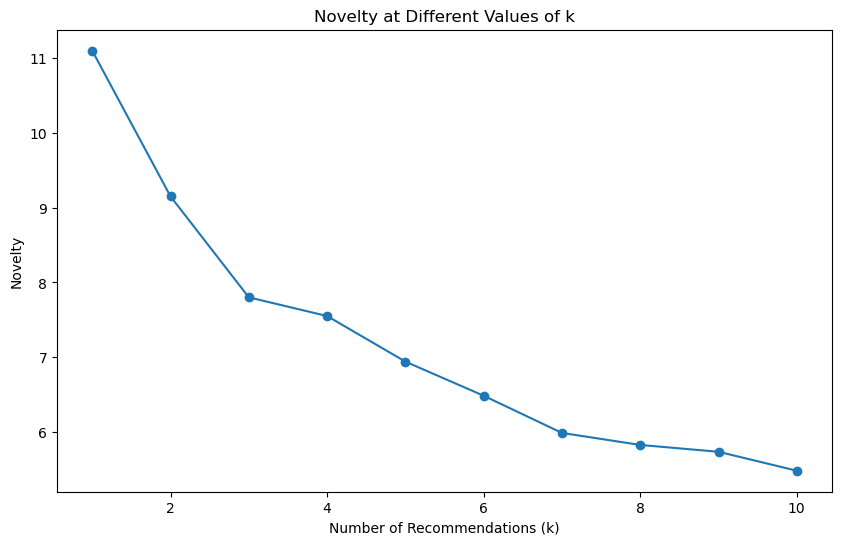

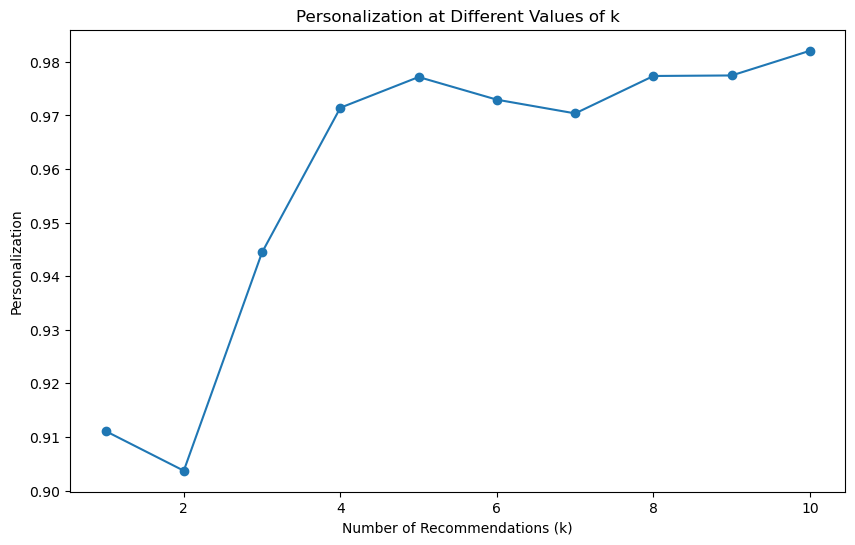

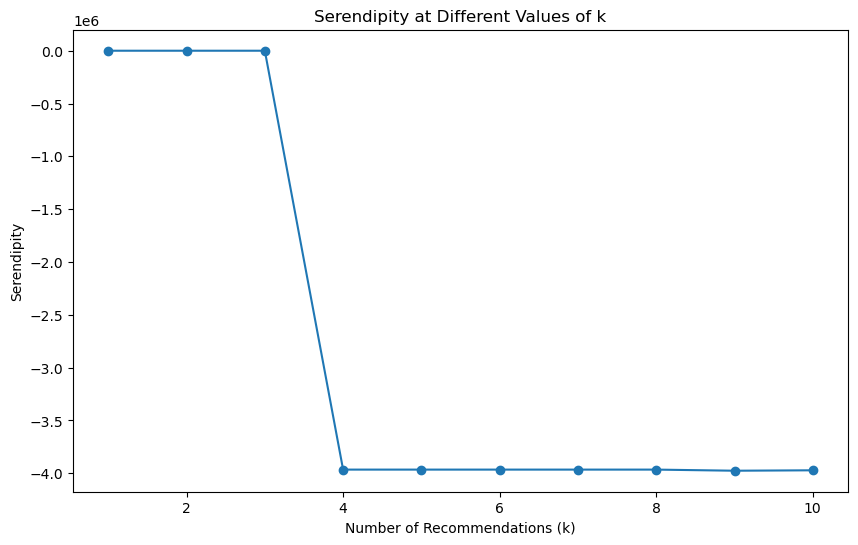

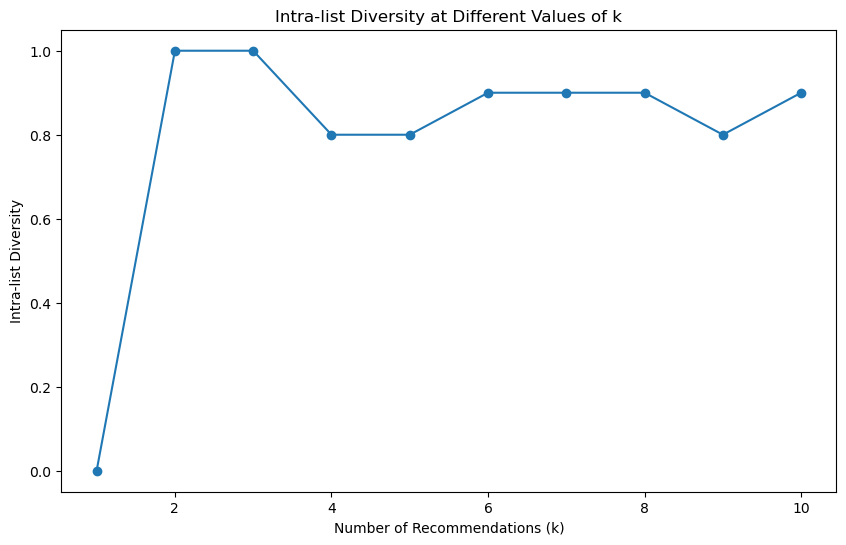

In [20]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import cosine, pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = cosine(user_pref_vector, item_feature_vector)
                    content_score = 1 - similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances) if not np.isnan(np.mean(distances)) else 0)
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o')
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in ratings_df['userId'].unique()[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                hit_rate = calculate_hit_rate(recommendations_k, ratings_df, n_recommendations)
                mrr = calculate_mrr(recommendations_k, ratings_df)
                ap = calculate_ap(recommendations_k, ratings_df)
                coverage = calculate_coverage(recommendations_k, len(movies_df))
                novelty = calculate_novelty(recommendations_k, item_popularity)
                personalization = calculate_personalization(recommendations_k)
                serendipity = calculate_serendipity(recommendations_k, expected_recommendations, user_preferences, item_features)
                intra_list_diversity = calculate_intra_list_similarity(recommendations_k, item_features)

                metrics_at_k[k] = {
                    'Hit Rate': hit_rate,
                    'MRR': mrr,
                    'AP': ap,
                    'Coverage': coverage,
                    'Novelty': novelty,
                    'Personalization': personalization,
                    'Serendipity': serendipity,
                    'Intra-list Diversity': intra_list_diversity
                }

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.22, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.67, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 1961, Hybrid Score: 4.09, Title: Rain Man (1988), CF Score: 4.17, CBF Score: 4.26, Popularity Penalty: 0.2333, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.04, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 3.54, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 81845, Hybrid Score: 4.03, Title: King's Speech, The (2010), CF Score: 4.04, CBF Score: 4.27, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 2976, Hybrid Score: 4.00, Title: Bringing Out the Dead (1999), CF Score: 3.85, CBF Score: 4.27, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 2571, Hybrid Score: 4.15, Title: Matrix, The (1999), CF Score: 4.74, CBF Score: 4.04, Popularity Penalty: 0.6333, Diversity Penalty: 0.0000
Movie ID: 6874, Hybrid Score: 4.05, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.26, CBF Score: 4.11, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.03, Title: Black Swan (2010), CF Score: 4.17, CBF Score: 4.05, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.01, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 3.89, Title: American Beauty (1999), CF Score: 4.51, CBF Score: 3.63, Popularity Penalty: 0.5000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 6874, Hybrid Score: 4.16, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.59, CBF Score: 3.93, Popularity Penalty: 0.3000, Diversity Penalty: 0.0333
Movie ID: 2858, Hybrid Score: 4.10, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.47, Popularity Penalty: 0.5000, Diversity Penalty: 0.0667
Movie ID: 2571, Hybrid Score: 4.02, Title: Matrix, The (1999), CF Score: 4.72, CBF Score: 3.80, Popularity Penalty: 0.6333, Diversity Penalty: 0.0333
Movie ID: 1198, Hybrid Score: 3.95, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.32, CBF Score: 3.94, Popularity Penalty: 0.4333, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 3.95, Title: Lost in Translation (2003), CF Score: 4.63, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 82:
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.17, Popularity Penalty: 0.5000, Diversity Penalty: 0.1000
Movie ID: 6874, Hybrid Score: 3.79, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.31, CBF Score: 3.46, Popularity Penalty: 0.3000, Diversity Penalty: 0.0667
Movie ID: 3473, Hybrid Score: 3.71, Title: Jonah Who Will Be 25 in the Year 2000 (Jonas qui aura 25 ans en l'an 2000) (1976), CF Score: 3.39, CBF Score: 4.24, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.70, Title: Pulp Fiction (1994), CF Score: 4.69, CBF Score: 2.93, Popularity Penalty: 0.5333, Diversity Penalty: 0.0333
Movie ID: 318, Hybrid Score: 3.68, Title: Shawshank Redemption, The (1994), CF Score: 4.54, CBF Score: 3.30, Popularity Penalty: 0.7000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 132:
Movie ID: 2501, Hybrid Score: 4.31, Title: October Sky (1999), CF Score: 4.35, CBF Score: 4.38, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.31, Title: Black Swan (2010), CF Score: 4.74, CBF Score: 3.91, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 2542, Hybrid Score: 4.22, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 971, Hybrid Score: 4.19, Title: Cat on a Hot Tin Roof (1958), CF Score: 4.11, CBF Score: 4.36, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.16, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.76, CBF Score: 3.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 156:
Movie ID: 3543, Hybrid Score: 4.41, Title: Diner (1982), CF Score: 4.38, CBF Score: 4.50, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 44199, Hybrid Score: 4.28, Title: Inside Man (2006), CF Score: 5.00, CBF Score: 3.45, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 5500, Hybrid Score: 4.26, Title: Top Secret! (1984), CF Score: 4.16, CBF Score: 4.44, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7451, Hybrid Score: 4.19, Title: Mean Girls (2004), CF Score: 4.11, CBF Score: 4.44, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 2501, Hybrid Score: 4.17, Title: October Sky (1999), CF Score: 4.08, CBF Score: 4.48, Popularity Penalty: 0.1000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 164:
Movie ID: 2571, Hybrid Score: 4.25, Title: Matrix, The (1999), CF Score: 4.80, CBF Score: 4.29, Popularity Penalty: 0.6333, Diversity Penalty: 0.0667
Movie ID: 6874, Hybrid Score: 4.10, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.62, CBF Score: 3.82, Popularity Penalty: 0.3000, Diversity Penalty: 0.1000
Movie ID: 3030, Hybrid Score: 3.97, Title: Yojimbo (1961), CF Score: 3.68, CBF Score: 4.53, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1374, Hybrid Score: 3.96, Title: Star Trek II: The Wrath of Khan (1982), CF Score: 3.86, CBF Score: 4.28, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.93, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 3.78, CBF Score: 4.27, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 177:
Movie ID: 4226, Hybrid Score: 4.17, Title: Memento (2000), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2542, Hybrid Score: 4.12, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 4.86, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 3152, Hybrid Score: 4.00, Title: Last Picture Show, The (1971), CF Score: 3.84, CBF Score: 4.28, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 171495, Hybrid Score: 4.00, Title: Cosmos, CF Score: 3.36, CBF Score: 5.00, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 1883, Hybrid Score: 3.94, Title: Bulworth (1998), CF Score: 4.09, CBF Score: 3.80, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 193:
Movie ID: 529, Hybrid Score: 4.25, Title: Searching for Bobby Fischer (1993), CF Score: 4.26, CBF Score: 4.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 4.22, Title: Lost in Translation (2003), CF Score: 4.88, CBF Score: 3.60, Popularity Penalty: 0.2667, Diversity Penalty: 0.0333
Movie ID: 1596, Hybrid Score: 4.18, Title: Career Girls (1997), CF Score: 4.03, CBF Score: 4.45, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.12, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.80, CBF Score: 3.52, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 3317, Hybrid Score: 4.11, Title: Wonder Boys (2000), CF Score: 4.25, CBF Score: 4.07, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 197:
Movie ID: 2858, Hybrid Score: 4.21, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.83, Popularity Penalty: 0.5000, Diversity Penalty: 0.1333
Movie ID: 529, Hybrid Score: 4.01, Title: Searching for Bobby Fischer (1993), CF Score: 3.98, CBF Score: 4.30, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 4973, Hybrid Score: 3.86, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.28, CBF Score: 3.58, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 3160, Hybrid Score: 3.82, Title: Magnolia (1999), CF Score: 3.60, CBF Score: 4.30, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 1207, Hybrid Score: 3.81, Title: To Kill a Mockingbird (1962), CF Score: 3.60, CBF Score: 4.29, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Catalog Coverage: 0.35%
Average Novelty: 7.8400
Personalization: 0.9291
Serendipity: -3965195.3292
Intra-list Diversity: 0.9000
Hit Rate: 0.0000
Mean Reci

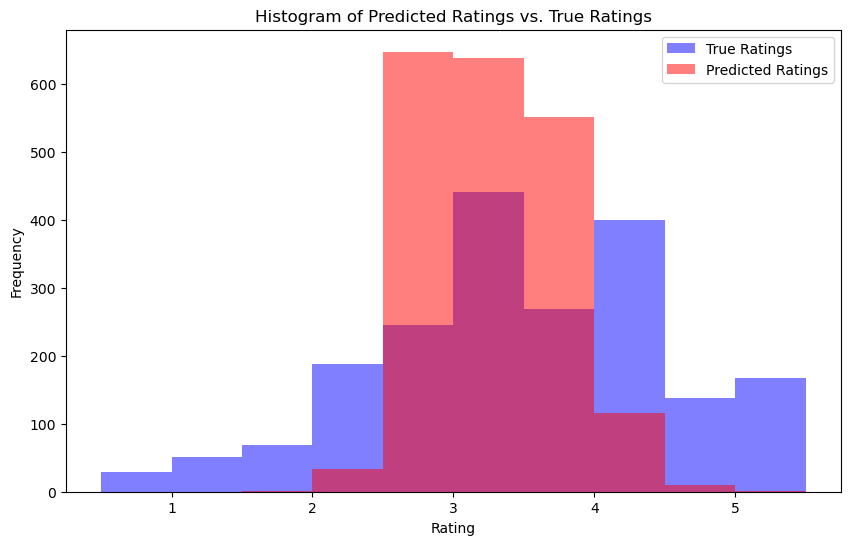

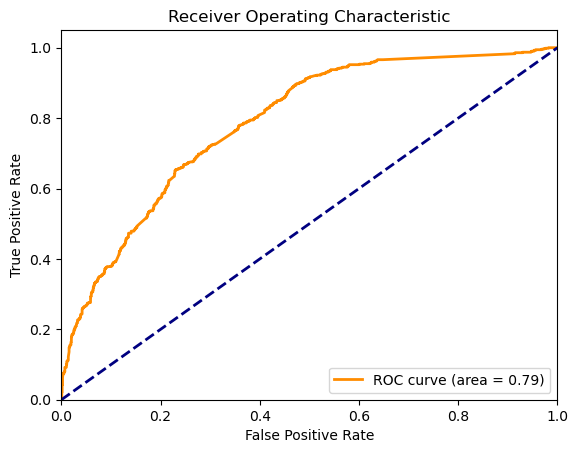

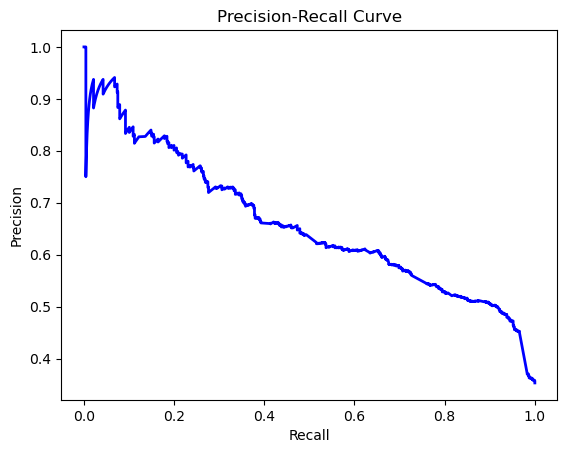

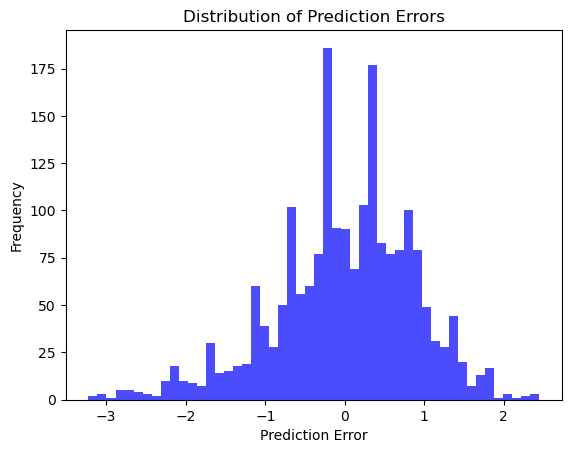

C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


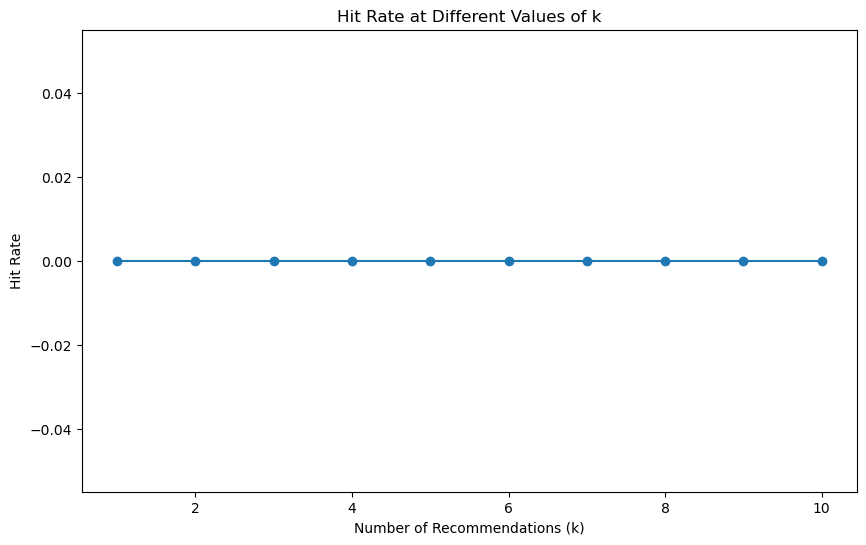

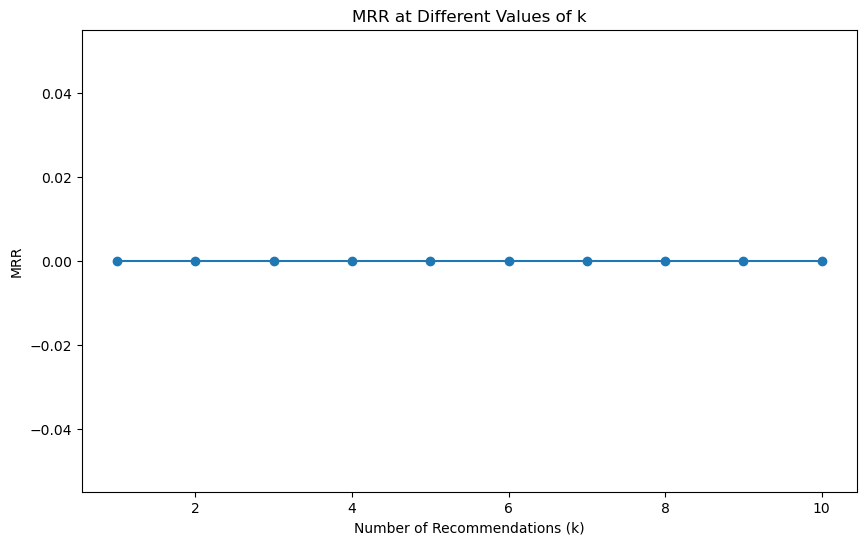

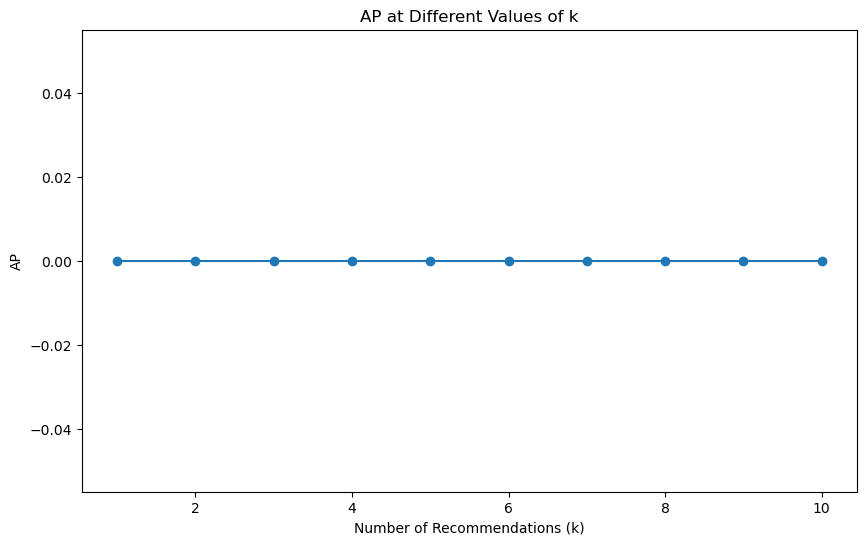

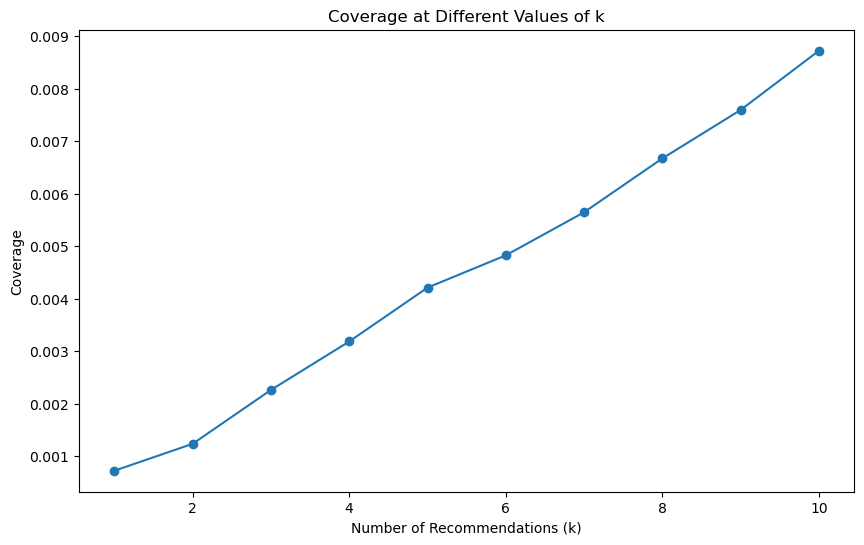

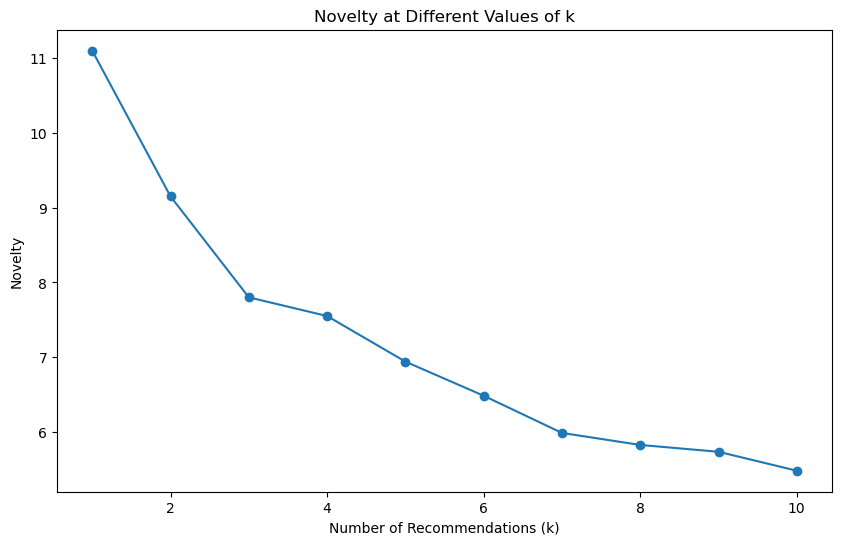

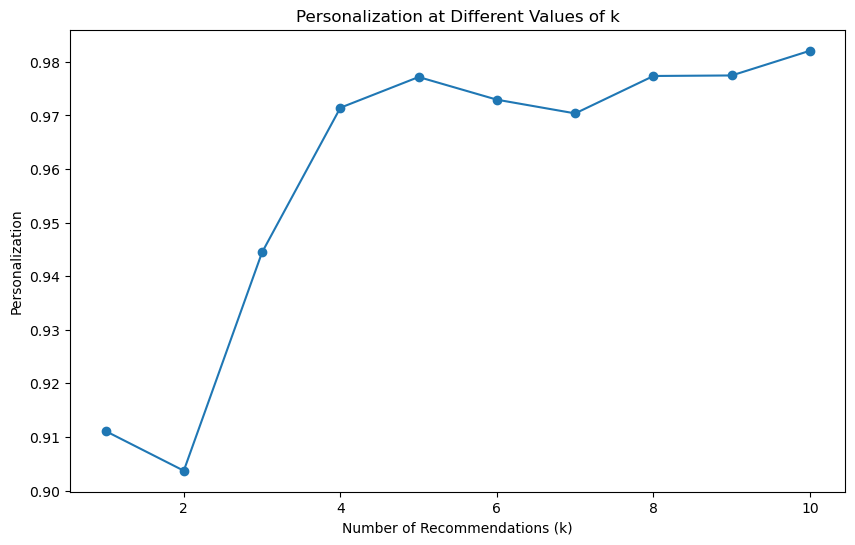

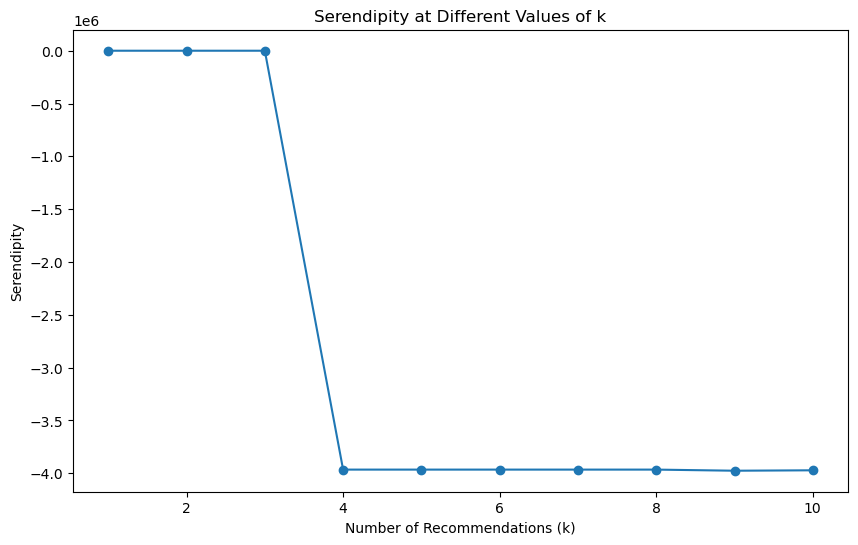

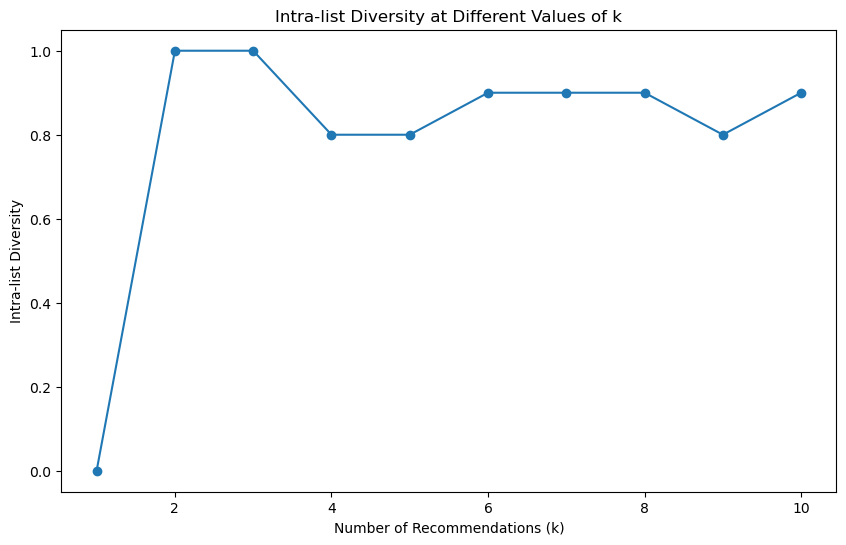

In [22]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve, confusion_matrix, ConfusionMatrixDisplay
from scipy.spatial.distance import cosine, pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = cosine(user_pref_vector, item_feature_vector)
                    content_score = 1 - similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances) if not np.isnan(np.mean(distances)) else 0)
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o')
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in ratings_df['userId'].unique()[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                hit_rate = calculate_hit_rate(recommendations_k, ratings_df, n_recommendations)
                mrr = calculate_mrr(recommendations_k, ratings_df)
                ap = calculate_ap(recommendations_k, ratings_df)
                coverage = calculate_coverage(recommendations_k, len(movies_df))
                novelty = calculate_novelty(recommendations_k, item_popularity)
                personalization = calculate_personalization(recommendations_k)
                serendipity = calculate_serendipity(recommendations_k, expected_recommendations, user_preferences, item_features)
                intra_list_diversity = calculate_intra_list_similarity(recommendations_k, item_features)

                metrics_at_k[k] = {
                    'Hit Rate': hit_rate,
                    'MRR': mrr,
                    'AP': ap,
                    'Coverage': coverage,
                    'Novelty': novelty,
                    'Personalization': personalization,
                    'Serendipity': serendipity,
                    'Intra-list Diversity': intra_list_diversity
                }

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8516
MAE: 0.6523
Precision: 0.8000
Recall: 0.2881
F1 Score: 0.4237


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 318, Hybrid Score: 4.26, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 3.54, Popularity Penalty: 0.6133, Diversity Penalty: 0.0000
Movie ID: 910, Hybrid Score: 3.67, Title: Some Like It Hot (1959), CF Score: 3.96, CBF Score: 3.20, Popularity Penalty: 0.1200, Diversity Penalty: 0.0000
Movie ID: 2398, Hybrid Score: 3.64, Title: Miracle on 34th Street (1947), CF Score: 3.61, CBF Score: 3.78, Popularity Penalty: 0.0533, Diversity Penalty: 0.0000
Movie ID: 293, Hybrid Score: 3.59, Title: Léon: The Professional (a.k.a. The Professional) (Léon) (1994), CF Score: 4.13, CBF Score: 2.80, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 1198, Hybrid Score: 3.54, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 3.73, CBF Score: 3.82, Popularity Penalty: 0.4267, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 296, Hybrid Score: 4.21, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.4933, Diversity Penalty: 0.0000
Movie ID: 2959, Hybrid Score: 4.06, Title: Fight Club (1999), CF Score: 4.40, CBF Score: 3.93, Popularity Penalty: 0.4000, Diversity Penalty: 0.0000
Movie ID: 902, Hybrid Score: 3.89, Title: Breakfast at Tiffany's (1961), CF Score: 4.09, CBF Score: 3.58, Popularity Penalty: 0.0933, Diversity Penalty: 0.0000
Movie ID: 858, Hybrid Score: 3.85, Title: Godfather, The (1972), CF Score: 4.25, CBF Score: 3.60, Popularity Penalty: 0.4000, Diversity Penalty: 0.0000
Movie ID: 2791, Hybrid Score: 3.83, Title: Airplane! (1980), CF Score: 3.96, CBF Score: 3.76, Popularity Penalty: 0.1467, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 25:
Movie ID: 2692, Hybrid Score: 4.48, Title: Run Lola Run (Lola rennt) (1998), CF Score: 4.89, CBF Score: 3.81, Popularity Penalty: 0.1733, Diversity Penalty: 0.0000
Movie ID: 1291, Hybrid Score: 4.39, Title: Indiana Jones and the Last Crusade (1989), CF Score: 4.64, CBF Score: 4.36, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 112852, Hybrid Score: 4.34, Title: Guardians of the Galaxy (2014), CF Score: 4.51, CBF Score: 4.16, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 4.32, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.48, Popularity Penalty: 0.4400, Diversity Penalty: 0.0000
Movie ID: 293, Hybrid Score: 4.32, Title: Léon: The Professional (a.k.a. The Professional) (Léon) (1994), CF Score: 4.99, CBF Score: 3.24, Popularity Penalty: 0.2667, Diversity Penalty: 0.0133


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 30:
Movie ID: 1097, Hybrid Score: 4.23, Title: E.T. the Extra-Terrestrial (1982), CF Score: 5.00, CBF Score: 2.92, Popularity Penalty: 0.2933, Diversity Penalty: 0.0000
Movie ID: 910, Hybrid Score: 4.16, Title: Some Like It Hot (1959), CF Score: 4.76, CBF Score: 2.98, Popularity Penalty: 0.1200, Diversity Penalty: 0.0133
Movie ID: 1732, Hybrid Score: 3.99, Title: Big Lebowski, The (1998), CF Score: 4.53, CBF Score: 3.03, Popularity Penalty: 0.1867, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.97, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 4.05, CBF Score: 3.88, Popularity Penalty: 0.0533, Diversity Penalty: 0.0000
Movie ID: 733, Hybrid Score: 3.95, Title: Rock, The (1996), CF Score: 4.13, CBF Score: 3.91, Popularity Penalty: 0.2400, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 31:
Movie ID: 318, Hybrid Score: 4.21, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 3.43, Popularity Penalty: 0.6133, Diversity Penalty: 0.0133
Movie ID: 296, Hybrid Score: 4.06, Title: Pulp Fiction (1994), CF Score: 4.92, CBF Score: 2.90, Popularity Penalty: 0.4933, Diversity Penalty: 0.0133
Movie ID: 2858, Hybrid Score: 4.04, Title: American Beauty (1999), CF Score: 4.45, CBF Score: 3.84, Popularity Penalty: 0.4400, Diversity Penalty: 0.0133
Movie ID: 1732, Hybrid Score: 3.99, Title: Big Lebowski, The (1998), CF Score: 4.28, CBF Score: 3.65, Popularity Penalty: 0.1867, Diversity Penalty: 0.0133
Movie ID: 2692, Hybrid Score: 3.96, Title: Run Lola Run (Lola rennt) (1998), CF Score: 4.32, CBF Score: 3.43, Popularity Penalty: 0.1733, Diversity Penalty: 0.0133


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 2692, Hybrid Score: 4.47, Title: Run Lola Run (Lola rennt) (1998), CF Score: 4.82, CBF Score: 3.99, Popularity Penalty: 0.1733, Diversity Penalty: 0.0267
Movie ID: 58559, Hybrid Score: 4.26, Title: Dark Knight, The (2008), CF Score: 5.00, CBF Score: 3.10, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 910, Hybrid Score: 4.20, Title: Some Like It Hot (1959), CF Score: 4.52, CBF Score: 3.69, Popularity Penalty: 0.1200, Diversity Penalty: 0.0267
Movie ID: 2858, Hybrid Score: 4.18, Title: American Beauty (1999), CF Score: 4.81, CBF Score: 3.47, Popularity Penalty: 0.4400, Diversity Penalty: 0.0267
Movie ID: 3578, Hybrid Score: 4.18, Title: Gladiator (2000), CF Score: 4.63, CBF Score: 3.77, Popularity Penalty: 0.3867, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 64:
Movie ID: 910, Hybrid Score: 4.23, Title: Some Like It Hot (1959), CF Score: 4.58, CBF Score: 3.67, Popularity Penalty: 0.1200, Diversity Penalty: 0.0400
Movie ID: 48516, Hybrid Score: 4.22, Title: Departed, The (2006), CF Score: 4.73, CBF Score: 3.41, Popularity Penalty: 0.2267, Diversity Penalty: 0.0000
Movie ID: 58559, Hybrid Score: 4.06, Title: Dark Knight, The (2008), CF Score: 4.96, CBF Score: 2.54, Popularity Penalty: 0.3333, Diversity Penalty: 0.0133
Movie ID: 56367, Hybrid Score: 4.04, Title: Juno (2007), CF Score: 4.35, CBF Score: 3.70, Popularity Penalty: 0.2267, Diversity Penalty: 0.0000
Movie ID: 1198, Hybrid Score: 4.03, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.60, CBF Score: 3.42, Popularity Penalty: 0.4267, Diversity Penalty: 0.0133


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 71:
Movie ID: 296, Hybrid Score: 4.06, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 2.72, Popularity Penalty: 0.4933, Diversity Penalty: 0.0267
Movie ID: 318, Hybrid Score: 4.01, Title: Shawshank Redemption, The (1994), CF Score: 4.80, CBF Score: 3.25, Popularity Penalty: 0.6133, Diversity Penalty: 0.0267
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 4.58, CBF Score: 3.34, Popularity Penalty: 0.4400, Diversity Penalty: 0.0400
Movie ID: 44191, Hybrid Score: 3.95, Title: V for Vendetta (2006), CF Score: 4.47, CBF Score: 3.19, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2959, Hybrid Score: 3.88, Title: Fight Club (1999), CF Score: 4.43, CBF Score: 3.30, Popularity Penalty: 0.4000, Diversity Penalty: 0.0133


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 73:
Movie ID: 296, Hybrid Score: 4.16, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.09, Popularity Penalty: 0.4933, Diversity Penalty: 0.0400
Movie ID: 2360, Hybrid Score: 3.79, Title: Celebration, The (Festen) (1998), CF Score: 3.71, CBF Score: 4.09, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000
Movie ID: 527, Hybrid Score: 3.78, Title: Schindler's List (1993), CF Score: 4.20, CBF Score: 3.33, Popularity Penalty: 0.3200, Diversity Penalty: 0.0000
Movie ID: 141, Hybrid Score: 3.74, Title: Birdcage, The (1996), CF Score: 3.50, CBF Score: 4.49, Popularity Penalty: 0.1200, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 3.72, Title: Shawshank Redemption, The (1994), CF Score: 4.28, CBF Score: 3.49, Popularity Penalty: 0.6133, Diversity Penalty: 0.0400


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 77:
Movie ID: 318, Hybrid Score: 4.18, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 3.37, Popularity Penalty: 0.6133, Diversity Penalty: 0.0533
Movie ID: 3703, Hybrid Score: 4.04, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 4.19, CBF Score: 3.81, Popularity Penalty: 0.0533, Diversity Penalty: 0.0133
Movie ID: 293, Hybrid Score: 3.95, Title: Léon: The Professional (a.k.a. The Professional) (Léon) (1994), CF Score: 4.46, CBF Score: 3.27, Popularity Penalty: 0.2667, Diversity Penalty: 0.0267
Movie ID: 1291, Hybrid Score: 3.87, Title: Indiana Jones and the Last Crusade (1989), CF Score: 3.91, CBF Score: 4.35, Popularity Penalty: 0.3333, Diversity Penalty: 0.0133
Movie ID: 1225, Hybrid Score: 3.73, Title: Amadeus (1984), CF Score: 3.81, CBF Score: 3.86, Popularity Penalty: 0.1867, Diversity Penalty: 0.0000
Catalog Coverage: 0.28%
Average Novelty: 22.8400
Personalization: 0.8929
Serendipity: 0.0000
Intra-list Diversity: 1.0000


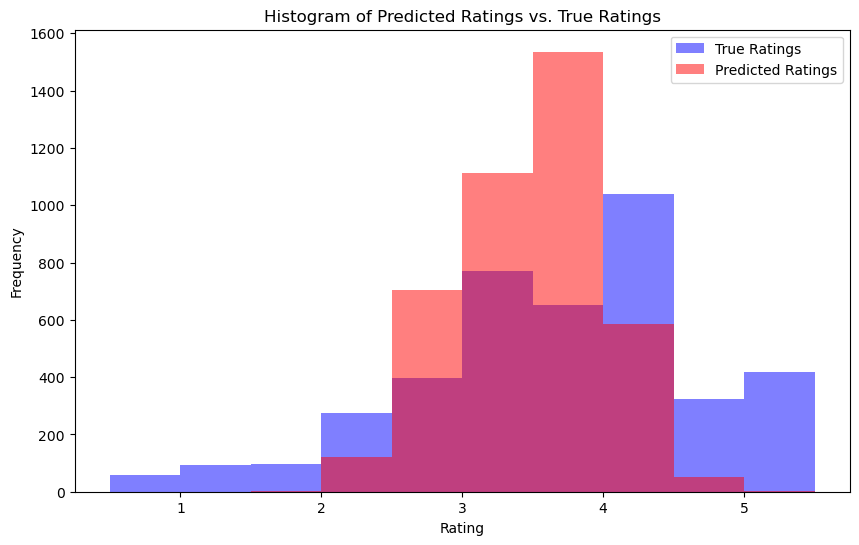

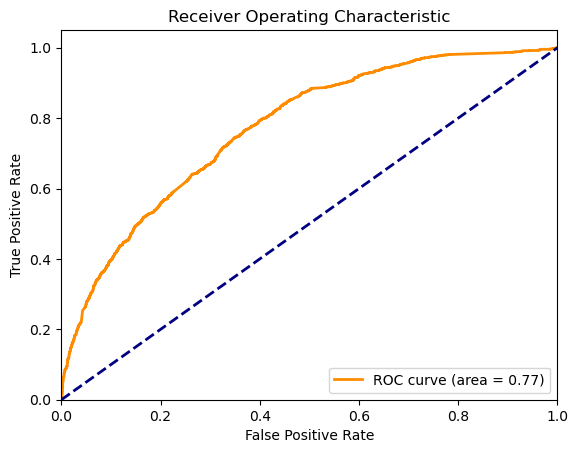

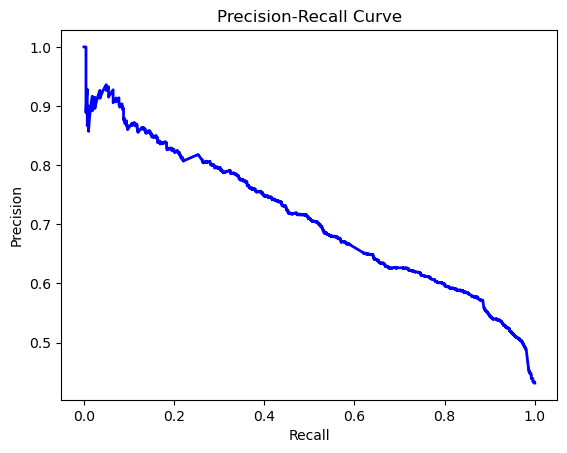

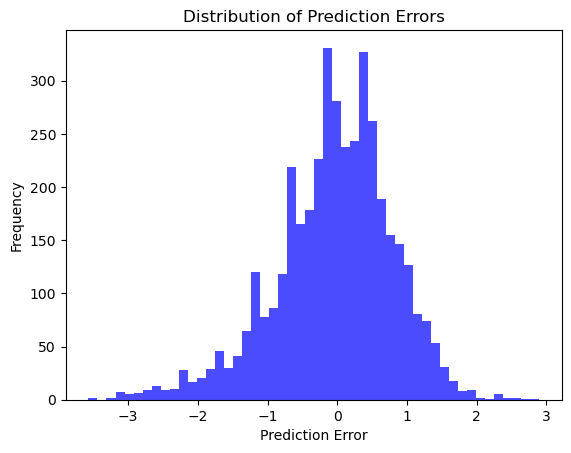

C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


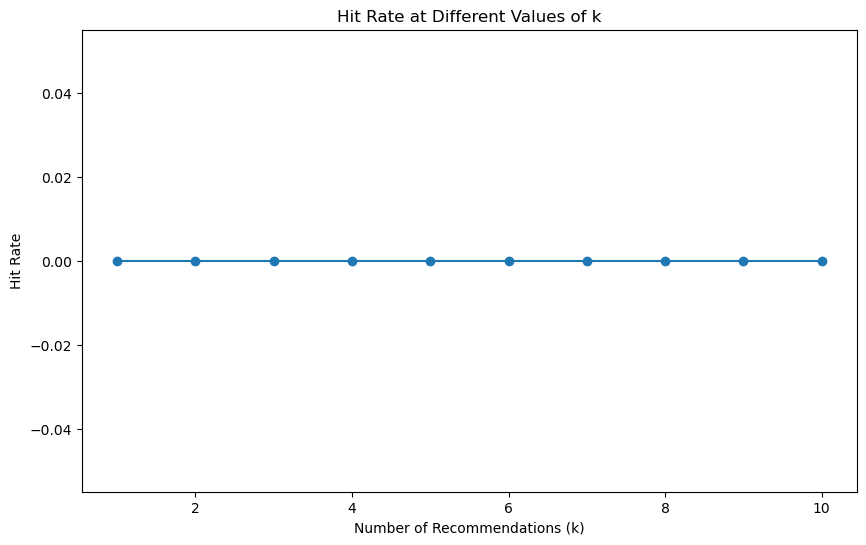

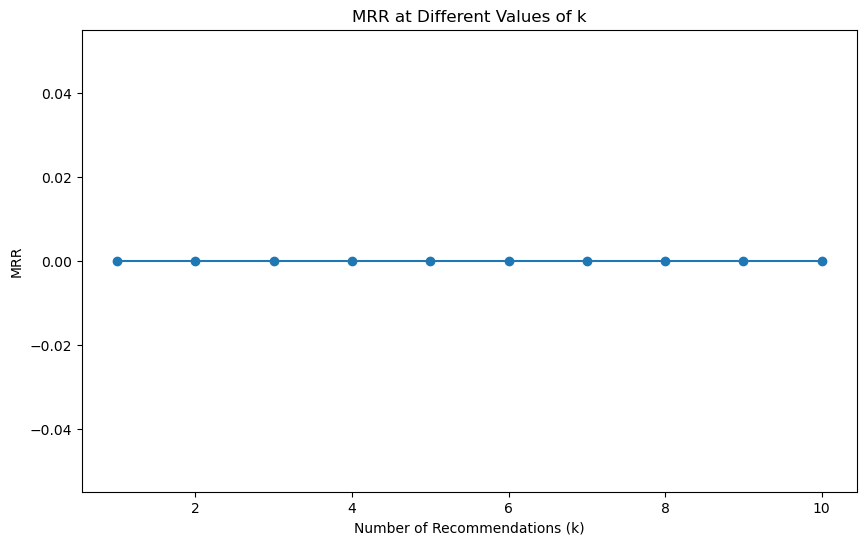

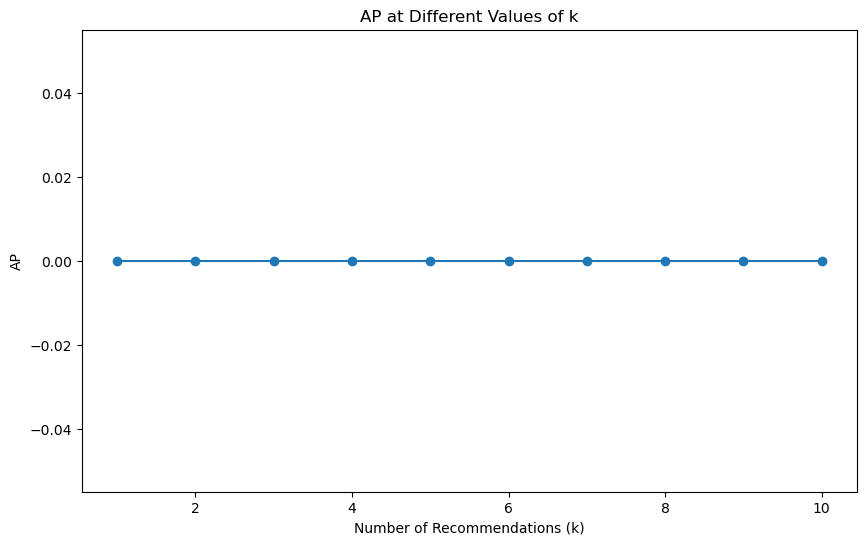

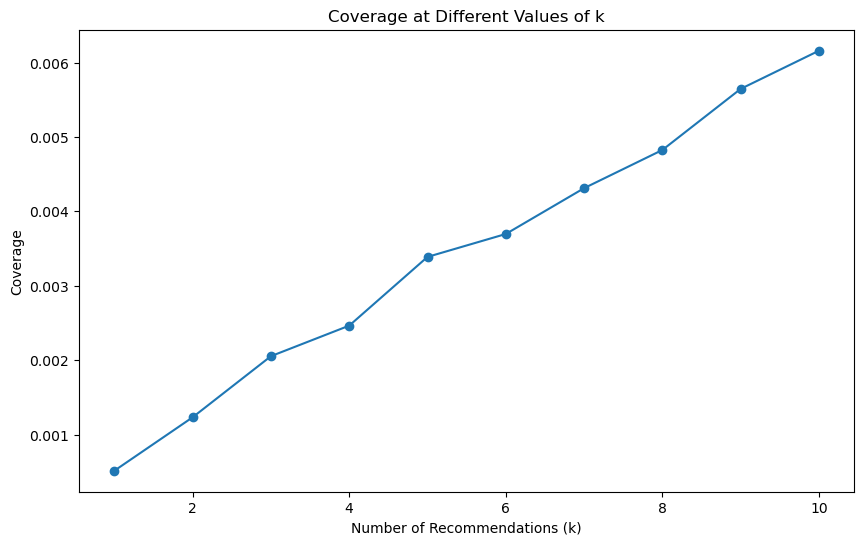

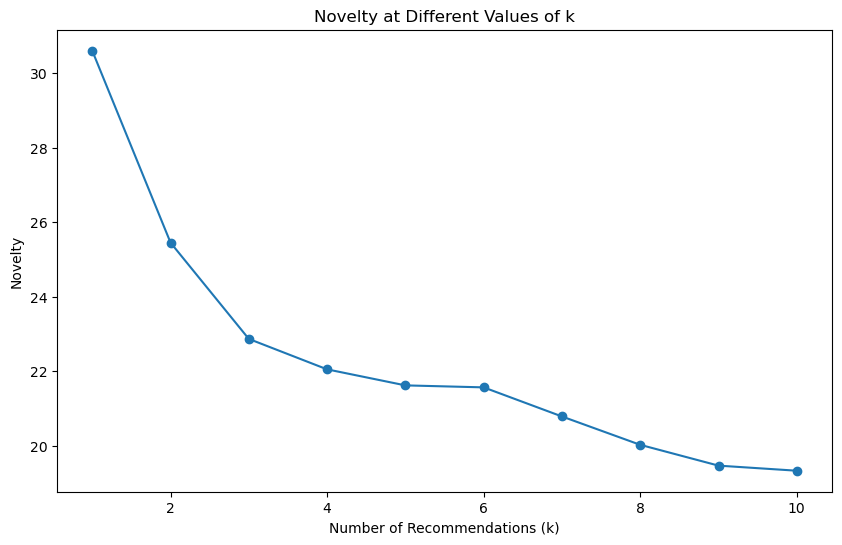

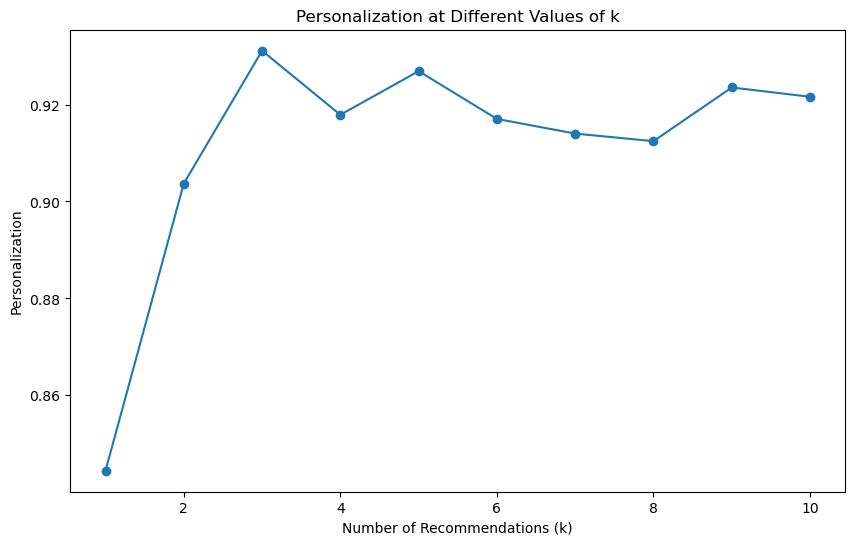

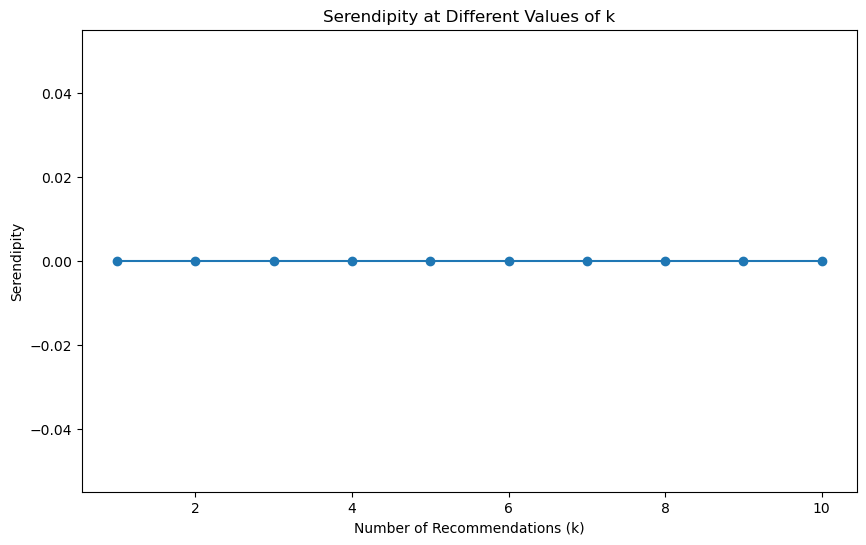

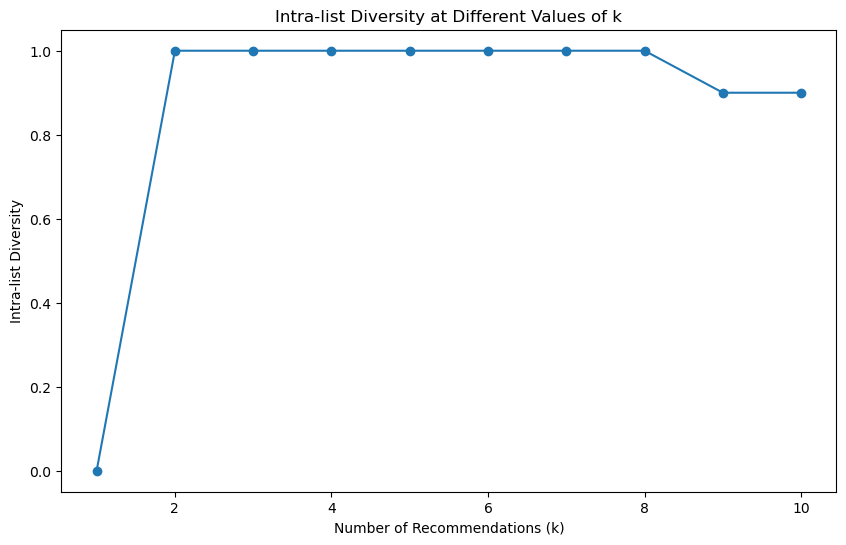

In [26]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve, confusion_matrix, ConfusionMatrixDisplay
from scipy.spatial.distance import pdist, squareform

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 75  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.7

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            if np.any(np.isnan(distances)):
                diversity_scores.append(0)
            else:
                diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o')
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in ratings_df['userId'].unique()[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                hit_rate = calculate_hit_rate(recommendations_k, ratings_df, n_recommendations)
                mrr = calculate_mrr(recommendations_k, ratings_df)
                ap = calculate_ap(recommendations_k, ratings_df)
                coverage = calculate_coverage(recommendations_k, len(movies_df))
                novelty = calculate_novelty(recommendations_k, item_popularity)
                personalization = calculate_personalization(recommendations_k)
                serendipity = calculate_serendipity(recommendations_k, expected_recommendations, user_preferences, item_features)
                intra_list_diversity = calculate_intra_list_similarity(recommendations_k, item_features)

                metrics_at_k[k] = {
                    'Hit Rate': hit_rate,
                    'MRR': mrr,
                    'AP': ap,
                    'Coverage': coverage,
                    'Novelty': novelty,
                    'Personalization': personalization,
                    'Serendipity': serendipity,
                    'Intra-list Diversity': intra_list_diversity
                }

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            if np.any(np.isnan(distances)):
                diversity_scores.append(0)
            else:
                diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o', label=metric)
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.legend()
        plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in ratings_df['userId'].unique()[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                rec_metrics = calculate_recommendation_metrics(recommendations_k, ratings_df)
                metrics_at_k[k] = rec_metrics

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.22, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.67, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 1961, Hybrid Score: 4.09, Title: Rain Man (1988), CF Score: 4.17, CBF Score: 4.26, Popularity Penalty: 0.2333, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.04, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 3.54, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 81845, Hybrid Score: 4.03, Title: King's Speech, The (2010), CF Score: 4.04, CBF Score: 4.27, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 2976, Hybrid Score: 4.00, Title: Bringing Out the Dead (1999), CF Score: 3.85, CBF Score: 4.27, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 2571, Hybrid Score: 4.15, Title: Matrix, The (1999), CF Score: 4.74, CBF Score: 4.04, Popularity Penalty: 0.6333, Diversity Penalty: 0.0000
Movie ID: 6874, Hybrid Score: 4.05, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.26, CBF Score: 4.11, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.03, Title: Black Swan (2010), CF Score: 4.17, CBF Score: 4.05, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.01, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 3.89, Title: American Beauty (1999), CF Score: 4.51, CBF Score: 3.63, Popularity Penalty: 0.5000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 6874, Hybrid Score: 4.16, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.59, CBF Score: 3.93, Popularity Penalty: 0.3000, Diversity Penalty: 0.0333
Movie ID: 2858, Hybrid Score: 4.10, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.47, Popularity Penalty: 0.5000, Diversity Penalty: 0.0667
Movie ID: 2571, Hybrid Score: 4.02, Title: Matrix, The (1999), CF Score: 4.72, CBF Score: 3.80, Popularity Penalty: 0.6333, Diversity Penalty: 0.0333
Movie ID: 1198, Hybrid Score: 3.95, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.32, CBF Score: 3.94, Popularity Penalty: 0.4333, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 3.95, Title: Lost in Translation (2003), CF Score: 4.63, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 82:
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.17, Popularity Penalty: 0.5000, Diversity Penalty: 0.1000
Movie ID: 6874, Hybrid Score: 3.79, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.31, CBF Score: 3.46, Popularity Penalty: 0.3000, Diversity Penalty: 0.0667
Movie ID: 3473, Hybrid Score: 3.71, Title: Jonah Who Will Be 25 in the Year 2000 (Jonas qui aura 25 ans en l'an 2000) (1976), CF Score: 3.39, CBF Score: 4.24, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.70, Title: Pulp Fiction (1994), CF Score: 4.69, CBF Score: 2.93, Popularity Penalty: 0.5333, Diversity Penalty: 0.0333
Movie ID: 318, Hybrid Score: 3.68, Title: Shawshank Redemption, The (1994), CF Score: 4.54, CBF Score: 3.30, Popularity Penalty: 0.7000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 132:
Movie ID: 2501, Hybrid Score: 4.31, Title: October Sky (1999), CF Score: 4.35, CBF Score: 4.38, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.31, Title: Black Swan (2010), CF Score: 4.74, CBF Score: 3.91, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 2542, Hybrid Score: 4.22, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 971, Hybrid Score: 4.19, Title: Cat on a Hot Tin Roof (1958), CF Score: 4.11, CBF Score: 4.36, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.16, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.76, CBF Score: 3.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 156:
Movie ID: 3543, Hybrid Score: 4.41, Title: Diner (1982), CF Score: 4.38, CBF Score: 4.50, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 44199, Hybrid Score: 4.28, Title: Inside Man (2006), CF Score: 5.00, CBF Score: 3.45, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 5500, Hybrid Score: 4.26, Title: Top Secret! (1984), CF Score: 4.16, CBF Score: 4.44, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7451, Hybrid Score: 4.19, Title: Mean Girls (2004), CF Score: 4.11, CBF Score: 4.44, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 2501, Hybrid Score: 4.17, Title: October Sky (1999), CF Score: 4.08, CBF Score: 4.48, Popularity Penalty: 0.1000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 164:
Movie ID: 2571, Hybrid Score: 4.25, Title: Matrix, The (1999), CF Score: 4.80, CBF Score: 4.29, Popularity Penalty: 0.6333, Diversity Penalty: 0.0667
Movie ID: 6874, Hybrid Score: 4.10, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.62, CBF Score: 3.82, Popularity Penalty: 0.3000, Diversity Penalty: 0.1000
Movie ID: 3030, Hybrid Score: 3.97, Title: Yojimbo (1961), CF Score: 3.68, CBF Score: 4.53, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1374, Hybrid Score: 3.96, Title: Star Trek II: The Wrath of Khan (1982), CF Score: 3.86, CBF Score: 4.28, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.93, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 3.78, CBF Score: 4.27, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 177:
Movie ID: 4226, Hybrid Score: 4.17, Title: Memento (2000), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2542, Hybrid Score: 4.12, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 4.86, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 3152, Hybrid Score: 4.00, Title: Last Picture Show, The (1971), CF Score: 3.84, CBF Score: 4.28, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 171495, Hybrid Score: 4.00, Title: Cosmos, CF Score: 3.36, CBF Score: 5.00, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 1883, Hybrid Score: 3.94, Title: Bulworth (1998), CF Score: 4.09, CBF Score: 3.80, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 193:
Movie ID: 529, Hybrid Score: 4.25, Title: Searching for Bobby Fischer (1993), CF Score: 4.26, CBF Score: 4.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 4.22, Title: Lost in Translation (2003), CF Score: 4.88, CBF Score: 3.60, Popularity Penalty: 0.2667, Diversity Penalty: 0.0333
Movie ID: 1596, Hybrid Score: 4.18, Title: Career Girls (1997), CF Score: 4.03, CBF Score: 4.45, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.12, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.80, CBF Score: 3.52, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 3317, Hybrid Score: 4.11, Title: Wonder Boys (2000), CF Score: 4.25, CBF Score: 4.07, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 197:
Movie ID: 2858, Hybrid Score: 4.21, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.83, Popularity Penalty: 0.5000, Diversity Penalty: 0.1333
Movie ID: 529, Hybrid Score: 4.01, Title: Searching for Bobby Fischer (1993), CF Score: 3.98, CBF Score: 4.30, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 4973, Hybrid Score: 3.86, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.28, CBF Score: 3.58, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 3160, Hybrid Score: 3.82, Title: Magnolia (1999), CF Score: 3.60, CBF Score: 4.30, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 1207, Hybrid Score: 3.81, Title: To Kill a Mockingbird (1962), CF Score: 3.60, CBF Score: 4.29, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Catalog Coverage: 0.35%
Average Novelty: 7.8400
Personalization: 0.9291
Serendipity: -3965195.3292
Intra-list Diversity: 0.9000
Hit Rate: 0.0000
Mean Reci

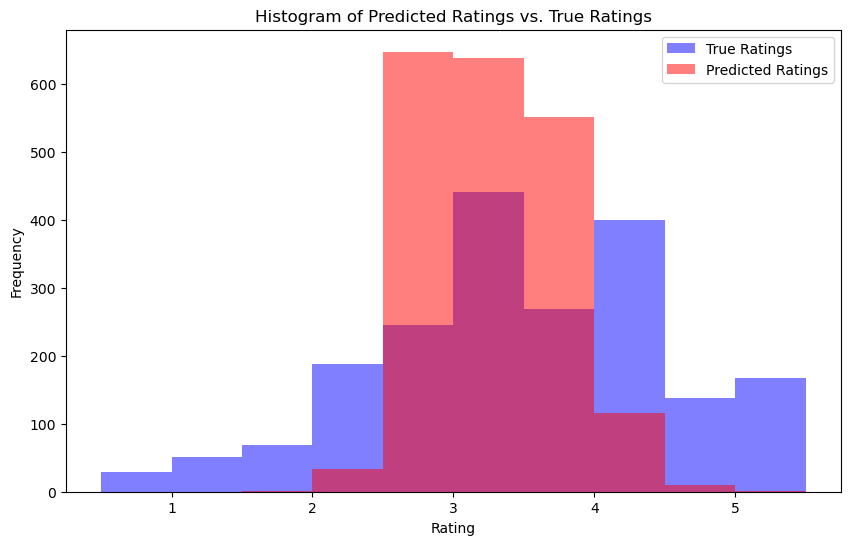

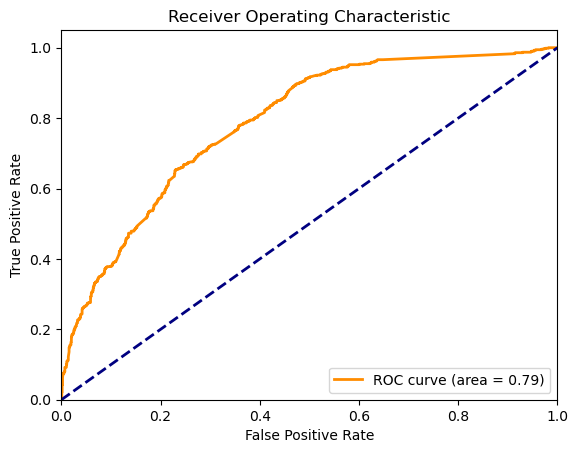

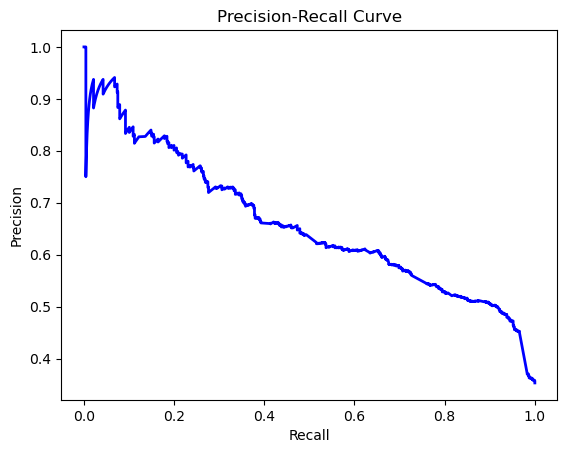

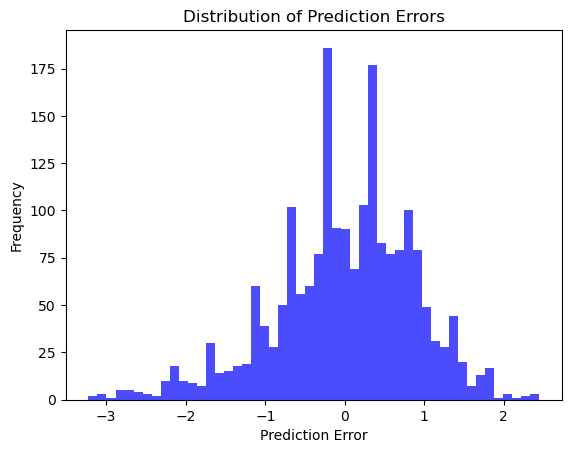

C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv

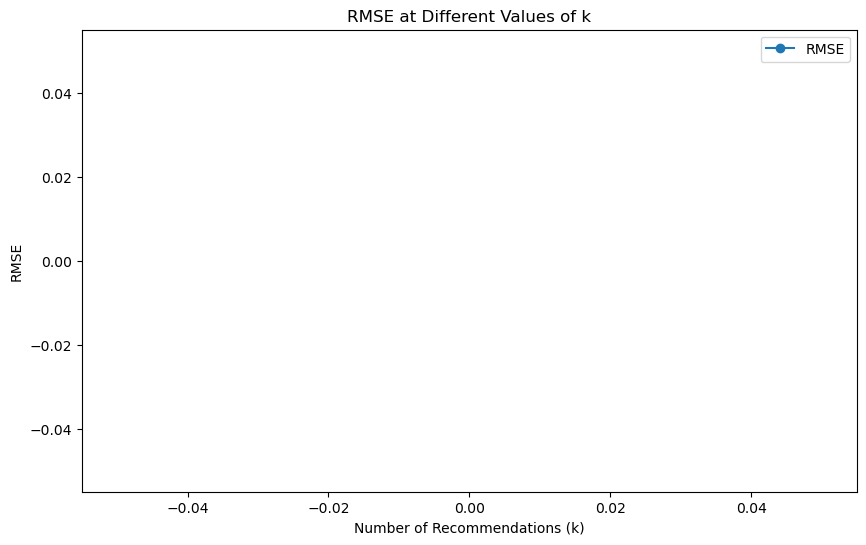

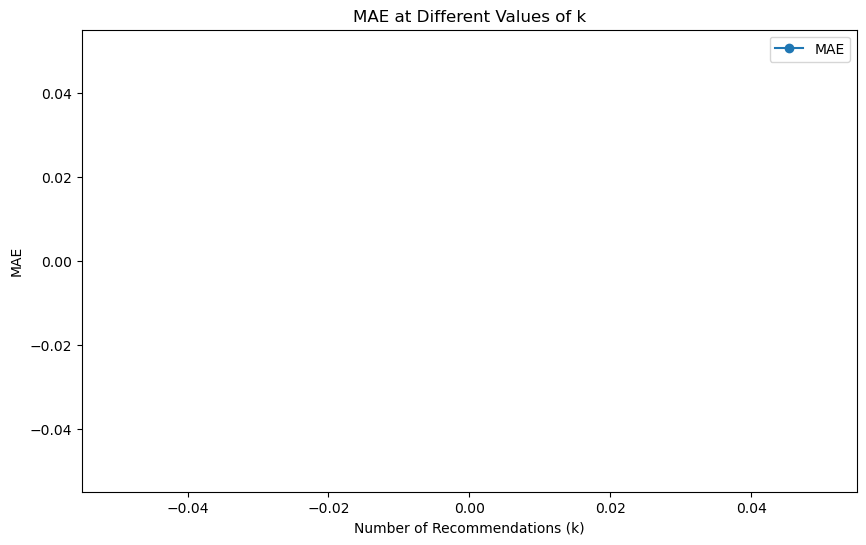

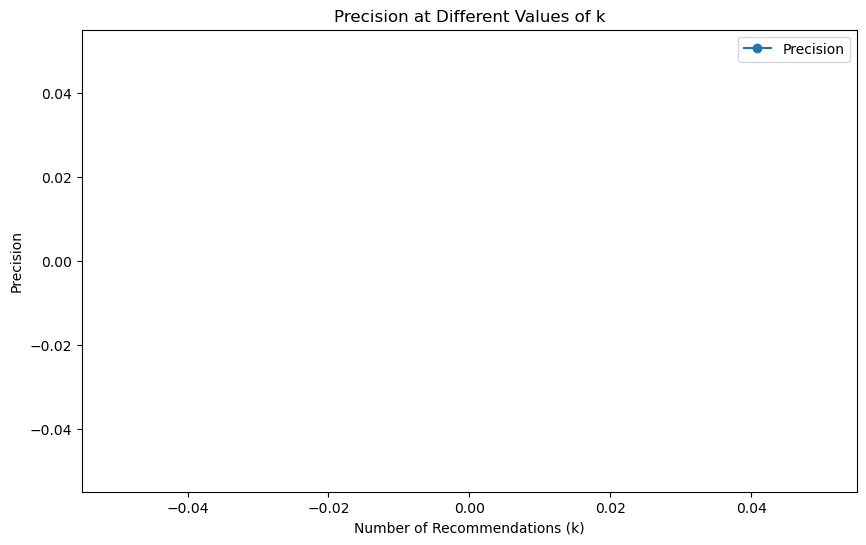

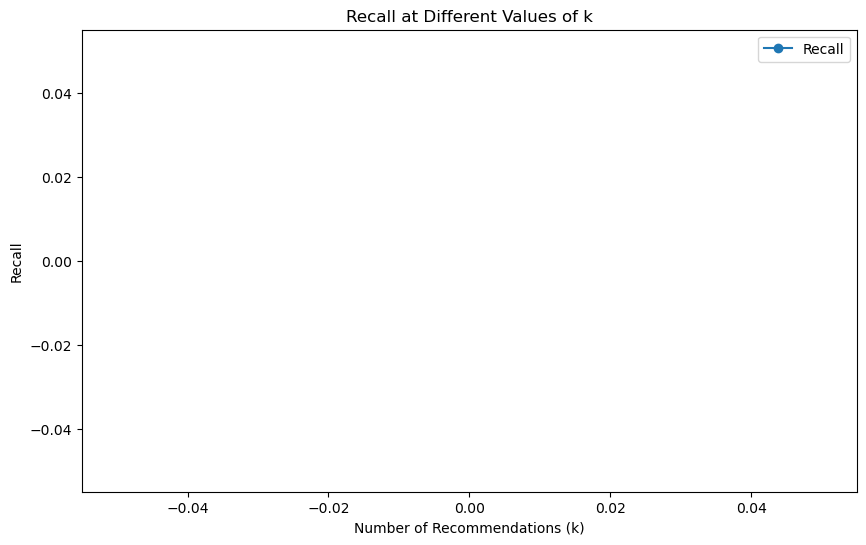

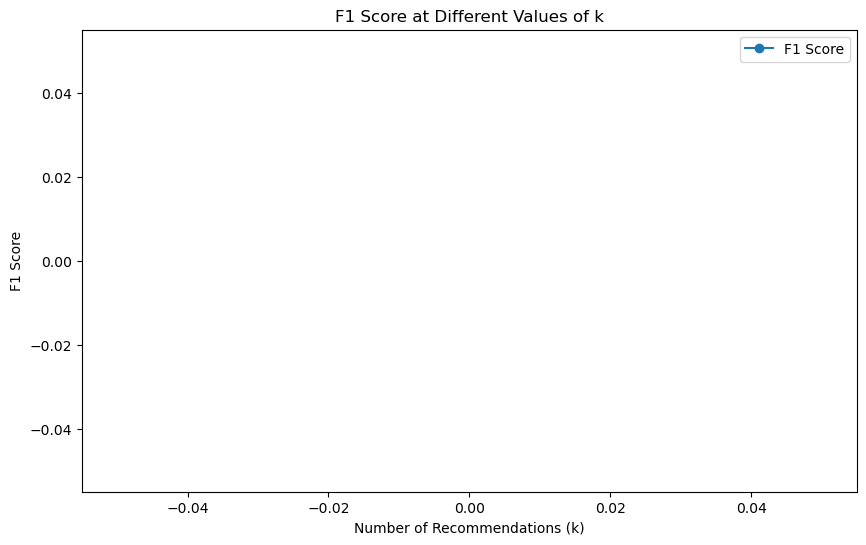

In [28]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            if np.any(np.isnan(distances)):
                diversity_scores.append(0)
            else:
                diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o', label=metric)
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.legend()
        plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in ratings_df['userId'].unique()[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                rec_metrics = calculate_recommendation_metrics(recommendations_k, ratings_df)
                metrics_at_k[k] = rec_metrics

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.22, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.67, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 1961, Hybrid Score: 4.09, Title: Rain Man (1988), CF Score: 4.17, CBF Score: 4.26, Popularity Penalty: 0.2333, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.04, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 3.54, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 81845, Hybrid Score: 4.03, Title: King's Speech, The (2010), CF Score: 4.04, CBF Score: 4.27, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 2976, Hybrid Score: 4.00, Title: Bringing Out the Dead (1999), CF Score: 3.85, CBF Score: 4.27, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 2571, Hybrid Score: 4.15, Title: Matrix, The (1999), CF Score: 4.74, CBF Score: 4.04, Popularity Penalty: 0.6333, Diversity Penalty: 0.0000
Movie ID: 6874, Hybrid Score: 4.05, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.26, CBF Score: 4.11, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.03, Title: Black Swan (2010), CF Score: 4.17, CBF Score: 4.05, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.01, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 3.89, Title: American Beauty (1999), CF Score: 4.51, CBF Score: 3.63, Popularity Penalty: 0.5000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 6874, Hybrid Score: 4.16, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.59, CBF Score: 3.93, Popularity Penalty: 0.3000, Diversity Penalty: 0.0333
Movie ID: 2858, Hybrid Score: 4.10, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.47, Popularity Penalty: 0.5000, Diversity Penalty: 0.0667
Movie ID: 2571, Hybrid Score: 4.02, Title: Matrix, The (1999), CF Score: 4.72, CBF Score: 3.80, Popularity Penalty: 0.6333, Diversity Penalty: 0.0333
Movie ID: 1198, Hybrid Score: 3.95, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.32, CBF Score: 3.94, Popularity Penalty: 0.4333, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 3.95, Title: Lost in Translation (2003), CF Score: 4.63, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 82:
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.17, Popularity Penalty: 0.5000, Diversity Penalty: 0.1000
Movie ID: 6874, Hybrid Score: 3.79, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.31, CBF Score: 3.46, Popularity Penalty: 0.3000, Diversity Penalty: 0.0667
Movie ID: 3473, Hybrid Score: 3.71, Title: Jonah Who Will Be 25 in the Year 2000 (Jonas qui aura 25 ans en l'an 2000) (1976), CF Score: 3.39, CBF Score: 4.24, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.70, Title: Pulp Fiction (1994), CF Score: 4.69, CBF Score: 2.93, Popularity Penalty: 0.5333, Diversity Penalty: 0.0333
Movie ID: 318, Hybrid Score: 3.68, Title: Shawshank Redemption, The (1994), CF Score: 4.54, CBF Score: 3.30, Popularity Penalty: 0.7000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 132:
Movie ID: 2501, Hybrid Score: 4.31, Title: October Sky (1999), CF Score: 4.35, CBF Score: 4.38, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.31, Title: Black Swan (2010), CF Score: 4.74, CBF Score: 3.91, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 2542, Hybrid Score: 4.22, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 971, Hybrid Score: 4.19, Title: Cat on a Hot Tin Roof (1958), CF Score: 4.11, CBF Score: 4.36, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.16, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.76, CBF Score: 3.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 156:
Movie ID: 3543, Hybrid Score: 4.41, Title: Diner (1982), CF Score: 4.38, CBF Score: 4.50, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 44199, Hybrid Score: 4.28, Title: Inside Man (2006), CF Score: 5.00, CBF Score: 3.45, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 5500, Hybrid Score: 4.26, Title: Top Secret! (1984), CF Score: 4.16, CBF Score: 4.44, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7451, Hybrid Score: 4.19, Title: Mean Girls (2004), CF Score: 4.11, CBF Score: 4.44, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 2501, Hybrid Score: 4.17, Title: October Sky (1999), CF Score: 4.08, CBF Score: 4.48, Popularity Penalty: 0.1000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 164:
Movie ID: 2571, Hybrid Score: 4.25, Title: Matrix, The (1999), CF Score: 4.80, CBF Score: 4.29, Popularity Penalty: 0.6333, Diversity Penalty: 0.0667
Movie ID: 6874, Hybrid Score: 4.10, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.62, CBF Score: 3.82, Popularity Penalty: 0.3000, Diversity Penalty: 0.1000
Movie ID: 3030, Hybrid Score: 3.97, Title: Yojimbo (1961), CF Score: 3.68, CBF Score: 4.53, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1374, Hybrid Score: 3.96, Title: Star Trek II: The Wrath of Khan (1982), CF Score: 3.86, CBF Score: 4.28, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.93, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 3.78, CBF Score: 4.27, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 177:
Movie ID: 4226, Hybrid Score: 4.17, Title: Memento (2000), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2542, Hybrid Score: 4.12, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 4.86, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 3152, Hybrid Score: 4.00, Title: Last Picture Show, The (1971), CF Score: 3.84, CBF Score: 4.28, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 171495, Hybrid Score: 4.00, Title: Cosmos, CF Score: 3.36, CBF Score: 5.00, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 1883, Hybrid Score: 3.94, Title: Bulworth (1998), CF Score: 4.09, CBF Score: 3.80, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 193:
Movie ID: 529, Hybrid Score: 4.25, Title: Searching for Bobby Fischer (1993), CF Score: 4.26, CBF Score: 4.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 4.22, Title: Lost in Translation (2003), CF Score: 4.88, CBF Score: 3.60, Popularity Penalty: 0.2667, Diversity Penalty: 0.0333
Movie ID: 1596, Hybrid Score: 4.18, Title: Career Girls (1997), CF Score: 4.03, CBF Score: 4.45, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.12, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.80, CBF Score: 3.52, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 3317, Hybrid Score: 4.11, Title: Wonder Boys (2000), CF Score: 4.25, CBF Score: 4.07, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 197:
Movie ID: 2858, Hybrid Score: 4.21, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.83, Popularity Penalty: 0.5000, Diversity Penalty: 0.1333
Movie ID: 529, Hybrid Score: 4.01, Title: Searching for Bobby Fischer (1993), CF Score: 3.98, CBF Score: 4.30, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 4973, Hybrid Score: 3.86, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.28, CBF Score: 3.58, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 3160, Hybrid Score: 3.82, Title: Magnolia (1999), CF Score: 3.60, CBF Score: 4.30, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 1207, Hybrid Score: 3.81, Title: To Kill a Mockingbird (1962), CF Score: 3.60, CBF Score: 4.29, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Catalog Coverage: 0.35%
Average Novelty: 7.8400
Personalization: 0.9291
Serendipity: -3965195.3292
Intra-list Diversity: 0.9000
Hit Rate: 0.0000
Mean Reci

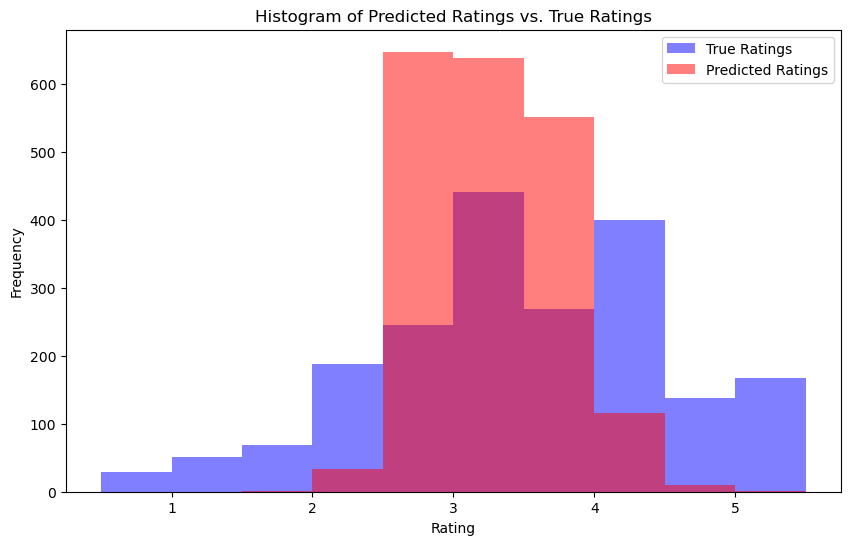

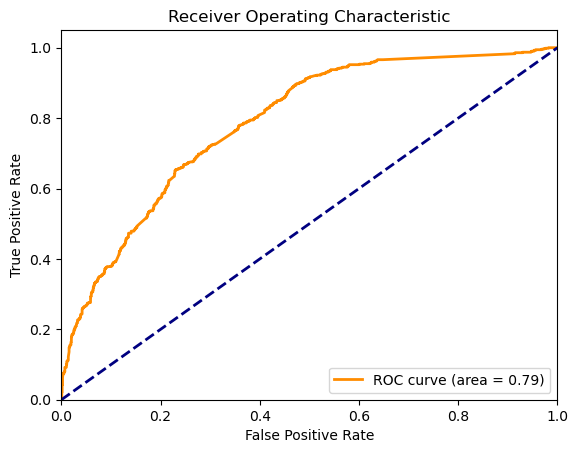

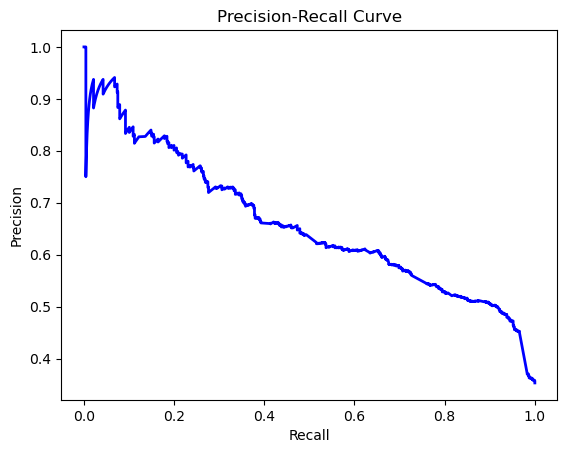

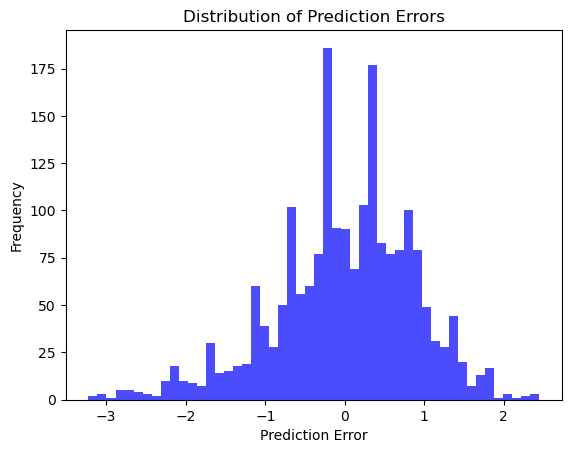

C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv

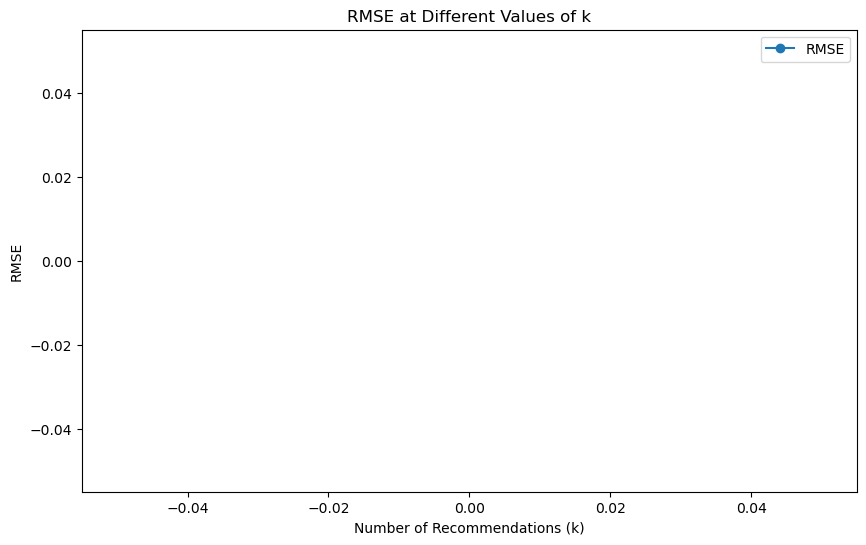

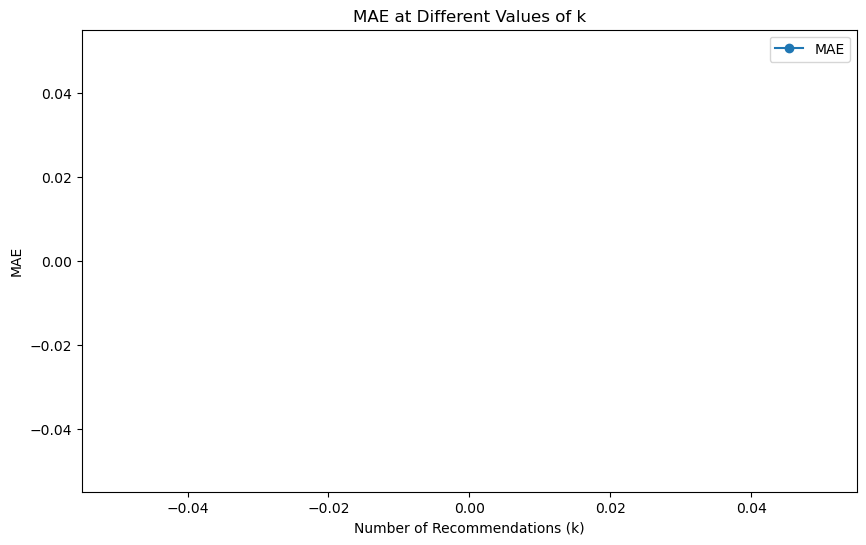

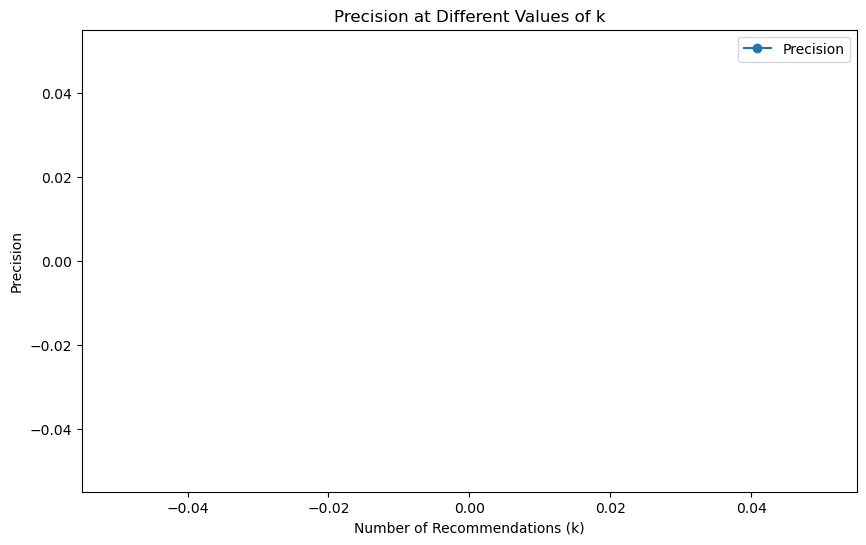

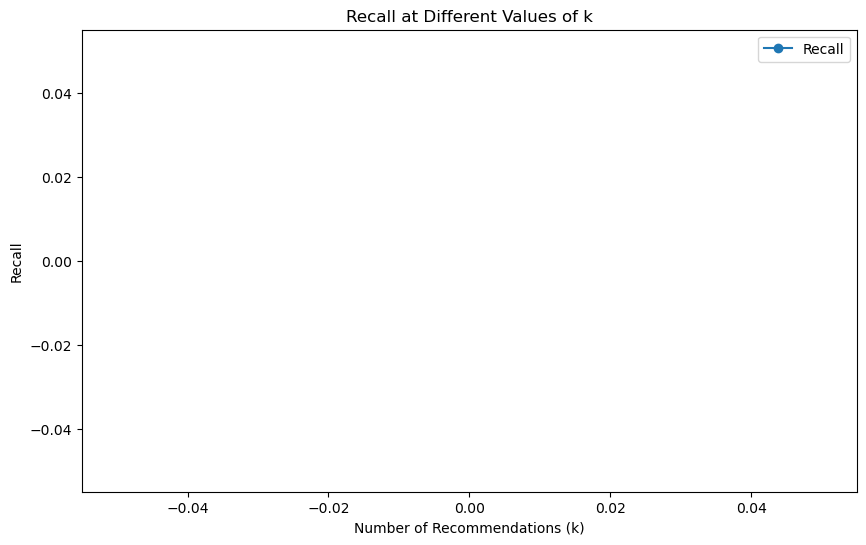

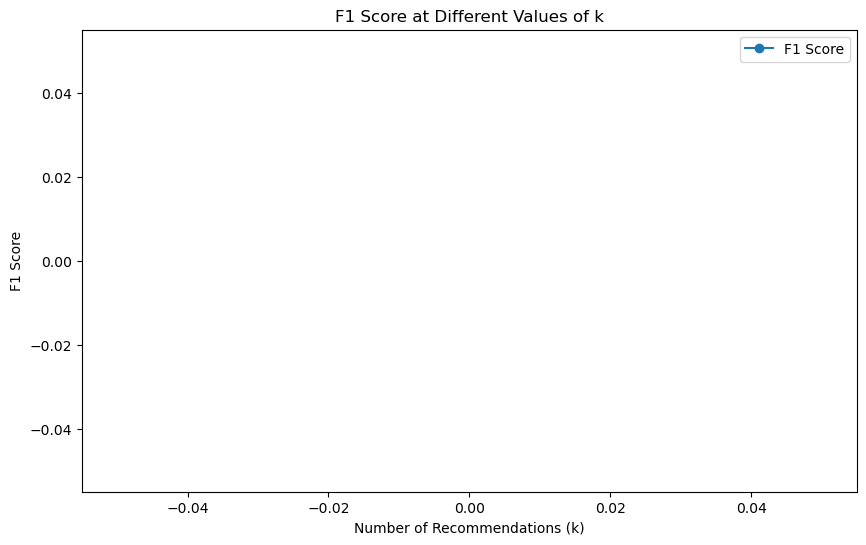

In [30]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            if np.any(np.isnan(distances)):
                diversity_scores.append(0)
            else:
                diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o', label=metric)
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.legend()
        plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in ratings_df['userId'].unique()[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                rec_metrics = calculate_recommendation_metrics(recommendations_k, ratings_df)
                metrics_at_k[k] = rec_metrics

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.22, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.67, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 1961, Hybrid Score: 4.09, Title: Rain Man (1988), CF Score: 4.17, CBF Score: 4.26, Popularity Penalty: 0.2333, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.04, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 3.54, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 81845, Hybrid Score: 4.03, Title: King's Speech, The (2010), CF Score: 4.04, CBF Score: 4.27, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 2976, Hybrid Score: 4.00, Title: Bringing Out the Dead (1999), CF Score: 3.85, CBF Score: 4.27, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 2571, Hybrid Score: 4.15, Title: Matrix, The (1999), CF Score: 4.74, CBF Score: 4.04, Popularity Penalty: 0.6333, Diversity Penalty: 0.0000
Movie ID: 6874, Hybrid Score: 4.05, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.26, CBF Score: 4.11, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.03, Title: Black Swan (2010), CF Score: 4.17, CBF Score: 4.05, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.01, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 3.89, Title: American Beauty (1999), CF Score: 4.51, CBF Score: 3.63, Popularity Penalty: 0.5000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 6874, Hybrid Score: 4.16, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.59, CBF Score: 3.93, Popularity Penalty: 0.3000, Diversity Penalty: 0.0333
Movie ID: 2858, Hybrid Score: 4.10, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.47, Popularity Penalty: 0.5000, Diversity Penalty: 0.0667
Movie ID: 2571, Hybrid Score: 4.02, Title: Matrix, The (1999), CF Score: 4.72, CBF Score: 3.80, Popularity Penalty: 0.6333, Diversity Penalty: 0.0333
Movie ID: 1198, Hybrid Score: 3.95, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.32, CBF Score: 3.94, Popularity Penalty: 0.4333, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 3.95, Title: Lost in Translation (2003), CF Score: 4.63, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 82:
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.17, Popularity Penalty: 0.5000, Diversity Penalty: 0.1000
Movie ID: 6874, Hybrid Score: 3.79, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.31, CBF Score: 3.46, Popularity Penalty: 0.3000, Diversity Penalty: 0.0667
Movie ID: 3473, Hybrid Score: 3.71, Title: Jonah Who Will Be 25 in the Year 2000 (Jonas qui aura 25 ans en l'an 2000) (1976), CF Score: 3.39, CBF Score: 4.24, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.70, Title: Pulp Fiction (1994), CF Score: 4.69, CBF Score: 2.93, Popularity Penalty: 0.5333, Diversity Penalty: 0.0333
Movie ID: 318, Hybrid Score: 3.68, Title: Shawshank Redemption, The (1994), CF Score: 4.54, CBF Score: 3.30, Popularity Penalty: 0.7000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 132:
Movie ID: 2501, Hybrid Score: 4.31, Title: October Sky (1999), CF Score: 4.35, CBF Score: 4.38, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.31, Title: Black Swan (2010), CF Score: 4.74, CBF Score: 3.91, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 2542, Hybrid Score: 4.22, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 971, Hybrid Score: 4.19, Title: Cat on a Hot Tin Roof (1958), CF Score: 4.11, CBF Score: 4.36, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.16, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.76, CBF Score: 3.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 156:
Movie ID: 3543, Hybrid Score: 4.41, Title: Diner (1982), CF Score: 4.38, CBF Score: 4.50, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 44199, Hybrid Score: 4.28, Title: Inside Man (2006), CF Score: 5.00, CBF Score: 3.45, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 5500, Hybrid Score: 4.26, Title: Top Secret! (1984), CF Score: 4.16, CBF Score: 4.44, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7451, Hybrid Score: 4.19, Title: Mean Girls (2004), CF Score: 4.11, CBF Score: 4.44, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 2501, Hybrid Score: 4.17, Title: October Sky (1999), CF Score: 4.08, CBF Score: 4.48, Popularity Penalty: 0.1000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 164:
Movie ID: 2571, Hybrid Score: 4.25, Title: Matrix, The (1999), CF Score: 4.80, CBF Score: 4.29, Popularity Penalty: 0.6333, Diversity Penalty: 0.0667
Movie ID: 6874, Hybrid Score: 4.10, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.62, CBF Score: 3.82, Popularity Penalty: 0.3000, Diversity Penalty: 0.1000
Movie ID: 3030, Hybrid Score: 3.97, Title: Yojimbo (1961), CF Score: 3.68, CBF Score: 4.53, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1374, Hybrid Score: 3.96, Title: Star Trek II: The Wrath of Khan (1982), CF Score: 3.86, CBF Score: 4.28, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.93, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 3.78, CBF Score: 4.27, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 177:
Movie ID: 4226, Hybrid Score: 4.17, Title: Memento (2000), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2542, Hybrid Score: 4.12, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 4.86, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 3152, Hybrid Score: 4.00, Title: Last Picture Show, The (1971), CF Score: 3.84, CBF Score: 4.28, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 171495, Hybrid Score: 4.00, Title: Cosmos, CF Score: 3.36, CBF Score: 5.00, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 1883, Hybrid Score: 3.94, Title: Bulworth (1998), CF Score: 4.09, CBF Score: 3.80, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 193:
Movie ID: 529, Hybrid Score: 4.25, Title: Searching for Bobby Fischer (1993), CF Score: 4.26, CBF Score: 4.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 4.22, Title: Lost in Translation (2003), CF Score: 4.88, CBF Score: 3.60, Popularity Penalty: 0.2667, Diversity Penalty: 0.0333
Movie ID: 1596, Hybrid Score: 4.18, Title: Career Girls (1997), CF Score: 4.03, CBF Score: 4.45, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.12, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.80, CBF Score: 3.52, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 3317, Hybrid Score: 4.11, Title: Wonder Boys (2000), CF Score: 4.25, CBF Score: 4.07, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 197:
Movie ID: 2858, Hybrid Score: 4.21, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.83, Popularity Penalty: 0.5000, Diversity Penalty: 0.1333
Movie ID: 529, Hybrid Score: 4.01, Title: Searching for Bobby Fischer (1993), CF Score: 3.98, CBF Score: 4.30, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 4973, Hybrid Score: 3.86, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.28, CBF Score: 3.58, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 3160, Hybrid Score: 3.82, Title: Magnolia (1999), CF Score: 3.60, CBF Score: 4.30, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 1207, Hybrid Score: 3.81, Title: To Kill a Mockingbird (1962), CF Score: 3.60, CBF Score: 4.29, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Catalog Coverage: 0.35%
Average Novelty: 7.8400
Personalization: 0.9291
Serendipity: -3965195.3292
Intra-list Diversity: 0.9000
Hit Rate: 0.0000
Mean Reci

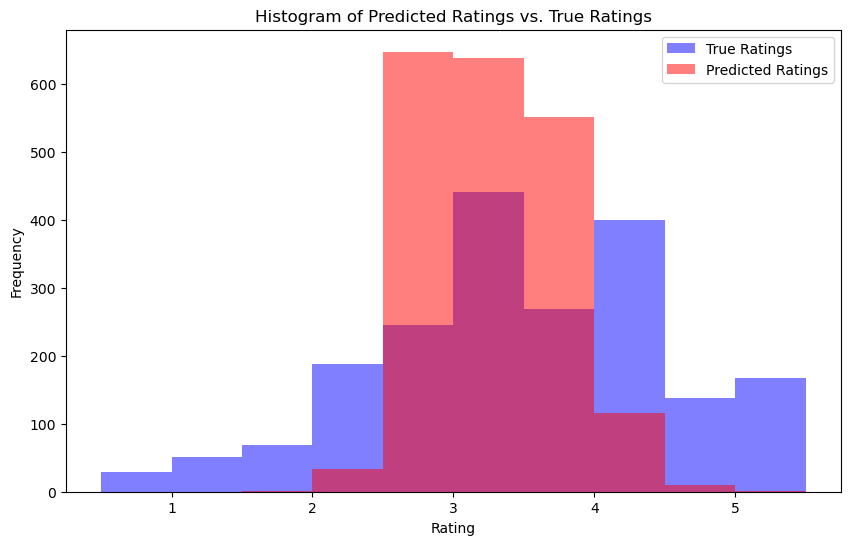

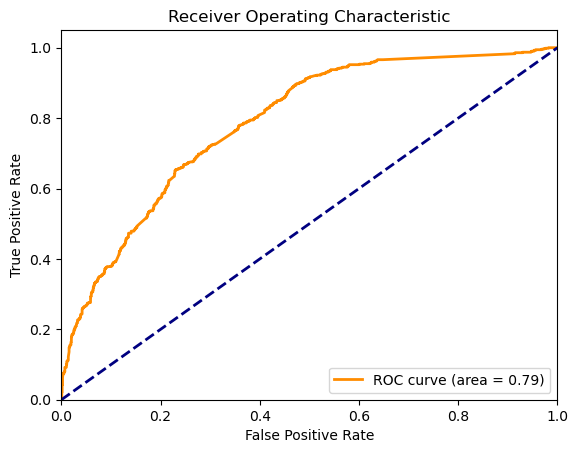

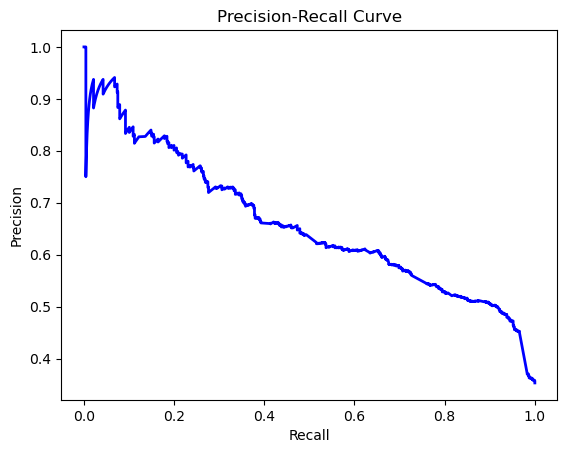

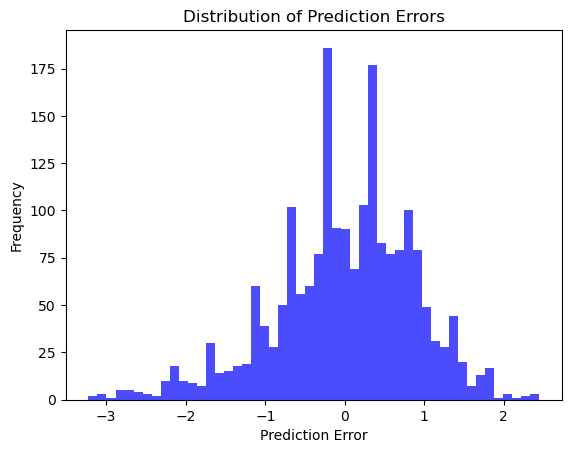

C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv

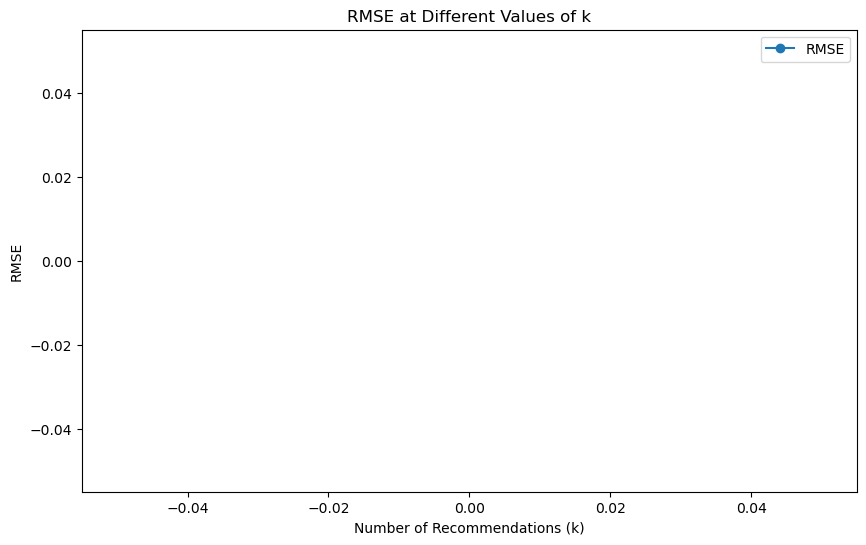

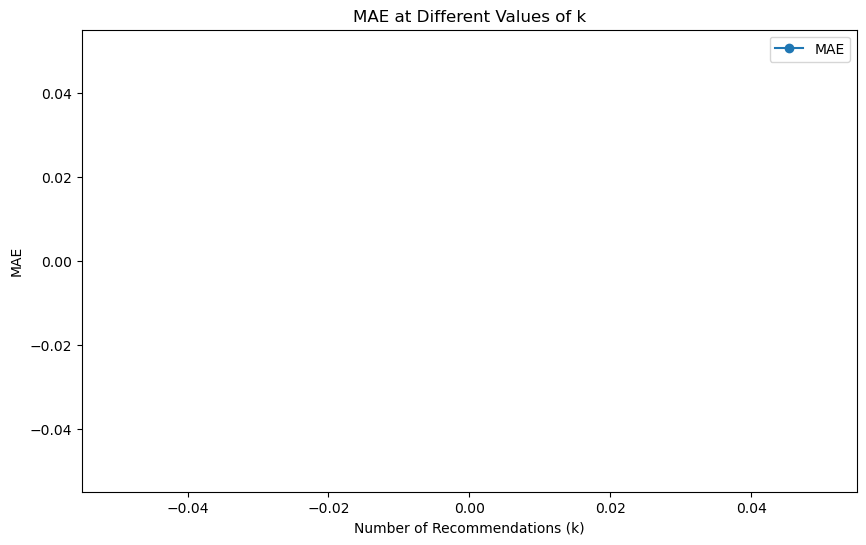

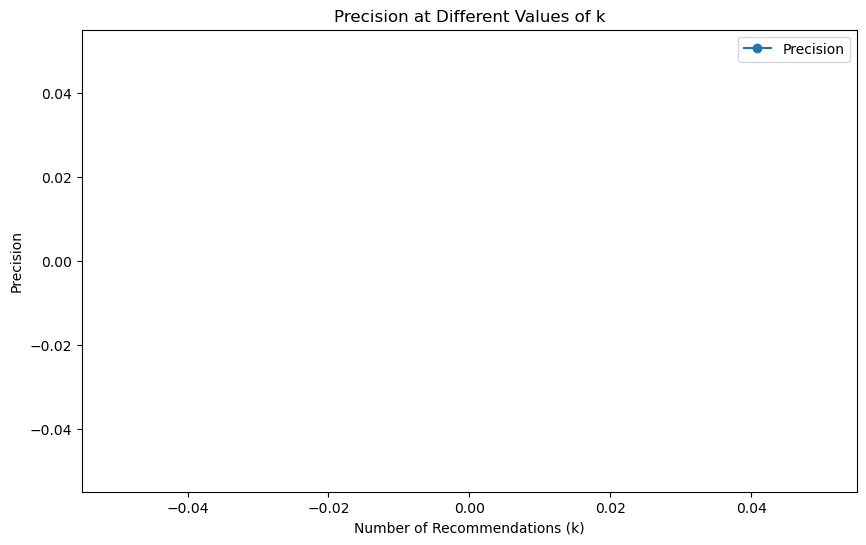

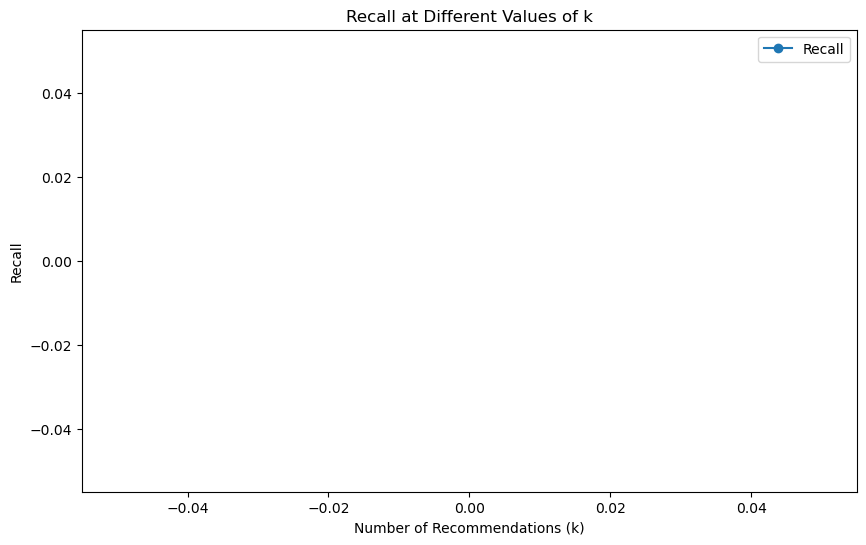

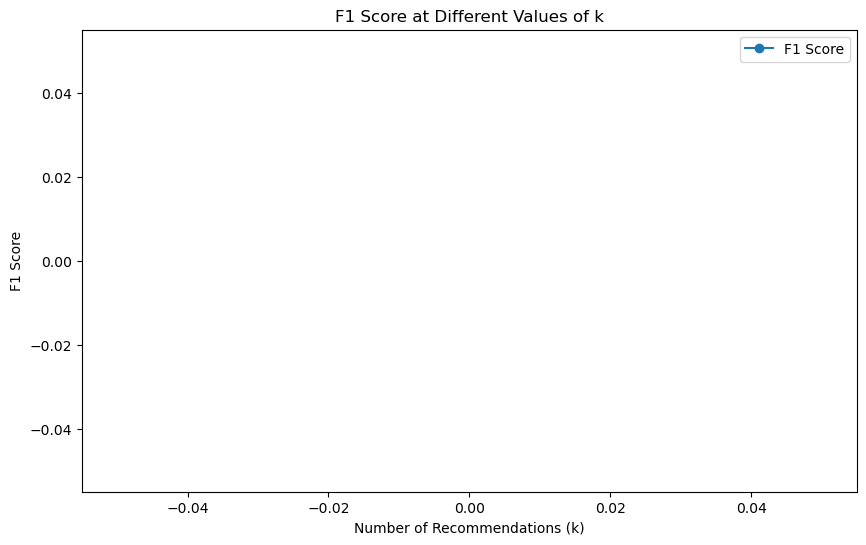

In [32]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])

                # Replace NaN or inf values with 0
                item_feature_vector = np.nan_to_num(item_feature_vector)
                user_pref_vector = np.nan_to_num(user_pref_vector)
                
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            if np.any(np.isnan(distances)):
                diversity_scores.append(0)
            else:
                diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o', label=metric)
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.legend()
        plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in ratings_df['userId'].unique()[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                rec_metrics = calculate_recommendation_metrics(recommendations_k, ratings_df)
                metrics_at_k[k] = rec_metrics

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


RMSE: 0.8669
MAE: 0.6679
Precision: 0.8151
Recall: 0.2624
F1 Score: 0.3970


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 1080, Hybrid Score: 4.41, Title: Monty Python's Life of Brian (1979), CF Score: 4.90, CBF Score: 3.96, Popularity Penalty: 0.2200, Diversity Penalty: 0.0000
Movie ID: 1704, Hybrid Score: 4.22, Title: Good Will Hunting (1997), CF Score: 4.84, CBF Score: 3.67, Popularity Penalty: 0.3100, Diversity Penalty: 0.0000
Movie ID: 3451, Hybrid Score: 4.04, Title: Guess Who's Coming to Dinner (1967), CF Score: 3.94, CBF Score: 4.25, Popularity Penalty: 0.0500, Diversity Penalty: 0.0000
Movie ID: 48516, Hybrid Score: 4.03, Title: Departed, The (2006), CF Score: 4.89, CBF Score: 3.05, Popularity Penalty: 0.2400, Diversity Penalty: 0.0000
Movie ID: 3083, Hybrid Score: 4.03, Title: All About My Mother (Todo sobre mi madre) (1999), CF Score: 3.91, CBF Score: 4.27, Popularity Penalty: 0.0500, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 7:
Movie ID: 318, Hybrid Score: 4.12, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 3.48, Popularity Penalty: 0.5400, Diversity Penalty: 0.0000
Movie ID: 3949, Hybrid Score: 3.91, Title: Requiem for a Dream (2000), CF Score: 4.04, CBF Score: 4.06, Popularity Penalty: 0.2700, Diversity Penalty: 0.0000
Movie ID: 1198, Hybrid Score: 3.83, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.15, CBF Score: 3.87, Popularity Penalty: 0.4200, Diversity Penalty: 0.0000
Movie ID: 1673, Hybrid Score: 3.80, Title: Boogie Nights (1997), CF Score: 3.73, CBF Score: 4.06, Popularity Penalty: 0.1200, Diversity Penalty: 0.0000
Movie ID: 171749, Hybrid Score: 3.77, Title: Death Note: Desu nôto (2006–2007), CF Score: 2.96, CBF Score: 5.00, Popularity Penalty: 0.0100, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 3949, Hybrid Score: 4.15, Title: Requiem for a Dream (2000), CF Score: 4.46, CBF Score: 4.04, Popularity Penalty: 0.2700, Diversity Penalty: 0.0100
Movie ID: 541, Hybrid Score: 4.13, Title: Blade Runner (1982), CF Score: 4.45, CBF Score: 4.02, Popularity Penalty: 0.2900, Diversity Penalty: 0.0000
Movie ID: 2959, Hybrid Score: 4.13, Title: Fight Club (1999), CF Score: 4.60, CBF Score: 3.93, Popularity Penalty: 0.4100, Diversity Penalty: 0.0000
Movie ID: 3275, Hybrid Score: 4.09, Title: Boondock Saints, The (2000), CF Score: 4.32, CBF Score: 3.93, Popularity Penalty: 0.1400, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.02, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 25:
Movie ID: 2019, Hybrid Score: 4.61, Title: Seven Samurai (Shichinin no samurai) (1954), CF Score: 4.94, CBF Score: 4.26, Popularity Penalty: 0.1100, Diversity Penalty: 0.0000
Movie ID: 3949, Hybrid Score: 4.38, Title: Requiem for a Dream (2000), CF Score: 4.77, CBF Score: 4.15, Popularity Penalty: 0.2700, Diversity Penalty: 0.0200
Movie ID: 112852, Hybrid Score: 4.36, Title: Guardians of the Galaxy (2014), CF Score: 4.59, CBF Score: 4.16, Popularity Penalty: 0.1200, Diversity Penalty: 0.0000
Movie ID: 1208, Hybrid Score: 4.35, Title: Apocalypse Now (1979), CF Score: 4.97, CBF Score: 3.73, Popularity Penalty: 0.2400, Diversity Penalty: 0.0000
Movie ID: 1080, Hybrid Score: 4.32, Title: Monty Python's Life of Brian (1979), CF Score: 5.00, CBF Score: 3.58, Popularity Penalty: 0.2200, Diversity Penalty: 0.0100


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 30:
Movie ID: 2019, Hybrid Score: 4.32, Title: Seven Samurai (Shichinin no samurai) (1954), CF Score: 4.66, CBF Score: 3.94, Popularity Penalty: 0.1100, Diversity Penalty: 0.0100
Movie ID: 541, Hybrid Score: 4.15, Title: Blade Runner (1982), CF Score: 4.63, CBF Score: 3.80, Popularity Penalty: 0.2900, Diversity Penalty: 0.0100
Movie ID: 1208, Hybrid Score: 4.13, Title: Apocalypse Now (1979), CF Score: 4.97, CBF Score: 3.18, Popularity Penalty: 0.2400, Diversity Penalty: 0.0100
Movie ID: 2692, Hybrid Score: 4.05, Title: Run Lola Run (Lola rennt) (1998), CF Score: 4.31, CBF Score: 3.91, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 1080, Hybrid Score: 4.03, Title: Monty Python's Life of Brian (1979), CF Score: 4.61, CBF Score: 3.46, Popularity Penalty: 0.2200, Diversity Penalty: 0.0200


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 31:
Movie ID: 1080, Hybrid Score: 4.14, Title: Monty Python's Life of Brian (1979), CF Score: 4.22, CBF Score: 4.33, Popularity Penalty: 0.2200, Diversity Penalty: 0.0300
Movie ID: 318, Hybrid Score: 4.10, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 3.43, Popularity Penalty: 0.5400, Diversity Penalty: 0.0100
Movie ID: 1704, Hybrid Score: 3.98, Title: Good Will Hunting (1997), CF Score: 4.34, CBF Score: 3.84, Popularity Penalty: 0.3100, Diversity Penalty: 0.0100
Movie ID: 4973, Hybrid Score: 3.97, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.15, CBF Score: 4.06, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 2019, Hybrid Score: 3.89, Title: Seven Samurai (Shichinin no samurai) (1954), CF Score: 4.31, CBF Score: 3.42, Popularity Penalty: 0.1100, Diversity Penalty: 0.0200


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 40:
Movie ID: 1080, Hybrid Score: 4.47, Title: Monty Python's Life of Brian (1979), CF Score: 4.79, CBF Score: 4.31, Popularity Penalty: 0.2200, Diversity Penalty: 0.0400
Movie ID: 1704, Hybrid Score: 4.22, Title: Good Will Hunting (1997), CF Score: 4.64, CBF Score: 4.01, Popularity Penalty: 0.3100, Diversity Penalty: 0.0200
Movie ID: 2858, Hybrid Score: 4.20, Title: American Beauty (1999), CF Score: 4.71, CBF Score: 4.01, Popularity Penalty: 0.4500, Diversity Penalty: 0.0000
Movie ID: 1193, Hybrid Score: 4.13, Title: One Flew Over the Cuckoo's Nest (1975), CF Score: 4.15, CBF Score: 4.45, Popularity Penalty: 0.2800, Diversity Penalty: 0.0000
Movie ID: 3897, Hybrid Score: 4.08, Title: Almost Famous (2000), CF Score: 3.98, CBF Score: 4.46, Popularity Penalty: 0.1900, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 2959, Hybrid Score: 4.28, Title: Fight Club (1999), CF Score: 5.00, CBF Score: 3.74, Popularity Penalty: 0.4100, Diversity Penalty: 0.0100
Movie ID: 1080, Hybrid Score: 4.21, Title: Monty Python's Life of Brian (1979), CF Score: 4.54, CBF Score: 4.05, Popularity Penalty: 0.2200, Diversity Penalty: 0.0500
Movie ID: 1198, Hybrid Score: 3.97, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.35, CBF Score: 3.94, Popularity Penalty: 0.4200, Diversity Penalty: 0.0100
Movie ID: 2019, Hybrid Score: 3.84, Title: Seven Samurai (Shichinin no samurai) (1954), CF Score: 4.05, CBF Score: 3.70, Popularity Penalty: 0.1100, Diversity Penalty: 0.0300
Movie ID: 3275, Hybrid Score: 3.82, Title: Boondock Saints, The (2000), CF Score: 4.00, CBF Score: 3.74, Popularity Penalty: 0.1400, Diversity Penalty: 0.0100


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 64:
Movie ID: 1080, Hybrid Score: 4.43, Title: Monty Python's Life of Brian (1979), CF Score: 4.79, CBF Score: 4.25, Popularity Penalty: 0.2200, Diversity Penalty: 0.0600
Movie ID: 81845, Hybrid Score: 4.22, Title: King's Speech, The (2010), CF Score: 4.24, CBF Score: 4.34, Popularity Penalty: 0.1100, Diversity Penalty: 0.0000
Movie ID: 899, Hybrid Score: 4.11, Title: Singin' in the Rain (1952), CF Score: 5.00, CBF Score: 2.90, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 910, Hybrid Score: 4.04, Title: Some Like It Hot (1959), CF Score: 4.38, CBF Score: 3.67, Popularity Penalty: 0.1200, Diversity Penalty: 0.0000
Movie ID: 1230, Hybrid Score: 4.02, Title: Annie Hall (1977), CF Score: 4.33, CBF Score: 3.73, Popularity Penalty: 0.1500, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 71:
Movie ID: 3030, Hybrid Score: 4.17, Title: Yojimbo (1961), CF Score: 4.18, CBF Score: 4.24, Popularity Penalty: 0.0600, Diversity Penalty: 0.0000
Movie ID: 1172, Hybrid Score: 4.13, Title: Cinema Paradiso (Nuovo cinema Paradiso) (1989), CF Score: 4.42, CBF Score: 3.80, Popularity Penalty: 0.0900, Diversity Penalty: 0.0000
Movie ID: 2019, Hybrid Score: 4.07, Title: Seven Samurai (Shichinin no samurai) (1954), CF Score: 4.36, CBF Score: 3.83, Popularity Penalty: 0.1100, Diversity Penalty: 0.0400
Movie ID: 2959, Hybrid Score: 4.05, Title: Fight Club (1999), CF Score: 4.90, CBF Score: 3.30, Popularity Penalty: 0.4100, Diversity Penalty: 0.0200
Movie ID: 318, Hybrid Score: 4.02, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.5400, Diversity Penalty: 0.0200
Catalog Coverage: 0.29%
Average Novelty: 24.0000
Personalization: 0.8750
Serendipity: 0.0000
Intra-list Diversity: 0.9000
Hit Rate: 0.0000
Mean Reciprocal

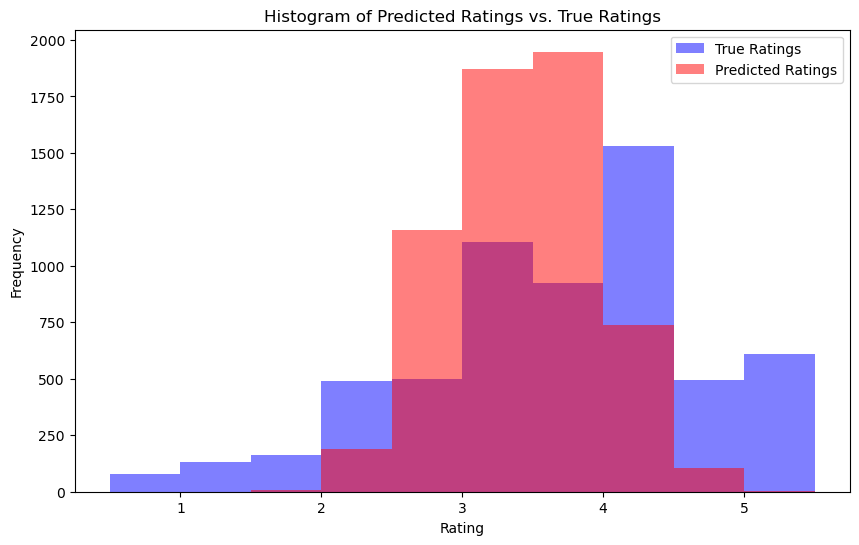

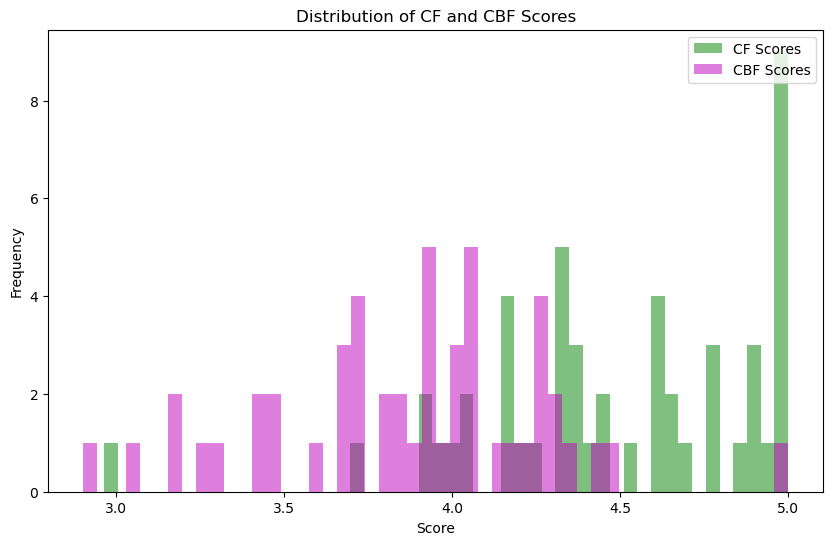

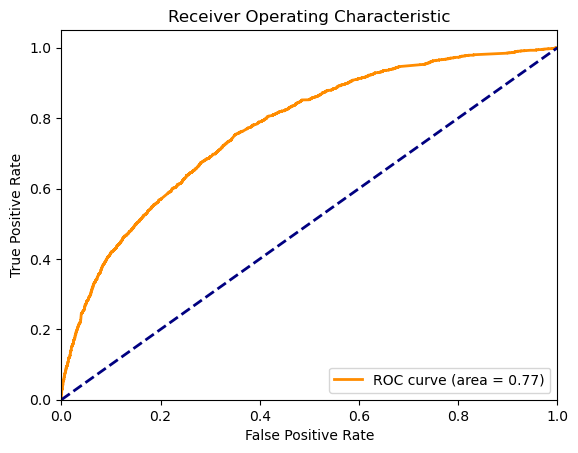

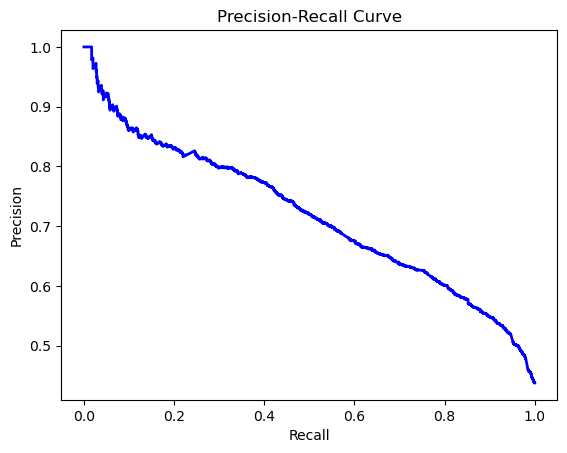

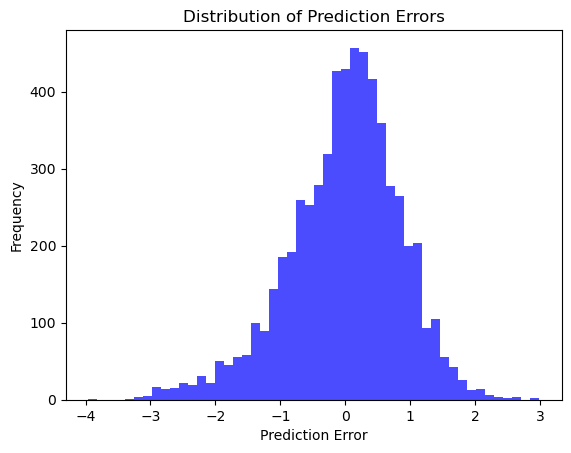

C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv

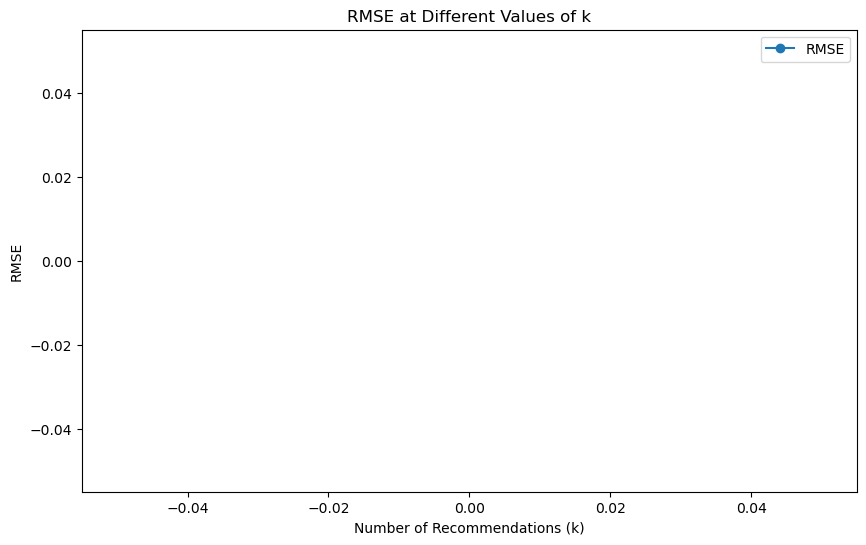

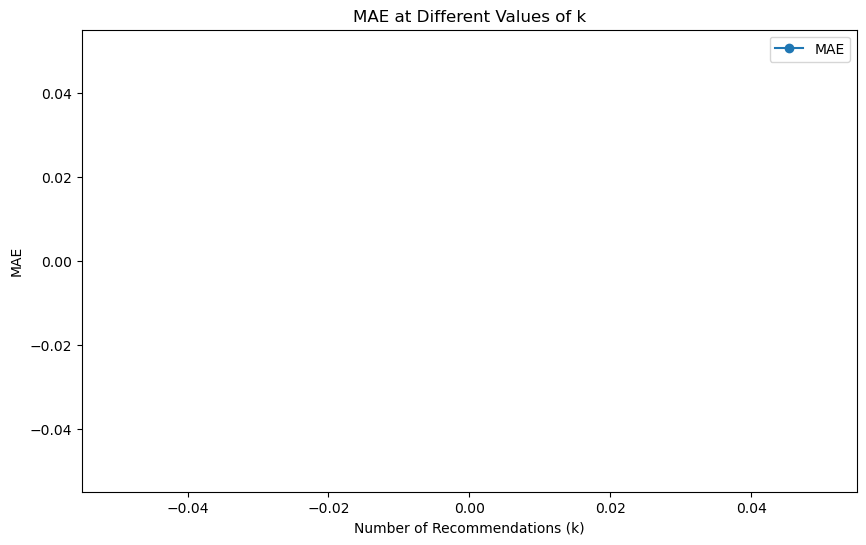

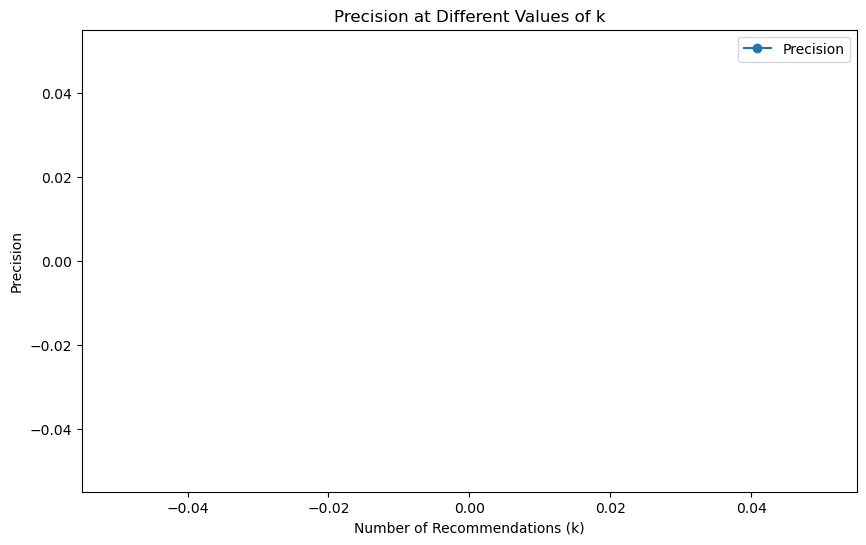

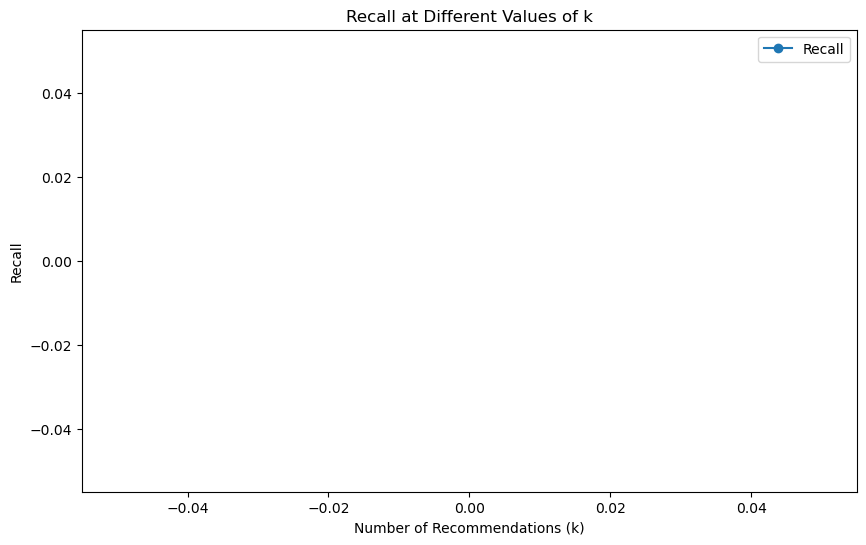

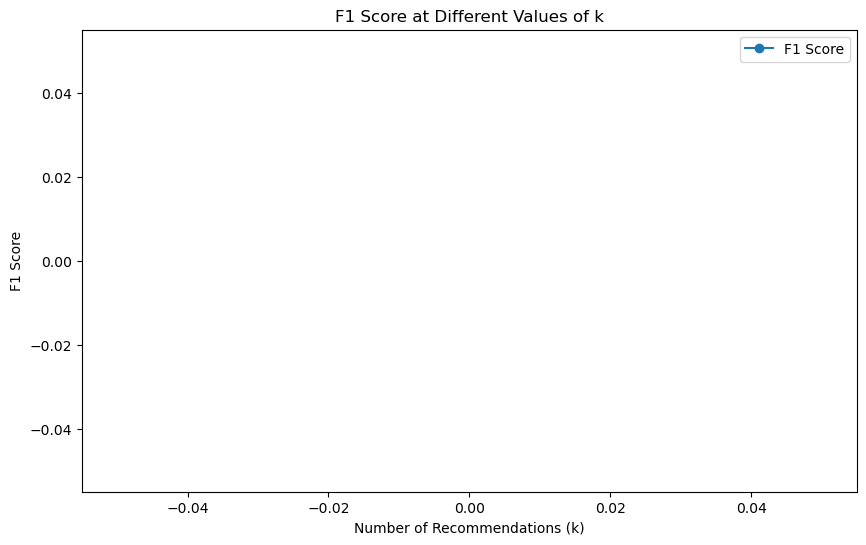

In [35]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.9

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])

                # Replace NaN or inf values with 0
                item_feature_vector = np.nan_to_num(item_feature_vector)
                user_pref_vector = np.nan_to_num(user_pref_vector)
                
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            if np.any(np.isnan(distances)):
                diversity_scores.append(0)
            else:
                diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_cf_cbf_distribution(cf_scores, cbf_scores):
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=50, alpha=0.5, label='CF Scores', color='g')
    plt.hist(cbf_scores, bins=50, alpha=0.5, label='CBF Scores', color='m')
    plt.xlabel('Score')
    plt.ylabel('Frequency')
    plt.title('Distribution of CF and CBF Scores')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o', label=metric)
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.legend()
        plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            cf_scores_all = []
            cbf_scores_all = []
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")
                    cf_scores_all.append(rec[3])
                    cbf_scores_all.append(rec[4])

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            plot_cf_cbf_distribution(cf_scores_all, cbf_scores_all)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in ratings_df['userId'].unique()[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                rec_metrics = calculate_recommendation_metrics(recommendations_k, ratings_df)
                metrics_at_k[k] = rec_metrics

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


DEBUG:root:Starting main function.
DEBUG:root:Loading movies and ratings data.
DEBUG:root:Data loaded successfully.
DEBUG:root:Loaded data successfully, proceeding with user sampling.
DEBUG:root:Sampling users.
DEBUG:root:User sampling completed.
DEBUG:root:User sampling completed, proceeding with dataset merging.
DEBUG:root:Merging datasets.
DEBUG:root:Datasets merged successfully.
DEBUG:root:Datasets merged successfully, proceeding with genre processing.
DEBUG:root:Processing genres.
DEBUG:root:Genres processed successfully.
DEBUG:root:Genres processed successfully, proceeding with time decay application.
DEBUG:root:Applying time decay to ratings.
DEBUG:root:Time decay applied successfully.
DEBUG:root:Time decay applied successfully, proceeding with collaborative filtering.
DEBUG:root:Model metrics calculated successfully, proceeding with feature extraction.
DEBUG:root:Extracting item features.
DEBUG:root:Item features extracted successfully.
DEBUG:root:Deriving user preferences.
DEB

RMSE: 0.8723
MAE: 0.6699
Precision: 0.8032
Recall: 0.3098
F1 Score: 0.4471


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
DEBUG:root:Recommendations generated for user 1.
DEBUG:root:Generating recommendations for user 3.


Top 5 recommendations for User 1:
Movie ID: 32587, Hybrid Score: 4.92, Title: Sin City (2005), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.1500, Diversity Penalty: 0.0000
Movie ID: 541, Hybrid Score: 4.88, Title: Blade Runner (1982), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.2300, Diversity Penalty: 0.0000
Movie ID: 49272, Hybrid Score: 4.87, Title: Casino Royale (2006), CF Score: 4.94, CBF Score: 5.00, Popularity Penalty: 0.1650, Diversity Penalty: 0.0000
Movie ID: 6016, Hybrid Score: 4.85, Title: City of God (Cidade de Deus) (2002), CF Score: 4.89, CBF Score: 5.00, Popularity Penalty: 0.1300, Diversity Penalty: 0.0000
Movie ID: 1193, Hybrid Score: 4.84, Title: One Flew Over the Cuckoo's Nest (1975), CF Score: 4.96, CBF Score: 5.00, Popularity Penalty: 0.2450, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
DEBUG:root:Recommendations generated for user 3.
DEBUG:root:Generating recommendations for user 7.


Top 5 recommendations for User 3:
Movie ID: 318, Hybrid Score: 4.74, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.5200, Diversity Penalty: 0.0000
Movie ID: 1203, Hybrid Score: 4.59, Title: 12 Angry Men (1957), CF Score: 4.55, CBF Score: 5.00, Popularity Penalty: 0.1050, Diversity Penalty: 0.0000
Movie ID: 7153, Hybrid Score: 4.57, Title: Lord of the Rings: The Return of the King, The (2003), CF Score: 4.69, CBF Score: 5.00, Popularity Penalty: 0.3500, Diversity Penalty: 0.0000
Movie ID: 32587, Hybrid Score: 4.50, Title: Sin City (2005), CF Score: 4.47, CBF Score: 5.00, Popularity Penalty: 0.1500, Diversity Penalty: 0.0050
Movie ID: 58559, Hybrid Score: 4.50, Title: Dark Knight, The (2008), CF Score: 4.53, CBF Score: 5.00, Popularity Penalty: 0.2550, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
DEBUG:root:Recommendations generated for user 7.
DEBUG:root:Generating recommendations for user 10.


Top 5 recommendations for User 7:
Movie ID: 1136, Hybrid Score: 4.87, Title: Monty Python and the Holy Grail (1975), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.2500, Diversity Penalty: 0.0000
Movie ID: 1193, Hybrid Score: 4.83, Title: One Flew Over the Cuckoo's Nest (1975), CF Score: 4.94, CBF Score: 5.00, Popularity Penalty: 0.2450, Diversity Penalty: 0.0050
Movie ID: 1197, Hybrid Score: 4.80, Title: Princess Bride, The (1987), CF Score: 4.89, CBF Score: 5.00, Popularity Penalty: 0.2250, Diversity Penalty: 0.0000
Movie ID: 5995, Hybrid Score: 4.71, Title: Pianist, The (2002), CF Score: 4.69, CBF Score: 5.00, Popularity Penalty: 0.0800, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.70, Title: Pulp Fiction (1994), CF Score: 4.94, CBF Score: 5.00, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
DEBUG:root:Recommendations generated for user 10.
DEBUG:root:Generating recommendations for user 11.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 10:
Movie ID: 3275, Hybrid Score: 4.95, Title: Boondock Saints, The (2000), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 78499, Hybrid Score: 4.86, Title: Toy Story 3 (2010), CF Score: 4.91, CBF Score: 5.00, Popularity Penalty: 0.1350, Diversity Penalty: 0.0000
Movie ID: 527, Hybrid Score: 4.81, Title: Schindler's List (1993), CF Score: 4.97, CBF Score: 5.00, Popularity Penalty: 0.3350, Diversity Penalty: 0.0000
Movie ID: 1197, Hybrid Score: 4.81, Title: Princess Bride, The (1987), CF Score: 4.91, CBF Score: 5.00, Popularity Penalty: 0.2250, Diversity Penalty: 0.0050
Movie ID: 44555, Hybrid Score: 4.77, Title: Lives of Others, The (Das leben der Anderen) (2006), CF Score: 4.75, CBF Score: 5.00, Popularity Penalty: 0.0650, Diversity Penalty: 0.0000


DEBUG:root:Recommendations generated for user 11.
DEBUG:root:Generating recommendations for user 12.


Top 5 recommendations for User 11:
Movie ID: 58559, Hybrid Score: 4.87, Title: Dark Knight, The (2008), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.2550, Diversity Penalty: 0.0050
Movie ID: 1208, Hybrid Score: 4.78, Title: Apocalypse Now (1979), CF Score: 4.86, CBF Score: 5.00, Popularity Penalty: 0.2200, Diversity Penalty: 0.0000
Movie ID: 904, Hybrid Score: 4.72, Title: Rear Window (1954), CF Score: 4.74, CBF Score: 5.00, Popularity Penalty: 0.1450, Diversity Penalty: 0.0000
Movie ID: 3275, Hybrid Score: 4.72, Title: Boondock Saints, The (2000), CF Score: 4.71, CBF Score: 5.00, Popularity Penalty: 0.1000, Diversity Penalty: 0.0050
Movie ID: 112852, Hybrid Score: 4.68, Title: Guardians of the Galaxy (2014), CF Score: 4.66, CBF Score: 5.00, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
DEBUG:root:Recommendations generated for user 12.
DEBUG:root:Generating recommendations for user 16.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 12:
Movie ID: 3030, Hybrid Score: 4.98, Title: Yojimbo (1961), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0400, Diversity Penalty: 0.0000
Movie ID: 968, Hybrid Score: 4.97, Title: Night of the Living Dead (1968), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0550, Diversity Penalty: 0.0000
Movie ID: 69481, Hybrid Score: 4.97, Title: Hurt Locker, The (2008), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0600, Diversity Penalty: 0.0000
Movie ID: 1228, Hybrid Score: 4.97, Title: Raging Bull (1980), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0650, Diversity Penalty: 0.0000
Movie ID: 122882, Hybrid Score: 4.96, Title: Mad Max: Fury Road (2015), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0700, Diversity Penalty: 0.0000


DEBUG:root:Recommendations generated for user 16.
DEBUG:root:Generating recommendations for user 19.


Top 5 recommendations for User 16:
Movie ID: 3275, Hybrid Score: 4.94, Title: Boondock Saints, The (2000), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.1000, Diversity Penalty: 0.0100
Movie ID: 112852, Hybrid Score: 4.80, Title: Guardians of the Galaxy (2014), CF Score: 4.81, CBF Score: 5.00, Popularity Penalty: 0.1000, Diversity Penalty: 0.0050
Movie ID: 2028, Hybrid Score: 4.71, Title: Saving Private Ryan (1998), CF Score: 4.85, CBF Score: 5.00, Popularity Penalty: 0.3450, Diversity Penalty: 0.0000
Movie ID: 49272, Hybrid Score: 4.63, Title: Casino Royale (2006), CF Score: 4.65, CBF Score: 5.00, Popularity Penalty: 0.1650, Diversity Penalty: 0.0050
Movie ID: 2692, Hybrid Score: 4.62, Title: Run Lola Run (Lola rennt) (1998), CF Score: 4.62, CBF Score: 5.00, Popularity Penalty: 0.1500, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
DEBUG:root:Recommendations generated for user 19.
DEBUG:root:Generating recommendations for user 23.


Top 5 recommendations for User 19:
Movie ID: 318, Hybrid Score: 4.74, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.5200, Diversity Penalty: 0.0050
Movie ID: 1090, Hybrid Score: 4.56, Title: Platoon (1986), CF Score: 4.52, CBF Score: 5.00, Popularity Penalty: 0.1100, Diversity Penalty: 0.0000
Movie ID: 5995, Hybrid Score: 4.50, Title: Pianist, The (2002), CF Score: 4.43, CBF Score: 5.00, Popularity Penalty: 0.0800, Diversity Penalty: 0.0050
Movie ID: 527, Hybrid Score: 4.49, Title: Schindler's List (1993), CF Score: 4.58, CBF Score: 5.00, Popularity Penalty: 0.3350, Diversity Penalty: 0.0050
Movie ID: 32587, Hybrid Score: 4.46, Title: Sin City (2005), CF Score: 4.43, CBF Score: 5.00, Popularity Penalty: 0.1500, Diversity Penalty: 0.0100


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
DEBUG:root:Recommendations generated for user 23.
DEBUG:root:Generating recommendations for user 24.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 23:
Movie ID: 58559, Hybrid Score: 4.87, Title: Dark Knight, The (2008), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.2550, Diversity Penalty: 0.0100
Movie ID: 1090, Hybrid Score: 4.60, Title: Platoon (1986), CF Score: 4.57, CBF Score: 5.00, Popularity Penalty: 0.1100, Diversity Penalty: 0.0050
Movie ID: 3275, Hybrid Score: 4.41, Title: Boondock Saints, The (2000), CF Score: 4.33, CBF Score: 5.00, Popularity Penalty: 0.1000, Diversity Penalty: 0.0150
Movie ID: 1198, Hybrid Score: 4.38, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.45, CBF Score: 5.00, Popularity Penalty: 0.3550, Diversity Penalty: 0.0000
Movie ID: 593, Hybrid Score: 4.33, Title: Silence of the Lambs, The (1991), CF Score: 4.43, CBF Score: 5.00, Popularity Penalty: 0.4200, Diversity Penalty: 0.0000


DEBUG:root:Recommendations generated for user 24.
DEBUG:root:Recommendations generated successfully, proceeding with metrics calculation.
DEBUG:matplotlib.pyplot:Loaded backend module://matplotlib_inline.backend_inline version unknown.
DEBUG:matplotlib.pyplot:Loaded backend module://matplotlib_inline.backend_inline version unknown.
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='C:\\users\\trobb\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXSizThreeSymReg.ttf', name='STIXSizeThreeSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='C:\\users\\trobb\\anaconda3\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', s

Top 5 recommendations for User 24:
Movie ID: 1222, Hybrid Score: 4.89, Title: Full Metal Jacket (1987), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.2200, Diversity Penalty: 0.0000
Movie ID: 1208, Hybrid Score: 4.86, Title: Apocalypse Now (1979), CF Score: 4.97, CBF Score: 5.00, Popularity Penalty: 0.2200, Diversity Penalty: 0.0050
Movie ID: 1136, Hybrid Score: 4.83, Title: Monty Python and the Holy Grail (1975), CF Score: 4.95, CBF Score: 5.00, Popularity Penalty: 0.2500, Diversity Penalty: 0.0050
Movie ID: 527, Hybrid Score: 4.82, Title: Schindler's List (1993), CF Score: 4.99, CBF Score: 5.00, Popularity Penalty: 0.3350, Diversity Penalty: 0.0100
Movie ID: 97304, Hybrid Score: 4.79, Title: Argo (2012), CF Score: 4.79, CBF Score: 5.00, Popularity Penalty: 0.0750, Diversity Penalty: 0.0000
Catalog Coverage: 0.33%
Average Novelty: 39.8600
Personalization: 0.9389
Serendipity: 0.0000
Intra-list Diversity: 1.0000
Hit Rate: 0.0000
Mean Reciprocal Rank (MRR): 0.0000
Average Precis

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GIGI.TTF', name='Gigi', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_BLAR.TTF', name='Bodoni MT', style='normal', variant='normal', weight=900, stretch='normal', size='scalable')) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELL.TTF', name='Bell MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\calibri.ttf', name='Calibri', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mvboli.ttf', name='MV Boli', style='normal', variant='normal', weight=400, stretch='normal', size='scalable'))

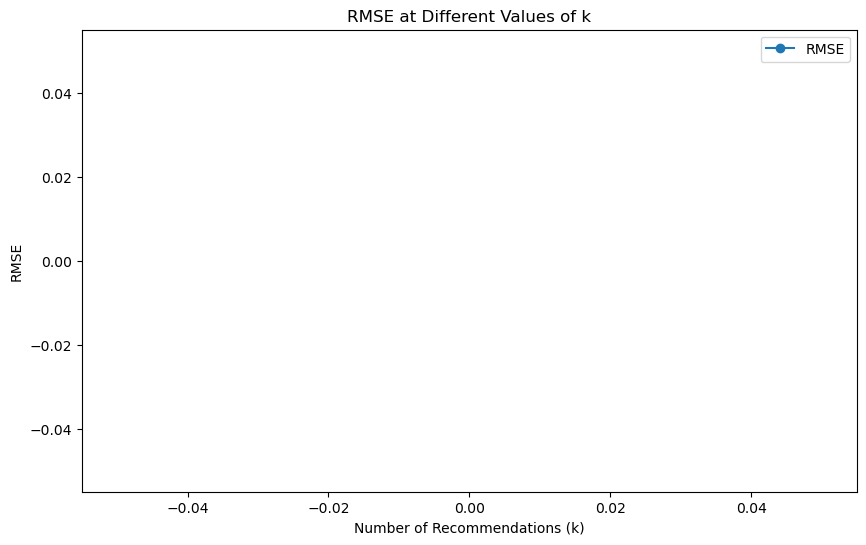

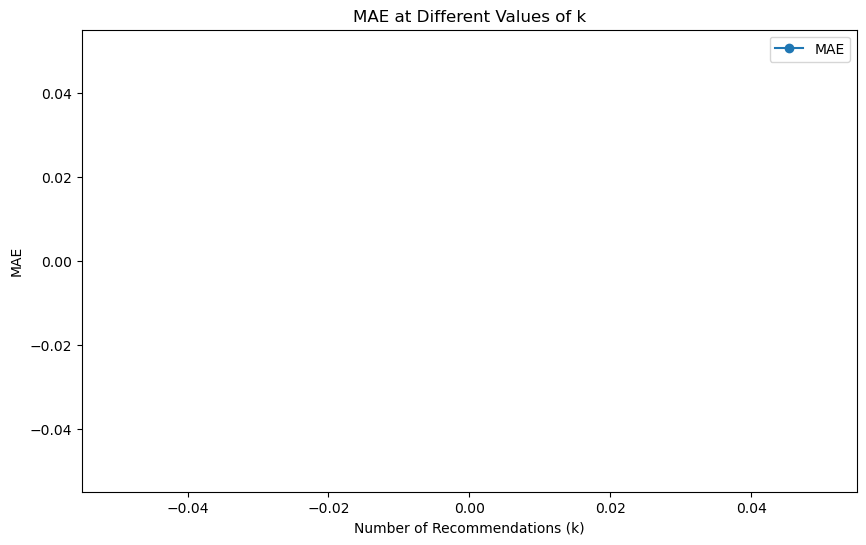

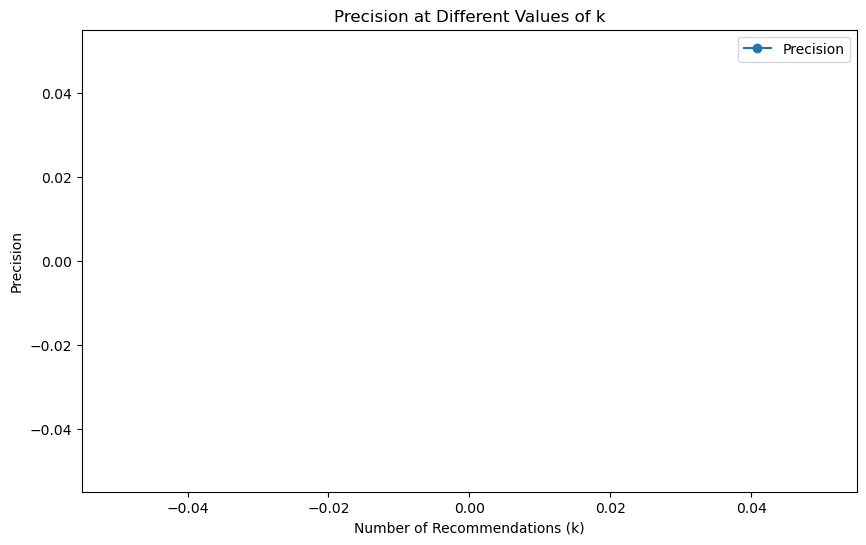

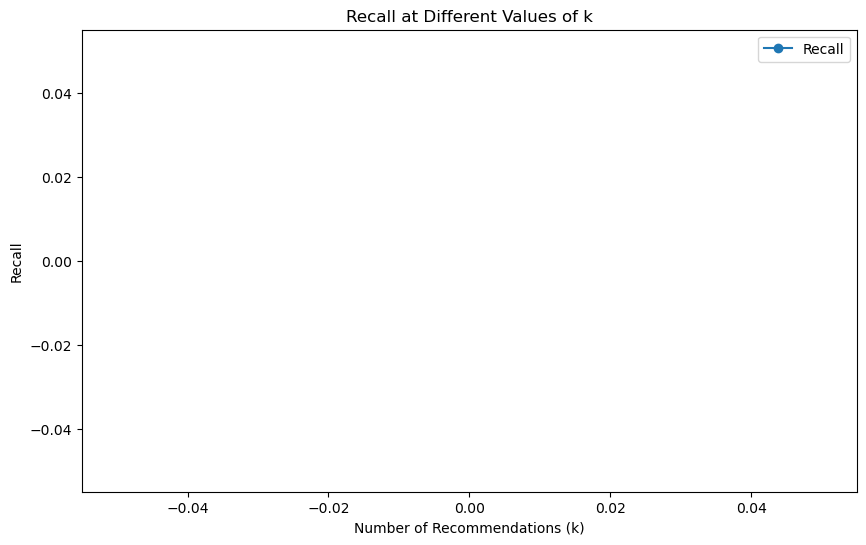

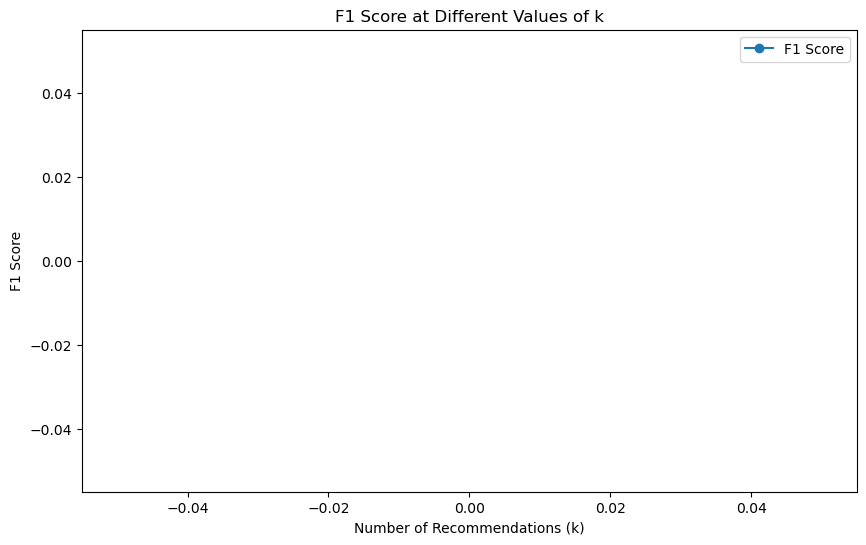

In [1]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 200  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.8
CBF_WEIGHT = 0.2
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.7

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.DEBUG)

def load_data(movies_file, ratings_file):
    try:
        logging.debug("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.debug("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.debug("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.debug("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.debug("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.debug("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.debug("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.debug("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.debug("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.debug("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.debug("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.debug("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.debug("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.debug("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.debug(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])

                # Replace NaN or inf values with 0
                item_feature_vector = np.nan_to_num(item_feature_vector)
                user_pref_vector = np.nan_to_num(user_pref_vector)
                
                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.debug(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            if np.any(np.isnan(distances)):
                diversity_scores.append(0)
            else:
                diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, hybrid_scores):
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=50, alpha=0.5, label='CF Scores', color='g')
    plt.hist(cbf_scores, bins=50, alpha=0.5, label='CBF Scores', color='m')
    plt.hist(hybrid_scores, bins=50, alpha=0.5, label='Hybrid Scores', color='y')
    plt.xlabel('Score')
    plt.ylabel('Frequency')
    plt.title('Distribution of CF, CBF, and Hybrid Scores')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o', label=metric)
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.legend()
        plt.show()

def main():
    logging.debug("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.debug("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.debug("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.debug("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.debug("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.debug("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.debug("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            cf_scores_all = []
            cbf_scores_all = []
            hybrid_scores_all = []
            for user_id in ratings_df['userId'].unique()[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")
                    cf_scores_all.append(rec[3])
                    cbf_scores_all.append(rec[4])
                    hybrid_scores_all.append(rec[1])

            logging.debug("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            plot_score_distributions(cf_scores_all, cbf_scores_all, hybrid_scores_all)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in ratings_df['userId'].unique()[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                rec_metrics = calculate_recommendation_metrics(recommendations_k, ratings_df)
                metrics_at_k[k] = rec_metrics

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


INFO:root:Starting main function.
INFO:root:Loading movies and ratings data.
INFO:root:Data loaded successfully.
INFO:root:Loaded data successfully, proceeding with user sampling.
INFO:root:Sampling users.
INFO:root:User sampling completed.
INFO:root:User sampling completed, proceeding with dataset merging.
INFO:root:Merging datasets.
INFO:root:Datasets merged successfully.
INFO:root:Datasets merged successfully, proceeding with genre processing.
INFO:root:Processing genres.
INFO:root:Genres processed successfully.
INFO:root:Genres processed successfully, proceeding with time decay application.
INFO:root:Applying time decay to ratings.
INFO:root:Time decay applied successfully.
INFO:root:Time decay applied successfully, proceeding with collaborative filtering.
INFO:root:Model metrics calculated successfully, proceeding with feature extraction.
INFO:root:Extracting item features.
INFO:root:Item features extracted successfully.
INFO:root:Deriving user preferences.
INFO:root:User preferen

RMSE: 0.8669
MAE: 0.6679
Precision: 0.8151
Recall: 0.2624
F1 Score: 0.3970


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 3.
INFO:root:Generating recommendations for user 7.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 3:
Movie ID: 1080, Hybrid Score: 4.56, Title: Monty Python's Life of Brian (1979), CF Score: 4.90, CBF Score: 3.96, Popularity Penalty: 0.2200, Diversity Penalty: 0.0000
Movie ID: 3275, Hybrid Score: 4.42, Title: Boondock Saints, The (2000), CF Score: 4.94, CBF Score: 2.81, Popularity Penalty: 0.1400, Diversity Penalty: 0.0000
Movie ID: 1704, Hybrid Score: 4.39, Title: Good Will Hunting (1997), CF Score: 4.84, CBF Score: 3.67, Popularity Penalty: 0.3100, Diversity Penalty: 0.0000
Movie ID: 48516, Hybrid Score: 4.35, Title: Departed, The (2006), CF Score: 4.89, CBF Score: 3.05, Popularity Penalty: 0.2400, Diversity Penalty: 0.0000
Movie ID: 2959, Hybrid Score: 4.26, Title: Fight Club (1999), CF Score: 4.98, CBF Score: 2.81, Popularity Penalty: 0.4100, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 7.
INFO:root:Generating recommendations for user 11.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 7:
Movie ID: 318, Hybrid Score: 4.32, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 3.48, Popularity Penalty: 0.5400, Diversity Penalty: 0.0000
Movie ID: 3949, Hybrid Score: 3.85, Title: Requiem for a Dream (2000), CF Score: 4.04, CBF Score: 4.06, Popularity Penalty: 0.2700, Diversity Penalty: 0.0000
Movie ID: 2502, Hybrid Score: 3.81, Title: Office Space (1999), CF Score: 4.11, CBF Score: 3.40, Popularity Penalty: 0.2200, Diversity Penalty: 0.0000
Movie ID: 1198, Hybrid Score: 3.80, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.15, CBF Score: 3.87, Popularity Penalty: 0.4200, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.79, Title: Pulp Fiction (1994), CF Score: 4.48, CBF Score: 2.80, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 11.
INFO:root:Generating recommendations for user 25.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 11:
Movie ID: 296, Hybrid Score: 4.28, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5000, Diversity Penalty: 0.0100
Movie ID: 3949, Hybrid Score: 4.18, Title: Requiem for a Dream (2000), CF Score: 4.46, CBF Score: 4.04, Popularity Penalty: 0.2700, Diversity Penalty: 0.0100
Movie ID: 2959, Hybrid Score: 4.17, Title: Fight Club (1999), CF Score: 4.60, CBF Score: 3.93, Popularity Penalty: 0.4100, Diversity Penalty: 0.0100
Movie ID: 541, Hybrid Score: 4.16, Title: Blade Runner (1982), CF Score: 4.45, CBF Score: 4.02, Popularity Penalty: 0.2900, Diversity Penalty: 0.0000
Movie ID: 3275, Hybrid Score: 4.14, Title: Boondock Saints, The (2000), CF Score: 4.32, CBF Score: 3.93, Popularity Penalty: 0.1400, Diversity Penalty: 0.0100


INFO:root:Recommendations generated for user 25.
INFO:root:Generating recommendations for user 30.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 25:
Movie ID: 2019, Hybrid Score: 4.73, Title: Seven Samurai (Shichinin no samurai) (1954), CF Score: 4.94, CBF Score: 4.26, Popularity Penalty: 0.1100, Diversity Penalty: 0.0000
Movie ID: 1080, Hybrid Score: 4.55, Title: Monty Python's Life of Brian (1979), CF Score: 5.00, CBF Score: 3.58, Popularity Penalty: 0.2200, Diversity Penalty: 0.0100
Movie ID: 1208, Hybrid Score: 4.55, Title: Apocalypse Now (1979), CF Score: 4.97, CBF Score: 3.73, Popularity Penalty: 0.2400, Diversity Penalty: 0.0000
Movie ID: 910, Hybrid Score: 4.46, Title: Some Like It Hot (1959), CF Score: 4.92, CBF Score: 3.03, Popularity Penalty: 0.1200, Diversity Penalty: 0.0000
Movie ID: 541, Hybrid Score: 4.45, Title: Blade Runner (1982), CF Score: 4.93, CBF Score: 3.56, Popularity Penalty: 0.2900, Diversity Penalty: 0.0100


INFO:root:Recommendations generated for user 30.
INFO:root:Generating recommendations for user 31.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 30:
Movie ID: 2019, Hybrid Score: 4.44, Title: Seven Samurai (Shichinin no samurai) (1954), CF Score: 4.66, CBF Score: 3.94, Popularity Penalty: 0.1100, Diversity Penalty: 0.0100
Movie ID: 1208, Hybrid Score: 4.43, Title: Apocalypse Now (1979), CF Score: 4.97, CBF Score: 3.18, Popularity Penalty: 0.2400, Diversity Penalty: 0.0100
Movie ID: 2959, Hybrid Score: 4.29, Title: Fight Club (1999), CF Score: 5.00, CBF Score: 2.94, Popularity Penalty: 0.4100, Diversity Penalty: 0.0200
Movie ID: 541, Hybrid Score: 4.25, Title: Blade Runner (1982), CF Score: 4.63, CBF Score: 3.80, Popularity Penalty: 0.2900, Diversity Penalty: 0.0200
Movie ID: 1080, Hybrid Score: 4.22, Title: Monty Python's Life of Brian (1979), CF Score: 4.61, CBF Score: 3.46, Popularity Penalty: 0.2200, Diversity Penalty: 0.0200


INFO:root:Recommendations generated for user 31.
INFO:root:Generating recommendations for user 40.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 31:
Movie ID: 318, Hybrid Score: 4.30, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 3.43, Popularity Penalty: 0.5400, Diversity Penalty: 0.0100
Movie ID: 1080, Hybrid Score: 4.07, Title: Monty Python's Life of Brian (1979), CF Score: 4.22, CBF Score: 4.33, Popularity Penalty: 0.2200, Diversity Penalty: 0.0300
Movie ID: 2019, Hybrid Score: 4.04, Title: Seven Samurai (Shichinin no samurai) (1954), CF Score: 4.31, CBF Score: 3.42, Popularity Penalty: 0.1100, Diversity Penalty: 0.0200
Movie ID: 1704, Hybrid Score: 4.01, Title: Good Will Hunting (1997), CF Score: 4.34, CBF Score: 3.84, Popularity Penalty: 0.3100, Diversity Penalty: 0.0100
Movie ID: 4973, Hybrid Score: 3.93, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.15, CBF Score: 4.06, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 40.
INFO:root:Generating recommendations for user 56.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 40:
Movie ID: 1080, Hybrid Score: 4.51, Title: Monty Python's Life of Brian (1979), CF Score: 4.79, CBF Score: 4.31, Popularity Penalty: 0.2200, Diversity Penalty: 0.0400
Movie ID: 1136, Hybrid Score: 4.29, Title: Monty Python and the Holy Grail (1975), CF Score: 4.83, CBF Score: 3.24, Popularity Penalty: 0.3100, Diversity Penalty: 0.0000
Movie ID: 1704, Hybrid Score: 4.28, Title: Good Will Hunting (1997), CF Score: 4.64, CBF Score: 4.01, Popularity Penalty: 0.3100, Diversity Penalty: 0.0200
Movie ID: 2959, Hybrid Score: 4.27, Title: Fight Club (1999), CF Score: 5.00, CBF Score: 2.88, Popularity Penalty: 0.4100, Diversity Penalty: 0.0300
Movie ID: 2858, Hybrid Score: 4.25, Title: American Beauty (1999), CF Score: 4.71, CBF Score: 4.01, Popularity Penalty: 0.4500, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 56.
INFO:root:Generating recommendations for user 64.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 56:
Movie ID: 2959, Hybrid Score: 4.43, Title: Fight Club (1999), CF Score: 5.00, CBF Score: 3.74, Popularity Penalty: 0.4100, Diversity Penalty: 0.0400
Movie ID: 1080, Hybrid Score: 4.25, Title: Monty Python's Life of Brian (1979), CF Score: 4.54, CBF Score: 4.05, Popularity Penalty: 0.2200, Diversity Penalty: 0.0500
Movie ID: 1198, Hybrid Score: 3.97, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.35, CBF Score: 3.94, Popularity Penalty: 0.4200, Diversity Penalty: 0.0100
Movie ID: 1208, Hybrid Score: 3.93, Title: Apocalypse Now (1979), CF Score: 4.28, CBF Score: 3.44, Popularity Penalty: 0.2400, Diversity Penalty: 0.0200
Movie ID: 58559, Hybrid Score: 3.89, Title: Dark Knight, The (2008), CF Score: 4.35, CBF Score: 3.10, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 64.
INFO:root:Generating recommendations for user 71.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)


Top 5 recommendations for User 64:
Movie ID: 899, Hybrid Score: 4.51, Title: Singin' in the Rain (1952), CF Score: 5.00, CBF Score: 2.90, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1080, Hybrid Score: 4.48, Title: Monty Python's Life of Brian (1979), CF Score: 4.79, CBF Score: 4.25, Popularity Penalty: 0.2200, Diversity Penalty: 0.0600
Movie ID: 81845, Hybrid Score: 4.18, Title: King's Speech, The (2010), CF Score: 4.24, CBF Score: 4.34, Popularity Penalty: 0.1100, Diversity Penalty: 0.0000
Movie ID: 910, Hybrid Score: 4.15, Title: Some Like It Hot (1959), CF Score: 4.38, CBF Score: 3.67, Popularity Penalty: 0.1200, Diversity Penalty: 0.0100
Movie ID: 1230, Hybrid Score: 4.11, Title: Annie Hall (1977), CF Score: 4.33, CBF Score: 3.73, Popularity Penalty: 0.1500, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 71.
INFO:root:Recommendations generated successfully, proceeding with metrics calculation.


Top 5 recommendations for User 71:
Movie ID: 318, Hybrid Score: 4.26, Title: Shawshank Redemption, The (1994), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.5400, Diversity Penalty: 0.0200
Movie ID: 2959, Hybrid Score: 4.26, Title: Fight Club (1999), CF Score: 4.90, CBF Score: 3.30, Popularity Penalty: 0.4100, Diversity Penalty: 0.0500
Movie ID: 1172, Hybrid Score: 4.23, Title: Cinema Paradiso (Nuovo cinema Paradiso) (1989), CF Score: 4.42, CBF Score: 3.80, Popularity Penalty: 0.0900, Diversity Penalty: 0.0000
Movie ID: 923, Hybrid Score: 4.21, Title: Citizen Kane (1941), CF Score: 4.63, CBF Score: 3.04, Popularity Penalty: 0.1500, Diversity Penalty: 0.0000
Movie ID: 2019, Hybrid Score: 4.16, Title: Seven Samurai (Shichinin no samurai) (1954), CF Score: 4.36, CBF Score: 3.83, Popularity Penalty: 0.1100, Diversity Penalty: 0.0300
Catalog Coverage: 0.24%
Average Novelty: 27.8000
Personalization: 0.8359
Serendipity: 0.0000
Intra-list Diversity: 1.0000
Hit Rate: 0.0000
Mean Recipr

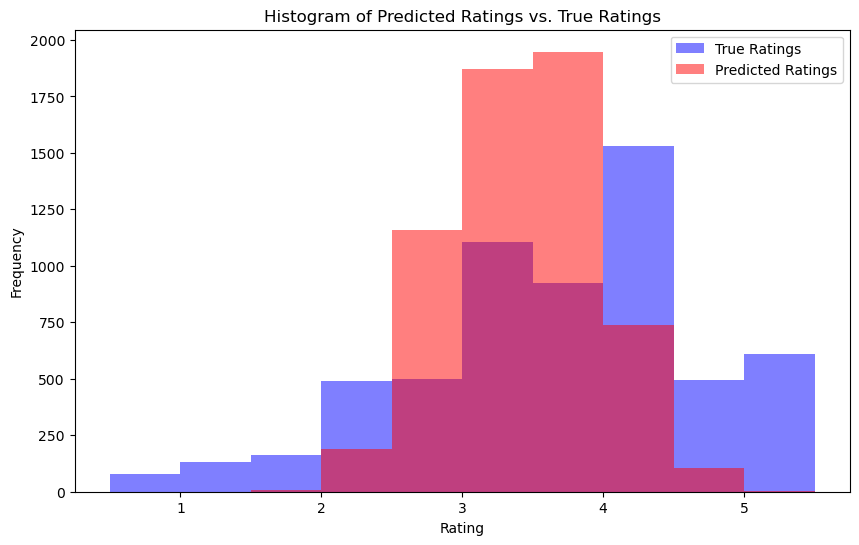

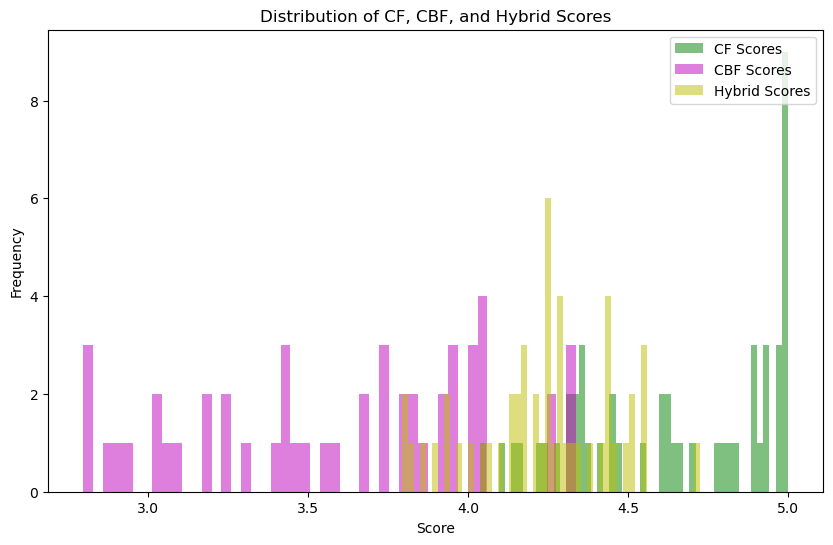

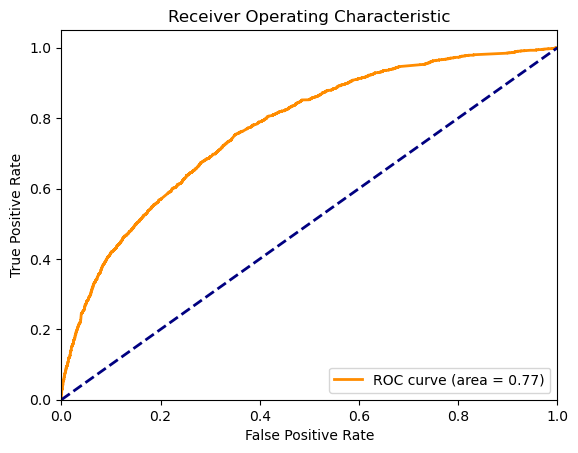

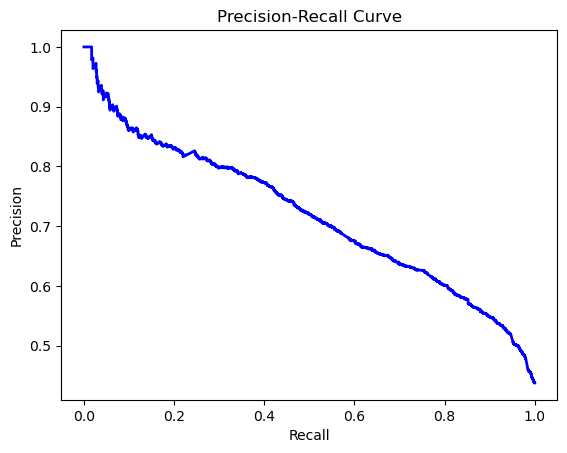

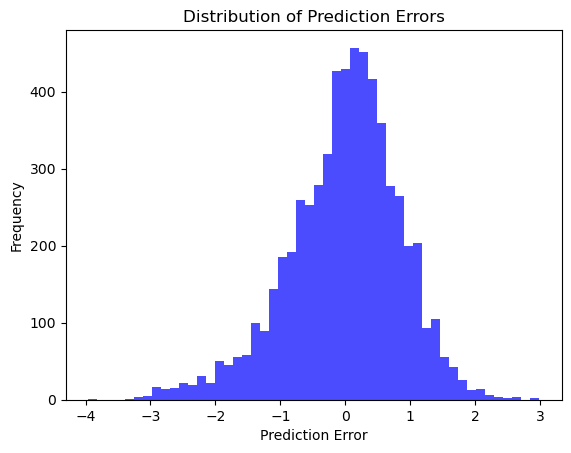

INFO:root:Generating recommendations for user 3.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 3.
INFO:root:Generating recommendations for user 7.
INFO:root:Recommendations generated for user 7.
INFO:root:Generating recommendations for user 11.
INFO:root:Recommendations generated for user 11.
INFO:root:Generating recommendations for user 25.
INFO:root:Recommendations generated for user 25.
INFO:root:Generating recommendations for user 30.
INFO:root:Recommendations generated for user 30.
INFO:root:Generating recommendations for user 31.
INFO:root:Recommendations generated for user 31.
INFO:root:Generating recommendations for user 40.
INFO:root:Recommendations generated for user 40.
INFO:root:Generating recommendations for user 56.
INFO:root:Recommendations generated for user 56.
INFO:root:Generating recommendations for u

KeyboardInterrupt: 

In [6]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 100  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.8
CBF_WEIGHT = 0.2
POPULARITY_PENALTY_WEIGHT = 0.7
DIVERSITY_PENALTY_WEIGHT = 0.7
TIME_DECAY_FACTOR = 0.9

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file):
    try:
        logging.info("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.info("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.info("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.info("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.info("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.info("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.info("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.info("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.info("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.info("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.info("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.info("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.info("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.info("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.info(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])

                # Replace NaN or inf values with 0
                item_feature_vector = np.nan_to_num(item_feature_vector)
                user_pref_vector = np.nan_to_num(user_pref_vector)

                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.info(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            if np.any(np.isnan(distances)):
                diversity_scores.append(0)
            else:
                diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, hybrid_scores):
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=50, alpha=0.5, label='CF Scores', color='g')
    plt.hist(cbf_scores, bins=50, alpha=0.5, label='CBF Scores', color='m')
    plt.hist(hybrid_scores, bins=50, alpha=0.5, label='Hybrid Scores', color='y')
    plt.xlabel('Score')
    plt.ylabel('Frequency')
    plt.title('Distribution of CF, CBF, and Hybrid Scores')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o', label=metric)
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.legend()
        plt.show()

def main():
    logging.info("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.info("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.info("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.info("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.info("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.info("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.info("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            cf_scores_all = []
            cbf_scores_all = []
            hybrid_scores_all = []
            for user_id in sorted(ratings_df['userId'].unique())[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")
                    cf_scores_all.append(rec[3])
                    cbf_scores_all.append(rec[4])
                    hybrid_scores_all.append(rec[1])

            logging.info("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            plot_score_distributions(cf_scores_all, cbf_scores_all, hybrid_scores_all)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in sorted(ratings_df['userId'].unique())[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                rec_metrics = calculate_recommendation_metrics(recommendations_k, ratings_df)
                metrics_at_k[k] = rec_metrics

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


INFO:root:Starting main function.
INFO:root:Loading movies and ratings data.
INFO:root:Data loaded successfully.
INFO:root:Loaded data successfully, proceeding with user sampling.
INFO:root:Sampling users.
INFO:root:User sampling completed.
INFO:root:User sampling completed, proceeding with dataset merging.
INFO:root:Merging datasets.
INFO:root:Datasets merged successfully.
INFO:root:Datasets merged successfully, proceeding with genre processing.
INFO:root:Processing genres.
INFO:root:Genres processed successfully.
INFO:root:Genres processed successfully, proceeding with time decay application.
INFO:root:Applying time decay to ratings.
INFO:root:Time decay applied successfully.
INFO:root:Time decay applied successfully, proceeding with collaborative filtering.
INFO:root:Model metrics calculated successfully, proceeding with feature extraction.
INFO:root:Extracting item features.
INFO:root:Item features extracted successfully.
INFO:root:Deriving user preferences.
INFO:root:User preferen

RMSE: 0.8842
MAE: 0.6863
Precision: 0.8346
Recall: 0.1501
F1 Score: 0.2545


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 3.
INFO:root:Generating recommendations for user 11.


Top 5 recommendations for User 3:
Movie ID: 2858, Hybrid Score: 4.22, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.67, Popularity Penalty: 0.5000, Diversity Penalty: 0.0000
Movie ID: 1961, Hybrid Score: 4.09, Title: Rain Man (1988), CF Score: 4.17, CBF Score: 4.26, Popularity Penalty: 0.2333, Diversity Penalty: 0.0000
Movie ID: 318, Hybrid Score: 4.04, Title: Shawshank Redemption, The (1994), CF Score: 4.96, CBF Score: 3.54, Popularity Penalty: 0.7000, Diversity Penalty: 0.0000
Movie ID: 81845, Hybrid Score: 4.03, Title: King's Speech, The (2010), CF Score: 4.04, CBF Score: 4.27, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 2976, Hybrid Score: 4.00, Title: Bringing Out the Dead (1999), CF Score: 3.85, CBF Score: 4.27, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 11.
INFO:root:Generating recommendations for user 56.


Top 5 recommendations for User 11:
Movie ID: 2571, Hybrid Score: 4.15, Title: Matrix, The (1999), CF Score: 4.74, CBF Score: 4.04, Popularity Penalty: 0.6333, Diversity Penalty: 0.0000
Movie ID: 6874, Hybrid Score: 4.05, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.26, CBF Score: 4.11, Popularity Penalty: 0.3000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.03, Title: Black Swan (2010), CF Score: 4.17, CBF Score: 4.05, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 4.01, Title: Pulp Fiction (1994), CF Score: 5.00, CBF Score: 3.19, Popularity Penalty: 0.5333, Diversity Penalty: 0.0000
Movie ID: 2858, Hybrid Score: 3.89, Title: American Beauty (1999), CF Score: 4.51, CBF Score: 3.63, Popularity Penalty: 0.5000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 56.
INFO:root:Generating recommendations for user 82.


Top 5 recommendations for User 56:
Movie ID: 6874, Hybrid Score: 4.16, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.59, CBF Score: 3.93, Popularity Penalty: 0.3000, Diversity Penalty: 0.0333
Movie ID: 2858, Hybrid Score: 4.10, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.47, Popularity Penalty: 0.5000, Diversity Penalty: 0.0667
Movie ID: 2571, Hybrid Score: 4.02, Title: Matrix, The (1999), CF Score: 4.72, CBF Score: 3.80, Popularity Penalty: 0.6333, Diversity Penalty: 0.0333
Movie ID: 1198, Hybrid Score: 3.95, Title: Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981), CF Score: 4.32, CBF Score: 3.94, Popularity Penalty: 0.4333, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 3.95, Title: Lost in Translation (2003), CF Score: 4.63, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 82.
INFO:root:Generating recommendations for user 132.


Top 5 recommendations for User 82:
Movie ID: 2858, Hybrid Score: 3.97, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.17, Popularity Penalty: 0.5000, Diversity Penalty: 0.1000
Movie ID: 6874, Hybrid Score: 3.79, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.31, CBF Score: 3.46, Popularity Penalty: 0.3000, Diversity Penalty: 0.0667
Movie ID: 3473, Hybrid Score: 3.71, Title: Jonah Who Will Be 25 in the Year 2000 (Jonas qui aura 25 ans en l'an 2000) (1976), CF Score: 3.39, CBF Score: 4.24, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 296, Hybrid Score: 3.70, Title: Pulp Fiction (1994), CF Score: 4.69, CBF Score: 2.93, Popularity Penalty: 0.5333, Diversity Penalty: 0.0333
Movie ID: 318, Hybrid Score: 3.68, Title: Shawshank Redemption, The (1994), CF Score: 4.54, CBF Score: 3.30, Popularity Penalty: 0.7000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 132.
INFO:root:Generating recommendations for user 156.


Top 5 recommendations for User 132:
Movie ID: 2501, Hybrid Score: 4.31, Title: October Sky (1999), CF Score: 4.35, CBF Score: 4.38, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 81591, Hybrid Score: 4.31, Title: Black Swan (2010), CF Score: 4.74, CBF Score: 3.91, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 2542, Hybrid Score: 4.22, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 971, Hybrid Score: 4.19, Title: Cat on a Hot Tin Roof (1958), CF Score: 4.11, CBF Score: 4.36, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.16, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.76, CBF Score: 3.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 156.
INFO:root:Generating recommendations for user 164.


Top 5 recommendations for User 156:
Movie ID: 3543, Hybrid Score: 4.41, Title: Diner (1982), CF Score: 4.38, CBF Score: 4.50, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 44199, Hybrid Score: 4.28, Title: Inside Man (2006), CF Score: 5.00, CBF Score: 3.45, Popularity Penalty: 0.2000, Diversity Penalty: 0.0000
Movie ID: 5500, Hybrid Score: 4.26, Title: Top Secret! (1984), CF Score: 4.16, CBF Score: 4.44, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7451, Hybrid Score: 4.19, Title: Mean Girls (2004), CF Score: 4.11, CBF Score: 4.44, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 2501, Hybrid Score: 4.17, Title: October Sky (1999), CF Score: 4.08, CBF Score: 4.48, Popularity Penalty: 0.1000, Diversity Penalty: 0.0333


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 164.
INFO:root:Generating recommendations for user 177.


Top 5 recommendations for User 164:
Movie ID: 2571, Hybrid Score: 4.25, Title: Matrix, The (1999), CF Score: 4.80, CBF Score: 4.29, Popularity Penalty: 0.6333, Diversity Penalty: 0.0667
Movie ID: 6874, Hybrid Score: 4.10, Title: Kill Bill: Vol. 1 (2003), CF Score: 4.62, CBF Score: 3.82, Popularity Penalty: 0.3000, Diversity Penalty: 0.1000
Movie ID: 3030, Hybrid Score: 3.97, Title: Yojimbo (1961), CF Score: 3.68, CBF Score: 4.53, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000
Movie ID: 1374, Hybrid Score: 3.96, Title: Star Trek II: The Wrath of Khan (1982), CF Score: 3.86, CBF Score: 4.28, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 3703, Hybrid Score: 3.93, Title: Road Warrior, The (Mad Max 2) (1981), CF Score: 3.78, CBF Score: 4.27, Popularity Penalty: 0.1000, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 177.
INFO:root:Generating recommendations for user 193.


Top 5 recommendations for User 177:
Movie ID: 4226, Hybrid Score: 4.17, Title: Memento (2000), CF Score: 5.00, CBF Score: 3.25, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 2542, Hybrid Score: 4.12, Title: Lock, Stock & Two Smoking Barrels (1998), CF Score: 4.86, CBF Score: 3.25, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 3152, Hybrid Score: 4.00, Title: Last Picture Show, The (1971), CF Score: 3.84, CBF Score: 4.28, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 171495, Hybrid Score: 4.00, Title: Cosmos, CF Score: 3.36, CBF Score: 5.00, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 1883, Hybrid Score: 3.94, Title: Bulworth (1998), CF Score: 4.09, CBF Score: 3.80, Popularity Penalty: 0.0667, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 193.
INFO:root:Generating recommendations for user 197.


Top 5 recommendations for User 193:
Movie ID: 529, Hybrid Score: 4.25, Title: Searching for Bobby Fischer (1993), CF Score: 4.26, CBF Score: 4.45, Popularity Penalty: 0.1667, Diversity Penalty: 0.0000
Movie ID: 6711, Hybrid Score: 4.22, Title: Lost in Translation (2003), CF Score: 4.88, CBF Score: 3.60, Popularity Penalty: 0.2667, Diversity Penalty: 0.0333
Movie ID: 1596, Hybrid Score: 4.18, Title: Career Girls (1997), CF Score: 4.03, CBF Score: 4.45, Popularity Penalty: 0.0333, Diversity Penalty: 0.0000
Movie ID: 7361, Hybrid Score: 4.12, Title: Eternal Sunshine of the Spotless Mind (2004), CF Score: 4.80, CBF Score: 3.52, Popularity Penalty: 0.3333, Diversity Penalty: 0.0000
Movie ID: 3317, Hybrid Score: 4.11, Title: Wonder Boys (2000), CF Score: 4.25, CBF Score: 4.07, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000


C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 197.
INFO:root:Recommendations generated successfully, proceeding with metrics calculation.


Top 5 recommendations for User 197:
Movie ID: 2858, Hybrid Score: 4.21, Title: American Beauty (1999), CF Score: 5.00, CBF Score: 3.83, Popularity Penalty: 0.5000, Diversity Penalty: 0.1333
Movie ID: 529, Hybrid Score: 4.01, Title: Searching for Bobby Fischer (1993), CF Score: 3.98, CBF Score: 4.30, Popularity Penalty: 0.1667, Diversity Penalty: 0.0333
Movie ID: 4973, Hybrid Score: 3.86, Title: Amelie (Fabuleux destin d'Amélie Poulain, Le) (2001), CF Score: 4.28, CBF Score: 3.58, Popularity Penalty: 0.2667, Diversity Penalty: 0.0000
Movie ID: 3160, Hybrid Score: 3.82, Title: Magnolia (1999), CF Score: 3.60, CBF Score: 4.30, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Movie ID: 1207, Hybrid Score: 3.81, Title: To Kill a Mockingbird (1962), CF Score: 3.60, CBF Score: 4.29, Popularity Penalty: 0.1333, Diversity Penalty: 0.0000
Catalog Coverage: 0.35%
Average Novelty: 7.8400
Personalization: 0.9291
Serendipity: -3965195.3292
Intra-list Diversity: 0.9000
Hit Rate: 0.0000
Mean Reci

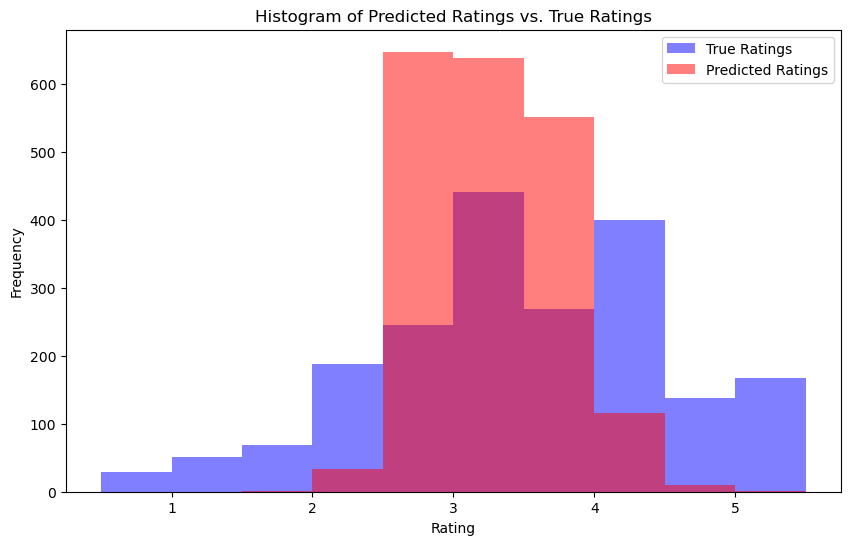

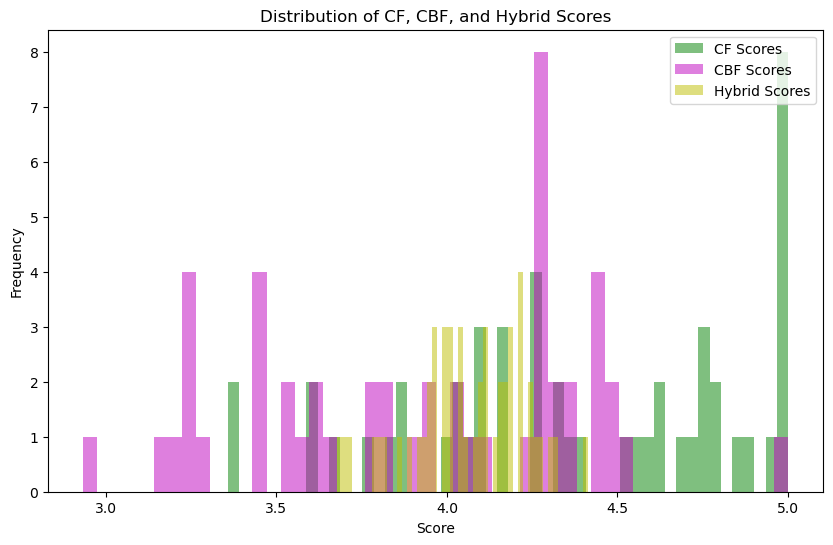

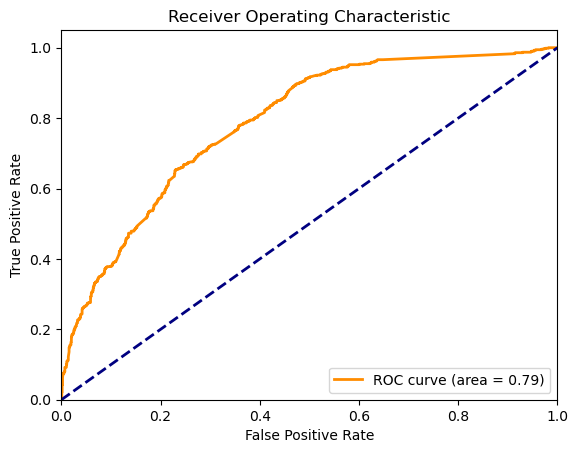

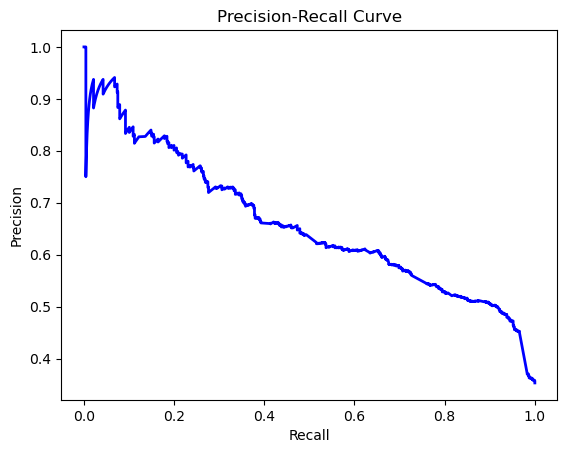

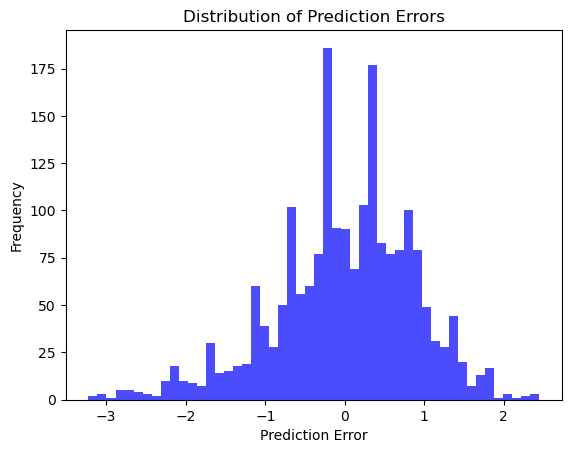

INFO:root:Generating recommendations for user 3.
C:\users\trobb\anaconda3\Lib\site-packages\scipy\spatial\distance.py:636: RuntimeWarning: invalid value encountered in scalar divide
  dist = 1.0 - uv / np.sqrt(uu * vv)
INFO:root:Recommendations generated for user 3.
INFO:root:Generating recommendations for user 11.
INFO:root:Recommendations generated for user 11.
INFO:root:Generating recommendations for user 56.
INFO:root:Recommendations generated for user 56.
INFO:root:Generating recommendations for user 82.
INFO:root:Recommendations generated for user 82.
INFO:root:Generating recommendations for user 132.
INFO:root:Recommendations generated for user 132.
INFO:root:Generating recommendations for user 156.
INFO:root:Recommendations generated for user 156.
INFO:root:Generating recommendations for user 164.
INFO:root:Recommendations generated for user 164.
INFO:root:Generating recommendations for user 177.
INFO:root:Recommendations generated for user 177.
INFO:root:Generating recommendat

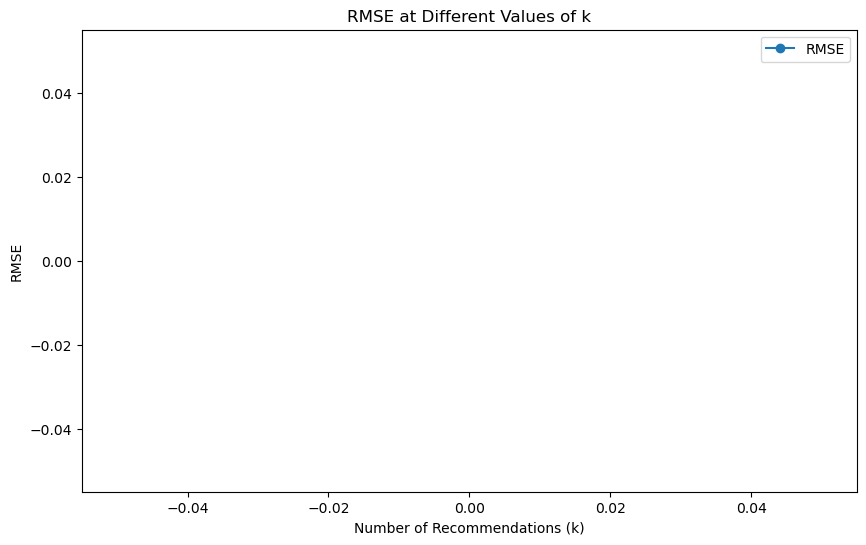

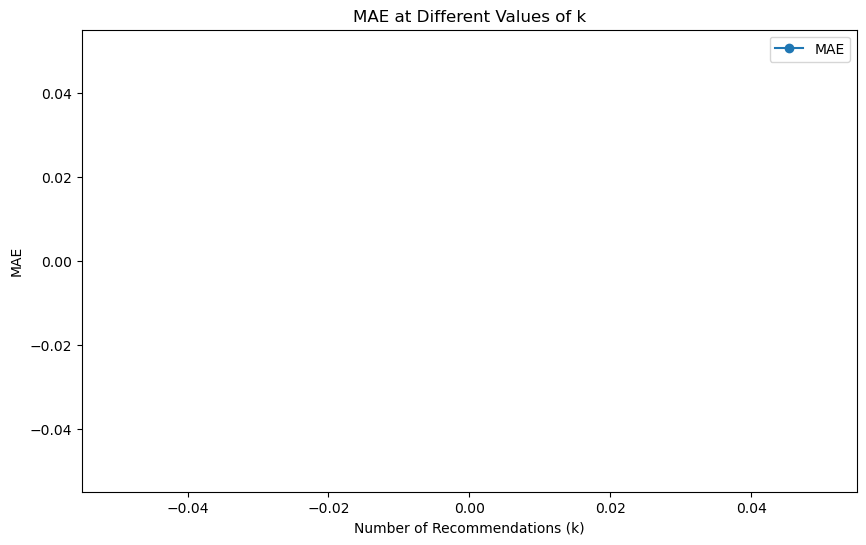

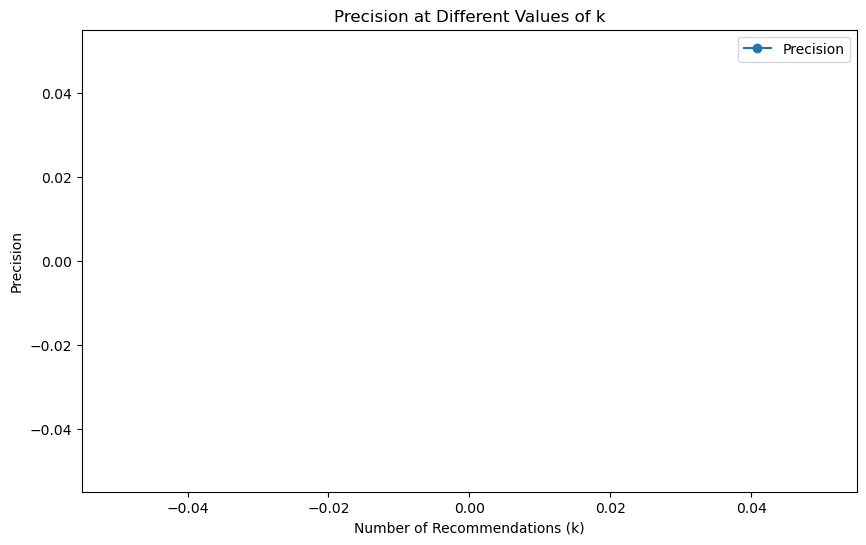

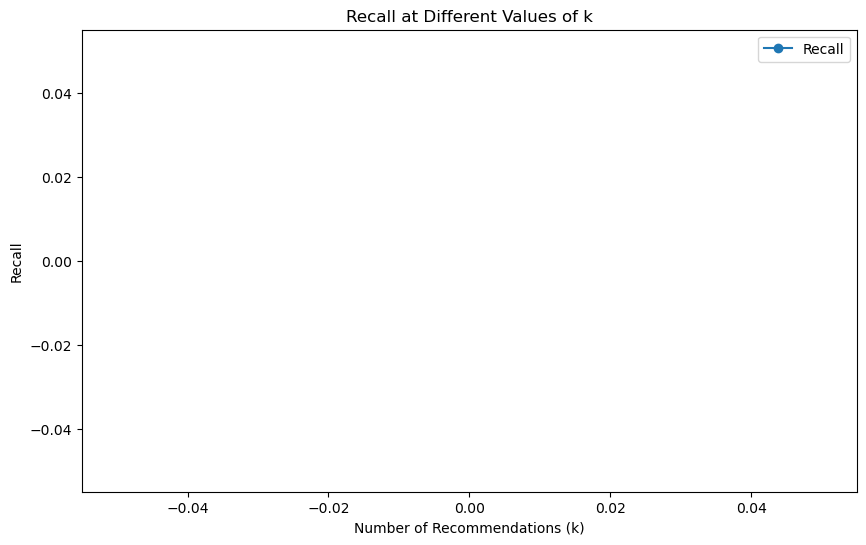

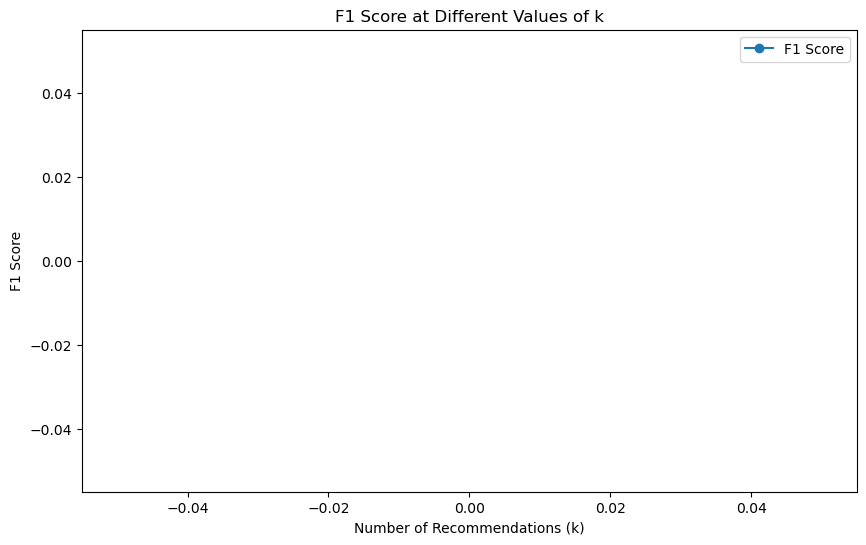

In [1]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.6
CBF_WEIGHT = 0.4
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file):
    try:
        logging.info("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.info("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.info("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.info("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.info("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.info("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.info("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.info("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.info("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.info("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.info("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.info("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.info("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.info("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.info(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])

                # Replace NaN or inf values with 0
                item_feature_vector = np.nan_to_num(item_feature_vector)
                user_pref_vector = np.nan_to_num(user_pref_vector)

                if not np.any(np.isnan(item_feature_vector)) and not np.any(np.isnan(user_pref_vector)):
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0
                else:
                    content_score = 0
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.info(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            if np.any(np.isnan(distances)):
                diversity_scores.append(0)
            else:
                diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, hybrid_scores):
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=50, alpha=0.5, label='CF Scores', color='g')
    plt.hist(cbf_scores, bins=50, alpha=0.5, label='CBF Scores', color='m')
    plt.hist(hybrid_scores, bins=50, alpha=0.5, label='Hybrid Scores', color='y')
    plt.xlabel('Score')
    plt.ylabel('Frequency')
    plt.title('Distribution of CF, CBF, and Hybrid Scores')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o', label=metric)
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.legend()
        plt.show()

def main():
    logging.info("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.info("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.info("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.info("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.info("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.info("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.info("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            cf_scores_all = []
            cbf_scores_all = []
            hybrid_scores_all = []
            for user_id in sorted(ratings_df['userId'].unique())[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")
                    cf_scores_all.append(rec[3])
                    cbf_scores_all.append(rec[4])
                    hybrid_scores_all.append(rec[1])

            logging.info("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            plot_score_distributions(cf_scores_all, cbf_scores_all, hybrid_scores_all)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in sorted(ratings_df['userId'].unique())[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                rec_metrics = calculate_recommendation_metrics(recommendations_k, ratings_df)
                metrics_at_k[k] = rec_metrics

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


INFO:root:Starting main function.
INFO:root:Loading movies and ratings data.
INFO:root:Data loaded successfully.
INFO:root:Loaded data successfully, proceeding with user sampling.
INFO:root:Sampling users.
INFO:root:User sampling completed.
INFO:root:User sampling completed, proceeding with dataset merging.
INFO:root:Merging datasets.
INFO:root:Datasets merged successfully.
INFO:root:Datasets merged successfully, proceeding with genre processing.
INFO:root:Processing genres.
INFO:root:Genres processed successfully.
INFO:root:Genres processed successfully, proceeding with time decay application.
INFO:root:Applying time decay to ratings.
INFO:root:Time decay applied successfully.
INFO:root:Time decay applied successfully, proceeding with collaborative filtering.
INFO:root:Model metrics calculated successfully, proceeding with feature extraction.
INFO:root:Extracting item features.
INFO:root:Item features extracted successfully.
INFO:root:Deriving user preferences.
INFO:root:User preferen

RMSE: 0.8786
MAE: 0.6755
Precision: 0.8069
Recall: 0.3228
F1 Score: 0.4611


INFO:root:Generating recommendations for user 1.
INFO:root:Recommendations generated for user 1.
INFO:root:Generating recommendations for user 2.


Top 5 recommendations for User 1:
Movie ID: 1217, Hybrid Score: 4.98, Title: Ran (1985), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0246, Diversity Penalty: 0.0000
Movie ID: 1283, Hybrid Score: 4.98, Title: High Noon (1952), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0311, Diversity Penalty: 0.0000
Movie ID: 1104, Hybrid Score: 4.98, Title: Streetcar Named Desire, A (1951), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0328, Diversity Penalty: 0.0000
Movie ID: 3037, Hybrid Score: 4.97, Title: Little Big Man (1970), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0393, Diversity Penalty: 0.0000
Movie ID: 3435, Hybrid Score: 4.97, Title: Double Indemnity (1944), CF Score: 4.98, CBF Score: 5.00, Popularity Penalty: 0.0279, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 2.
INFO:root:Generating recommendations for user 3.


Top 5 recommendations for User 2:
Movie ID: 858, Hybrid Score: 4.78, Title: Godfather, The (1972), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.3148, Diversity Penalty: 0.0000
Movie ID: 1172, Hybrid Score: 4.63, Title: Cinema Paradiso (Nuovo cinema Paradiso) (1989), CF Score: 4.59, CBF Score: 5.00, Popularity Penalty: 0.0557, Diversity Penalty: 0.0000
Movie ID: 750, Hybrid Score: 4.62, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.66, CBF Score: 5.00, Popularity Penalty: 0.1590, Diversity Penalty: 0.0000
Movie ID: 1204, Hybrid Score: 4.57, Title: Lawrence of Arabia (1962), CF Score: 4.53, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0000
Movie ID: 1223, Hybrid Score: 4.57, Title: Grand Day Out with Wallace and Gromit, A (1989), CF Score: 4.50, CBF Score: 5.00, Popularity Penalty: 0.0459, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 3.
INFO:root:Generating recommendations for user 4.


Top 5 recommendations for User 3:
Movie ID: 1204, Hybrid Score: 4.95, Title: Lawrence of Arabia (1962), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0016
Movie ID: 1178, Hybrid Score: 4.87, Title: Paths of Glory (1957), CF Score: 4.85, CBF Score: 5.00, Popularity Penalty: 0.0197, Diversity Penalty: 0.0000
Movie ID: 741, Hybrid Score: 4.85, Title: Ghost in the Shell (Kôkaku kidôtai) (1995), CF Score: 4.85, CBF Score: 5.00, Popularity Penalty: 0.0443, Diversity Penalty: 0.0000
Movie ID: 1104, Hybrid Score: 4.83, Title: Streetcar Named Desire, A (1951), CF Score: 4.82, CBF Score: 5.00, Popularity Penalty: 0.0328, Diversity Penalty: 0.0016
Movie ID: 898, Hybrid Score: 4.74, Title: Philadelphia Story, The (1940), CF Score: 4.71, CBF Score: 5.00, Popularity Penalty: 0.0475, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 4.
INFO:root:Generating recommendations for user 5.


Top 5 recommendations for User 4:
Movie ID: 3275, Hybrid Score: 4.95, Title: Boondock Saints, The (2000), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0705, Diversity Penalty: 0.0000
Movie ID: 1261, Hybrid Score: 4.91, Title: Evil Dead II (Dead by Dawn) (1987), CF Score: 4.94, CBF Score: 5.00, Popularity Penalty: 0.0557, Diversity Penalty: 0.0000
Movie ID: 1204, Hybrid Score: 4.85, Title: Lawrence of Arabia (1962), CF Score: 4.88, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0033
Movie ID: 50, Hybrid Score: 4.73, Title: Usual Suspects, The (1995), CF Score: 4.96, CBF Score: 5.00, Popularity Penalty: 0.3344, Diversity Penalty: 0.0000
Movie ID: 2329, Hybrid Score: 4.71, Title: American History X (1998), CF Score: 4.83, CBF Score: 5.00, Popularity Penalty: 0.2115, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 5.
INFO:root:Generating recommendations for user 6.


Top 5 recommendations for User 5:
Movie ID: 904, Hybrid Score: 4.90, Title: Rear Window (1954), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.1377, Diversity Penalty: 0.0000
Movie ID: 1204, Hybrid Score: 4.80, Title: Lawrence of Arabia (1962), CF Score: 4.82, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0049
Movie ID: 1217, Hybrid Score: 4.75, Title: Ran (1985), CF Score: 4.70, CBF Score: 5.00, Popularity Penalty: 0.0246, Diversity Penalty: 0.0016
Movie ID: 1172, Hybrid Score: 4.74, Title: Cinema Paradiso (Nuovo cinema Paradiso) (1989), CF Score: 4.73, CBF Score: 5.00, Popularity Penalty: 0.0557, Diversity Penalty: 0.0016
Movie ID: 750, Hybrid Score: 4.73, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.81, CBF Score: 5.00, Popularity Penalty: 0.1590, Diversity Penalty: 0.0016


INFO:root:Recommendations generated for user 6.
INFO:root:Generating recommendations for user 7.


Top 5 recommendations for User 6:
Movie ID: 1172, Hybrid Score: 4.96, Title: Cinema Paradiso (Nuovo cinema Paradiso) (1989), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0557, Diversity Penalty: 0.0033
Movie ID: 1250, Hybrid Score: 4.94, Title: Bridge on the River Kwai, The (1957), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0000
Movie ID: 3508, Hybrid Score: 4.72, Title: Outlaw Josey Wales, The (1976), CF Score: 4.68, CBF Score: 5.00, Popularity Penalty: 0.0295, Diversity Penalty: 0.0000
Movie ID: 2019, Hybrid Score: 4.70, Title: Seven Samurai (Shichinin no samurai) (1954), CF Score: 4.69, CBF Score: 5.00, Popularity Penalty: 0.0787, Diversity Penalty: 0.0000
Movie ID: 1223, Hybrid Score: 4.70, Title: Grand Day Out with Wallace and Gromit, A (1989), CF Score: 4.67, CBF Score: 5.00, Popularity Penalty: 0.0459, Diversity Penalty: 0.0016


INFO:root:Recommendations generated for user 7.
INFO:root:Generating recommendations for user 8.


Top 5 recommendations for User 7:
Movie ID: 3275, Hybrid Score: 4.95, Title: Boondock Saints, The (2000), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0705, Diversity Penalty: 0.0016
Movie ID: 1104, Hybrid Score: 4.92, Title: Streetcar Named Desire, A (1951), CF Score: 4.93, CBF Score: 5.00, Popularity Penalty: 0.0328, Diversity Penalty: 0.0033
Movie ID: 1719, Hybrid Score: 4.88, Title: Sweet Hereafter, The (1997), CF Score: 4.87, CBF Score: 5.00, Popularity Penalty: 0.0262, Diversity Penalty: 0.0000
Movie ID: 1288, Hybrid Score: 4.86, Title: This Is Spinal Tap (1984), CF Score: 4.92, CBF Score: 5.00, Popularity Penalty: 0.1082, Diversity Penalty: 0.0000
Movie ID: 1204, Hybrid Score: 4.83, Title: Lawrence of Arabia (1962), CF Score: 4.85, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0066


INFO:root:Recommendations generated for user 8.
INFO:root:Generating recommendations for user 9.


Top 5 recommendations for User 8:
Movie ID: 1104, Hybrid Score: 4.89, Title: Streetcar Named Desire, A (1951), CF Score: 4.90, CBF Score: 5.00, Popularity Penalty: 0.0328, Diversity Penalty: 0.0049
Movie ID: 608, Hybrid Score: 4.79, Title: Fargo (1996), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.2967, Diversity Penalty: 0.0000
Movie ID: 1172, Hybrid Score: 4.73, Title: Cinema Paradiso (Nuovo cinema Paradiso) (1989), CF Score: 4.72, CBF Score: 5.00, Popularity Penalty: 0.0557, Diversity Penalty: 0.0049
Movie ID: 750, Hybrid Score: 4.72, Title: Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1964), CF Score: 4.80, CBF Score: 5.00, Popularity Penalty: 0.1590, Diversity Penalty: 0.0033
Movie ID: 1204, Hybrid Score: 4.71, Title: Lawrence of Arabia (1962), CF Score: 4.71, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0082


INFO:root:Recommendations generated for user 9.
INFO:root:Generating recommendations for user 10.


Top 5 recommendations for User 9:
Movie ID: 1172, Hybrid Score: 4.96, Title: Cinema Paradiso (Nuovo cinema Paradiso) (1989), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0557, Diversity Penalty: 0.0066
Movie ID: 1266, Hybrid Score: 4.87, Title: Unforgiven (1992), CF Score: 4.90, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0000
Movie ID: 1204, Hybrid Score: 4.83, Title: Lawrence of Arabia (1962), CF Score: 4.86, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0098
Movie ID: 3037, Hybrid Score: 4.83, Title: Little Big Man (1970), CF Score: 4.82, CBF Score: 5.00, Popularity Penalty: 0.0393, Diversity Penalty: 0.0016
Movie ID: 1276, Hybrid Score: 4.82, Title: Cool Hand Luke (1967), CF Score: 4.86, CBF Score: 5.00, Popularity Penalty: 0.0934, Diversity Penalty: 0.0000


INFO:root:Recommendations generated for user 10.
INFO:root:Recommendations generated successfully, proceeding with metrics calculation.


Top 5 recommendations for User 10:
Movie ID: 246, Hybrid Score: 4.95, Title: Hoop Dreams (1994), CF Score: 4.98, CBF Score: 5.00, Popularity Penalty: 0.0475, Diversity Penalty: 0.0000
Movie ID: 1250, Hybrid Score: 4.95, Title: Bridge on the River Kwai, The (1957), CF Score: 5.00, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0016
Movie ID: 1276, Hybrid Score: 4.92, Title: Cool Hand Luke (1967), CF Score: 4.99, CBF Score: 5.00, Popularity Penalty: 0.0934, Diversity Penalty: 0.0016
Movie ID: 1204, Hybrid Score: 4.88, Title: Lawrence of Arabia (1962), CF Score: 4.92, CBF Score: 5.00, Popularity Penalty: 0.0738, Diversity Penalty: 0.0115
Movie ID: 1172, Hybrid Score: 4.84, Title: Cinema Paradiso (Nuovo cinema Paradiso) (1989), CF Score: 4.86, CBF Score: 5.00, Popularity Penalty: 0.0557, Diversity Penalty: 0.0082
Catalog Coverage: 0.28%
Average Novelty: 50.1800
Personalization: 0.8409
Serendipity: 0.0000
Intra-list Diversity: 1.0000
Hit Rate: 0.0000
Mean Reciprocal Rank 

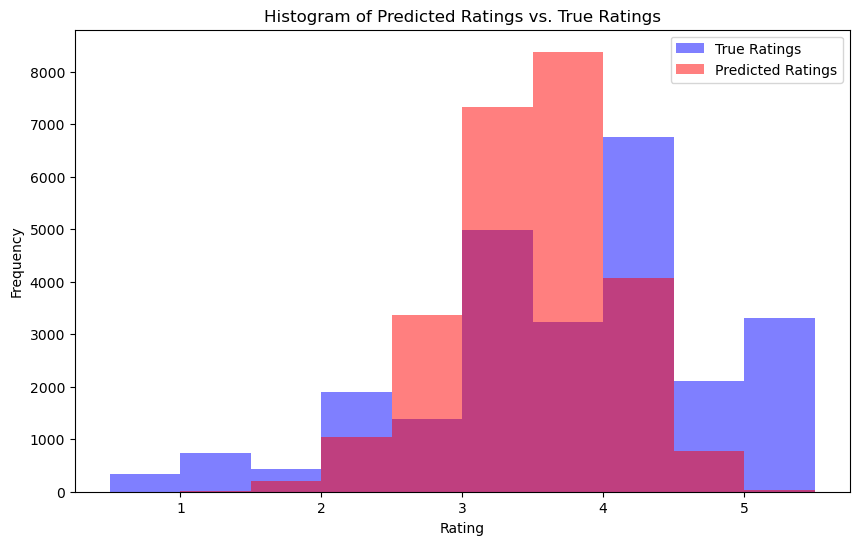

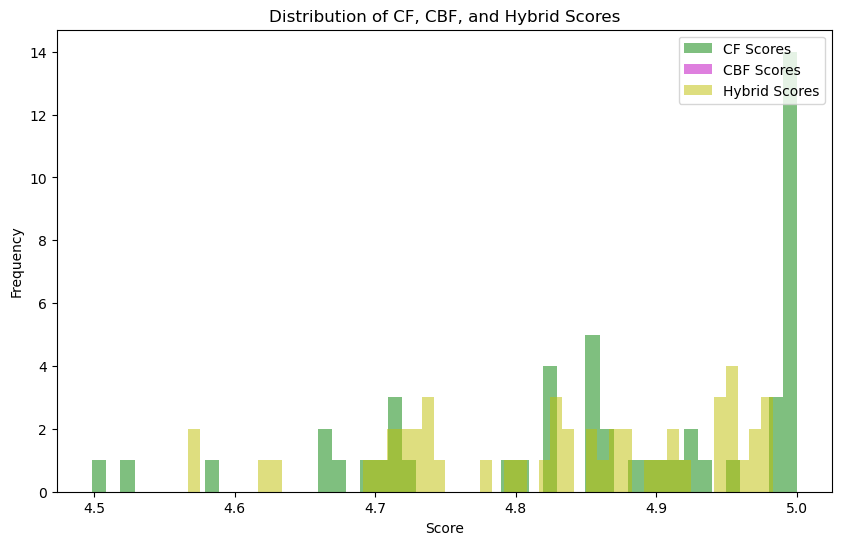

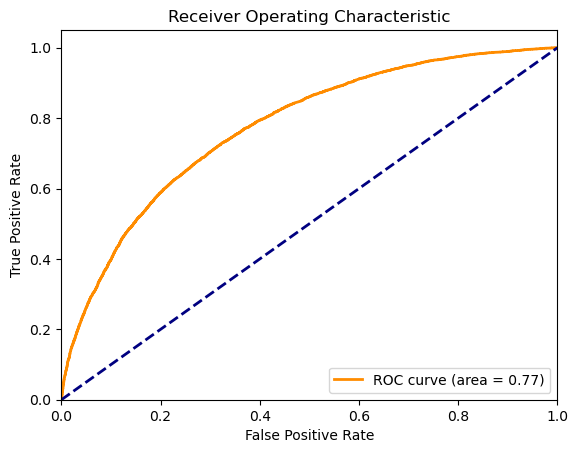

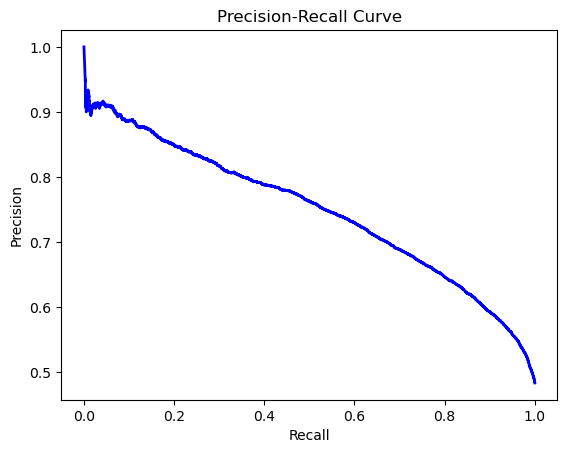

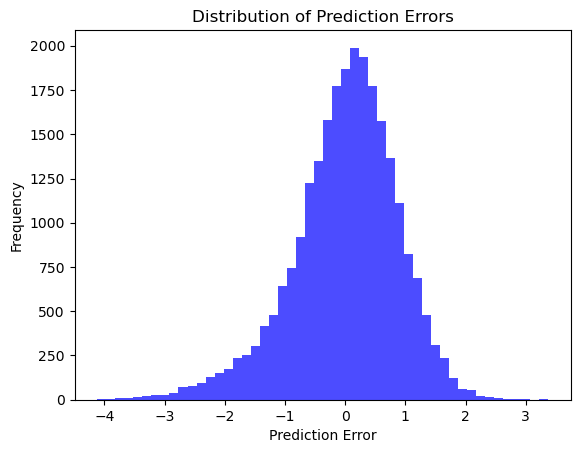

INFO:root:Generating recommendations for user 1.
INFO:root:Recommendations generated for user 1.
INFO:root:Generating recommendations for user 2.
INFO:root:Recommendations generated for user 2.
INFO:root:Generating recommendations for user 3.
INFO:root:Recommendations generated for user 3.
INFO:root:Generating recommendations for user 4.
INFO:root:Recommendations generated for user 4.
INFO:root:Generating recommendations for user 5.
INFO:root:Recommendations generated for user 5.
INFO:root:Generating recommendations for user 6.
INFO:root:Recommendations generated for user 6.
INFO:root:Generating recommendations for user 7.
INFO:root:Recommendations generated for user 7.
INFO:root:Generating recommendations for user 8.
INFO:root:Recommendations generated for user 8.
INFO:root:Generating recommendations for user 9.
INFO:root:Recommendations generated for user 9.
INFO:root:Generating recommendations for user 10.
INFO:root:Recommendations generated for user 10.
INFO:root:Generating recomme

KeyboardInterrupt: 

In [3]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 610  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.8
CBF_WEIGHT = 0.2
POPULARITY_PENALTY_WEIGHT = 0.7
DIVERSITY_PENALTY_WEIGHT = 0.7
TIME_DECAY_FACTOR = 0.9

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file):
    try:
        logging.info("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.info("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.info("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.info("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.info("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.info("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.info("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.info("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.info("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.info("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.info("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.info("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.info("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.info("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.info(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])

                # Ensure no zero vectors are used in cosine similarity calculation
                if np.linalg.norm(item_feature_vector) == 0 or np.linalg.norm(user_pref_vector) == 0:
                    content_score = 0
                else:
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0

                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        logging.info(f"Recommendations generated for user {user_id}.")
        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity if not np.isnan(similarity) else 0)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            if np.any(np.isnan(distances)):
                diversity_scores.append(0)
            else:
                diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    print(f"Catalog Coverage: {coverage:.2%}")
    print(f"Average Novelty: {novelty:.4f}")
    print(f"Personalization: {personalization:.4f}")
    print(f"Serendipity: {serendipity:.4f}")
    print(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    print(f"Hit Rate: {hit_rate:.4f}")
    print(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    print(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 6.0, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_score_distributions(cf_scores, cbf_scores, hybrid_scores):
    plt.figure(figsize=(10, 6))
    plt.hist(cf_scores, bins=50, alpha=0.5, label='CF Scores', color='g')
    plt.hist(cbf_scores, bins=50, alpha=0.5, label='CBF Scores', color='m')
    plt.hist(hybrid_scores, bins=50, alpha=0.5, label='Hybrid Scores', color='y')
    plt.xlabel('Score')
    plt.ylabel('Frequency')
    plt.title('Distribution of CF, CBF, and Hybrid Scores')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_at_k(metrics_at_k):
    ks = sorted(metrics_at_k.keys())
    metrics = metrics_at_k[ks[0]].keys()
    
    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.plot(ks, [metrics_at_k[k][metric] for k in ks], marker='o', label=metric)
        plt.xlabel('Number of Recommendations (k)')
        plt.ylabel(metric)
        plt.title(f'{metric} at Different Values of k')
        plt.legend()
        plt.show()

def main():
    logging.info("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is not None and ratings_df is not None:
        logging.info("Loaded data successfully, proceeding with user sampling.")
        ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
        logging.info("User sampling completed, proceeding with dataset merging.")
        merged_df = merge_datasets(ratings_df, movies_df)
        if merged_df is not None:
            logging.info("Datasets merged successfully, proceeding with genre processing.")
            merged_df = process_genres(merged_df)
            logging.info("Genres processed successfully, proceeding with time decay application.")
            merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
            logging.info("Time decay applied successfully, proceeding with collaborative filtering.")

            reader = Reader(rating_scale=(0.5, 5.0))
            data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
            trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

            param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
            gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
            gs.fit(data)

            best_params = gs.best_params['rmse']
            algo = SVD(**best_params)
            algo.fit(trainset)

            predictions = algo.test(testset)
            model_metrics = calculate_model_metrics(predictions)
            for metric, value in model_metrics.items():
                print(f"{metric}: {value:.4f}")

            logging.info("Model metrics calculated successfully, proceeding with feature extraction.")
            item_features = get_item_features(merged_df)
            user_preferences = derive_user_preferences(merged_df)
            item_popularity = calculate_item_popularity(ratings_df)
            global_popularity = calculate_item_popularity(ratings_df)
            diversity_counts = {}

            recommendations = {}
            cf_scores_all = []
            cbf_scores_all = []
            hybrid_scores_all = []
            for user_id in sorted(ratings_df['userId'].unique())[:10]:
                recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                movie_titles = movies_df.set_index('movieId').loc[[item[0] for item in recommendations[user_id]], 'title'].values
                recommendations_with_titles = [(item[0], item[1], title, item[2], item[3], item[4], item[5]) for item, title in zip(recommendations[user_id], movie_titles)]
                print(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}:")
                for rec in recommendations_with_titles:
                    print(f"Movie ID: {rec[0]}, Hybrid Score: {rec[1]:.2f}, Title: {rec[2]}, CF Score: {rec[3]:.2f}, CBF Score: {rec[4]:.2f}, Popularity Penalty: {rec[5]:.4f}, Diversity Penalty: {rec[6]:.4f}")
                    cf_scores_all.append(rec[3])
                    cbf_scores_all.append(rec[4])
                    hybrid_scores_all.append(rec[1])

            logging.info("Recommendations generated successfully, proceeding with metrics calculation.")
            expected_recommendations = get_expected_recommendations(merged_df)
            display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

            true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
            estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
            plot_histogram(true_ratings, estimated_ratings)

            plot_score_distributions(cf_scores_all, cbf_scores_all, hybrid_scores_all)

            y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
            y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

            plot_roc_curve(y_true, y_scores)
            plot_precision_recall_curve(y_true, y_scores)
            plot_error_distribution(true_ratings, estimated_ratings)

            # Calculate metrics at different values of k
            ks = range(1, 11)
            metrics_at_k = {}
            for k in ks:
                n_recommendations = k
                recommendations_k = {}
                for user_id in sorted(ratings_df['userId'].unique())[:10]:
                    recommendations_k[user_id] = generate_recommendations(algo, merged_df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
                rec_metrics = calculate_recommendation_metrics(recommendations_k, ratings_df)
                metrics_at_k[k] = rec_metrics

            plot_metrics_at_k(metrics_at_k)
        else:
            logging.error("Merged dataset is None. Exiting.")
    else:
        logging.error("Failed to load data. Exiting.")

if __name__ == "__main__":
    main()


In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import cosine

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 1.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.9
CBF_WEIGHT = 0.1
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.9

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file):
    try:
        logging.info("Loading movies and ratings data.")
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        logging.info("Data loaded successfully.")
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        logging.info("Sampling users.")
        unique_users = ratings_df['userId'].drop_duplicates()
        if user_sample_size is not None:
            actual_sample_size = min(user_sample_size, len(unique_users))
        else:
            actual_sample_size = len(unique_users)
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        sampled_ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        logging.info("User sampling completed.")
        return sampled_ratings_df
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        logging.info("Merging datasets.")
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        logging.info("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(merged_df):
    try:
        logging.info("Processing genres.")
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        logging.info("Genres processed successfully.")
        return merged_df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        logging.info("Applying time decay to ratings.")
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']

        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))

        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        logging.info("Time decay applied successfully.")
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        if 'release_year' not in df.columns:
            raise KeyError("release_year column is missing from the DataFrame.")
        
        logging.info("Extracting item features.")
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.info("Item features extracted successfully.")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        logging.info("Deriving user preferences.")
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        logging.info("User preferences derived successfully.")
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        logging.info(f"Generating recommendations for user {user_id}.")
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        user_prefs = user_preferences.get(user_id, {})
        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                item_feature_vector = np.array(list(item_features.get(item_id, {}).values()))
                user_pref_vector = np.array([user_prefs.get(f'user_mean_{genre}', 0) for genre in item_features[item_id].keys()])

                # Ensure no zero vectors are used in cosine similarity calculation
                if np.linalg.norm(item_feature_vector) == 0 or np.linalg.norm(user_pref_vector) == 0:
                    content_score = 0
                else:
                    similarity = 1 - cosine(user_pref_vector, item_feature_vector)
                    content_score = similarity if not np.isnan(similarity) else 0

                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def main():
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is None or ratings_df is None:
        logging.error("Failed to load data. Exiting.")
        return

    ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
    if ratings_df is None:
        logging.error("Failed to sample users. Exiting.")
        return

    merged_df = merge_datasets(ratings_df, movies_df)
    if merged_df is None:
        logging.error("Failed to merge datasets. Exiting.")
        return

    merged_df = process_genres(merged_df)
    if merged_df is None:
        logging.error("Failed to process genres. Exiting.")
        return

    merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
    if merged_df is None:
        logging.error("Failed to apply time decay. Exiting.")
        return

    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

    param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
    gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
    gs.fit(data)

    best_params = gs.best_params['rmse']
    logging.info(f"Best parameters: {best_params}")

    algo = SVD(**best_params)
    algo.fit(trainset)

    predictions = algo.test(testset)
    model_metrics = calculate_model_metrics(predictions)
    for metric, value in model_metrics.items():
        logging.info(f"{metric}: {value:.4f}")

    item_features = get_item_features(merged_df)
    user_preferences = derive_user_preferences(merged_df)
    item_popularity = calculate_item_popularity(ratings_df)
    global_popularity = calculate_item_popularity(ratings_df)
    diversity_counts = {}

    recommendations = {}
    for user_id in ratings_df['userId'].unique()[:10]:
        recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=True)
        logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

    expected_recommendations = get_expected_recommendations(merged_df)
    display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
    plot_histogram(true_ratings, estimated_ratings)

    y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
    y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

    plot_roc_curve(y_true, y_scores)
    plot_precision_recall_curve(y_true, y_scores)
    plot_error_distribution(true_ratings, estimated_ratings)

if __name__ == "__main__":
    main()


INFO:root:Loading movies and ratings data.
INFO:root:Data loaded successfully.
INFO:root:Sampling users.
INFO:root:User sampling completed.
INFO:root:Merging datasets.
INFO:root:Datasets merged successfully.
INFO:root:Processing genres.
INFO:root:Genres processed successfully.
INFO:root:Applying time decay to ratings.
INFO:root:Time decay applied successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8842
INFO:root:MAE: 0.6863
INFO:root:Precision: 0.8346
INFO:root:Recall: 0.1501
INFO:root:F1 Score: 0.2545
INFO:root:Extracting item features.
INFO:root:Item features extracted successfully.
INFO:root:Deriving user preferences.
INFO:root:User preferences derived successfully.
INFO:root:Generating recommendations for user 3.
INFO:root:User 3, Item 6: CF 3.39, CBF 5.00, Penalty 0.1667, Diversity 0.0000, Hybrid 3.47
INFO:root:User 3, Item 10: CF 3.09, CBF 5.00, Penalty 0.3000, Diversity 0.0000, Hybrid 3.13

In [ ]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error, mean_absolute_error
from scipy.spatial.distance import pdist, squareform

# Constants for metrics
RATING_THRESHOLD = 4.0

# Calculate coverage
def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

# Calculate novelty
def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

# Calculate personalization
def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

# Calculate serendipity
def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

# Calculate intra-list diversity
def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

# Calculate hit rate
def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

# Calculate mean reciprocal rank (MRR)
def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

# Calculate average precision (AP)
def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

# Display metrics
def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

# Main function
def main():
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is None or ratings_df is None:
        logging.error("Failed to load data. Exiting.")
        return

    ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
    if ratings_df is None:
        logging.error("Failed to sample users. Exiting.")
        return

    merged_df = merge_datasets(ratings_df, movies_df)
    if merged_df is None:
        logging.error("Failed to merge datasets. Exiting.")
        return

    merged_df = process_genres(merged_df)
    if merged_df is None:
        logging.error("Failed to process genres. Exiting.")
        return

    merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
    if merged_df is None:
        logging.error("Failed to apply time decay. Exiting.")
        return

    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

    param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
    gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
    gs.fit(data)

    best_params = gs.best_params['rmse']
    logging.info(f"Best parameters: {best_params}")

    algo = SVD(**best_params)
    algo.fit(trainset)

    predictions = algo.test(testset)
    model_metrics = calculate_model_metrics(predictions)
    for metric, value in model_metrics.items():
        logging.info(f"{metric}: {value:.4f}")

    item_features = get_item_features(merged_df)
    user_preferences = derive_user_preferences(merged_df)
    item_popularity = calculate_item_popularity(ratings_df)
    global_popularity = calculate_item_popularity(ratings_df)
    diversity_counts = {}

    recommendations = {}
    for user_id in ratings_df['userId'].unique()[:10]:
        recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=True)
        logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

    expected_recommendations = get_expected_recommendations(merged_df)
    display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
    plot_histogram(true_ratings, estimated_ratings)

    y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
    y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

    plot_roc_curve(y_true, y_scores)
    plot_precision_recall_curve(y_true, y_scores)
    plot_error_distribution(true_ratings, estimated_ratings)

if __name__ == "__main__":
    main()


INFO:root:Loading movies and ratings data.
INFO:root:Data loaded successfully.
INFO:root:Sampling users.
INFO:root:User sampling completed.
INFO:root:Merging datasets.
INFO:root:Datasets merged successfully.
INFO:root:Processing genres.
INFO:root:Genres processed successfully.
INFO:root:Applying time decay to ratings.
INFO:root:Time decay applied successfully.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8801
INFO:root:MAE: 0.6763
INFO:root:Precision: 0.8090
INFO:root:Recall: 0.3226
INFO:root:F1 Score: 0.4612
INFO:root:Extracting item features.
INFO:root:Item features extracted successfully.
INFO:root:Deriving user preferences.
INFO:root:User preferences derived successfully.
INFO:root:Generating recommendations for user 1.
INFO:root:User 1, Item 318: CF 5.00, CBF 5.00, Penalty 0.5197, Diversity 0.0000, Hybrid 4.64
INFO:root:User 1, Item 1704: CF 4.82, CBF 5.00, Penalty 0.2311, Diversity 0.0000, Hybrid 

In [ ]:
import numpy as np
import pandas as pd
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, squareform

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        return ratings_df[ratings_df['userId'].isin(sampled_users)]
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(df):
    try:
        genre_list = list(set(itertools.chain.from_iterable(df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            df[genre] = df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        return df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
        
        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
        
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.info(f"Item features extracted: {item_features.head()}")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)
                content_score = np.mean(list(item_features.get(item_id, {}).values()))
                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_over_k(k_values, metrics, metric_name):
    plt.figure()
    plt.plot(k_values, metrics, marker='o', label=metric_name)
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} at Different Values of k')
    plt.legend()
    plt.show()

def main():
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is None or ratings_df is None:
        logging.error("Failed to load data. Exiting.")
        return
    
    ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
    if ratings_df is None:
        logging.error("Failed to sample users. Exiting.")
        return
    
    merged_df = merge_datasets(ratings_df, movies_df)
    if merged_df is None:
        logging.error("Failed to merge datasets. Exiting.")
        return

    merged_df = process_genres(merged_df)
    if merged_df is None:
        logging.error("Failed to process genres. Exiting.")
        return

    merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
    if merged_df is None:
        logging.error("Failed to apply time decay. Exiting.")
        return

    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

    param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
    gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
    gs.fit(data)

    best_params = gs.best_params['rmse']
    logging.info(f"Best parameters: {best_params}")

    algo = SVD(**best_params)
    algo.fit(trainset)
    
    predictions = algo.test(testset)
    model_metrics = calculate_model_metrics(predictions)
    for metric, value in model_metrics.items():
        logging.info(f"{metric}: {value:.4f}")

    item_features = get_item_features(merged_df)
    user_preferences = derive_user_preferences(merged_df)
    item_popularity = calculate_item_popularity(ratings_df)
    global_popularity = calculate_item_popularity(ratings_df)
    diversity_counts = {}

    recommendations = {}
    for user_id in ratings_df['userId'].unique()[:10]:
        recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=True)
        logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

    expected_recommendations = get_expected_recommendations(merged_df)
    display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
    plot_histogram(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
    y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

    plot_roc_curve(y_true, y_scores)
    plot_precision_recall_curve(y_true, y_scores)
    plot_error_distribution(true_ratings, estimated_ratings)
    
    k_values = list(range(1, 11))
    rmse_values, mae_values, precision_values, recall_values, f1_values = [], [], [], [], []
    for k in k_values:
        recs = {user: generate_recommendations(algo, merged_df, user, k, item_features, user_preferences, item_popularity, global_popularity, diversity_counts) for user in ratings_df['userId'].unique()[:10]}
        metrics = calculate_recommendation_metrics(recs, ratings_df)
        rmse_values.append(metrics['RMSE'])
        mae_values.append(metrics['MAE'])
        precision_values.append(metrics['Precision'])
        recall_values.append(metrics['Recall'])
        f1_values.append(metrics['F1 Score'])
    
    plot_metrics_over_k(k_values, rmse_values, 'RMSE')
    plot_metrics_over_k(k_values, mae_values, 'MAE')
    plot_metrics_over_k(k_values, precision_values, 'Precision')
    plot_metrics_over_k(k_values, recall_values, 'Recall')
    plot_metrics_over_k(k_values, f1_values, 'F1 Score')

if __name__ == "__main__":
    main()


INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8842
INFO:root:MAE: 0.6863
INFO:root:Precision: 0.8346
INFO:root:Recall: 0.1501
INFO:root:F1 Score: 0.2545
INFO:root:Item features extracted:          release_year_bucket  release_year  Sci-Fi  Thriller  Film-Noir  \
movieId                                                                   
31                  0.153226        1995.0       0         0          0   
527                 0.150000        1993.0       0         0          0   
647                 0.154839        1996.0       0         0          0   
688                 0.153226        1995.0       0         0          0   
720                 0.154839        1996.0       0         0          0   

         Comedy  War  Horror  Fantasy  Musical  ...  Crime  IMAX  Documentary  \
movieId                                         ...                             
31            0    0       0        0    

In [7]:
import numpy as np
import pandas as pd
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist, squareform

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        return movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None

def sample_users(ratings_df, user_sample_size):
    try:
        unique_users = ratings_df['userId'].drop_duplicates()
        actual_sample_size = min(user_sample_size, len(unique_users))
        sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
        return ratings_df[ratings_df['userId'].isin(sampled_users)]
    except Exception as e:
        logging.error(f"Error sampling users: {e}")
        return None

def merge_datasets(ratings_df, movies_df):
    try:
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        return merged_df
    except Exception as e:
        logging.error(f"Error merging datasets: {e}")
        return None

def process_genres(df):
    try:
        genre_list = list(set(itertools.chain.from_iterable(df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            df[genre] = df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        return df
    except Exception as e:
        logging.error(f"Error processing genres: {e}")
        return None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    try:
        current_time = pd.to_datetime('now')
        ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
        ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
        ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
        
        min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
        if min_rating != max_rating:
            ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
        else:
            ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
        
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
        ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
        
        return ratings_df
    except Exception as e:
        logging.error(f"Error applying time decay: {e}")
        return None

def get_item_features(df):
    try:
        df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
        genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
        
        item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
        item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
        item_features = item_features.fillna(0)
        
        logging.info(f"Item features extracted: {item_features.head()}")
        item_features_dict = item_features.to_dict(orient='index')
        return item_features_dict
    except Exception as e:
        logging.error(f"Error extracting item features: {e}")
        return None

def derive_user_preferences(df):
    try:
        numeric_columns = df.select_dtypes(include=[np.number]).columns
        user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
        return user_genre_means.to_dict(orient='index')
    except Exception as e:
        logging.error(f"Error deriving user preferences: {e}")
        return None

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    try:
        user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
        all_items = df['movieId'].unique()
        recommendations = []

        cf_scores = []
        cbf_scores = []
        items_to_recommend = []

        for item_id in all_items:
            if item_id not in user_rated_items:
                pred = algo.predict(user_id, item_id)
                cf_scores.append(pred.est)

                # Calculate content score using user preferences and item features
                content_score = np.dot(
                    np.array(list(item_features.get(item_id, {}).values())),
                    np.array(list(user_preferences.get(user_id, {}).values()))
                )

                cbf_scores.append(content_score)
                items_to_recommend.append(item_id)

        # Normalize CF and CBF scores to the range [0.5, 5.0]
        normalized_cf_scores = normalize_scores(cf_scores)
        normalized_cbf_scores = normalize_scores(cbf_scores)

        for idx, item_id in enumerate(items_to_recommend):
            cf_score = normalized_cf_scores[idx]
            content_score = normalized_cbf_scores[idx]
            popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
            diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
            hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
            if verbose:
                logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
            recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

        recommendations.sort(key=lambda x: x[1], reverse=True)

        for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
            diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

        return recommendations[:n_recommendations]
    except Exception as e:
        logging.error(f"Error generating recommendations: {e}")
        return []

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_over_k(k_values, metrics, metric_name):
    plt.figure()
    plt.plot(k_values, metrics, marker='o', label=metric_name)
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} at Different Values of k')
    plt.legend()
    plt.show()

def main():
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is None or ratings_df is None:
        logging.error("Failed to load data. Exiting.")
        return
    
    ratings_df = sample_users(ratings_df, USER_SAMPLE_SIZE)
    if ratings_df is None:
        logging.error("Failed to sample users. Exiting.")
        return
    
    merged_df = merge_datasets(ratings_df, movies_df)
    if merged_df is None:
        logging.error("Failed to merge datasets. Exiting.")
        return

    merged_df = process_genres(merged_df)
    if merged_df is None:
        logging.error("Failed to process genres. Exiting.")
        return

    merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
    if merged_df is None:
        logging.error("Failed to apply time decay. Exiting.")
        return

    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)

    param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
    gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
    gs.fit(data)

    best_params = gs.best_params['rmse']
    logging.info(f"Best parameters: {best_params}")

    algo = SVD(**best_params)
    algo.fit(trainset)
    
    predictions = algo.test(testset)
    model_metrics = calculate_model_metrics(predictions)
    for metric, value in model_metrics.items():
        logging.info(f"{metric}: {value:.4f}")

    item_features = get_item_features(merged_df)
    user_preferences = derive_user_preferences(merged_df)
    item_popularity = calculate_item_popularity(ratings_df)
    global_popularity = calculate_item_popularity(ratings_df)
    diversity_counts = {}

    recommendations = {}
    for user_id in ratings_df['userId'].unique()[:10]:
        recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=True)
        logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

    expected_recommendations = get_expected_recommendations(merged_df)
    display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
    plot_histogram(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
    y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])

    plot_roc_curve(y_true, y_scores)
    plot_precision_recall_curve(y_true, y_scores)
    plot_error_distribution(true_ratings, estimated_ratings)
    
    k_values = list(range(1, 11))
    rmse_values, mae_values, precision_values, recall_values, f1_values = [], [], [], [], []
    for k in k_values:
        recs = {user: generate_recommendations(algo, merged_df, user, k, item_features, user_preferences, item_popularity, global_popularity, diversity_counts) for user in ratings_df['userId'].unique()[:10]}
        metrics = calculate_recommendation_metrics(recs, ratings_df)
        rmse_values.append(metrics['RMSE'])
        mae_values.append(metrics['MAE'])
        precision_values.append(metrics['Precision'])
        recall_values.append(metrics['Recall'])
        f1_values.append(metrics['F1 Score'])
    
    plot_metrics_over_k(k_values, rmse_values, 'RMSE')
    plot_metrics_over_k(k_values, mae_values, 'MAE')
    plot_metrics_over_k(k_values, precision_values, 'Precision')
    plot_metrics_over_k(k_values, recall_values, 'Recall')
    plot_metrics_over_k(k_values, f1_values, 'F1 Score')

if __name__ == "__main__":
    main()


INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8842
INFO:root:MAE: 0.6863
INFO:root:Precision: 0.8346
INFO:root:Recall: 0.1501
INFO:root:F1 Score: 0.2545
INFO:root:Item features extracted:          release_year_bucket  release_year  Sci-Fi  Thriller  Film-Noir  \
movieId                                                                   
31                  0.153226        1995.0       0         0          0   
527                 0.150000        1993.0       0         0          0   
647                 0.154839        1996.0       0         0          0   
688                 0.153226        1995.0       0         0          0   
720                 0.154839        1996.0       0         0          0   

         Comedy  War  Horror  Fantasy  Musical  ...  Crime  IMAX  Documentary  \
movieId                                         ...                             
31            0    0       0        0    

ZeroDivisionError: division by zero

In [2]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_over_k(k_values, metrics, metric_name):
    plt.figure()
    plt.plot(k_values, metrics, label=metric_name)
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} at Different Values of k')
    plt.legend()
    plt.show()

def main():
    logging.info("Starting main function.")
    movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if movies_df is None or ratings_df is None:
        logging.error("Failed to load data. Exiting.")
        return
    
    merged_df = apply_time_decay(movies_df, TIME_DECAY_FACTOR)
    
    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
    
    param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
    gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
    gs.fit(data)
    
    best_params = gs.best_params['rmse']
    logging.info(f"Best parameters: {best_params}")

    algo = SVD(**best_params)
    algo.fit(trainset)
    
    predictions = algo.test(testset)
    model_metrics = calculate_model_metrics(predictions)
    for metric, value in model_metrics.items():
        logging.info(f"{metric}: {value:.4f}")
    
    item_features = get_item_features(merged_df)
    user_preferences = derive_user_preferences(merged_df)
    item_popularity = calculate_item_popularity(ratings_df)
    global_popularity = calculate_item_popularity(ratings_df)
    diversity_counts = {}

    recommendations = {}
    for user_id in ratings_df['userId'].unique()[:10]:
        recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=True)
        logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

    expected_recommendations = get_expected_recommendations(merged_df)
    display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
    plot_histogram(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
    y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
    
    plot_roc_curve(y_true, y_scores)
    plot_precision_recall_curve(y_true, y_scores)
    plot_error_distribution(true_ratings, estimated_ratings)
    
    k_values = list(range(1, N_RECOMMENDATIONS + 1))
    rmse_values = []
    mae_values = []
    precision_values = []
    recall_values = []
    f1_values = []
    
    for k in k_values:
        top_k_recommendations = {user: recommendations[user][:k] for user in recommendations}
        metrics = calculate_recommendation_metrics(top_k_recommendations, ratings_df)
        rmse_values.append(metrics['RMSE'])
        mae_values.append(metrics['MAE'])
        precision_values.append(metrics['Precision'])
        recall_values.append(metrics['Recall'])
        f1_values.append(metrics['F1 Score'])
    
    plot_metrics_over_k(k_values, rmse_values, 'RMSE')
    plot_metrics_over_k(k_values, mae_values, 'MAE')
    plot_metrics_over_k(k_values, precision_values, 'Precision')
    plot_metrics_over_k(k_values, recall_values, 'Recall')
    plot_metrics_over_k(k_values, f1_values, 'F1 Score')

if __name__ == "__main__":
    main()


INFO:root:Starting main function.


ValueError: too many values to unpack (expected 2)

In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def get_item_features(df):
    if 'release_year' not in df.columns:
        raise KeyError("release_year column is missing from the DataFrame.")
    
    df['release_year_bucket'] = df['release_year'].apply(lambda x: get_weighted_release_year(x, YEAR_DIVISOR))
    genre_columns = [col for col in df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year_bucket', 'time_weighted_rating', 'timestamp', 'time_diff', 'time_weight']]
    
    item_features = df[['movieId', 'release_year_bucket'] + genre_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    item_features_dict = item_features.to_dict(orient='index')
    return item_features_dict

def derive_user_preferences(df):
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    user_genre_means = df.groupby('userId')[numeric_columns].mean().add_prefix('user_mean_')
    return user_genre_means.to_dict(orient='index')

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            content_score = np.mean(list(item_features.get(item_id, {}).values()))
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.get(user, {})
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.get(item_id, {})
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [list(item_features[item[0]].values()) for item in items if item[0] in item_features]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_over_k(k_values, metrics, metric_name):
    plt.figure()
    plt.plot(k_values, metrics, label=metric_name)
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} at Different Values of k')
    plt.legend()
    plt.show()

def main():
    logging.info("Starting main function.")
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if merged_df is None or movies_df is None or ratings_df is None:
        logging.error("Failed to load data. Exiting.")
        return
    
    merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
    
    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
    
    param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
    gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
    gs.fit(data)
    
    best_params = gs.best_params['rmse']
    logging.info(f"Best parameters: {best_params}")

    algo = SVD(**best_params)
    algo.fit(trainset)
    
    predictions = algo.test(testset)
    model_metrics = calculate_model_metrics(predictions)
    for metric, value in model_metrics.items():
        logging.info(f"{metric}: {value:.4f}")
    
    item_features = get_item_features(merged_df)
    user_preferences = derive_user_preferences(merged_df)
    item_popularity = calculate_item_popularity(ratings_df)
    global_popularity = calculate_item_popularity(ratings_df)
    diversity_counts = {}

    recommendations = {}
    for user_id in ratings_df['userId'].unique()[:10]:
        recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=True)
        logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

    expected_recommendations = get_expected_recommendations(merged_df)
    display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
    plot_histogram(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
    y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
    
    plot_roc_curve(y_true, y_scores)
    plot_precision_recall_curve(y_true, y_scores)
    plot_error_distribution(true_ratings, estimated_ratings)
    
    k_values = list(range(1, N_RECOMMENDATIONS + 1))
    rmse_values = []
    mae_values = []
    precision_values = []
    recall_values = []
    f1_values = []
    
    for k in k_values:
        top_k_recommendations = {user: recommendations[user][:k] for user in recommendations}
        metrics = calculate_recommendation_metrics(top_k_recommendations, ratings_df)
        rmse_values.append(metrics['RMSE'])
        mae_values.append(metrics['MAE'])
        precision_values.append(metrics['Precision'])
        recall_values.append(metrics['Recall'])
        f1_values.append(metrics['F1 Score'])
    
    plot_metrics_over_k(k_values, rmse_values, 'RMSE')
    plot_metrics_over_k(k_values, mae_values, 'MAE')
    plot_metrics_over_k(k_values, precision_values, 'Precision')
    plot_metrics_over_k(k_values, recall_values, 'Recall')
    plot_metrics_over_k(k_values, f1_values, 'F1 Score')

if __name__ == "__main__":
    main()


INFO:root:Starting main function.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8786
INFO:root:MAE: 0.6755
INFO:root:Precision: 0.8069
INFO:root:Recall: 0.3228
INFO:root:F1 Score: 0.4611
INFO:root:Item features extracted:          release_year_bucket  release_year  Sci-Fi  Children  Drama  Musical  \
movieId                                                                        
1                   0.153226        1995.0       0         1      0        0   
3                   0.153226        1995.0       0         0      0        0   
6                   0.153226        1995.0       0         0      0        0   
47                  0.153226        1995.0       0         0      0        0   
50                  0.153226        1995.0       0         0      0        0   

         Film-Noir  Fantasy  Western  Adventure  ...  Comedy  IMAX  Animation  \
movieId                                          ... 

In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist
from sklearn.preprocessing import StandardScaler

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def standardize_features(df, feature_columns):
    scaler = StandardScaler()
    df[feature_columns] = scaler.fit_transform(df[feature_columns])
    return df

def get_item_features(df, feature_columns):
    item_features = df[['movieId'] + feature_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    return item_features

def derive_user_preferences(df, feature_columns):
    user_genre_means = df.groupby('userId')[feature_columns].mean().add_prefix('user_mean_')
    user_genre_means = user_genre_means.fillna(0)
    return user_genre_means

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            item_feature_vector = item_features.loc[item_id].values
            user_preference_vector = user_preferences.loc[user_id].values
            
            if len(item_feature_vector) != len(user_preference_vector):
                logging.error(f"Feature length mismatch for item {item_id}: {len(item_feature_vector)} vs. {len(user_preference_vector)}")
                continue

            content_score = np.dot(item_feature_vector, user_preference_vector)
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    logging.info(f"Feature lengths for user {user_id}: item_feature_vector length: {len(item_feature_vector)}, user_preference_vector length: {len(user_preference_vector)}")

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.loc[user].to_dict()
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.loc[item_id].to_dict()
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [item_features.loc[item[0]].values for item in items if item[0] in item_features.index]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_over_k(k_values, metrics, metric_name):
    plt.figure()
    plt.plot(k_values, metrics, label=metric_name)
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} at Different Values of k')
    plt.legend()
    plt.show()

def main():
    logging.info("Starting main function.")
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if merged_df is None or movies_df is None or ratings_df is None:
        logging.error("Failed to load data. Exiting.")
        return
    
    merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
    
    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
    
    param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
    gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
    gs.fit(data)
    
    best_params = gs.best_params['rmse']
    logging.info(f"Best parameters: {best_params}")

    algo = SVD(**best_params)
    algo.fit(trainset)
    
    predictions = algo.test(testset)
    model_metrics = calculate_model_metrics(predictions)
    for metric, value in model_metrics.items():
        logging.info(f"{metric}: {value:.4f}")
    
    genre_columns = [col for col in merged_df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year', 'timestamp', 'time_diff', 'time_weight', 'time_weighted_rating']]
    
    merged_df = standardize_features(merged_df, genre_columns)
    
    item_features = get_item_features(merged_df, genre_columns)
    user_preferences = derive_user_preferences(merged_df, genre_columns)
    item_popularity = calculate_item_popularity(ratings_df)
    global_popularity = calculate_item_popularity(ratings_df)
    diversity_counts = {}

    recommendations = {}
    for user_id in ratings_df['userId'].unique()[:10]:
        recommendations[user_id] = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=True)
        logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

    expected_recommendations = get_expected_recommendations(merged_df)
    display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
    plot_histogram(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
    y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
    
    plot_roc_curve(y_true, y_scores)
    plot_precision_recall_curve(y_true, y_scores)
    plot_error_distribution(true_ratings, estimated_ratings)
    
    k_values = list(range(1, N_RECOMMENDATIONS + 1))
    rmse_values = []
    mae_values = []
    precision_values = []
    recall_values = []
    f1_values = []
    
    for k in k_values:
        top_k_recommendations = {user: recommendations[user][:k] for user in recommendations}
        metrics = calculate_recommendation_metrics(top_k_recommendations, ratings_df)
        rmse_values.append(metrics['RMSE'])
        mae_values.append(metrics['MAE'])
        precision_values.append(metrics['Precision'])
        recall_values.append(metrics['Recall'])
        f1_values.append(metrics['F1 Score'])
    
    plot_metrics_over_k(k_values, rmse_values, 'RMSE')
    plot_metrics_over_k(k_values, mae_values, 'MAE')
    plot_metrics_over_k(k_values, precision_values, 'Precision')
    plot_metrics_over_k(k_values, recall_values, 'Recall')
    plot_metrics_over_k(k_values, f1_values, 'F1 Score')

if __name__ == "__main__":
    main()


INFO:root:Starting main function.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8786
INFO:root:MAE: 0.6755
INFO:root:Precision: 0.8069
INFO:root:Recall: 0.3228
INFO:root:F1 Score: 0.4611
INFO:root:Item features extracted:               War      IMAX    Sci-Fi  Animation  Adventure  Documentary  \
movieId                                                                    
1       -0.225004 -0.207047 -0.454173   3.664680   1.781433     -0.11062   
3       -0.225004 -0.207047 -0.454173  -0.272875  -0.561346     -0.11062   
6       -0.225004 -0.207047 -0.454173  -0.272875  -0.561346     -0.11062   
47      -0.225004 -0.207047 -0.454173  -0.272875  -0.561346     -0.11062   
50      -0.225004 -0.207047 -0.454173  -0.272875  -0.561346     -0.11062   

            Crime   Fantasy    Action   Western    Horror    Comedy  Thriller  \
movieId                                                                         


In [ ]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist
from sklearn.preprocessing import StandardScaler

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def standardize_features(df, feature_columns):
    scaler = StandardScaler()
    df[feature_columns] = scaler.fit_transform(df[feature_columns])
    return df

def get_item_features(df, feature_columns):
    item_features = df[['movieId'] + feature_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    return item_features

def derive_user_preferences(df, feature_columns):
    user_genre_means = df.groupby('userId')[feature_columns].mean().add_prefix('user_mean_')
    user_genre_means = user_genre_means.fillna(0)
    return user_genre_means

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            item_feature_vector = item_features.loc[item_id].values
            user_preference_vector = user_preferences.loc[user_id].values
            
            if len(item_feature_vector) != len(user_preference_vector):
                logging.error(f"Feature length mismatch for item {item_id}: {len(item_feature_vector)} vs. {len(user_preference_vector)}")
                continue

            content_score = np.dot(item_feature_vector, user_preference_vector)
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    logging.info(f"Feature lengths for user {user_id}: item_feature_vector length: {len(item_feature_vector)}, user_preference_vector length: {len(user_preference_vector)}")

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.info(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.loc[user].to_dict()
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.loc[item_id].to_dict()
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [item_features.loc[item[0]].values for item in items if item[0] in item_features.index]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_over_k(k_values, metrics, metric_name):
    plt.figure()
    plt.plot(k_values, metrics, label=metric_name)
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} at Different Values of k')
    plt.legend()
    plt.show()

def plot_cbf_distribution(cbf_scores):
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=50, alpha=0.75, color='g')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Distribution of CBF Scores')
    plt.show()

def main():
    logging.info("Starting main function.")
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if merged_df is None or movies_df is None or ratings_df is None:
        logging.error("Failed to load data. Exiting.")
        return
    
    merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
    
    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
    
    param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
    gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
    gs.fit(data)
    
    best_params = gs.best_params['rmse']
    logging.info(f"Best parameters: {best_params}")

    algo = SVD(**best_params)
    algo.fit(trainset)
    
    predictions = algo.test(testset)
    model_metrics = calculate_model_metrics(predictions)
    for metric, value in model_metrics.items():
        logging.info(f"{metric}: {value:.4f}")
    
    genre_columns = [col for col in merged_df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year', 'timestamp', 'time_diff', 'time_weight', 'time_weighted_rating']]
    
    merged_df = standardize_features(merged_df, genre_columns)
    
    item_features = get_item_features(merged_df, genre_columns)
    user_preferences = derive_user_preferences(merged_df, genre_columns)
    item_popularity = calculate_item_popularity(ratings_df)
    global_popularity = calculate_item_popularity(ratings_df)
    diversity_counts = {}

    recommendations = {}
    all_cbf_scores = []
    for user_id in ratings_df['userId'].unique()[:10]:
        recs = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=True)
        recommendations[user_id] = recs
        all_cbf_scores.extend([rec[3] for rec in recs])  # Collect all CBF scores for plotting
        logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}: {recommendations[user_id]}")

    expected_recommendations = get_expected_recommendations(merged_df)
    display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
    plot_histogram(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
    y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
    
    plot_roc_curve(y_true, y_scores)
    plot_precision_recall_curve(y_true, y_scores)
    plot_error_distribution(true_ratings, estimated_ratings)
    plot_cbf_distribution(all_cbf_scores)
    
    k_values = list(range(1, N_RECOMMENDATIONS + 1))
    rmse_values = []
    mae_values = []
    precision_values = []
    recall_values = []
    f1_values = []
    
    for k in k_values:
        top_k_recommendations = {user: recommendations[user][:k] for user in recommendations}
        metrics = calculate_recommendation_metrics(top_k_recommendations, ratings_df)
        rmse_values.append(metrics['RMSE'])
        mae_values.append(metrics['MAE'])
        precision_values.append(metrics['Precision'])
        recall_values.append(metrics['Recall'])
        f1_values.append(metrics['F1 Score'])
    
    plot_metrics_over_k(k_values, rmse_values, 'RMSE')
    plot_metrics_over_k(k_values, mae_values, 'MAE')
    plot_metrics_over_k(k_values, precision_values, 'Precision')
    plot_metrics_over_k(k_values, recall_values, 'Recall')
    plot_metrics_over_k(k_values, f1_values, 'F1 Score')

if __name__ == "__main__":
    main()


INFO:root:Starting main function.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8786
INFO:root:MAE: 0.6755
INFO:root:Precision: 0.8069
INFO:root:Recall: 0.3228
INFO:root:F1 Score: 0.4611
INFO:root:Item features extracted:            Action   Fantasy      IMAX     Crime  Documentary    Sci-Fi  \
movieId                                                                  
1       -0.660598  2.742421 -0.207047 -0.445216     -0.11062 -0.454173   
3       -0.660598 -0.364641 -0.207047 -0.445216     -0.11062 -0.454173   
6        1.513780 -0.364641 -0.207047  2.246099     -0.11062 -0.454173   
47      -0.660598 -0.364641 -0.207047 -0.445216     -0.11062 -0.454173   
50      -0.660598 -0.364641 -0.207047  2.246099     -0.11062 -0.454173   

              War   Western  Animation    Horror   Musical   Romance  \
movieId                                                                
1       -0.225004 -0.139691   3.

# THE BELOW CODE SOLVES THE ISSUE WITH CBF BEING CALCULATED INCORRECTLY I THE RANGE OF 4.90 TO 4.99

INFO:root:Starting main function.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8786
INFO:root:MAE: 0.6755
INFO:root:Precision: 0.8069
INFO:root:Recall: 0.3228
INFO:root:F1 Score: 0.4611
INFO:root:Item features extracted:             Drama    Action   Western    Horror   Romance  (no genres listed)  \
movieId                                                                         
1       -0.843655 -0.660598 -0.139691 -0.279179 -0.468104                 0.0   
3       -0.843655 -0.660598 -0.139691 -0.279179  2.136275                 0.0   
6       -0.843655  1.513780 -0.139691 -0.279179 -0.468104                 0.0   
47      -0.843655 -0.660598 -0.139691 -0.279179 -0.468104                 0.0   
50      -0.843655 -0.660598 -0.139691 -0.279179 -0.468104                 0.0   

          Musical     Crime  Film-Noir  Adventure    Sci-Fi  Documentary  \
movieId                                            

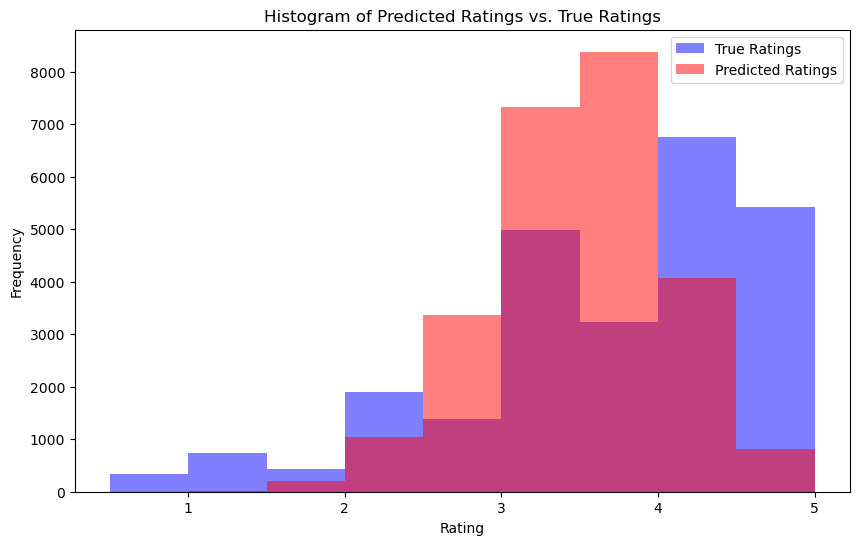

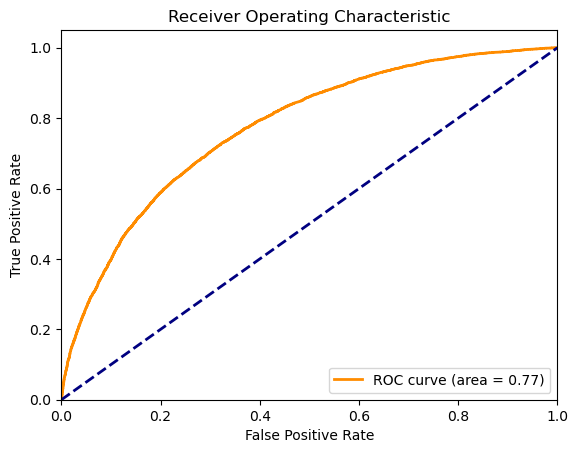

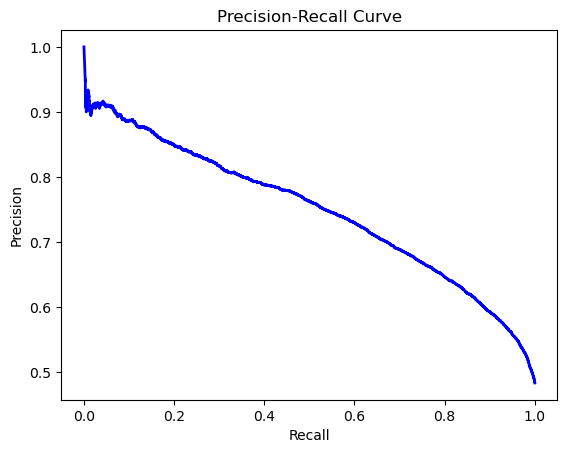

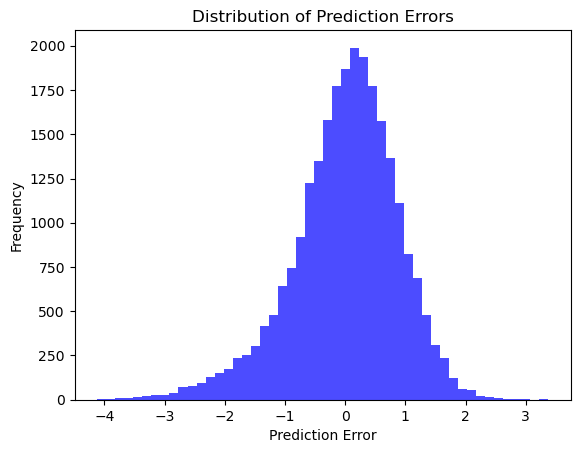

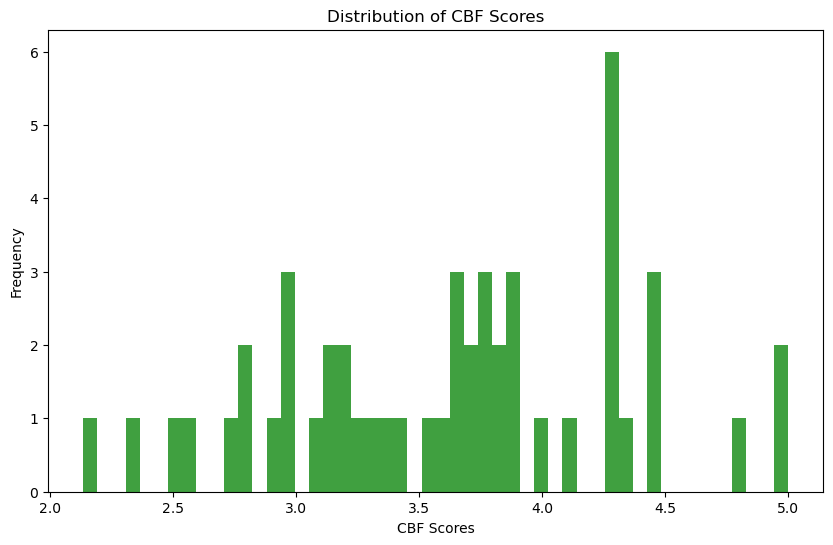

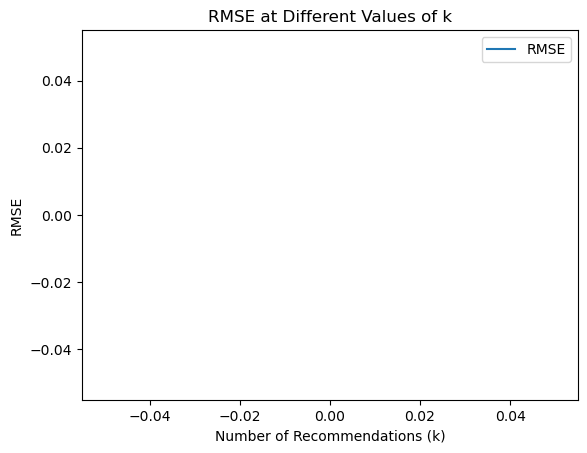

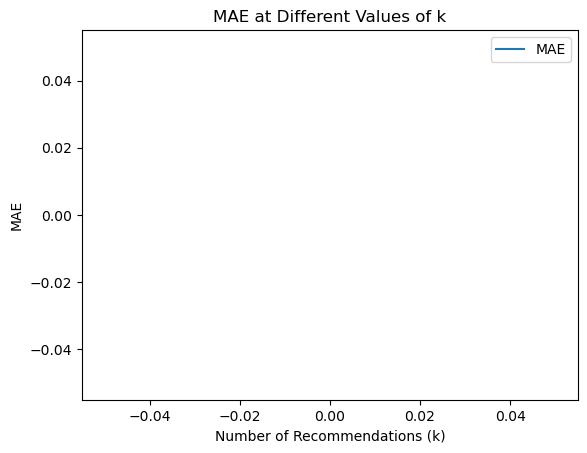

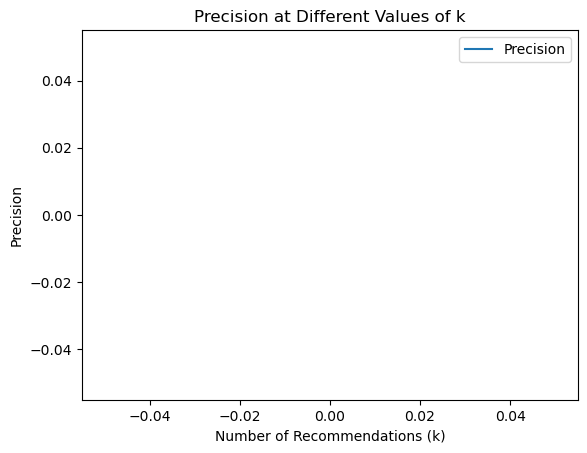

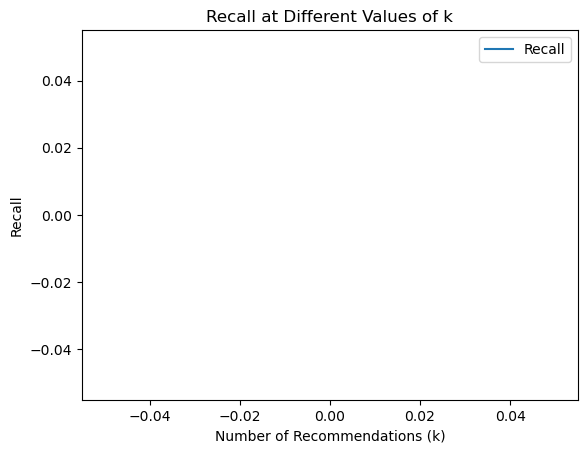

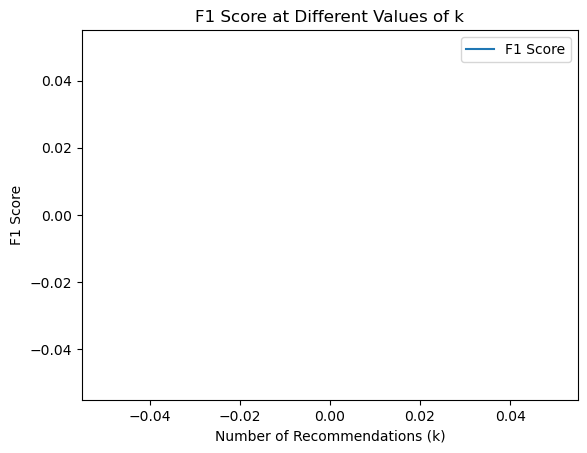

In [2]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist
from sklearn.preprocessing import StandardScaler

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30  # Reduced sample size

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.9
TIME_DECAY_FACTOR = 0.9

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def standardize_features(df, feature_columns):
    scaler = StandardScaler()
    df[feature_columns] = scaler.fit_transform(df[feature_columns])
    return df

def get_item_features(df, feature_columns):
    item_features = df[['movieId'] + feature_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    return item_features

def derive_user_preferences(df, feature_columns):
    user_genre_means = df.groupby('userId')[feature_columns].mean().add_prefix('user_mean_')
    user_genre_means = user_genre_means.fillna(0)
    return user_genre_means

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            item_feature_vector = item_features.loc[item_id].values
            user_preference_vector = user_preferences.loc[user_id].values
            
            if len(item_feature_vector) != len(user_preference_vector):
                logging.error(f"Feature length mismatch for item {item_id}: {len(item_feature_vector)} vs. {len(user_preference_vector)}")
                continue

            content_score = np.dot(item_feature_vector, user_preference_vector)
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.loc[user].to_dict()
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.loc[item_id].to_dict()
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [item_features.loc[item[0]].values for item in items if item[0] in item_features.index]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_over_k(k_values, metrics, metric_name):
    plt.figure()
    plt.plot(k_values, metrics, label=metric_name)
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} at Different Values of k')
    plt.legend()
    plt.show()

def plot_cbf_distribution(cbf_scores):
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=50, alpha=0.75, color='g')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Distribution of CBF Scores')
    plt.show()

def main():
    logging.info("Starting main function.")
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if merged_df is None or movies_df is None or ratings_df is None:
        logging.error("Failed to load data. Exiting.")
        return
    
    merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
    
    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
    
    param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
    gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
    gs.fit(data)
    
    best_params = gs.best_params['rmse']
    logging.info(f"Best parameters: {best_params}")

    algo = SVD(**best_params)
    algo.fit(trainset)
    
    predictions = algo.test(testset)
    model_metrics = calculate_model_metrics(predictions)
    for metric, value in model_metrics.items():
        logging.info(f"{metric}: {value:.4f}")
    
    genre_columns = [col for col in merged_df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year', 'timestamp', 'time_diff', 'time_weight', 'time_weighted_rating']]
    
    merged_df = standardize_features(merged_df, genre_columns)
    
    item_features = get_item_features(merged_df, genre_columns)
    user_preferences = derive_user_preferences(merged_df, genre_columns)
    item_popularity = calculate_item_popularity(ratings_df)
    global_popularity = calculate_item_popularity(ratings_df)
    diversity_counts = {}

    recommendations = {}
    all_cbf_scores = []
    for user_id in ratings_df['userId'].unique()[:10]:
        recs = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
        recommendations[user_id] = recs
        all_cbf_scores.extend([rec[3] for rec in recs])  # Collect all CBF scores for plotting
        logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}")

    expected_recommendations = get_expected_recommendations(merged_df)
    display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
    plot_histogram(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
    y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
    
    plot_roc_curve(y_true, y_scores)
    plot_precision_recall_curve(y_true, y_scores)
    plot_error_distribution(true_ratings, estimated_ratings)
    plot_cbf_distribution(all_cbf_scores)
    
    k_values = list(range(1, N_RECOMMENDATIONS + 1))
    rmse_values = []
    mae_values = []
    precision_values = []
    recall_values = []
    f1_values = []
    
    for k in k_values:
        top_k_recommendations = {user: recommendations[user][:k] for user in recommendations}
        metrics = calculate_recommendation_metrics(top_k_recommendations, ratings_df)
        rmse_values.append(metrics['RMSE'])
        mae_values.append(metrics['MAE'])
        precision_values.append(metrics['Precision'])
        recall_values.append(metrics['Recall'])
        f1_values.append(metrics['F1 Score'])
    
    plot_metrics_over_k(k_values, rmse_values, 'RMSE')
    plot_metrics_over_k(k_values, mae_values, 'MAE')
    plot_metrics_over_k(k_values, precision_values, 'Precision')
    plot_metrics_over_k(k_values, recall_values, 'Recall')
    plot_metrics_over_k(k_values, f1_values, 'F1 Score')

if __name__ == "__main__":
    main()


INFO:root:Starting main function.
INFO:root:Best parameters: {'n_factors': 50, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.02, 'biased': True}
INFO:root:RMSE: 0.8786
INFO:root:MAE: 0.6755
INFO:root:Precision: 0.8069
INFO:root:Recall: 0.3228
INFO:root:F1 Score: 0.4611
INFO:root:Item features extracted:          Thriller    Action   Fantasy  Film-Noir   Romance    Comedy  \
movieId                                                                
1       -0.596334 -0.660598  2.742421   -0.09329 -0.468104  1.257788   
3       -0.596334 -0.660598 -0.364641   -0.09329  2.136275  1.257788   
6        1.676913  1.513780 -0.364641   -0.09329 -0.468104 -0.795047   
47       1.676913 -0.660598 -0.364641   -0.09329 -0.468104 -0.795047   
50       1.676913 -0.660598 -0.364641   -0.09329 -0.468104 -0.795047   

              War  Adventure  Children     Crime   Mystery     Drama  \
movieId                                                                
1       -0.225004   1.781433  3.154507 -0.4452

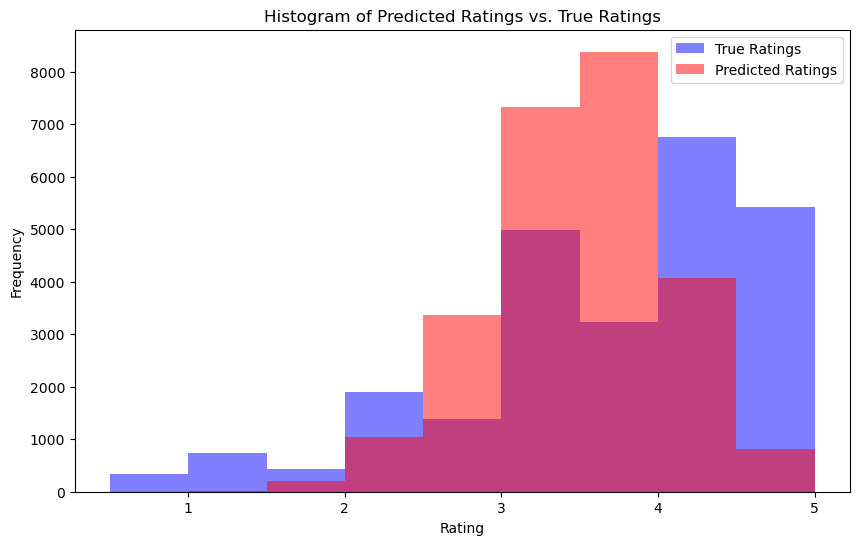

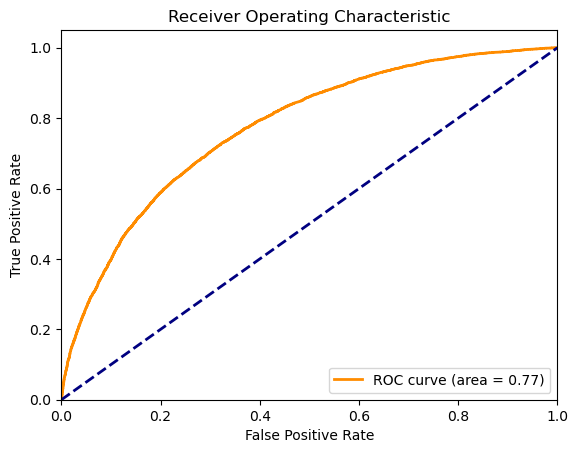

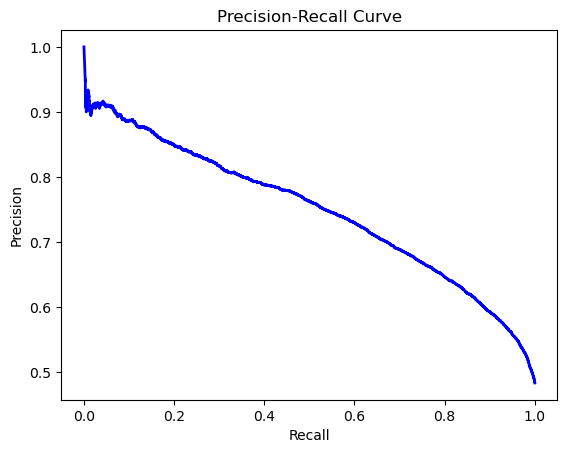

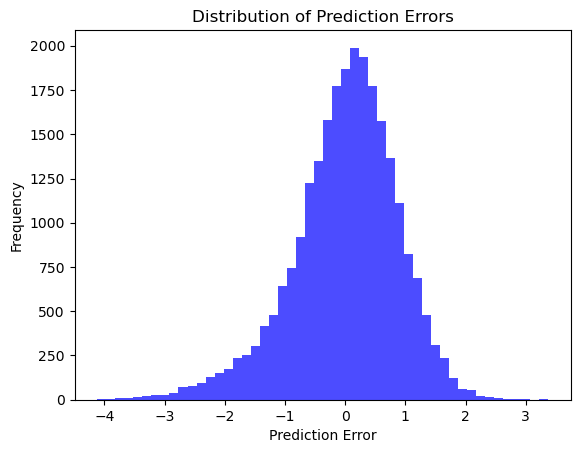

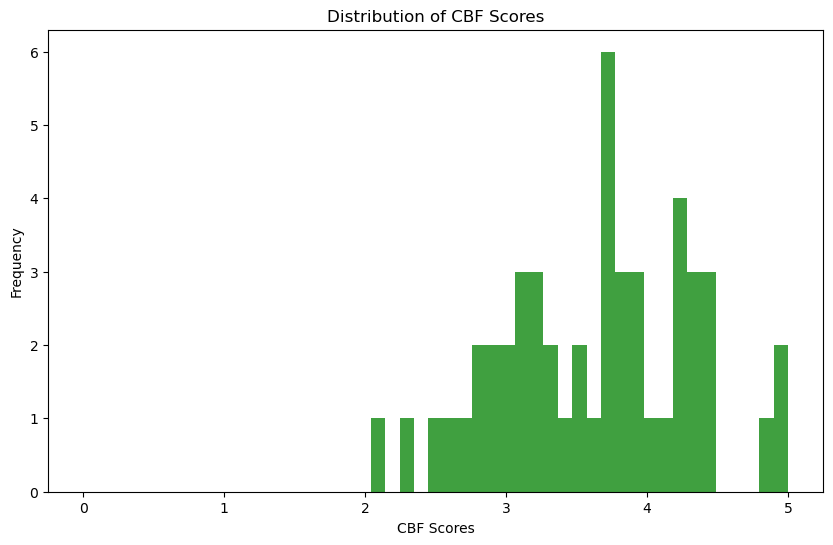

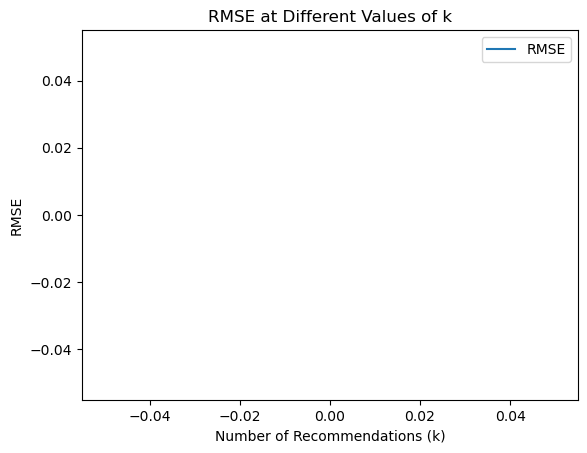

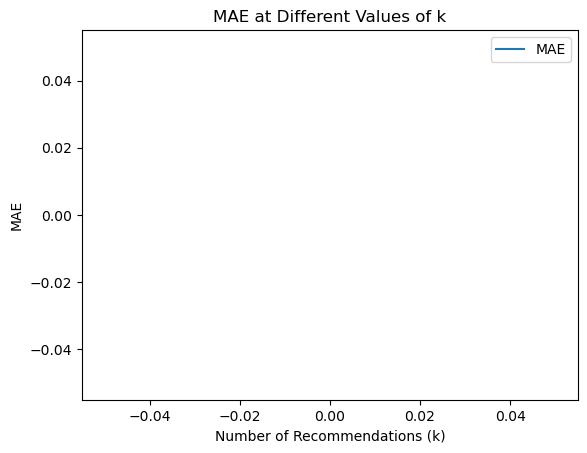

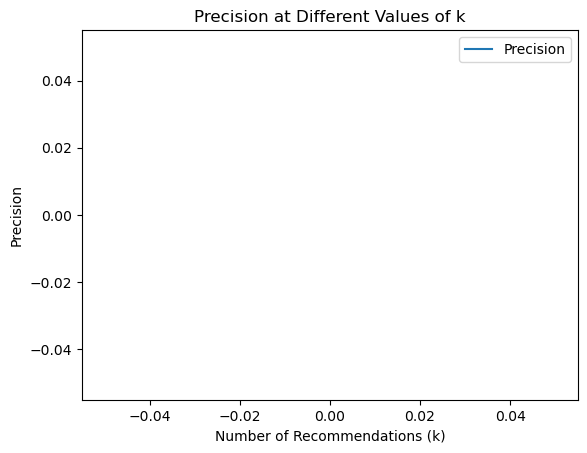

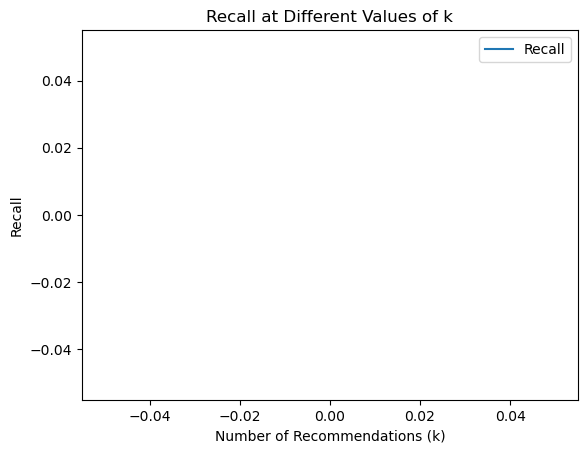

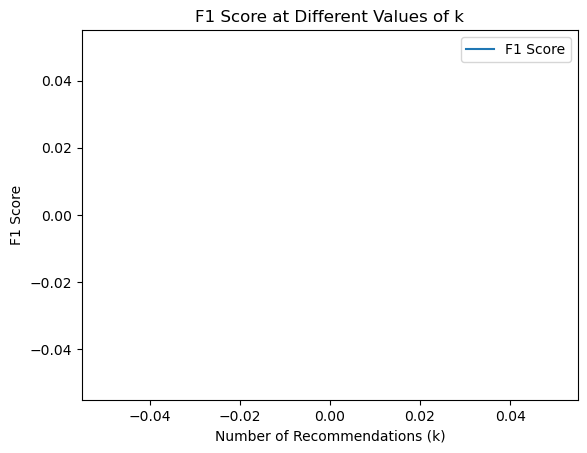

In [1]:
import pandas as pd
import numpy as np
import itertools
import logging
import re
import matplotlib.pyplot as plt
from surprise import Dataset, Reader, SVD
from surprise.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve
from scipy.spatial.distance import pdist
from sklearn.preprocessing import StandardScaler

# Constants
MOVIES_FILE = '../data/movies.csv'
RATINGS_FILE = '../data/ratings.csv'
N_RECOMMENDATIONS = 5
YEAR_DIVISOR = 5.0
RATING_THRESHOLD = 4.0
RANDOM_SEED = 42
USER_SAMPLE_SIZE = 30

# Weights for hybrid scoring
CF_WEIGHT = 0.7
CBF_WEIGHT = 0.3
POPULARITY_PENALTY_WEIGHT = 0.5
DIVERSITY_PENALTY_WEIGHT = 0.5
TIME_DECAY_FACTOR = 0.5

# Set random seeds for reproducibility
np.random.seed(RANDOM_SEED)

# Logging configuration
logging.basicConfig(level=logging.INFO)

def load_data(movies_file, ratings_file, user_sample_size=None):
    try:
        movies_df = pd.read_csv(movies_file)
        ratings_df = pd.read_csv(ratings_file)
        ratings_df['timestamp'] = pd.to_datetime(ratings_df['timestamp'], unit='s')
        
        if user_sample_size:
            unique_users = ratings_df['userId'].drop_duplicates()
            actual_sample_size = min(user_sample_size, len(unique_users))
            sampled_users = unique_users.sample(n=actual_sample_size, random_state=RANDOM_SEED)
            ratings_df = ratings_df[ratings_df['userId'].isin(sampled_users)]
        
        merged_df = pd.merge(ratings_df, movies_df, on='movieId')
        if 'release_year' not in merged_df.columns:
            merged_df['release_year'] = merged_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)
        
        genre_list = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
        for genre in genre_list:
            genre_pattern = re.escape(genre)
            merged_df[genre] = merged_df['genres'].str.contains(r'\b' + genre_pattern + r'\b').astype(int)
        
        return merged_df, movies_df, ratings_df
    except Exception as e:
        logging.error(f"Error loading data: {e}")
        return None, None, None

def get_weighted_release_year(year, divisor):
    min_year = 1900
    max_year = 2024
    normalized_year = (year - min_year) / (max_year - min_year)
    return normalized_year / divisor

def apply_time_decay(ratings_df, decay_factor):
    current_time = pd.to_datetime('now')
    ratings_df['time_diff'] = (current_time - ratings_df['timestamp']).dt.total_seconds() / (3600 * 24)
    ratings_df['time_weight'] = decay_factor ** (ratings_df['time_diff'] / 365)
    ratings_df['time_weighted_rating'] = ratings_df['rating'] * ratings_df['time_weight']
    
    min_rating, max_rating = ratings_df['time_weighted_rating'].min(), ratings_df['time_weighted_rating'].max()
    if min_rating != max_rating:
        ratings_df['time_weighted_rating'] = 5.0 * (ratings_df['time_weighted_rating'] - min_rating) / (max_rating - min_rating)
    else:
        ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].apply(lambda x: 5.0 * (x - min_rating) / (max_rating - min_rating))
    
    ratings_df['time_weighted_rating'] = ratings_df['time_weighted_rating'].clip(0.5, 5.0)
    ratings_df['time_weighted_rating'] = (ratings_df['time_weighted_rating'] * 2).round() / 2
    
    return ratings_df

def standardize_features(df, feature_columns):
    scaler = StandardScaler()
    df[feature_columns] = scaler.fit_transform(df[feature_columns])
    return df

def get_item_features(df, feature_columns):
    item_features = df[['movieId'] + feature_columns].drop_duplicates().set_index('movieId')
    item_features = item_features.loc[~item_features.index.duplicated(keep='first')]
    item_features = item_features.fillna(0)
    
    logging.info(f"Item features extracted: {item_features.head()}")
    return item_features

def derive_user_preferences(df, feature_columns):
    user_genre_means = df.groupby('userId')[feature_columns].mean().add_prefix('user_mean_')
    user_genre_means = user_genre_means.fillna(0)
    return user_genre_means

def normalize_scores(scores):
    scores = np.array(scores)
    min_score = np.nanmin(scores)
    max_score = np.nanmax(scores)
    if max_score != min_score:
        normalized_scores = 5.0 * (scores - min_score) / (max_score - min_score)
    else:
        normalized_scores = scores
    return normalized_scores.clip(0.5, 5.0)

def generate_recommendations(algo, df, user_id, n_recommendations, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False):
    user_rated_items = df[df['userId'] == user_id]['movieId'].tolist()
    all_items = df['movieId'].unique()
    recommendations = []

    cf_scores = []
    cbf_scores = []
    items_to_recommend = []

    for item_id in all_items:
        if item_id not in user_rated_items:
            pred = algo.predict(user_id, item_id)
            cf_scores.append(pred.est)
            item_feature_vector = item_features.loc[item_id].values
            user_preference_vector = user_preferences.loc[user_id].values
            
            if len(item_feature_vector) != len(user_preference_vector):
                logging.error(f"Feature length mismatch for item {item_id}: {len(item_feature_vector)} vs. {len(user_preference_vector)}")
                continue

            content_score = np.dot(item_feature_vector, user_preference_vector)
            cbf_scores.append(content_score)
            items_to_recommend.append(item_id)

    normalized_cf_scores = normalize_scores(cf_scores)
    normalized_cbf_scores = normalize_scores(cbf_scores)

    for idx, item_id in enumerate(items_to_recommend):
        cf_score = normalized_cf_scores[idx]
        content_score = normalized_cbf_scores[idx]
        popularity_penalty = item_popularity.get(item_id, 0) / len(df['userId'].unique())
        diversity_penalty = diversity_counts.get(item_id, 0) / len(df['userId'].unique())
        hybrid_score = (CF_WEIGHT * cf_score + CBF_WEIGHT * content_score) - (POPULARITY_PENALTY_WEIGHT * popularity_penalty) - (DIVERSITY_PENALTY_WEIGHT * diversity_penalty)
        if verbose:
            logging.debug(f"User {user_id}, Item {item_id}: CF {cf_score:.2f}, CBF {content_score:.2f}, Penalty {popularity_penalty:.4f}, Diversity {diversity_penalty:.4f}, Hybrid {hybrid_score:.2f}")
        recommendations.append((item_id, hybrid_score, cf_score, content_score, popularity_penalty, diversity_penalty))

    recommendations.sort(key=lambda x: x[1], reverse=True)

    for item_id, _, _, _, _, _ in recommendations[:n_recommendations]:
        diversity_counts[item_id] = diversity_counts.get(item_id, 0) + 1

    return recommendations[:n_recommendations]

def calculate_item_popularity(df):
    return df['movieId'].value_counts().to_dict()

def get_expected_recommendations(df):
    return df[df['rating'] >= RATING_THRESHOLD]['movieId'].unique()

def calculate_model_metrics(predictions):
    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]

    rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
    mae = mean_absolute_error(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if true_r >= RATING_THRESHOLD else 0 for true_r in true_ratings])
    y_pred = np.array([1 if est >= RATING_THRESHOLD else 0 for est in estimated_ratings])
    
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_recommendation_metrics(recommendations, df):
    y_true = []
    y_pred = []

    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user][['movieId', 'rating']]
        for item_id, predicted_rating, _, _, _, _ in items:
            actual_rating = user_rated_items[user_rated_items['movieId'] == item_id]['rating'].values
            if len(actual_rating) > 0:
                y_true.append(actual_rating[0])
                y_pred.append(predicted_rating)

    if not y_true or not y_pred:
        logging.warning("No matching ratings found for recommended items.")
        return {
            'RMSE': float('nan'),
            'MAE': float('nan'),
            'Precision': float('nan'),
            'Recall': float('nan'),
            'F1 Score': float('nan')
        }

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    precision = precision_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    recall = recall_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)
    f1 = f1_score([1 if y >= RATING_THRESHOLD else 0 for y in y_true], [1 if y >= RATING_THRESHOLD else 0 for y in y_pred], zero_division=0)

    return {
        'RMSE': rmse,
        'MAE': mae,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }

def calculate_hit_rate(recommendations, df, n_recommendations):
    hits = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        hits += len(set(item_id for item_id, _, _, _, _, _ in items).intersection(set(user_rated_items)))
    return hits / (len(recommendations) * n_recommendations)

def calculate_mrr(recommendations, df):
    rr_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in user_rated_items:
                rr_sum += 1 / rank
                break
    return rr_sum / len(recommendations)

def calculate_ap(recommendations, df):
    ap_sum = 0
    for user, items in recommendations.items():
        user_rated_items = df[df['userId'] == user]['movieId'].tolist()
        relevant_items = set(user_rated_items)
        hits = 0
        precision_sum = 0
        for rank, (item, _, _, _, _, _) in enumerate(items, start=1):
            if item in relevant_items:
                hits += 1
                precision_sum += hits / rank
        ap_sum += precision_sum / min(len(relevant_items), len(items))
    return ap_sum / len(recommendations)

def calculate_coverage(recommendations, catalog_size):
    recommended_items = set()
    for user, items in recommendations.items():
        recommended_items.update([item_id for item_id, _, _, _, _, _ in items])
    return len(recommended_items) / catalog_size

def calculate_novelty(recommendations, item_popularity):
    novelty_scores = []
    for user, items in recommendations.items():
        for item_id, _, _, _, _, _ in items:
            novelty_scores.append(item_popularity.get(item_id, 0))
    return np.mean(novelty_scores)

def calculate_personalization(recommendations):
    user_pairs = list(itertools.combinations(recommendations.keys(), 2))
    similarity_sum = 0
    for user1, user2 in user_pairs:
        items1 = {item_id for item_id, _, _, _, _, _ in recommendations[user1]}
        items2 = {item_id for item_id, _, _, _, _, _ in recommendations[user2]}
        similarity_sum += len(items1 & items2) / len(items1 | items2)
    return 1 - (similarity_sum / len(user_pairs))

def calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features):
    serendipity_scores = []
    for user, items in recommendations.items():
        user_prefs = user_preferences.loc[user].to_dict()
        for item_id, _, _, _, _, _ in items:
            if item_id not in expected_recommendations:
                item_genres = item_features.loc[item_id].to_dict()
                similarity = sum(user_prefs.get(f"user_mean_{genre}", 0) * item_genres.get(genre, 0) for genre in item_genres)
                serendipity_scores.append(1 - similarity)
    return np.mean(serendipity_scores) if serendipity_scores else 0

def calculate_intra_list_similarity(recommendations, item_features):
    diversity_scores = []
    for user, items in recommendations.items():
        features = [item_features.loc[item[0]].values for item in items if item[0] in item_features.index]
        if len(features) > 1:
            distances = pdist(features, 'cosine')
            diversity_scores.append(1 - np.mean(distances))
    return np.mean(diversity_scores) if diversity_scores else 0

def display_metrics(recommendations, catalog_size, item_popularity, expected_recommendations, user_preferences, item_features, df, n_recommendations):
    coverage = calculate_coverage(recommendations, catalog_size)
    novelty = calculate_novelty(recommendations, item_popularity)
    personalization = calculate_personalization(recommendations)
    serendipity = calculate_serendipity(recommendations, expected_recommendations, user_preferences, item_features)
    intra_list_diversity = calculate_intra_list_similarity(recommendations, item_features)
    hit_rate = calculate_hit_rate(recommendations, df, n_recommendations)
    mrr = calculate_mrr(recommendations, df)
    ap = calculate_ap(recommendations, df)

    logging.info(f"Catalog Coverage: {coverage:.2%}")
    logging.info(f"Average Novelty: {novelty:.4f}")
    logging.info(f"Personalization: {personalization:.4f}")
    logging.info(f"Serendipity: {serendipity:.4f}")
    logging.info(f"Intra-list Diversity: {intra_list_diversity:.4f}")
    logging.info(f"Hit Rate: {hit_rate:.4f}")
    logging.info(f"Mean Reciprocal Rank (MRR): {mrr:.4f}")
    logging.info(f"Average Precision (AP): {ap:.4f}")

def plot_histogram(true_ratings, estimated_ratings):
    plt.figure(figsize=(10, 6))
    plt.hist(true_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='True Ratings', color='b')
    plt.hist(estimated_ratings, bins=np.arange(0.5, 5.5, 0.5), alpha=0.5, label='Predicted Ratings', color='r')
    plt.xlabel('Rating')
    plt.ylabel('Frequency')
    plt.title('Histogram of Predicted Ratings vs. True Ratings')
    plt.legend(loc='upper right')
    plt.show()

def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

def plot_precision_recall_curve(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    plt.figure()
    plt.plot(recall, precision, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

def plot_error_distribution(true_ratings, estimated_ratings):
    errors = np.array(true_ratings) - np.array(estimated_ratings)
    plt.figure()
    plt.hist(errors, bins=50, color='blue', alpha=0.7)
    plt.xlabel('Prediction Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()

def plot_metrics_over_k(k_values, metrics, metric_name):
    plt.figure()
    plt.plot(k_values, metrics, label=metric_name)
    plt.xlabel('Number of Recommendations (k)')
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} at Different Values of k')
    plt.legend()
    plt.show()

def plot_cbf_distribution(cbf_scores):
    plt.figure(figsize=(10, 6))
    plt.hist(cbf_scores, bins=np.linspace(0.0, 5.0, 50), alpha=0.75, color='g')
    plt.xlabel('CBF Scores')
    plt.ylabel('Frequency')
    plt.title('Distribution of CBF Scores')
    plt.show()

def main():
    logging.info("Starting main function.")
    merged_df, movies_df, ratings_df = load_data(MOVIES_FILE, RATINGS_FILE)
    if merged_df is None or movies_df is None or ratings_df is None:
        logging.error("Failed to load data. Exiting.")
        return
    
    merged_df = apply_time_decay(merged_df, TIME_DECAY_FACTOR)
    
    reader = Reader(rating_scale=(0.5, 5.0))
    data = Dataset.load_from_df(ratings_df[['userId', 'movieId', 'rating']], reader)
    trainset, testset = train_test_split(data, test_size=0.25, random_state=RANDOM_SEED)
    
    param_grid = {'n_factors': [50], 'n_epochs': [20], 'lr_all': [0.005], 'reg_all': [0.02], 'biased': [True]}
    gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=3)
    gs.fit(data)
    
    best_params = gs.best_params['rmse']
    logging.info(f"Best parameters: {best_params}")

    algo = SVD(**best_params)
    algo.fit(trainset)
    
    predictions = algo.test(testset)
    model_metrics = calculate_model_metrics(predictions)
    for metric, value in model_metrics.items():
        logging.info(f"{metric}: {value:.4f}")
    
    genre_columns = [col for col in merged_df.columns if col not in ['userId', 'movieId', 'rating', 'title', 'genres', 'release_year', 'timestamp', 'time_diff', 'time_weight', 'time_weighted_rating']]
    
    merged_df = standardize_features(merged_df, genre_columns)
    
    item_features = get_item_features(merged_df, genre_columns)
    user_preferences = derive_user_preferences(merged_df, genre_columns)
    item_popularity = calculate_item_popularity(ratings_df)
    global_popularity = calculate_item_popularity(ratings_df)
    diversity_counts = {}

    recommendations = {}
    all_cbf_scores = []
    for user_id in ratings_df['userId'].unique()[:10]:
        recs = generate_recommendations(algo, merged_df, user_id, N_RECOMMENDATIONS, item_features, user_preferences, item_popularity, global_popularity, diversity_counts, verbose=False)
        recommendations[user_id] = recs
        all_cbf_scores.extend([rec[3] for rec in recs])  # Collect all CBF scores for plotting
        logging.info(f"Top {N_RECOMMENDATIONS} recommendations for User {user_id}")

    expected_recommendations = get_expected_recommendations(merged_df)
    display_metrics(recommendations, len(movies_df), item_popularity, expected_recommendations, user_preferences, item_features, ratings_df, N_RECOMMENDATIONS)

    true_ratings = [pred.r_ui for pred in predictions if pred.r_ui >= 0.5]
    estimated_ratings = [pred.est for pred in predictions if pred.r_ui >= 0.5]
    plot_histogram(true_ratings, estimated_ratings)
    
    y_true = np.array([1 if rating >= RATING_THRESHOLD else 0 for rating in true_ratings])
    y_scores = np.array([pred.est for pred in predictions if pred.r_ui >= 0.5])
    
    plot_roc_curve(y_true, y_scores)
    plot_precision_recall_curve(y_true, y_scores)
    plot_error_distribution(true_ratings, estimated_ratings)
    plot_cbf_distribution(all_cbf_scores)
    
    k_values = list(range(1, N_RECOMMENDATIONS + 1))
    rmse_values = []
    mae_values = []
    precision_values = []
    recall_values = []
    f1_values = []
    
    for k in k_values:
        top_k_recommendations = {user: recommendations[user][:k] for user in recommendations}
        metrics = calculate_recommendation_metrics(top_k_recommendations, ratings_df)
        rmse_values.append(metrics['RMSE'])
        mae_values.append(metrics['MAE'])
        precision_values.append(metrics['Precision'])
        recall_values.append(metrics['Recall'])
        f1_values.append(metrics['F1 Score'])
    
    plot_metrics_over_k(k_values, rmse_values, 'RMSE')
    plot_metrics_over_k(k_values, mae_values, 'MAE')
    plot_metrics_over_k(k_values, precision_values, 'Precision')
    plot_metrics_over_k(k_values, recall_values, 'Recall')
    plot_metrics_over_k(k_values, f1_values, 'F1 Score')

if __name__ == "__main__":
    main()


# NEW - STARTED NEW SESSION IN CODE: PYTHON

# END

In [ ]:
def recommend_for_profile(algo, merged_df, movies_df, item_features, item_popularity):
    """Prompt the user for a movie profile and generate recommendations."""
    print("Please enter the details of your preferred movie profile.")
    
    # Get genres from the user
    genres = []
    available_genres = list(set(itertools.chain.from_iterable(merged_df['genres'].str.split('|'))))
    for genre in available_genres:
        include = input(f"Do you like {genre} movies? (yes/no): ").strip().lower()
        if include == 'yes':
            genres.append(genre)
    
    # Get release year from the user
    release_year = float(input("Enter the preferred release year (e.g., 2000): "))
    weighted_release_year = get_weighted_release_year(release_year, YEAR_DIVISOR)
    
    # Create a profile vector
    profile_vector = [weighted_release_year] + [1 if genre in genres else 0 for genre in available_genres]
    
    # Calculate content scores for all items
    content_scores = []
    for item_id in item_features.keys():
        item_vector = list(item_features[item_id].values())
        similarity = np.dot(profile_vector, item_vector) / (np.linalg.norm(profile_vector) * np.linalg.norm(item_vector))
        content_scores.append((item_id, similarity))
    
    # Normalize content scores
    content_scores = sorted(content_scores, key=lambda x: x[1], reverse=True)
    content_scores = content_scores[:N_RECOMMENDATIONS]
    
    # Print recommendations
    print("\nRecommended movies based on your profile:")
    for item_id, score in content_scores:
        title = movies_df[movies_df['movieId'] == item_id]['title'].values[0]
        print(f"{title}: {score:.2f}")

# Example usage (run this after the main function):
recommend_for_profile(algo, merged_df, movies_df, item_features, item_popularity)


Please enter the details of your preferred movie profile.


Explanation of Key Functions:

- load_data: Loads and merges the movie and rating datasets, extracting the release year if necessary.
- get_weighted_release_year: Computes the weighted release year by dividing the year by a divisor.
- get_item_features: Extracts item features from the DataFrame, ensuring the release year is included.
- derive_user_preferences: Calculates mean ratings for each genre and release year for each user, focusing only on numeric columns.
- generate_recommendations: Generates top N recommendations for a given user, excluding already rated items.
- calculate_item_popularity: Computes how often each item is recommended across all users.
- get_expected_recommendations: Identifies items that are expected to be recommended based on high ratings.
- calculate_model_metrics: Computes RMSE, MAE, precision, recall, and F1 score to evaluate the model.
- calculate_coverage: Determines the percentage of items in the catalog that have been recommended.
- calculate_novelty: Calculates the average popularity of recommended items.
- calculate_personalization: Measures how different the recommendations are for different users.
- calculate_serendipity: Evaluates the serendipity of the recommendations.
- calculate_intra_list_similarity: Assesses the diversity within a single user's list of recommendations.
- display_metrics: Displays various metrics to evaluate the recommendations.

In [ ]:
#------------------------------------------------------------------------------------------------------

In [ ]:
import pandas as pd
import numpy as np
import logging
import re
from collections import defaultdict
from surprise import SVD, Dataset, Reader
from surprise.model_selection import train_test_split
from surprise.accuracy import rmse, mae
from sklearn.metrics import mean_squared_error, mean_absolute_error, precision_score, recall_score, f1_score
import random
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
import seaborn as sns

# Use ggplto style for graphs
plt.style.use('ggplot')
sns.set_palette('colorblind')

# Set a random seed for reproducibility
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

# Setup logging
logging.basicConfig(level=logging.INFO)



# Your function definitions here...

#if __name__ == "__main__":
#    main()


## Section 2: Compute and Plot Metrics at Different Values of K


In [ ]:
def compute_metrics_for_top_k(predictions, k_values):
    metrics = {
        'k': [],
        'precision': [],
        'recall': [],
        'f1': [],
        'rmse': [],
        'mae': []
    }
    
    for k in k_values:
        top_k_preds = defaultdict(list)
        for uid, _, true_r, est, _ in predictions:
            top_k_preds[uid].append((est, true_r))
        
        for uid in top_k_preds:
            top_k_preds[uid].sort(reverse=True, key=lambda x: x[0])
            top_k_preds[uid] = top_k_preds[uid][:k]
        
        flat_preds = [pred for sublist in top_k_preds.values() for pred in sublist]
        estimated_ratings = [pred[0] for pred in flat_preds]
        true_ratings = [pred[1] for pred in flat_preds]
        
        rmse = np.sqrt(mean_squared_error(true_ratings, estimated_ratings))
        mae = mean_absolute_error(true_ratings, estimated_ratings)
        y_true = [1 if r >= THRESHOLD else 0 for r in true_ratings]
        y_pred = [1 if r >= THRESHOLD else 0 for r in estimated_ratings]
        precision = precision_score(y_true, y_pred, zero_division=0)
        recall = recall_score(y_true, y_pred, zero_division=0)
        f1 = f1_score(y_true, y_pred, zero_division=0)
        
        metrics['k'].append(k)
        metrics['precision'].append(precision)
        metrics['recall'].append(recall)
        metrics['f1'].append(f1)
        metrics['rmse'].append(rmse)
        metrics['mae'].append(mae)
    
    return metrics

def plot_metrics(metrics):
    plt.figure(figsize=(12, 8))
    
    plt.subplot(3, 2, 1)
    plt.plot(metrics['k'], metrics['precision'], marker='o', linestyle='-')
    plt.title('Precision at top k')
    plt.xlabel('k')
    plt.ylabel('Precision')
    
    plt.subplot(3, 2, 2)
    plt.plot(metrics['k'], metrics['recall'], marker='o', linestyle='-')
    plt.title('Recall at top k')
    plt.xlabel('k')
    plt.ylabel('Recall')
    
    plt.subplot(3, 2, 3)
    plt.plot(metrics['k'], metrics['f1'], marker='o', linestyle='-')
    plt.title('F1-Score at top k')
    plt.xlabel('k')
    plt.ylabel('F1 Score')
    
    plt.subplot(3, 2, 4)
    plt.plot(metrics['k'], metrics['rmse'], marker='o', linestyle='-')
    plt.title('RMSE at top k')
    plt.xlabel('k')
    plt.ylabel('RMSE')
    
    plt.subplot(3, 2, 5)
    plt.plot(metrics['k'], metrics['mae'], marker='o', linestyle='-')
    plt.title('MAE at top k')
    plt.xlabel('k')
    plt.ylabel('MAE')
    
    plt.tight_layout()
    plt.show()




## Section 3: Print Single Evaluation Metrics - Evaluation against Industry Avereges



Typical Accuracy Levels:

- General Accuracy: It's challenging to state a specific "average accuracy" because it depends highly on the context and the specific system configuration. However, good movie recommendation systems generally achieve:
    - RMSE: Values around 0.8 to 1.2 for rating predictions, with lower values indicating better accuracy.
    - Precision/Recall: Precision and recall can vary, but good systems might achieve over 20-30% precision in top-N recommendations in practical settings.
    - High-Performance Systems: In competitions like the Netflix Prize, the winning entries achieved RMSEs around 0.85, considered very high accuracy in a real-world system.

In [ ]:
'''

# Ranges for industry standards (min and max)
industry_ranges = {
    'RMSE': (0.85, 0.95),       # Min and max RMSE in industry
    'MAE': (0.70, 0.75),         # Min and max MAE in industry
    'Precision': (0.70, 0.80),  # Min and max precision in industry
    'Recall': (0.10, 0.40),     # Min and max recall in industry
    'F1 Score': (0.30, 0.50),   # Min and max F1 score in industry
}

metrics = list(model_metrics.keys())
x = np.arange(len(metrics))  # label locations
bar_width = 0.35  # width of the bars

fig, ax = plt.subplots(figsize=(10, 6))

# Plotting bars for model metrics
ax.bar(x, [model_metrics[metric] for metric in metrics], width=bar_width, color='lightblue', label='Model Metrics')

# Calculate means and error margins for industry standards
industry_means = [(industry_ranges[metric][0] + industry_ranges[metric][1]) / 2 for metric in metrics]
industry_errors = [(industry_ranges[metric][1] - industry_ranges[metric][0]) / 2 for metric in metrics]

# Adding error bars to indicate the range of industry standards
ax.errorbar(x + bar_width / 2, industry_means, yerr=industry_errors, fmt='o', color='red', capsize=5, label='Industry Range')

# Adding labels, title, and custom x-axis tick labels
ax.set_ylabel('Values')
ax.set_title('Model Metrics vs Industry Ranges')
ax.set_xticks(x + bar_width / 2)
ax.set_xticklabels(metrics)
ax.set_ylim(0, 1)  # Setting the y-limit to encompass typical ranges for these metrics
ax.legend()

plt.tight_layout()
plt.show()



# After all the evaluations and plots, print the single run evaluation metrics
model_metrics = compute_model_metrics(predictions)
print("Single Evaluation Metrics:")
print(model_metrics)

'''


## Additional Metrics